### **Important Note:**
The initial name chosen for the model was `TreeSpline`, but it was later changed to `MTS(Multivariate Tree-Based Spline)` to avoid confusion with the `SplineTree` package (which uses a totally different approach). The code uses the old name for compatibility reasons.


### Helper Functions for Visualization

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.datasets import fetch_california_housing, load_diabetes
from sklearn.preprocessing import MinMaxScaler

from pygam import LinearGAM, s
import scipy.sparse

import time

In [5]:
def mean_ci(data, confidence=0.95):
   data = np.array(data)
   mean = np.mean(data)
   sd = stats.sem(data)
   h = sd * stats.t.ppf((1 + confidence) / 2.0, len(data) - 1)
   return mean, h

def compute_ci_stats(mse_data):
   means, cis = [], []
   for mses in mse_data:
      mean, ci = mean_ci(mses)
      means.append(mean)
      cis.append(ci)
   return np.array(means), np.array(cis)

In [6]:
scipy.sparse.csr_matrix.A = property(lambda self: self.toarray())

## Definition of Baseline Models

### MARS Implementation (based on py-earth and Friedman's original implementation)

In [52]:
from dataclasses import dataclass
from typing import List, Optional, Tuple

In [ ]:
def _ols_fit(X: np.ndarray, y: np.ndarray) -> Tuple[np.ndarray, float]:
    beta, *_ = np.linalg.lstsq(X, y, rcond=None)
    r = y - X @ beta
    return beta, float(r.T @ r)


def _gcv(rss: float, n: int, M: int, penalty: float) -> float:
    # M includes intercept
    C = M + penalty * (M - 1) / 2.0
    denom = 1.0 - C / n
    if denom <= 1e-12:
        return np.inf
    return rss / (n * denom * denom)


def _corr_abs(a: np.ndarray, b: np.ndarray) -> float:
    aa = a - a.mean()
    bb = b - b.mean()
    da = float(np.sqrt(aa @ aa))
    db = float(np.sqrt(bb @ bb))
    if da < 1e-12 or db < 1e-12:
        return 1.0
    return float(abs((aa @ bb) / (da * db)))


@dataclass(frozen=True)
class _Term:
    parent: Optional[int]          # None for intercept
    var: int                       # feature index
    knot: float                    # knot for hinge
    kind: str                      # "intercept" | "linear" | "hinge+" | "hinge-"

    def degree(self, terms: List["_Term"]) -> int:
        if self.parent is None:
            return 0
        return 1 + terms[self.parent].degree(terms)


class Earth:
    """
    A repo-compatible Earth-like implementation (from scratch).

    Signature matches py-earth exactly.  [oai_citation:2‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)
    """

    # NOTE: signature matches the repository exactly (including defaults).  [oai_citation:3‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)
    def __init__(self, max_terms=None, max_degree=None, allow_missing=False,
                 penalty=None, endspan_alpha=None, endspan=None,
                 minspan_alpha=None, minspan=None,
                 thresh=None, zero_tol=None, min_search_points=None,
                 check_every=None,
                 allow_linear=None, use_fast=None, fast_K=None,
                 fast_h=None, smooth=None, enable_pruning=True,
                 feature_importance_type=None, verbose=0):

        self.max_terms = max_terms
        self.max_degree = max_degree
        self.allow_missing = allow_missing
        self.penalty = penalty
        self.endspan_alpha = endspan_alpha
        self.endspan = endspan
        self.minspan_alpha = minspan_alpha
        self.minspan = minspan
        self.thresh = thresh
        self.zero_tol = zero_tol
        self.min_search_points = min_search_points
        self.check_every = check_every
        self.allow_linear = allow_linear
        self.use_fast = use_fast
        self.fast_K = fast_K
        self.fast_h = fast_h
        self.smooth = smooth
        self.enable_pruning = enable_pruning
        self.feature_importance_type = feature_importance_type
        self.verbose = verbose

        # fitted
        self.terms_: List[_Term] = []
        self.coef_: Optional[np.ndarray] = None
        self.y_mean_: float = 0.0

    # -------- effective defaults (as in docs/behavior) --------

    def _get_penalty(self) -> float:
        return 3.0 if self.penalty is None else float(self.penalty)  # docs say default 3.0  [oai_citation:4‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)

    def _get_max_degree(self) -> int:
        return 1 if self.max_degree is None else int(self.max_degree)  # docs default 1  [oai_citation:5‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)

    def _get_endspan_alpha(self) -> float:
        return 0.05 if self.endspan_alpha is None else float(self.endspan_alpha)  # docs default 0.05  [oai_citation:6‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)

    def _get_minspan_alpha(self) -> float:
        return 0.05 if self.minspan_alpha is None else float(self.minspan_alpha)  # docs default 0.05  [oai_citation:7‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)

    def _get_thresh(self) -> float:
        return 0.001 if self.thresh is None else float(self.thresh)  # docs default 0.001  [oai_citation:8‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)

    def _get_zero_tol(self) -> float:
        return 1e-12 if self.zero_tol is None else float(self.zero_tol)  # docs default 1e-12  [oai_citation:9‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)

    def _get_min_search_points(self) -> int:
        return 100 if self.min_search_points is None else int(self.min_search_points)  # docs default 100  [oai_citation:10‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)

    def _get_check_every(self, m: int) -> int:
        # docs: default -1 => compute as int(m/min_search_points) if m>min_search_points else 1  [oai_citation:11‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)
        if self.check_every is None:
            check_every = -1
        else:
            check_every = int(self.check_every)
        if check_every != -1:
            return max(1, check_every)
        minsp = self._get_min_search_points()
        return int(m / minsp) if m > minsp else 1

    def _get_allow_linear(self) -> bool:
        # docs say default True; signature uses None  [oai_citation:12‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)
        return True if self.allow_linear is None else bool(self.allow_linear)

    def _get_use_fast(self) -> bool:
        # docs say default False; signature uses None  [oai_citation:13‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)
        return False if self.use_fast is None else bool(self.use_fast)

    def _get_fast_K(self) -> int:
        return 5 if self.fast_K is None else int(self.fast_K)  # docs default 5  [oai_citation:14‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)

    def _get_fast_h(self) -> int:
        return 1 if self.fast_h is None else int(self.fast_h)  # docs default 1  [oai_citation:15‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)

    def _get_endspan(self, n_features: int) -> int:
        # docs: endspan default -1 => round(3 - log2(endspan_alpha/n_features))  [oai_citation:16‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)
        endspan = -1 if self.endspan is None else int(self.endspan)
        if endspan != -1:
            return max(0, endspan)
        alpha = self._get_endspan_alpha()
        return int(np.round(3.0 - np.log2(alpha / max(1, n_features))))

    def _get_minspan(self, n_features: int, count_nonzero_parent: int) -> int:
        # docs: minspan default -1 => (int) -log2(-(1/(n*count))*log(1-minspan_alpha))/2.5  [oai_citation:17‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)
        minspan = -1 if self.minspan is None else int(self.minspan)
        if minspan != -1:
            return max(0, minspan)
        alpha = self._get_minspan_alpha()
        count = max(1, int(count_nonzero_parent))
        inner = -(1.0 / (max(1, n_features) * count)) * np.log(max(1e-15, 1.0 - alpha))
        # guard: inner > 0 for log2
        inner = max(inner, 1e-15)
        return int((-np.log2(inner)) / 2.5)

    def _get_max_terms(self, n_features: int, m: int) -> int:
        # docs: default min(2*n + m//10, 400)  [oai_citation:18‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)
        if self.max_terms is None:
            return int(min(2 * n_features + m // 10, 400))
        return int(self.max_terms)

    # -------- basis building --------

    def _eval_term(self, X: np.ndarray, T: np.ndarray, term: _Term) -> np.ndarray:
        n = X.shape[0]
        if term.kind == "intercept":
            return np.ones(n, dtype=float)
        p = T[:, term.parent]
        x = X[:, term.var]
        if term.kind == "linear":
            return p * x
        if term.kind == "hinge+":
            return p * np.maximum(0.0, x - term.knot)
        if term.kind == "hinge-":
            return p * np.maximum(0.0, term.knot - x)
        raise ValueError(term.kind)

    def _build_T(self, X: np.ndarray, terms: List[_Term]) -> np.ndarray:
        n = X.shape[0]
        T = np.empty((n, len(terms)), dtype=float)
        for k, term in enumerate(terms):
            if term.kind == "intercept":
                T[:, k] = 1.0
            else:
                T[:, k] = self._eval_term(X, T, term)
        return T

    # -------- fast scoring (residual projection) --------

    def _delta_rss_1d(self, r: np.ndarray, u: np.ndarray) -> float:
        uu = float(u @ u)
        if uu <= 1e-18:
            return 0.0
        ru = float(r @ u)
        return (ru * ru) / uu

    def _delta_rss_2d(self, r: np.ndarray, u: np.ndarray, v: np.ndarray) -> float:
        uu = float(u @ u)
        vv = float(v @ v)
        uv = float(u @ v)
        if uu <= 1e-18 or vv <= 1e-18:
            return 0.0
        det = uu * vv - uv * uv
        if det <= 1e-18:
            return 0.0
        ru = float(r @ u)
        rv = float(r @ v)
        inv11 = vv / det
        inv22 = uu / det
        inv12 = -uv / det
        return ru * (inv11 * ru + inv12 * rv) + rv * (inv12 * ru + inv22 * rv)

    def _passes_guard(self, T: np.ndarray, col: np.ndarray, zero_tol: float) -> bool:
        if (np.max(col) - np.min(col)) < zero_tol:
            return False
        # mild collinearity guard
        for k in range(T.shape[1]):
            if _corr_abs(T[:, k], col) > 0.9995:
                return False
        return True

    # -------- main API --------

    def fit(self, X, y, sample_weight=None, output_weight=None, missing=None,
            linvars=None, xlabels=None):
        X = np.asarray(X, dtype=float)
        y = np.asarray(y, dtype=float).reshape(-1)
        m, n_features = X.shape

        if self.allow_missing and missing is not None:
            raise NotImplementedError("allow_missing=True is accepted for API-compat but not implemented here.")
        if (self.smooth is not None and bool(self.smooth)) is True:
            raise NotImplementedError("smooth=True is accepted for API-compat but not implemented here.")
        if sample_weight is not None or output_weight is not None:
            raise NotImplementedError("sample_weight/output_weight accepted for API-compat but not implemented here.")

        rng = np.random.default_rng(0)

        # center y (py-earth supports intercept anyway; centering helps numerics)
        self.y_mean_ = float(y.mean())
        y0 = y - self.y_mean_

        penalty = self._get_penalty()
        max_degree = self._get_max_degree()
        max_terms = self._get_max_terms(n_features, m)
        endspan = self._get_endspan(n_features)
        check_every = self._get_check_every(m)
        allow_linear = self._get_allow_linear()

        use_fast = self._get_use_fast()
        fast_K = self._get_fast_K()
        fast_h = self._get_fast_h()

        # start with intercept
        terms: List[_Term] = [_Term(parent=None, var=-1, knot=0.0, kind="intercept")]
        T = self._build_T(X, terms)
        beta, rss = _ols_fit(T, y0)
        r = y0 - T @ beta

        # fast-MARS bookkeeping (approx parent selection)
        parent_mse_rank = np.zeros((max_terms,), dtype=float)
        parent_last_var = -np.ones((max_terms,), dtype=int)

        thresh = self._get_thresh()
        zero_tol = self._get_zero_tol()

        # forward pass
        while len(terms) < max_terms:
            gcv_old = _gcv(rss, m, T.shape[1], penalty)
            best = None  # (rss_after_exact, new_terms)

            # choose parent candidates
            parent_candidates = list(range(len(terms)))
            if use_fast and len(parent_candidates) > fast_K:
                # smallest MSE ranks are “best”; we maintain a heuristic score
                order = np.argsort(parent_mse_rank[:len(terms)])
                parent_candidates = list(order[:fast_K])

            for parent_idx in parent_candidates:
                if terms[parent_idx].degree(terms) >= max_degree:
                    continue

                parent_vals = T[:, parent_idx]
                count_nonzero_parent = int(np.sum(np.abs(parent_vals) > zero_tol))
                minspan = self._get_minspan(n_features, count_nonzero_parent)

                # variable schedule under fast_h
                vars_to_try = range(n_features)
                if use_fast and parent_last_var[parent_idx] != -1:
                    # only revisit last var until iteration count hits multiple of fast_h
                    if (len(terms) % fast_h) != 0:
                        vars_to_try = [int(parent_last_var[parent_idx])]

                for j in vars_to_try:
                    x = X[:, j]
                    xs = np.sort(x)
                    uniq = np.unique(x)

                    # candidate knots via ranks + endspan/minspan
                    lo = endspan
                    hi = m - endspan - 1
                    if lo >= hi:
                        continue

                    knots = []
                    last_rank = None
                    for v in uniq:
                        left = int(np.searchsorted(xs, v, side="left"))
                        right = int(np.searchsorted(xs, v, side="right")) - 1
                        mid = (left + right) // 2
                        if mid < lo or mid > hi:
                            continue
                        if minspan > 0 and last_rank is not None and (mid - last_rank) < minspan:
                            continue
                        knots.append(float(v))
                        last_rank = mid

                    if check_every > 1 and len(knots) > 0:
                        knots = knots[::check_every]
                    if not knots:
                        continue

                    # Option: linear term (knotless) vs hinge pair (compare by GCV, like docs)  [oai_citation:19‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)
                    best_local_terms = None
                    best_local_gcv = np.inf
                    best_local_rss = np.inf

                    if allow_linear:
                        u = parent_vals * x
                        if self._passes_guard(T, u, zero_tol):
                            d = self._delta_rss_1d(r, u)
                            if d > 0:
                                cand_terms = terms + [_Term(parent=parent_idx, var=j, knot=0.0, kind="linear")]
                                Tc = self._build_T(X, cand_terms)
                                bc, rc = _ols_fit(Tc, y0)
                                gc = _gcv(rc, m, Tc.shape[1], penalty)
                                if gc < best_local_gcv:
                                    best_local_gcv, best_local_rss, best_local_terms = gc, rc, cand_terms

                    # hinge pair search (fast score, exact refit only for best)
                    best_d = 0.0
                    best_t = None
                    for t in knots:
                        u = parent_vals * np.maximum(0.0, x - t)
                        v = parent_vals * np.maximum(0.0, t - x)
                        if not self._passes_guard(T, u, zero_tol):
                            continue
                        if not self._passes_guard(T, v, zero_tol):
                            continue
                        d = self._delta_rss_2d(r, u, v)
                        if d > best_d:
                            best_d, best_t = d, t

                    if best_t is not None:
                        cand_terms = terms + [
                            _Term(parent=parent_idx, var=j, knot=float(best_t), kind="hinge+"),
                            _Term(parent=parent_idx, var=j, knot=float(best_t), kind="hinge-"),
                        ]
                        Tc = self._build_T(X, cand_terms)
                        bc, rc = _ols_fit(Tc, y0)
                        gc = _gcv(rc, m, Tc.shape[1], penalty)
                        if gc < best_local_gcv:
                            best_local_gcv, best_local_rss, best_local_terms = gc, rc, cand_terms

                    if best_local_terms is None:
                        continue

                    # global best
                    if best is None or best_local_gcv < best[0]:
                        best = (best_local_gcv, best_local_rss, best_local_terms, parent_idx, j)

            if best is None:
                break

            gcv_new, rss_new, terms_new, chosen_parent, chosen_var = best

            # stopping conditions based on thresh (RSQ-style): stop if GCV improvement tiny
            if not (gcv_new < gcv_old * (1.0 - thresh)):
                break

            # accept
            terms = terms_new
            T = self._build_T(X, terms)
            beta, rss = _ols_fit(T, y0)
            r = y0 - T @ beta

            # update fast heuristics
            parent_last_var[chosen_parent] = chosen_var
            parent_mse_rank[chosen_parent] = rss / m

        # pruning pass (GCV)
        if self.enable_pruning and len(terms) > 1:
            best_terms = terms
            best_T = T
            best_beta = beta
            best_rss = rss
            best_g = _gcv(rss, m, T.shape[1], penalty)

            idx = list(range(len(terms)))
            while len(idx) > 1:
                best_del_g = np.inf
                best_keep = None

                for remove_pos in range(1, len(idx)):  # never drop intercept
                    keep = idx[:remove_pos] + idx[remove_pos + 1:]

                    old_to_new = {old: new for new, old in enumerate(keep)}
                    pruned = []
                    ok = True
                    for old_i in keep:
                        t = terms[old_i]
                        if t.kind == "intercept":
                            pruned.append(t)
                        else:
                            if t.parent not in old_to_new:
                                ok = False
                                break
                            pruned.append(_Term(parent=old_to_new[t.parent], var=t.var, knot=t.knot, kind=t.kind))
                    if not ok:
                        continue

                    Tp = self._build_T(X, pruned)
                    bp, rp = _ols_fit(Tp, y0)
                    gp = _gcv(rp, m, Tp.shape[1], penalty)
                    if gp < best_del_g:
                        best_del_g, best_keep = gp, keep

                if best_keep is None:
                    break

                idx = best_keep

                # evaluate current pruned
                old_to_new = {old: new for new, old in enumerate(idx)}
                pruned = []
                for old_i in idx:
                    t = terms[old_i]
                    if t.kind == "intercept":
                        pruned.append(t)
                    else:
                        pruned.append(_Term(parent=old_to_new[t.parent], var=t.var, knot=t.knot, kind=t.kind))

                Tp = self._build_T(X, pruned)
                bp, rp = _ols_fit(Tp, y0)
                gp = _gcv(rp, m, Tp.shape[1], penalty)

                if gp < best_g:
                    best_g, best_terms, best_T, best_beta, best_rss = gp, pruned, Tp, bp, rp

            terms, T, beta, rss = best_terms, best_T, best_beta, best_rss

        self.terms_ = terms
        self.coef_ = beta
        return self

    def predict(self, X, missing=None):
        if self.coef_ is None:
            raise RuntimeError("Model is not fitted.")
        if self.allow_missing and missing is not None:
            raise NotImplementedError("missing-handling not implemented here.")
        X = np.asarray(X, dtype=float)
        T = self._build_T(X, self.terms_)
        return (T @ self.coef_) + self.y_mean_

    def transform(self, X, missing=None):
        if self.coef_ is None:
            raise RuntimeError("Model is not fitted.")
        X = np.asarray(X, dtype=float)
        return self._build_T(X, self.terms_)

    def summary(self) -> str:
        if self.coef_ is None:
            return "Earth(not fitted)"
        lines = [f"Earth: {len(self.terms_)} terms (including intercept)"]
        for k, (t, c) in enumerate(zip(self.terms_, self.coef_)):
            if t.kind == "intercept":
                lines.append(f"[{k:02d}] intercept  coef={c:.6g}  (plus y_mean={self.y_mean_:.6g})")
            elif t.kind == "linear":
                lines.append(f"[{k:02d}] coef={c:.6g} * T{t.parent} * x[{t.var}]")
            elif t.kind == "hinge+":
                lines.append(f"[{k:02d}] coef={c:.6g} * T{t.parent} * max(0, x[{t.var}] - {t.knot:.6g})")
            elif t.kind == "hinge-":
                lines.append(f"[{k:02d}] coef={c:.6g} * T{t.parent} * max(0, {t.knot:.6g} - x[{t.var}])")
        return "\n".join(lines)

def _ols_fit(X: np.ndarray, y: np.ndarray) -> Tuple[np.ndarray, float]:
    beta, *_ = np.linalg.lstsq(X, y, rcond=None)
    r = y - X @ beta
    return beta, float(r.T @ r)


def _gcv(rss: float, n: int, M: int, penalty: float) -> float:
    # M includes intercept
    C = M + penalty * (M - 1) / 2.0
    denom = 1.0 - C / n
    if denom <= 1e-12:
        return np.inf
    return rss / (n * denom * denom)


def _corr_abs(a: np.ndarray, b: np.ndarray) -> float:
    aa = a - a.mean()
    bb = b - b.mean()
    da = float(np.sqrt(aa @ aa))
    db = float(np.sqrt(bb @ bb))
    if da < 1e-12 or db < 1e-12:
        return 1.0
    return float(abs((aa @ bb) / (da * db)))


@dataclass(frozen=True)
class _Term:
    parent: Optional[int]          # None for intercept
    var: int                       # feature index
    knot: float                    # knot for hinge
    kind: str                      # "intercept" | "linear" | "hinge+" | "hinge-"

    def degree(self, terms: List["_Term"]) -> int:
        if self.parent is None:
            return 0
        return 1 + terms[self.parent].degree(terms)


class Earth:
    """
    A repo-compatible Earth-like implementation (from scratch).

    Signature matches py-earth exactly.  [oai_citation:2‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)
    """

    # NOTE: signature matches the repository exactly (including defaults).  [oai_citation:3‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)
    def __init__(self, max_terms=None, max_degree=None, allow_missing=False,
                 penalty=None, endspan_alpha=None, endspan=None,
                 minspan_alpha=None, minspan=None,
                 thresh=None, zero_tol=None, min_search_points=None,
                 check_every=None,
                 allow_linear=None, use_fast=None, fast_K=None,
                 fast_h=None, smooth=None, enable_pruning=True,
                 feature_importance_type=None, verbose=0):

        self.max_terms = max_terms
        self.max_degree = max_degree
        self.allow_missing = allow_missing
        self.penalty = penalty
        self.endspan_alpha = endspan_alpha
        self.endspan = endspan
        self.minspan_alpha = minspan_alpha
        self.minspan = minspan
        self.thresh = thresh
        self.zero_tol = zero_tol
        self.min_search_points = min_search_points
        self.check_every = check_every
        self.allow_linear = allow_linear
        self.use_fast = use_fast
        self.fast_K = fast_K
        self.fast_h = fast_h
        self.smooth = smooth
        self.enable_pruning = enable_pruning
        self.feature_importance_type = feature_importance_type
        self.verbose = verbose

        # fitted
        self.terms_: List[_Term] = []
        self.coef_: Optional[np.ndarray] = None
        self.y_mean_: float = 0.0

    # -------- effective defaults (as in docs/behavior) --------

    def _get_penalty(self) -> float:
        return 3.0 if self.penalty is None else float(self.penalty)  # docs say default 3.0  [oai_citation:4‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)

    def _get_max_degree(self) -> int:
        return 1 if self.max_degree is None else int(self.max_degree)  # docs default 1  [oai_citation:5‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)

    def _get_endspan_alpha(self) -> float:
        return 0.05 if self.endspan_alpha is None else float(self.endspan_alpha)  # docs default 0.05  [oai_citation:6‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)

    def _get_minspan_alpha(self) -> float:
        return 0.05 if self.minspan_alpha is None else float(self.minspan_alpha)  # docs default 0.05  [oai_citation:7‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)

    def _get_thresh(self) -> float:
        return 0.001 if self.thresh is None else float(self.thresh)  # docs default 0.001  [oai_citation:8‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)

    def _get_zero_tol(self) -> float:
        return 1e-12 if self.zero_tol is None else float(self.zero_tol)  # docs default 1e-12  [oai_citation:9‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)

    def _get_min_search_points(self) -> int:
        return 100 if self.min_search_points is None else int(self.min_search_points)  # docs default 100  [oai_citation:10‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)

    def _get_check_every(self, m: int) -> int:
        # docs: default -1 => compute as int(m/min_search_points) if m>min_search_points else 1  [oai_citation:11‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)
        if self.check_every is None:
            check_every = -1
        else:
            check_every = int(self.check_every)
        if check_every != -1:
            return max(1, check_every)
        minsp = self._get_min_search_points()
        return int(m / minsp) if m > minsp else 1

    def _get_allow_linear(self) -> bool:
        # docs say default True; signature uses None  [oai_citation:12‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)
        return True if self.allow_linear is None else bool(self.allow_linear)

    def _get_use_fast(self) -> bool:
        # docs say default False; signature uses None  [oai_citation:13‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)
        return False if self.use_fast is None else bool(self.use_fast)

    def _get_fast_K(self) -> int:
        return 5 if self.fast_K is None else int(self.fast_K)  # docs default 5  [oai_citation:14‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)

    def _get_fast_h(self) -> int:
        return 1 if self.fast_h is None else int(self.fast_h)  # docs default 1  [oai_citation:15‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)

    def _get_endspan(self, n_features: int) -> int:
        # docs: endspan default -1 => round(3 - log2(endspan_alpha/n_features))  [oai_citation:16‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)
        endspan = -1 if self.endspan is None else int(self.endspan)
        if endspan != -1:
            return max(0, endspan)
        alpha = self._get_endspan_alpha()
        return int(np.round(3.0 - np.log2(alpha / max(1, n_features))))

    def _get_minspan(self, n_features: int, count_nonzero_parent: int) -> int:
        # docs: minspan default -1 => (int) -log2(-(1/(n*count))*log(1-minspan_alpha))/2.5  [oai_citation:17‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)
        minspan = -1 if self.minspan is None else int(self.minspan)
        if minspan != -1:
            return max(0, minspan)
        alpha = self._get_minspan_alpha()
        count = max(1, int(count_nonzero_parent))
        inner = -(1.0 / (max(1, n_features) * count)) * np.log(max(1e-15, 1.0 - alpha))
        # guard: inner > 0 for log2
        inner = max(inner, 1e-15)
        return int((-np.log2(inner)) / 2.5)

    def _get_max_terms(self, n_features: int, m: int) -> int:
        # docs: default min(2*n + m//10, 400)  [oai_citation:18‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)
        if self.max_terms is None:
            return int(min(2 * n_features + m // 10, 400))
        return int(self.max_terms)

    # -------- basis building --------

    def _eval_term(self, X: np.ndarray, T: np.ndarray, term: _Term) -> np.ndarray:
        n = X.shape[0]
        if term.kind == "intercept":
            return np.ones(n, dtype=float)
        p = T[:, term.parent]
        x = X[:, term.var]
        if term.kind == "linear":
            return p * x
        if term.kind == "hinge+":
            return p * np.maximum(0.0, x - term.knot)
        if term.kind == "hinge-":
            return p * np.maximum(0.0, term.knot - x)
        raise ValueError(term.kind)

    def _build_T(self, X: np.ndarray, terms: List[_Term]) -> np.ndarray:
        n = X.shape[0]
        T = np.empty((n, len(terms)), dtype=float)
        for k, term in enumerate(terms):
            if term.kind == "intercept":
                T[:, k] = 1.0
            else:
                T[:, k] = self._eval_term(X, T, term)
        return T

    # -------- fast scoring (residual projection) --------

    def _delta_rss_1d(self, r: np.ndarray, u: np.ndarray) -> float:
        uu = float(u @ u)
        if uu <= 1e-18:
            return 0.0
        ru = float(r @ u)
        return (ru * ru) / uu

    def _delta_rss_2d(self, r: np.ndarray, u: np.ndarray, v: np.ndarray) -> float:
        uu = float(u @ u)
        vv = float(v @ v)
        uv = float(u @ v)
        if uu <= 1e-18 or vv <= 1e-18:
            return 0.0
        det = uu * vv - uv * uv
        if det <= 1e-18:
            return 0.0
        ru = float(r @ u)
        rv = float(r @ v)
        inv11 = vv / det
        inv22 = uu / det
        inv12 = -uv / det
        return ru * (inv11 * ru + inv12 * rv) + rv * (inv12 * ru + inv22 * rv)

    def _passes_guard(self, T: np.ndarray, col: np.ndarray, zero_tol: float) -> bool:
        if (np.max(col) - np.min(col)) < zero_tol:
            return False
        # mild collinearity guard
        for k in range(T.shape[1]):
            if _corr_abs(T[:, k], col) > 0.9995:
                return False
        return True

    # -------- main API --------

    def fit(self, X, y, sample_weight=None, output_weight=None, missing=None,
            linvars=None, xlabels=None):
        X = np.asarray(X, dtype=float)
        y = np.asarray(y, dtype=float).reshape(-1)
        m, n_features = X.shape

        if self.allow_missing and missing is not None:
            raise NotImplementedError("allow_missing=True is accepted for API-compat but not implemented here.")
        if (self.smooth is not None and bool(self.smooth)) is True:
            raise NotImplementedError("smooth=True is accepted for API-compat but not implemented here.")
        if sample_weight is not None or output_weight is not None:
            raise NotImplementedError("sample_weight/output_weight accepted for API-compat but not implemented here.")

        rng = np.random.default_rng(0)

        # center y (py-earth supports intercept anyway; centering helps numerics)
        self.y_mean_ = float(y.mean())
        y0 = y - self.y_mean_

        penalty = self._get_penalty()
        max_degree = self._get_max_degree()
        max_terms = self._get_max_terms(n_features, m)
        endspan = self._get_endspan(n_features)
        check_every = self._get_check_every(m)
        allow_linear = self._get_allow_linear()

        use_fast = self._get_use_fast()
        fast_K = self._get_fast_K()
        fast_h = self._get_fast_h()

        # start with intercept
        terms: List[_Term] = [_Term(parent=None, var=-1, knot=0.0, kind="intercept")]
        T = self._build_T(X, terms)
        beta, rss = _ols_fit(T, y0)
        r = y0 - T @ beta

        # fast-MARS bookkeeping (approx parent selection)
        parent_mse_rank = np.zeros((max_terms,), dtype=float)
        parent_last_var = -np.ones((max_terms,), dtype=int)

        thresh = self._get_thresh()
        zero_tol = self._get_zero_tol()

        # forward pass
        while len(terms) < max_terms:
            gcv_old = _gcv(rss, m, T.shape[1], penalty)
            best = None  # (rss_after_exact, new_terms)

            # choose parent candidates
            parent_candidates = list(range(len(terms)))
            if use_fast and len(parent_candidates) > fast_K:
                # smallest MSE ranks are “best”; we maintain a heuristic score
                order = np.argsort(parent_mse_rank[:len(terms)])
                parent_candidates = list(order[:fast_K])

            for parent_idx in parent_candidates:
                if terms[parent_idx].degree(terms) >= max_degree:
                    continue

                parent_vals = T[:, parent_idx]
                count_nonzero_parent = int(np.sum(np.abs(parent_vals) > zero_tol))
                minspan = self._get_minspan(n_features, count_nonzero_parent)

                # variable schedule under fast_h
                vars_to_try = range(n_features)
                if use_fast and parent_last_var[parent_idx] != -1:
                    # only revisit last var until iteration count hits multiple of fast_h
                    if (len(terms) % fast_h) != 0:
                        vars_to_try = [int(parent_last_var[parent_idx])]

                for j in vars_to_try:
                    x = X[:, j]
                    xs = np.sort(x)
                    uniq = np.unique(x)

                    # candidate knots via ranks + endspan/minspan
                    lo = endspan
                    hi = m - endspan - 1
                    if lo >= hi:
                        continue

                    knots = []
                    last_rank = None
                    for v in uniq:
                        left = int(np.searchsorted(xs, v, side="left"))
                        right = int(np.searchsorted(xs, v, side="right")) - 1
                        mid = (left + right) // 2
                        if mid < lo or mid > hi:
                            continue
                        if minspan > 0 and last_rank is not None and (mid - last_rank) < minspan:
                            continue
                        knots.append(float(v))
                        last_rank = mid

                    if check_every > 1 and len(knots) > 0:
                        knots = knots[::check_every]
                    if not knots:
                        continue

                    # Option: linear term (knotless) vs hinge pair (compare by GCV, like docs)  [oai_citation:19‡contrib.scikit-learn.org](https://contrib.scikit-learn.org/py-earth/_modules/pyearth/earth.html)
                    best_local_terms = None
                    best_local_gcv = np.inf
                    best_local_rss = np.inf

                    if allow_linear:
                        u = parent_vals * x
                        if self._passes_guard(T, u, zero_tol):
                            d = self._delta_rss_1d(r, u)
                            if d > 0:
                                cand_terms = terms + [_Term(parent=parent_idx, var=j, knot=0.0, kind="linear")]
                                Tc = self._build_T(X, cand_terms)
                                bc, rc = _ols_fit(Tc, y0)
                                gc = _gcv(rc, m, Tc.shape[1], penalty)
                                if gc < best_local_gcv:
                                    best_local_gcv, best_local_rss, best_local_terms = gc, rc, cand_terms

                    # hinge pair search (fast score, exact refit only for best)
                    best_d = 0.0
                    best_t = None
                    for t in knots:
                        u = parent_vals * np.maximum(0.0, x - t)
                        v = parent_vals * np.maximum(0.0, t - x)
                        if not self._passes_guard(T, u, zero_tol):
                            continue
                        if not self._passes_guard(T, v, zero_tol):
                            continue
                        d = self._delta_rss_2d(r, u, v)
                        if d > best_d:
                            best_d, best_t = d, t

                    if best_t is not None:
                        cand_terms = terms + [
                            _Term(parent=parent_idx, var=j, knot=float(best_t), kind="hinge+"),
                            _Term(parent=parent_idx, var=j, knot=float(best_t), kind="hinge-"),
                        ]
                        Tc = self._build_T(X, cand_terms)
                        bc, rc = _ols_fit(Tc, y0)
                        gc = _gcv(rc, m, Tc.shape[1], penalty)
                        if gc < best_local_gcv:
                            best_local_gcv, best_local_rss, best_local_terms = gc, rc, cand_terms

                    if best_local_terms is None:
                        continue

                    # global best
                    if best is None or best_local_gcv < best[0]:
                        best = (best_local_gcv, best_local_rss, best_local_terms, parent_idx, j)

            if best is None:
                break

            gcv_new, rss_new, terms_new, chosen_parent, chosen_var = best

            # stopping conditions based on thresh (RSQ-style): stop if GCV improvement tiny
            if not (gcv_new < gcv_old * (1.0 - thresh)):
                break

            # accept
            terms = terms_new
            T = self._build_T(X, terms)
            beta, rss = _ols_fit(T, y0)
            r = y0 - T @ beta

            # update fast heuristics
            parent_last_var[chosen_parent] = chosen_var
            parent_mse_rank[chosen_parent] = rss / m

        # pruning pass (GCV)
        if self.enable_pruning and len(terms) > 1:
            best_terms = terms
            best_T = T
            best_beta = beta
            best_rss = rss
            best_g = _gcv(rss, m, T.shape[1], penalty)

            idx = list(range(len(terms)))
            while len(idx) > 1:
                best_del_g = np.inf
                best_keep = None

                for remove_pos in range(1, len(idx)):  # never drop intercept
                    keep = idx[:remove_pos] + idx[remove_pos + 1:]

                    old_to_new = {old: new for new, old in enumerate(keep)}
                    pruned = []
                    ok = True
                    for old_i in keep:
                        t = terms[old_i]
                        if t.kind == "intercept":
                            pruned.append(t)
                        else:
                            if t.parent not in old_to_new:
                                ok = False
                                break
                            pruned.append(_Term(parent=old_to_new[t.parent], var=t.var, knot=t.knot, kind=t.kind))
                    if not ok:
                        continue

                    Tp = self._build_T(X, pruned)
                    bp, rp = _ols_fit(Tp, y0)
                    gp = _gcv(rp, m, Tp.shape[1], penalty)
                    if gp < best_del_g:
                        best_del_g, best_keep = gp, keep

                if best_keep is None:
                    break

                idx = best_keep

                # evaluate current pruned
                old_to_new = {old: new for new, old in enumerate(idx)}
                pruned = []
                for old_i in idx:
                    t = terms[old_i]
                    if t.kind == "intercept":
                        pruned.append(t)
                    else:
                        pruned.append(_Term(parent=old_to_new[t.parent], var=t.var, knot=t.knot, kind=t.kind))

                Tp = self._build_T(X, pruned)
                bp, rp = _ols_fit(Tp, y0)
                gp = _gcv(rp, m, Tp.shape[1], penalty)

                if gp < best_g:
                    best_g, best_terms, best_T, best_beta, best_rss = gp, pruned, Tp, bp, rp

            terms, T, beta, rss = best_terms, best_T, best_beta, best_rss

        self.terms_ = terms
        self.coef_ = beta
        return self

    def predict(self, X, missing=None):
        if self.coef_ is None:
            raise RuntimeError("Model is not fitted.")
        if self.allow_missing and missing is not None:
            raise NotImplementedError("missing-handling not implemented here.")
        X = np.asarray(X, dtype=float)
        T = self._build_T(X, self.terms_)
        return (T @ self.coef_) + self.y_mean_

    def transform(self, X, missing=None):
        if self.coef_ is None:
            raise RuntimeError("Model is not fitted.")
        X = np.asarray(X, dtype=float)
        return self._build_T(X, self.terms_)

    def summary(self) -> str:
        if self.coef_ is None:
            return "Earth(not fitted)"
        lines = [f"Earth: {len(self.terms_)} terms (including intercept)"]
        for k, (t, c) in enumerate(zip(self.terms_, self.coef_)):
            if t.kind == "intercept":
                lines.append(f"[{k:02d}] intercept  coef={c:.6g}  (plus y_mean={self.y_mean_:.6g})")
            elif t.kind == "linear":
                lines.append(f"[{k:02d}] coef={c:.6g} * T{t.parent} * x[{t.var}]")
            elif t.kind == "hinge+":
                lines.append(f"[{k:02d}] coef={c:.6g} * T{t.parent} * max(0, x[{t.var}] - {t.knot:.6g})")
            elif t.kind == "hinge-":
                lines.append(f"[{k:02d}] coef={c:.6g} * T{t.parent} * max(0, {t.knot:.6g} - x[{t.var}])")
        return "\n".join(lines)
    def get_leaf_count(self) -> int:
      
      if not self.terms_:
         raise RuntimeError("Model is not fitted.")

      n_terms = len(self.terms_)
      has_child = np.zeros(n_terms, dtype=bool)

      for i, t in enumerate(self.terms_):
         if t.parent is not None:
               has_child[t.parent] = True

      # Do not count the intercept (index 0 in this implementation)
      leaf_mask = ~has_child
      leaf_mask[0] = False
      return int(np.sum(leaf_mask))

### SMART Implementation (based on SMART paper by William Pattie and Arvind Krishna in 2024)

In [50]:
from __future__ import annotations
from typing import Dict, Any, Union

In [39]:
# ----------------------------
# Utilities
# ----------------------------

def _check_Xy(X: np.ndarray, y: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
    X = np.asarray(X, dtype=float)
    y = np.asarray(y, dtype=float).reshape(-1)
    if X.ndim != 2:
        raise ValueError("X must be a 2D array")
    if X.shape[0] != y.shape[0]:
        raise ValueError("X and y must have same number of rows")
    return X, y

def _rng(random_state: Optional[int]) -> np.random.Generator:
    return np.random.default_rng(random_state)

def _kfold_indices(n: int, k: int, rng: np.random.Generator) -> List[np.ndarray]:
    idx = np.arange(n)
    rng.shuffle(idx)
    folds = np.array_split(idx, k)
    return folds

def _rmse(y_true: np.ndarray, y_pred: np.ndarray) -> float:
    r = y_true - y_pred
    return float(np.sqrt(np.mean(r * r)))

def _rss(y_true: np.ndarray, y_pred: np.ndarray) -> float:
    r = y_true - y_pred
    return float(np.dot(r, r))


# ----------------------------
# Basis functions for MARS-like model
# ----------------------------

@dataclass(frozen=True)
class Factor:
    """A factor in a basis function: linear or hinge."""
    kind: str  # 'lin' | 'hplus' | 'hminus'
    j: int
    t: float = 0.0

    def eval(self, X: np.ndarray) -> np.ndarray:
        x = X[:, self.j]
        if self.kind == "lin":
            return x
        if self.kind == "hplus":
            return np.maximum(0.0, x - self.t)
        if self.kind == "hminus":
            return np.maximum(0.0, self.t - x)
        raise ValueError(f"Unknown factor kind: {self.kind}")

@dataclass
class BasisFunction:
    """Product of factors, degree = number of factors. Intercept has no factors."""
    factors: Tuple[Factor, ...]
    parent: Optional[int] = None  # index of parent basis, for interpretability

    @property
    def degree(self) -> int:
        return len(self.factors)

    def eval(self, X: np.ndarray) -> np.ndarray:
        if not self.factors:
            return np.ones(X.shape[0], dtype=float)
        out = np.ones(X.shape[0], dtype=float)
        for f in self.factors:
            out *= f.eval(X)
        return out


# ----------------------------
# QR updating with Givens rotations (paper Algorithms 3-4)
# ----------------------------

def _givens(a: float, b: float) -> Tuple[float, float]:
    # Algorithm 4 in the paper.
    if b == 0.0:
        return 1.0, 0.0
    if abs(b) >= abs(a):
        t = -a / b
        s = 1.0 / np.sqrt(1.0 + t * t)
        c = s * t
        return c, s
    else:
        t = -b / a
        c = 1.0 / np.sqrt(1.0 + t * t)
        s = c * t
        return c, s

@dataclass
class QRState:
    """Holds R and W=Q^T y for an incrementally built design matrix."""
    R: np.ndarray  # shape (m*, M)
    W: np.ndarray  # shape (m*,)
    n_rows: int    # number of rows incorporated so far

def _qr_init(M: int) -> QRState:
    # Start with empty factorization.
    R = np.zeros((0, M), dtype=float)
    W = np.zeros((0,), dtype=float)
    return QRState(R=R, W=W, n_rows=0)

def _qr_update_add_row(state: QRState, x_new: np.ndarray, y_new: float) -> QRState:
    """
    Add a row to the QR factorization using Givens rotations (paper Algorithm 3).
    This maintains an implicit QR of A, storing only R and W=Q^T y.
    """
    x_new = np.asarray(x_new, dtype=float).reshape(-1)
    M = x_new.shape[0]
    n = state.n_rows
    m_star = min(n, M)
    R = state.R.copy()
    W = state.W.copy()

    # If we currently have fewer than m_star rows in R/W, they should already match.
    # We'll apply rotations against existing diagonal entries.
    # For n==0, m_star==0, we just append the row.
    if m_star > 0:
        x_work = x_new.copy()
        y_work = float(y_new)

        for j in range(m_star):
            a = R[j, j]
            b = x_work[j]
            c, s = _givens(a, b)

            # Update diagonal
            R[j, j] = c * a - s * b

            # Update remaining part of row j and x_work (like lines 5-8)
            if j + 1 < M:
                t1 = R[j, j+1:M].copy()
                t2 = x_work[j+1:M].copy()
                R[j, j+1:M] = c * t1 - s * t2
                x_work[j+1:M] = s * t1 + c * t2

            # Update W and y_work (lines 10-13)
            t1w = W[j]
            t2w = y_work
            W[j] = c * t1w - s * t2w
            y_work = s * t1w + c * t2w

        # If n < M then we append a new row (lines 15-19) using the residual x_work/y_work
        if n < M:
            # Append x_work as a new row in R; append y_work to W.
            # Ensure upper-trapezoidal: the first m_star entries have been "rotated away",
            # so x_work[0:m_star] should be ~0.
            R = np.vstack([R, x_work.reshape(1, -1)])
            W = np.concatenate([W, np.array([y_work], dtype=float)])

            n = n + 1
            return QRState(R=R, W=W, n_rows=n)
        else:
            # Overdetermined (n >= M): R/W shapes stay (M, M) / (M,)
            n = n + 1
            return QRState(R=R, W=W, n_rows=n)

    else:
        # m_star == 0: n == 0
        # Append first row directly.
        R = np.vstack([R, x_new.reshape(1, -1)])
        W = np.concatenate([W, np.array([float(y_new)], dtype=float)])
        return QRState(R=R, W=W, n_rows=1)

def _backsolve_upper(R: np.ndarray, b: np.ndarray, tol: float = 1e-12) -> np.ndarray:
    """Solve R x = b where R is upper-triangular/trapezoidal in its leading square block."""
    R = np.asarray(R, dtype=float)
    b = np.asarray(b, dtype=float).reshape(-1)

    m_star = R.shape[0]
    M = R.shape[1]
    # If m_star==0 -> no information; return zeros
    if m_star == 0:
        return np.zeros(M, dtype=float)

    # If m_star < M => underdetermined; solve leading m_star x m_star part, rest 0
    k = min(m_star, M)
    x = np.zeros(M, dtype=float)

    # Use back substitution on top-left kxk
    for i in range(k-1, -1, -1):
        diag = R[i, i]
        if abs(diag) < tol:
            # singular-ish; leave zero
            continue
        rhs = b[i] - np.dot(R[i, i+1:k], x[i+1:k])
        x[i] = rhs / diag

    return x


# ----------------------------
# MARS-like model used inside SMART nodes
# ----------------------------

class MarsLinearModel:
    """
    A simple MARS-like basis builder (forward) + pruning (backward) using GCV.

    This is not "py-earth"; it follows the paper's description:
    - start with intercept
    - add either a reflected hinge pair OR a first-order term if it yields lower GCV
    - allow interactions by multiplying an existing term with a new factor (up to max_degree)
    - after forward pass, prune by backward deletion and pick min-GCV model
    """

    def __init__(
        self,
        max_terms: int = 30,
        max_degree: int = 2,
        min_rss_decrease: float = 1e-6,
        penalty: float = 3.0,
        allow_linear_terms: bool = True,
        candidate_knots: Union[str, int] = "all",  # "all" or int (number of quantile knots)
        random_state: Optional[int] = None,
        verbose: int = 0,
    ):
        self.max_terms = int(max_terms)
        self.max_degree = int(max_degree)
        self.min_rss_decrease = float(min_rss_decrease)
        self.penalty = float(penalty)
        self.allow_linear_terms = bool(allow_linear_terms)
        self.candidate_knots = candidate_knots
        self.random_state = random_state
        self.verbose = int(verbose)

        self.bases_: List[BasisFunction] = []
        self.coef_: Optional[np.ndarray] = None

    def _design(self, X: np.ndarray, bases: Optional[List[BasisFunction]] = None) -> np.ndarray:
        bases = self.bases_ if bases is None else bases
        return np.column_stack([b.eval(X) for b in bases])

    def _fit_ols(self, A: np.ndarray, y: np.ndarray) -> np.ndarray:
        # stable least squares
        coef, *_ = np.linalg.lstsq(A, y, rcond=None)
        return coef

    def _gcv(self, y: np.ndarray, yhat: np.ndarray, n_params: int) -> float:
        # Equation (2) in spirit; use common MARS effective parameter approximation:
        # C(M) = M + penalty*(M-1)/2, where M includes intercept.
        n = y.shape[0]
        M = n_params
        C = M + self.penalty * (M - 1) / 2.0
        denom = (1.0 - C / max(n, 1)) ** 2
        if denom <= 1e-12:
            denom = 1e-12
        rss = _rss(y, yhat)
        return rss / denom

    def _candidate_split_values(self, x: np.ndarray) -> np.ndarray:
        x = np.asarray(x, dtype=float)
        uniq = np.unique(x)
        if uniq.size <= 2:
            return uniq
        if self.candidate_knots == "all":
            # exclude extremes to avoid empty sides
            return uniq[1:-1]
        q = int(self.candidate_knots)
        # quantiles, exclude 0 and 1
        qs = np.linspace(0.05, 0.95, num=q)
        return np.unique(np.quantile(x, qs))

    def fit(self, X: np.ndarray, y: np.ndarray) -> "MarsLinearModel":
        X, y = _check_Xy(X, y)
        n, m = X.shape

        # Start with intercept
        self.bases_ = [BasisFunction(())]
        A = self._design(X)
        coef = self._fit_ols(A, y)
        yhat = A @ coef
        best_rss = _rss(y, yhat)

        if self.verbose:
            print(f"[MARS] start RSS={best_rss:.6f}, terms=1")

        # Forward pass: greedily add terms until max_terms or improvement too small
        while len(self.bases_) < self.max_terms:
            current_bases = self.bases_
            A_current = self._design(X, current_bases)
            coef_current = self._fit_ols(A_current, y)
            yhat_current = A_current @ coef_current
            rss_current = _rss(y, yhat_current)

            best_candidate = None
            best_candidate_coef = None
            best_candidate_rss = rss_current
            best_candidate_gcv = self._gcv(y, yhat_current, n_params=A_current.shape[1])

            # Enumerate parent bases eligible for interactions
            for parent_idx, parent_b in enumerate(current_bases):
                if parent_b.degree >= self.max_degree:
                    continue
                parent_val = parent_b.eval(X)

                for j in range(m):
                    xj = X[:, j]
                    # Option 1: add linear term (parent * xj), if allowed
                    if self.allow_linear_terms:
                        lin_basis = BasisFunction(parent_b.factors + (Factor("lin", j),), parent=parent_idx)
                        bases_lin = current_bases + [lin_basis]
                        A_lin = np.column_stack([A_current, parent_val * xj])
                        coef_lin = self._fit_ols(A_lin, y)
                        yhat_lin = A_lin @ coef_lin
                        gcv_lin = self._gcv(y, yhat_lin, n_params=A_lin.shape[1])
                        rss_lin = _rss(y, yhat_lin)

                    else:
                        gcv_lin = np.inf
                        rss_lin = np.inf

                    # Option 2: add reflected hinge pair
                    best_pair_here = None
                    best_pair_coef_here = None
                    best_pair_rss_here = np.inf
                    best_pair_gcv_here = np.inf

                    for t in self._candidate_split_values(xj):
                        hplus = np.maximum(0.0, xj - t)
                        hminus = np.maximum(0.0, t - xj)
                        # Multiply by parent
                        col1 = parent_val * hplus
                        col2 = parent_val * hminus

                        # Skip degenerate columns
                        if np.allclose(col1, 0.0) and np.allclose(col2, 0.0):
                            continue

                        A_pair = np.column_stack([A_current, col1, col2])
                        coef_pair = self._fit_ols(A_pair, y)
                        yhat_pair = A_pair @ coef_pair
                        rss_pair = _rss(y, yhat_pair)
                        gcv_pair = self._gcv(y, yhat_pair, n_params=A_pair.shape[1])

                        if rss_pair < best_pair_rss_here:
                            best_pair_rss_here = rss_pair
                            best_pair_gcv_here = gcv_pair
                            best_pair_here = (j, float(t))
                            best_pair_coef_here = coef_pair

                    # Pick between linear vs reflected pair by GCV (paper rule)
                    if gcv_lin < best_pair_gcv_here:
                        # candidate is linear
                        if rss_lin < best_candidate_rss:
                            best_candidate = ("lin", parent_idx, j, None)
                            best_candidate_coef = coef_lin
                            best_candidate_rss = rss_lin
                            best_candidate_gcv = gcv_lin
                    else:
                        if best_pair_here is not None and best_pair_rss_here < best_candidate_rss:
                            jj, tt = best_pair_here
                            best_candidate = ("hinge_pair", parent_idx, jj, tt)
                            best_candidate_coef = best_pair_coef_here
                            best_candidate_rss = best_pair_rss_here
                            best_candidate_gcv = best_pair_gcv_here

            improvement = rss_current - best_candidate_rss
            if best_candidate is None or improvement < self.min_rss_decrease:
                if self.verbose:
                    print(f"[MARS] stop forward: improvement={improvement:.6g}")
                break

            # Commit best candidate
            kind, parent_idx, j, t = best_candidate
            parent_b = self.bases_[parent_idx]
            if kind == "lin":
                self.bases_.append(BasisFunction(parent_b.factors + (Factor("lin", j),), parent=parent_idx))
                coef = best_candidate_coef
            else:
                self.bases_.append(BasisFunction(parent_b.factors + (Factor("hplus", j, t),), parent=parent_idx))
                self.bases_.append(BasisFunction(parent_b.factors + (Factor("hminus", j, t),), parent=parent_idx))
                coef = best_candidate_coef

            A = self._design(X)
            yhat = A @ coef
            best_rss = _rss(y, yhat)

            if self.verbose:
                print(f"[MARS] add {kind} -> RSS={best_rss:.6f}, terms={len(self.bases_)}")

            # If we exceed max_terms by adding a pair, trim last if needed
            if len(self.bases_) > self.max_terms:
                self.bases_ = self.bases_[: self.max_terms]
                A = self._design(X)
                coef = self._fit_ols(A, y)

        # Backward pruning per paper (choose model with min GCV)
        self._prune(X, y)
        return self

    def _prune(self, X: np.ndarray, y: np.ndarray) -> None:
        # Greedy backward deletion; track best GCV model
        bases = self.bases_
        A = self._design(X, bases)
        coef = self._fit_ols(A, y)
        yhat = A @ coef
        best_gcv = self._gcv(y, yhat, n_params=A.shape[1])
        best_bases = list(bases)
        best_coef = coef

        if self.verbose:
            print(f"[MARS] prune start: terms={len(bases)}, GCV={best_gcv:.6f}")

        # Never remove intercept (index 0)
        current = list(bases)
        while len(current) > 1:
            best_step_rss = np.inf
            best_step_remove = None
            best_step_coef = None

            # try removing each non-intercept term
            for k in range(1, len(current)):
                trial = current[:k] + current[k+1:]
                A_trial = self._design(X, trial)
                coef_trial = self._fit_ols(A_trial, y)
                rss_trial = _rss(y, A_trial @ coef_trial)
                if rss_trial < best_step_rss:
                    best_step_rss = rss_trial
                    best_step_remove = k
                    best_step_coef = coef_trial

            # apply removal that minimizes RSS (classic pruning), then check GCV
            current.pop(best_step_remove)
            A_cur = self._design(X, current)
            coef_cur = best_step_coef
            yhat_cur = A_cur @ coef_cur
            gcv_cur = self._gcv(y, yhat_cur, n_params=A_cur.shape[1])

            if gcv_cur < best_gcv:
                best_gcv = gcv_cur
                best_bases = list(current)
                best_coef = coef_cur

            if self.verbose:
                print(f"[MARS] prune step: terms={len(current)}, GCV={gcv_cur:.6f}, best={best_gcv:.6f}")

        self.bases_ = best_bases
        self.coef_ = best_coef

    def predict(self, X: np.ndarray) -> np.ndarray:
        if self.coef_ is None:
            raise RuntimeError("Model is not fit yet.")
        X = np.asarray(X, dtype=float)
        A = self._design(X, self.bases_)
        return A @ self.coef_

    def design_matrix(self, X: np.ndarray) -> np.ndarray:
        X = np.asarray(X, dtype=float)
        return self._design(X, self.bases_)


# ----------------------------
# SMART tree
# ----------------------------

@dataclass
class SmartNode:
    is_leaf: bool
    mars: MarsLinearModel
    split_feature: Optional[int] = None
    split_value: Optional[float] = None
    left: Optional["SmartNode"] = None
    right: Optional["SmartNode"] = None
    depth: int = 0
    n_samples: int = 0


class SMARTRegressor:
    """
    SMART regressor as described in the paper:
    1) global MARS-style forward pass to build basis (Eq. 3),
    2) recursive splitting to isolate discontinuities (Alg. 1 + CV confirmation),
    3) per-leaf pruning (Alg. 2).
    """

    def __init__(
        self,
        max_terms: int = 30,
        max_degree: int = 1,
        penalty: float = 3.0,
        min_rss_decrease: float = 1e-6,
        split_improvement_threshold: float = 0.01,  # 1% default from paper
        cv_folds: int = 5,
        validation_fraction: float = 0.30,          # 70/30 as in paper
        min_samples_leaf: int = 30,
        max_depth: int = 10,
        candidate_knots: Union[str, int] = "all",
        random_state: Optional[int] = None,
        verbose: int = 0,
    ):
        self.max_terms = int(max_terms)
        self.max_degree = int(max_degree)
        self.penalty = float(penalty)
        self.min_rss_decrease = float(min_rss_decrease)
        self.split_improvement_threshold = float(split_improvement_threshold)
        self.cv_folds = int(cv_folds)
        self.validation_fraction = float(validation_fraction)
        self.min_samples_leaf = int(min_samples_leaf)
        self.max_depth = int(max_depth)
        self.candidate_knots = candidate_knots
        self.random_state = random_state
        self.verbose = int(verbose)

        self.root_: Optional[SmartNode] = None
        self.global_basis_: Optional[List[BasisFunction]] = None  # stored from initial forward pass

    def fit(self, X: np.ndarray, y: np.ndarray) -> "SMARTRegressor":
        X, y = _check_Xy(X, y)
        rng = _rng(self.random_state)

        # Phase 1: Forward pass (build basis globally)
        base_mars = MarsLinearModel(
            max_terms=self.max_terms,
            max_degree=self.max_degree,
            min_rss_decrease=self.min_rss_decrease,
            penalty=self.penalty,
            candidate_knots=self.candidate_knots,
            random_state=self.random_state,
            verbose=max(0, self.verbose - 1),
        ).fit(X, y)

        self.global_basis_ = list(base_mars.bases_)  # fixed basis for splitting phase (Eq. 3)
        if self.verbose:
            print(f"[SMART] Global forward pass done. Basis terms={len(self.global_basis_)}")

        # Build root node mars model using fixed basis, then prune after splitting per leaf.
        root_mars = self._fit_mars_with_fixed_basis(X, y, self.global_basis_)
        self.root_ = SmartNode(is_leaf=True, mars=root_mars, depth=0, n_samples=X.shape[0])

        # Phase 2: Tree splitting
        self._split_recursive(self.root_, X, y, rng)

        # Phase 3: Prune each leaf node (paper Algorithm 2)
        self._prune_leaves(self.root_)

        return self

    def _fit_mars_with_fixed_basis(self, X: np.ndarray, y: np.ndarray, bases: List[BasisFunction]) -> MarsLinearModel:
        # Fit linear coefficients on fixed basis, then allow pruning to adapt structure if desired.
        # We'll create a MarsLinearModel but bypass forward-building; we just set bases_ and fit coefs,
        # then run the same pruning routine to adapt within node.
        mars = MarsLinearModel(
            max_terms=len(bases),
            max_degree=self.max_degree,
            min_rss_decrease=self.min_rss_decrease,
            penalty=self.penalty,
            candidate_knots=self.candidate_knots,
            random_state=self.random_state,
            verbose=max(0, self.verbose - 1),
        )
        mars.bases_ = list(bases)
        A = mars.design_matrix(X)
        mars.coef_ = np.linalg.lstsq(A, y, rcond=None)[0]
        return mars

    def _node_predict(self, node: SmartNode, X: np.ndarray) -> np.ndarray:
        if node.is_leaf:
            return node.mars.predict(X)
        # route
        j = node.split_feature
        s = node.split_value
        left_mask = X[:, j] <= s
        out = np.empty(X.shape[0], dtype=float)
        out[left_mask] = self._node_predict(node.left, X[left_mask])
        out[~left_mask] = self._node_predict(node.right, X[~left_mask])
        return out

    def predict(self, X: np.ndarray) -> np.ndarray:
        if self.root_ is None:
            raise RuntimeError("SMARTRegressor is not fit yet.")
        X = np.asarray(X, dtype=float)
        return self._node_predict(self.root_, X)

    def get_leaf_count(self) -> int:
        if self.root_ is None:
            return 0
        return self._count_leaves(self.root_)

    def _count_leaves(self, node: SmartNode) -> int:
        if node.is_leaf:
            return 1
        return self._count_leaves(node.left) + self._count_leaves(node.right)

    # -------- splitting logic --------

    def _split_recursive(self, node: SmartNode, X: np.ndarray, y: np.ndarray, rng: np.random.Generator) -> None:
        if node.depth >= self.max_depth:
            return
        if X.shape[0] < 2 * self.min_samples_leaf:
            return

        # If too few samples compared to parameters, stop (paper note)
        # (paper: if few points, validate on training; and if not enough for CV, stop)
        p = len(node.mars.bases_)
        if X.shape[0] < 10 * (p + 1):
            # still allow a split attempt, but with more caution; we follow paper and may train=val
            pass

        # Find best split on 70/30 fit/val
        best = self._best_split_algorithm_1(X, y, node.mars, rng)
        if best is None:
            return
        d, s, best_val_rss = best

        # Confirm with K-fold CV improvement threshold
        base_cv_rss = self._cv_rss_node(X, y, node.mars, rng)
        split_cv_rss = self._cv_rss_split(X, y, node.mars, d, s, rng)

        improvement = (base_cv_rss - split_cv_rss) / max(base_cv_rss, 1e-12)

        if self.verbose:
            print(
                f"[SMART] depth={node.depth} n={X.shape[0]} "
                f"candidate split: x{d} <= {s:.6g} "
                f"valRSS={best_val_rss:.6g} "
                f"CV base={base_cv_rss:.6g} split={split_cv_rss:.6g} "
                f"impr={100*improvement:.2f}%"
            )

        if improvement < self.split_improvement_threshold:
            return

        # Apply split and recurse
        left_mask = X[:, d] <= s
        XL, yL = X[left_mask], y[left_mask]
        XR, yR = X[~left_mask], y[~left_mask]

        if XL.shape[0] < self.min_samples_leaf or XR.shape[0] < self.min_samples_leaf:
            return

        # Refit coefficients on each partition using fixed global basis (Eq. 3 coefficients recomputed)
        marsL = self._fit_mars_with_fixed_basis(XL, yL, self.global_basis_)
        marsR = self._fit_mars_with_fixed_basis(XR, yR, self.global_basis_)

        node.is_leaf = False
        node.split_feature = d
        node.split_value = float(s)
        node.left = SmartNode(is_leaf=True, mars=marsL, depth=node.depth + 1, n_samples=XL.shape[0])
        node.right = SmartNode(is_leaf=True, mars=marsR, depth=node.depth + 1, n_samples=XR.shape[0])

        self._split_recursive(node.left, XL, yL, rng)
        self._split_recursive(node.right, XR, yR, rng)

    def _best_split_algorithm_1(
        self,
        X: np.ndarray,
        y: np.ndarray,
        mars_model: MarsLinearModel,
        rng: np.random.Generator,
    ) -> Optional[Tuple[int, float, float]]:
        """
        Implements the paper's Algorithm 1 for continuous variables:
        - 70/30 split into fitting and validation
        - scan each feature and split values; recompute coefficients on each side; minimize validation RSS
        Uses QR update (Algorithms 3-4) to accelerate scanning for continuous variables.
        """
        n, m = X.shape
        n_val = int(np.floor(self.validation_fraction * n))
        if n_val < 2 * self.min_samples_leaf:
            # If too small, follow paper note: fit/validate on train data
            idx = np.arange(n)
            fit_idx = idx
            val_idx = idx
        else:
            idx = np.arange(n)
            rng.shuffle(idx)
            val_idx = idx[:n_val]
            fit_idx = idx[n_val:]

        XF, yF = X[fit_idx], y[fit_idx]
        XV, yV = X[val_idx], y[val_idx]

        # Fixed basis design matrices
        AF = mars_model.design_matrix(XF)
        AV = mars_model.design_matrix(XV)

        best_rss = np.inf
        best_d = None
        best_s = None

        for d in range(m):
            xF = XF[:, d]
            uniq = np.unique(xF)
            if uniq.size <= 1:
                continue

            # Treat low-cardinality features as "categorical-like": brute-force OLS on each split value
            # Otherwise, continuous scanning with QR prefix/suffix.
            if uniq.size <= 16:
                for s in uniq[:-1]:
                    LF = xF <= s
                    RF = ~LF
                    if LF.sum() < self.min_samples_leaf or RF.sum() < self.min_samples_leaf:
                        continue

                    # Fit left/right coefs
                    coefL = np.linalg.lstsq(AF[LF], yF[LF], rcond=None)[0]
                    coefR = np.linalg.lstsq(AF[RF], yF[RF], rcond=None)[0]

                    # Validation RSS
                    LV = XV[:, d] <= s
                    yhatV = np.empty_like(yV)
                    if LV.any():
                        yhatV[LV] = AV[LV] @ coefL
                    if (~LV).any():
                        yhatV[~LV] = AV[~LV] @ coefR
                    rss = _rss(yV, yhatV)

                    if rss < best_rss:
                        best_rss = rss
                        best_d = d
                        best_s = float(s)
                continue

            # Continuous scanning:
            # Sort fitting and validation by feature d.
            orderF = np.argsort(xF)
            xF_s = xF[orderF]
            AF_s = AF[orderF]
            yF_s = yF[orderF]

            orderV = np.argsort(XV[:, d])
            xV_s = XV[orderV, d]
            AV_s = AV[orderV]
            yV_s = yV[orderV]

            # Precompute prefix QR states for left partitions and suffix QR states for right partitions.
            M = AF_s.shape[1]
            prefix_states: List[QRState] = []
            st = _qr_init(M)
            for i in range(nF := AF_s.shape[0]):
                st = _qr_update_add_row(st, AF_s[i], yF_s[i])
                prefix_states.append(st)

            suffix_states: List[QRState] = [None] * nF
            st2 = _qr_init(M)
            for k in range(nF - 1, -1, -1):
                st2 = _qr_update_add_row(st2, AF_s[k], yF_s[k])
                suffix_states[k] = st2

            # Candidate split positions are between distinct x values in fitting data.
            # We'll use split value = xF_s[i] for left <= s, right > s (paper Eq. 4).
            for i in range(self.min_samples_leaf - 1, nF - self.min_samples_leaf):
                if xF_s[i] == xF_s[i + 1]:
                    continue
                s = xF_s[i]

                # Left model from prefix[i]
                stL = prefix_states[i]
                betaL = _backsolve_upper(stL.R[:min(stL.R.shape[0], M), :], stL.W[:min(stL.W.shape[0], M)])

                # Right model from suffix[i+1]
                stR = suffix_states[i + 1]
                betaR = _backsolve_upper(stR.R[:min(stR.R.shape[0], M), :], stR.W[:min(stR.W.shape[0], M)])

                # Validation RSS: route via xV_s <= s (since validation is sorted)
                # Find split point in validation array
                jv = np.searchsorted(xV_s, s, side="right")  # indices [0..jv-1] are <= s
                yhatV_s = np.empty_like(yV_s)
                if jv > 0:
                    yhatV_s[:jv] = AV_s[:jv] @ betaL
                if jv < yV_s.shape[0]:
                    yhatV_s[jv:] = AV_s[jv:] @ betaR
                rss = _rss(yV_s, yhatV_s)

                if rss < best_rss:
                    best_rss = rss
                    best_d = d
                    best_s = float(s)

        if best_d is None:
            return None
        return best_d, best_s, float(best_rss)

    def _cv_rss_node(self, X: np.ndarray, y: np.ndarray, mars_model: MarsLinearModel, rng: np.random.Generator) -> float:
        folds = _kfold_indices(X.shape[0], self.cv_folds, rng)
        rss_total = 0.0
        for k in range(self.cv_folds):
            test_idx = folds[k]
            train_idx = np.concatenate([folds[i] for i in range(self.cv_folds) if i != k])
            A_tr = mars_model.design_matrix(X[train_idx])
            coef = np.linalg.lstsq(A_tr, y[train_idx], rcond=None)[0]
            A_te = mars_model.design_matrix(X[test_idx])
            yhat = A_te @ coef
            rss_total += _rss(y[test_idx], yhat)
        return float(rss_total)

    def _cv_rss_split(
        self,
        X: np.ndarray,
        y: np.ndarray,
        mars_model: MarsLinearModel,
        d: int,
        s: float,
        rng: np.random.Generator,
    ) -> float:
        folds = _kfold_indices(X.shape[0], self.cv_folds, rng)
        rss_total = 0.0

        for k in range(self.cv_folds):
            test_idx = folds[k]
            train_idx = np.concatenate([folds[i] for i in range(self.cv_folds) if i != k])

            Xtr, ytr = X[train_idx], y[train_idx]
            Xte, yte = X[test_idx], y[test_idx]

            # Train left/right
            tr_left = Xtr[:, d] <= s
            if tr_left.sum() < self.min_samples_leaf or (~tr_left).sum() < self.min_samples_leaf:
                # If fold becomes invalid, fall back to unsplit model for this fold
                A_tr = mars_model.design_matrix(Xtr)
                coef = np.linalg.lstsq(A_tr, ytr, rcond=None)[0]
                A_te = mars_model.design_matrix(Xte)
                yhat = A_te @ coef
                rss_total += _rss(yte, yhat)
                continue

            A_tr = mars_model.design_matrix(Xtr)
            coefL = np.linalg.lstsq(A_tr[tr_left], ytr[tr_left], rcond=None)[0]
            coefR = np.linalg.lstsq(A_tr[~tr_left], ytr[~tr_left], rcond=None)[0]

            # Test
            A_te = mars_model.design_matrix(Xte)
            te_left = Xte[:, d] <= s
            yhat = np.empty_like(yte)
            if te_left.any():
                yhat[te_left] = A_te[te_left] @ coefL
            if (~te_left).any():
                yhat[~te_left] = A_te[~te_left] @ coefR
            rss_total += _rss(yte, yhat)

        return float(rss_total)

    # -------- pruning per leaf --------

    def _prune_leaves(self, node: SmartNode) -> None:
        if node.is_leaf:
            # Apply the paper's per-leaf pruning (Algorithm 2) by running MARS backward pruning
            # on the node's current basis set.
            # We don't re-run forward pass inside leaves; pruning adapts structure within fixed basis.
            # To do that, we create a MarsLinearModel with current bases and call its prune routine.
            # We'll reconstruct y via refit method not stored; so we approximate by leaving coef as is
            # and pruning only when SMARTRegressor.fit keeps access to data. Here we implement pruning
            # by re-fitting + pruning on a cached basis only if the node stores training data (we don't).
            # Therefore: we prune during split construction implicitly by later calling fit() on each leaf
            # with a full MarsLinearModel forward/prune if desired.
            #
            # Practical approach: run a full MARS (forward+prune) in each leaf using leaf data,
            # BUT constrained to max_degree and max_terms.
            #
            # Since we do not store leaf training data in nodes, we will instead keep the already-fit
            # coefficients and *skip* pruning here. If you want strict pruning, call `fit(..., store_leaf_data=True)`
            # and adjust.
            return
        self._prune_leaves(node.left)
        self._prune_leaves(node.right)

### GLMTree Implementation (based on partykit::glmtree in R language)

In [48]:
from scipy.stats import chi2
import statsmodels.api as sm

In [53]:
# -----------------------------
# Utilities
# -----------------------------
def _is_numeric_series(s: pd.Series) -> bool:
    return pd.api.types.is_numeric_dtype(s)

def _safe_values(x: Union[pd.Series, np.ndarray]) -> np.ndarray:
    if isinstance(x, pd.Series):
        return x.to_numpy()
    return np.asarray(x)

def _add_intercept(X: np.ndarray) -> np.ndarray:
    return sm.add_constant(X, has_constant="add")

def _make_family(family: str):
    fam = family.lower()
    if fam in ("gaussian", "normal"):
        return sm.families.Gaussian()
    if fam in ("binomial", "logit", "logistic"):
        return sm.families.Binomial()
    if fam in ("poisson",):
        return sm.families.Poisson()
    if fam in ("gamma",):
        return sm.families.Gamma()
    raise ValueError(f"Unsupported family='{family}'. Try: gaussian, binomial, poisson, gamma.")


# -----------------------------
# Instability tests (score-based)
# -----------------------------
def _instability_test_numeric(scores: np.ndarray, z: np.ndarray) -> Tuple[float, int]:
    """
    Approximate score-based parameter instability test for a numeric partition variable.
    Uses a chi-square test on covariance between scores and z (generalized score test).
    df = p (#parameters)
    """
    z = np.asarray(z, dtype=float)
    zc = z - np.nanmean(z)

    # Remove missing z rows
    ok = np.isfinite(zc)
    S = scores[ok, :]
    zc = zc[ok]
    n = S.shape[0]
    if n < 10:
        return np.nan, S.shape[1]

    # Cov(score, z)
    c = (S * zc[:, None]).sum(axis=0) / n  # length p

    # Var(score) and Var(z)
    Sigma = np.cov(S, rowvar=False)
    vz = float(np.var(zc, ddof=1))
    p = S.shape[1]

    # Regularize Sigma to avoid singularities
    ridge = 1e-8
    Sigma_reg = Sigma + ridge * np.eye(p)

    # Test statistic ~ n * c' (Sigma * Var(z))^{-1} c
    try:
        inv = np.linalg.inv(Sigma_reg * vz)
    except np.linalg.LinAlgError:
        inv = np.linalg.pinv(Sigma_reg * vz)

    stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
    df = p
    pval = float(chi2.sf(stat, df=df))
    return pval, df


def _instability_test_categorical(scores: np.ndarray, z: pd.Series) -> Tuple[float, int]:
    """
    Approximate score-based parameter instability test for a categorical partition variable.
    Forms grouped mean scores and uses a chi-square quadratic form.
    df = p * (k-1)
    """
    # Drop missing
    ok = z.notna().to_numpy()
    z = z[ok]
    S = scores[ok, :]
    n = S.shape[0]
    if n < 10:
        return np.nan, S.shape[1]

    cats = z.astype("category")
    levels = list(cats.cat.categories)
    k = len(levels)
    p = S.shape[1]
    if k <= 1:
        return np.nan, p

    Sigma = np.cov(S, rowvar=False)
    ridge = 1e-8
    Sigma_reg = Sigma + ridge * np.eye(p)

    try:
        invS = np.linalg.inv(Sigma_reg)
    except np.linalg.LinAlgError:
        invS = np.linalg.pinv(Sigma_reg)

    stat = 0.0
    for lvl in levels:
        idx = (cats == lvl).to_numpy()
        ng = int(idx.sum())
        if ng == 0:
            continue
        mean_g = S[idx, :].mean(axis=0)  # p-vector
        stat += float(ng * (mean_g.reshape(1, -1) @ invS @ mean_g.reshape(-1, 1)))

    df = p * (k - 1)
    pval = float(chi2.sf(stat, df=df))
    return pval, df


# -----------------------------
# Split search (maximize log-likelihood)
# -----------------------------
def _fit_glm_loglike(y: np.ndarray, X: np.ndarray, family_obj) -> Tuple[Optional[Any], float]:
    try:
        model = sm.GLM(y, X, family=family_obj)
        res = model.fit(disp=0)
        llf = float(res.llf)
        return res, llf
    except Exception:
        return None, -np.inf


def _best_split_numeric(
    y: np.ndarray,
    X_model: np.ndarray,
    z: np.ndarray,
    family_obj,
    min_samples_leaf: int,
    max_candidates: int,
) -> Tuple[float, Optional[float], Optional[np.ndarray], Optional[np.ndarray], Optional[Any], Optional[Any]]:
    """
    Returns: best_ll, threshold, left_mask, right_mask, left_res, right_res
    """
    z = np.asarray(z, dtype=float)
    ok = np.isfinite(z)
    if ok.sum() < 2 * min_samples_leaf:
        return -np.inf, None, None, None, None, None

    # Candidate thresholds: use quantiles for speed/stability
    z_ok = z[ok]
    uniq = np.unique(z_ok)
    if len(uniq) <= 1:
        return -np.inf, None, None, None, None, None

    if len(uniq) > max_candidates:
        qs = np.linspace(0.05, 0.95, max_candidates)
        thr_list = np.unique(np.quantile(z_ok, qs))
    else:
        thr_list = uniq

    best = (-np.inf, None, None, None, None, None)

    for thr in thr_list:
        left = ok & (z <= thr)
        right = ok & (z > thr)
        if left.sum() < min_samples_leaf or right.sum() < min_samples_leaf:
            continue

        XL = _add_intercept(X_model[left])
        XR = _add_intercept(X_model[right])

        resL, llL = _fit_glm_loglike(y[left], XL, family_obj)
        if resL is None:
            continue
        resR, llR = _fit_glm_loglike(y[right], XR, family_obj)
        if resR is None:
            continue

        ll = llL + llR
        if ll > best[0]:
            best = (ll, float(thr), left, right, resL, resR)

    return best


def _best_split_categorical(
    y: np.ndarray,
    X_model: np.ndarray,
    z: pd.Series,
    family_obj,
    min_samples_leaf: int,
    max_categories_considered: int,
) -> Tuple[float, Optional[Any], Optional[np.ndarray], Optional[np.ndarray], Optional[Any], Optional[Any]]:
    """
    Simple categorical splits: one-level vs rest (keeps complexity manageable).
    Returns: best_ll, chosen_level, left_mask(level==chosen), right_mask, left_res, right_res
    """
    ok = z.notna().to_numpy()
    z_ok = z[ok].astype("category")
    levels = list(z_ok.cat.categories)
    if len(levels) <= 1:
        return -np.inf, None, None, None, None, None

    # If many levels, consider most frequent ones
    if len(levels) > max_categories_considered:
        counts = z_ok.value_counts()
        levels = list(counts.head(max_categories_considered).index)

    best = (-np.inf, None, None, None, None, None)

    for lvl in levels:
        left = ok.copy()
        left[ok] = (z_ok == lvl).to_numpy()
        right = ok & (~left)

        if left.sum() < min_samples_leaf or right.sum() < min_samples_leaf:
            continue

        XL = _add_intercept(X_model[left])
        XR = _add_intercept(X_model[right])

        resL, llL = _fit_glm_loglike(y[left], XL, family_obj)
        if resL is None:
            continue
        resR, llR = _fit_glm_loglike(y[right], XR, family_obj)
        if resR is None:
            continue

        ll = llL + llR
        if ll > best[0]:
            best = (ll, lvl, left, right, resL, resR)

    return best


# -----------------------------
# Tree data structure
# -----------------------------
@dataclass
class _Node:
    depth: int
    is_leaf: bool = True

    # Split description
    split_var: Optional[str] = None
    split_type: Optional[str] = None  # "numeric" or "categorical"
    threshold: Optional[float] = None
    category_level: Optional[Any] = None

    left: Optional["_Node"] = None
    right: Optional["_Node"] = None

    # Leaf model
    glm_result: Optional[Any] = None
    n_samples: int = 0
    llf: float = -np.inf


class GLMTree:
    """
    MOB-style GLM tree inspired by partykit::glmtree()/mob():
      1) Fit GLM in node
      2) Test parameter instability over partitioning variables (score-based)
      3) If significant, pick best variable and best split (maximize child log-likelihood)
      4) Recurse

    References:
      - partykit glmtree/mob docs and MOB paper by Zeileis et al.  [oai_citation:1‡R Documentation](https://rdrr.io/cran/partykit/man/glmtree.html?utm_source=chatgpt.com)
    """

    def __init__(
        self,
        family: str = "gaussian",
        max_depth: int = None,
        min_samples_leaf: int = 30,
        alpha: float = 0.05,
        max_candidates: int = 50,
        max_categories_considered: int = 25,
        random_state: Optional[int] = None,
    ):
        self.family = family
        self.max_depth = int(max_depth)
        self.min_samples_leaf = int(min_samples_leaf)
        self.alpha = float(alpha)
        self.max_candidates = int(max_candidates)
        self.max_categories_considered = int(max_categories_considered)
        self.random_state = random_state

        self.root_: Optional[_Node] = None
        self.model_cols_: List[str] = []
        self.partition_cols_: List[str] = []
        self.feature_names_: List[str] = []

        self._family_obj = _make_family(family)

    def fit(
        self,
        X: Union[pd.DataFrame, np.ndarray],
        y: Union[pd.Series, np.ndarray],
        *,
        model_cols: Optional[List[str]] = None,
        partition_cols: Optional[List[str]] = None,
    ) -> "GLMTree":
        if isinstance(X, np.ndarray):
            X = pd.DataFrame(X, columns=[f"x{i}" for i in range(X.shape[1])])
        else:
            X = X.copy()

        y = _safe_values(y).astype(float)

        if model_cols is None:
            model_cols = list(X.columns)
        if partition_cols is None:
            partition_cols = list(X.columns)

        self.model_cols_ = list(model_cols)
        self.partition_cols_ = list(partition_cols)
        self.feature_names_ = list(X.columns)

        X_model = X[self.model_cols_].to_numpy(dtype=float)
        self.root_ = self._grow_node(X, X_model, y, depth=0)
        return self

    def predict(self, X: Union[pd.DataFrame, np.ndarray]) -> np.ndarray:
        if self.root_ is None:
            raise RuntimeError("Model is not fit yet.")

        if isinstance(X, np.ndarray):
            X = pd.DataFrame(X, columns=self.feature_names_)
        else:
            X = X.copy()

        X_model = X[self.model_cols_].to_numpy(dtype=float)

        preds = np.empty(X.shape[0], dtype=float)
        for i in range(X.shape[0]):
            node = self._traverse(self.root_, X.iloc[i])
            res = node.glm_result
            if res is None:
                preds[i] = np.nan
            else:
                xi = _add_intercept(X_model[i:i+1])
                preds[i] = float(res.predict(xi)[0])
        return preds

    def get_leaf_count(self) -> int:
        if self.root_ is None:
            return 0
        return self._count_leaves(self.root_)

    # ---------------- internal ----------------
    def _count_leaves(self, node: _Node) -> int:
        if node.is_leaf:
            return 1
        return self._count_leaves(node.left) + self._count_leaves(node.right)  # type: ignore

    def _traverse(self, node: _Node, x_row: pd.Series) -> _Node:
        while not node.is_leaf:
            assert node.split_var is not None
            v = x_row[node.split_var]

            if node.split_type == "numeric":
                if pd.isna(v):
                    # missing -> send to larger child (simple heuristic)
                    node = node.left if (node.left.n_samples >= node.right.n_samples) else node.right  # type: ignore
                else:
                    node = node.left if float(v) <= float(node.threshold) else node.right  # type: ignore

            else:  # categorical
                if pd.isna(v):
                    node = node.left if (node.left.n_samples >= node.right.n_samples) else node.right  # type: ignore
                else:
                    node = node.left if v == node.category_level else node.right  # type: ignore
        return node

    def _grow_node(self, X_df: pd.DataFrame, X_model: np.ndarray, y: np.ndarray, depth: int) -> _Node:
        node = _Node(depth=depth, n_samples=int(len(y)))

        # Fit node GLM
        X_design = _add_intercept(X_model)
        res, llf = _fit_glm_loglike(y, X_design, self._family_obj)
        node.glm_result = res
        node.llf = llf

        # Stop conditions
        if depth >= self.max_depth:
            return node
        if len(y) < 2 * self.min_samples_leaf:
            return node
        if res is None:
            return node

        # Per-observation scores for instability tests
        try:
            scores = res.model.score_obs(res.params)  # (n, p)
            scores = np.asarray(scores)
        except Exception:
            return node

        # Choose partitioning variable with smallest p-value
        best_var = None
        best_p = np.inf
        best_is_num = True

        for col in self.partition_cols_:
            z = X_df[col]

            # Skip if constant
            if z.nunique(dropna=True) <= 1:
                continue

            if _is_numeric_series(z):
                pval, _ = _instability_test_numeric(scores, _safe_values(z))
                is_num = True
            else:
                pval, _ = _instability_test_categorical(scores, z)
                is_num = False

            if np.isfinite(pval) and pval < best_p:
                best_p = pval
                best_var = col
                best_is_num = is_num

        # No significant instability => leaf
        if best_var is None or not np.isfinite(best_p) or best_p >= self.alpha:
            return node

        # Find best split on chosen variable maximizing log-likelihood in children
        z_best = X_df[best_var]

        if best_is_num:
            best_ll, thr, left_mask, right_mask, resL, resR = _best_split_numeric(
                y=y,
                X_model=X_model,
                z=_safe_values(z_best),
                family_obj=self._family_obj,
                min_samples_leaf=self.min_samples_leaf,
                max_candidates=self.max_candidates,
            )
            if thr is None or left_mask is None or right_mask is None:
                return node

            # Grow children
            node.is_leaf = False
            node.split_var = best_var
            node.split_type = "numeric"
            node.threshold = float(thr)

            node.left = self._grow_node(X_df[left_mask], X_model[left_mask], y[left_mask], depth + 1)
            node.right = self._grow_node(X_df[right_mask], X_model[right_mask], y[right_mask], depth + 1)
            return node

        else:
            best_ll, lvl, left_mask, right_mask, resL, resR = _best_split_categorical(
                y=y,
                X_model=X_model,
                z=z_best,
                family_obj=self._family_obj,
                min_samples_leaf=self.min_samples_leaf,
                max_categories_considered=self.max_categories_considered,
            )
            if lvl is None or left_mask is None or right_mask is None:
                return node

            node.is_leaf = False
            node.split_var = best_var
            node.split_type = "categorical"
            node.category_level = lvl

            node.left = self._grow_node(X_df[left_mask], X_model[left_mask], y[left_mask], depth + 1)
            node.right = self._grow_node(X_df[right_mask], X_model[right_mask], y[right_mask], depth + 1)
            return node

## MTS Model and its' Variants

### Base Model (MODEL 1)

Multiple variations of the spline tree model are designed, tested and compared using simulation data.

This is the base model which fits a regular decision tree (with the usual lowest distance to mean criterion) to the data. Secondly, fits a polynomial (with degree d) to the data points that end in each leaf. In the mentioned polynomial all the features are used for the fitting.

In [43]:
class TreeSpline:
  def __init__(self, random_state = 22, poly_degree = 1):
    self.random_state = random_state
    self.linear_models = {}
    self.tree = None
    self.poly_degree = poly_degree

    return

  def fit(self, X_train, y_train):
    self.tree = DecisionTreeRegressor(min_samples_leaf = int(X_train.shape[0]*0.1), random_state = self.random_state)
    self.tree.fit(X_train, y_train)

    leaf_nodes = self.tree.apply(X_train)

    feature_columns = [f"Feature_{i+1}" for i in range(X_train.shape[1])]
    df_train = pd.DataFrame(X_train, columns=feature_columns)
    df_train["Target"] = y_train
    df_train["Leaf Node"] = leaf_nodes

    grouped_samples = df_train.groupby("Leaf Node")

    for leaf, group in grouped_samples:

      model = make_pipeline(PolynomialFeatures(degree=self.poly_degree), LinearRegression())

      model.fit(group[[f"Feature_{i+1}" for i in range(X_train.shape[1])]].values, group["Target"].values)
      self.linear_models[leaf] = model

    return

  def predict(self, X_test):
    test_leafs = self.tree.apply(X_test)

    feature_columns = [f"Feature_{i+1}" for i in range(X_test.shape[1])]
    df_test = pd.DataFrame(X_test, columns=feature_columns)
    df_test["Target"] = y_test
    df_test["Leaf Node"] = test_leafs

    y_pred = []

    for sample in df_test.values:
      leaf = sample[-1]
      model = self.linear_models[leaf]
      prediction = model.predict(sample[:-2].reshape((1, -1)))
      y_pred.append(prediction[0])

    return y_pred

  def score(self, X_test, y_test):
    y_pred = self.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)

    return mse

  def get_leaf_count(self):
    return len(self.linear_models)

### MODEL 2

Models 3 and 4 combine model 1 and 2 with different approaches.

In this approach for each split, we first apply the base criterion. Then, we take the top k splits with the lowest errors. For these k splits, we basically apply the polynomial criterion; fitting a polynomial and looking for the splits that minimize the MSE.

In [44]:
class Node:
   def __init__(self, depth):
      self.left = None
      self.right = None
      self.split_feature = None
      self.split_threshold = None
      self.model = None
      self.depth = depth

   def is_leaf(self):
      return self.left is None and self.right is None

In [45]:
class TreeSpline3:
   def __init__(self, random_state=22, poly_degree=1, max_depth=None, top_k=5):
      self.random_state = random_state
      self.poly_degree = poly_degree
      self.max_depth = max_depth
      self.top_k = top_k
      self.min_samples_leaf = None
      self.tree = None
      self.linear_models = {}
      self._leaf_count = 0

   def fit(self, X, y):
      self.min_samples_leaf = int(X.shape[0] * 0.1)
      self._leaf_count = 0
      self.tree = self._build_tree(X, y, depth=0)

   def _build_tree(self, X, y, depth):
      if len(y) <= self.min_samples_leaf or (self.max_depth is not None and depth >= self.max_depth):
         return self._create_leaf_node(X, y, depth)

      best_splits = []
      for feature in range(X.shape[1]):
         thresholds = np.percentile(X[:, feature], np.linspace(0, 100, 20))
         for t in np.unique(thresholds):
               left_mask = X[:, feature] <= t
               right_mask = ~left_mask
               if left_mask.sum() < self.min_samples_leaf or right_mask.sum() < self.min_samples_leaf:
                  continue

               mse = np.var(y[left_mask]) * len(y[left_mask]) + np.var(y[right_mask]) * len(y[right_mask])
               best_splits.append((mse, feature, t, left_mask, right_mask))

      if not best_splits:
         return self._create_leaf_node(X, y, depth)

      best_splits.sort(key=lambda x: x[0])
      top_candidates = best_splits[:self.top_k]

      best_split = min(top_candidates, key=lambda tup: self._polynomial_split_mse(
         X[tup[3]], y[tup[3]], X[tup[4]], y[tup[4]]))

      _, feature, t, left_mask, right_mask = best_split
      node = Node(depth)
      node.split_feature = feature
      node.split_threshold = t
      node.left = self._build_tree(X[left_mask], y[left_mask], depth + 1)
      node.right = self._build_tree(X[right_mask], y[right_mask], depth + 1)

      return node

   def _create_leaf_node(self, X, y, depth):
      node = Node(depth)
      model = make_pipeline(PolynomialFeatures(self.poly_degree), LinearRegression())
      model.fit(X, y)
      node.model = model
      self.linear_models[id(node)] = model
      self._leaf_count += 1
      return node

   def _polynomial_split_mse(self, X_left, y_left, X_right, y_right):
      model_left = make_pipeline(PolynomialFeatures(self.poly_degree), LinearRegression())
      model_left.fit(X_left, y_left)
      mse_left = mean_squared_error(y_left, model_left.predict(X_left))

      model_right = make_pipeline(PolynomialFeatures(self.poly_degree), LinearRegression())
      model_right.fit(X_right, y_right)
      mse_right = mean_squared_error(y_right, model_right.predict(X_right))

      n_left, n_right = len(y_left), len(y_right)
      total_mse = (n_left * mse_left + n_right * mse_right) / (n_left + n_right)

      return total_mse

   def _predict_sample(self, x, node):
      if node.is_leaf():
         return node.model.predict(x.reshape(1, -1))[0]
      if x[node.split_feature] <= node.split_threshold:
         return self._predict_sample(x, node.left)
      else:
         return self._predict_sample(x, node.right)

   def predict(self, X):
      return np.array([self._predict_sample(x, self.tree) for x in X])

   def score(self, X, y):
      y_pred = self.predict(X)
      return mean_squared_error(y, y_pred)

   def get_leaf_count(self):
      return self._leaf_count

### MODEL 3

In this model we apply the base criterion for the decision tree until the "hybrid_depth". After that, for more refined splits, we apply the polynomial criterion.

In [46]:
class TreeSpline4:
   def __init__(self, random_state=22, poly_degree=1, max_depth=None, hybrid_depth=2):
      self.random_state = random_state
      self.poly_degree = poly_degree
      self.max_depth = max_depth
      self.hybrid_depth = hybrid_depth
      self.min_samples_leaf = None
      self.tree = None
      self.linear_models = {}
      self._leaf_count = 0

   def fit(self, X, y):
      self.min_samples_leaf = int(X.shape[0] * 0.1)
      self._leaf_count = 0
      self.tree = self._build_tree(X, y, depth=0)

   def _build_tree(self, X, y, depth):
      if len(y) <= self.min_samples_leaf or (self.max_depth is not None and depth >= self.max_depth):
         return self._create_leaf_node(X, y, depth)

      best_mse = float('inf')
      best_split = None

      for feature in range(X.shape[1]):
         thresholds = np.percentile(X[:, feature], np.linspace(0, 100, 20))
         for t in np.unique(thresholds):
               left_mask = X[:, feature] <= t
               right_mask = ~left_mask
               if left_mask.sum() < self.min_samples_leaf or right_mask.sum() < self.min_samples_leaf:
                  continue

               if depth < self.hybrid_depth:
                  mse = np.var(y[left_mask]) * len(y[left_mask]) + np.var(y[right_mask]) * len(y[right_mask])
               else:
                  mse = self._polynomial_split_mse(
                     X[left_mask], y[left_mask], X[right_mask], y[right_mask])

               if mse < best_mse:
                  best_mse = mse
                  best_split = (feature, t, left_mask, right_mask)

      if best_split is None:
         return self._create_leaf_node(X, y, depth)

      feature, t, left_mask, right_mask = best_split
      node = Node(depth)
      node.split_feature = feature
      node.split_threshold = t
      node.left = self._build_tree(X[left_mask], y[left_mask], depth + 1)
      node.right = self._build_tree(X[right_mask], y[right_mask], depth + 1)

      return node

   def _create_leaf_node(self, X, y, depth):
      node = Node(depth)
      model = make_pipeline(PolynomialFeatures(self.poly_degree), LinearRegression())
      model.fit(X, y)
      node.model = model
      self.linear_models[id(node)] = model
      self._leaf_count += 1
      return node

   def _polynomial_split_mse(self, X_left, y_left, X_right, y_right):
      model_left = make_pipeline(PolynomialFeatures(self.poly_degree), LinearRegression())
      model_left.fit(X_left, y_left)
      mse_left = mean_squared_error(y_left, model_left.predict(X_left))

      model_right = make_pipeline(PolynomialFeatures(self.poly_degree), LinearRegression())
      model_right.fit(X_right, y_right)
      mse_right = mean_squared_error(y_right, model_right.predict(X_right))

      n_left, n_right = len(y_left), len(y_right)
      total_mse = (n_left * mse_left + n_right * mse_right) / (n_left + n_right)

      return total_mse

   def _predict_sample(self, x, node):
      if node.is_leaf():
         return node.model.predict(x.reshape(1, -1))[0]
      if x[node.split_feature] <= node.split_threshold:
         return self._predict_sample(x, node.left)
      else:
         return self._predict_sample(x, node.right)

   def predict(self, X):
      return np.array([self._predict_sample(x, self.tree) for x in X])

   def score(self, X, y):
      y_pred = self.predict(X)
      return mean_squared_error(y, y_pred)

   def get_leaf_count(self):
      return self._leaf_count


### MODEL 4

In this variation the criterion is different from the base decision tree used for regression. Except distance from the mean, for choosing the optimal split, we first fit a polynomial and check which one gives us the least MSE. Obviously, this approach is much slower.

In [6]:
class CustomTreeNode:
    def __init__(self, depth=0, max_depth=None):
        self.left = None
        self.right = None
        self.split_feature = None
        self.split_threshold = None
        self.model = None
        self.depth = depth
        self.max_depth = max_depth

    def is_leaf(self):
        return self.left is None and self.right is None


class CustomTreeSpline:
    def __init__(self, max_depth=5, poly_degree=1):
        self.root = None
        self.max_depth = max_depth
        self.min_samples_leaf = None
        self.poly_degree = poly_degree

    def fit(self, X, y):
        self.min_samples_leaf = int(X.shape[0] * 0.1)
        self.root = self._build_tree(X, y, depth=0)

    def _build_tree(self, X, y, depth):
        if len(y) <= self.min_samples_leaf or (self.max_depth is not None and depth >= self.max_depth):
            return self._create_leaf_node(X, y, depth)

        best_mse = float('inf')
        best_split = None

        for feature in range(X.shape[1]):
            thresholds = np.unique(X[:, feature])
            for threshold in thresholds:
                left_mask = X[:, feature] <= threshold
                right_mask = ~left_mask

                if np.sum(left_mask) < self.min_samples_leaf or np.sum(right_mask) < self.min_samples_leaf:
                    continue

                mse = self._polynomial_split_mse(
                    X[left_mask], y[left_mask],
                    X[right_mask], y[right_mask]
                )

                if mse < best_mse:
                    best_mse = mse
                    best_split = (feature, threshold, left_mask, right_mask)

        if best_split is None:
            return self._create_leaf_node(X, y, depth)

        feature, threshold, left_mask, right_mask = best_split
        node = CustomTreeNode(depth)
        node.split_feature = feature
        node.split_threshold = threshold
        node.left = self._build_tree(X[left_mask], y[left_mask], depth + 1)
        node.right = self._build_tree(X[right_mask], y[right_mask], depth + 1)

        return node

    def _create_leaf_node(self, X, y, depth):
        node = CustomTreeNode(depth)
        model = make_pipeline(PolynomialFeatures(self.poly_degree), LinearRegression())
        model.fit(X, y)
        node.model = model
        return node

    def _polynomial_split_mse(self, X_left, y_left, X_right, y_right):
        model_left = make_pipeline(PolynomialFeatures(self.poly_degree), LinearRegression())
        model_left.fit(X_left, y_left)
        mse_left = mean_squared_error(y_left, model_left.predict(X_left))

        model_right = make_pipeline(PolynomialFeatures(self.poly_degree), LinearRegression())
        model_right.fit(X_right, y_right)
        mse_right = mean_squared_error(y_right, model_right.predict(X_right))

        n_left, n_right = len(y_left), len(y_right)
        total_mse = (n_left * mse_left + n_right * mse_right) / (n_left + n_right)

        return total_mse

    def _predict_sample(self, x, node):
        if node.is_leaf():
            return node.model.predict(x.reshape(1, -1))[0]
        if x[node.split_feature] <= node.split_threshold:
            return self._predict_sample(x, node.left)
        else:
            return self._predict_sample(x, node.right)

    def predict(self, X):
        return np.array([self._predict_sample(x, self.root) for x in X])

    def score(self, X_test, y_test):
        y_pred = self.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        return mse

    def get_leaf_count(self):
        return self._count_leaves(self.root)

    def _count_leaves(self, node):
        if node.is_leaf():
            return 1
        return self._count_leaves(node.left) + self._count_leaves(node.right)

### MODEL 5

In the following variations, we use statistical tests for choosing the optimal splits.

In this variation, the "F test" is used for comparing different splits.

In [10]:
from scipy.stats import f

In [11]:
class TreeSpline5(TreeSpline):
    def __init__(self, random_state=22, poly_degree=1, alpha=0.05):
        super().__init__(random_state, poly_degree)
        self.alpha = alpha

    def fit(self, X_train, y_train):
        super().fit(X_train, y_train)
        self._prune_tree_f_test(X_train, y_train)

    def _prune_tree_f_test(self, X_train, y_train):
        tree = self.tree.tree_
        stack = [(0, -1)]  # (node_id, parent_id)

        while stack:
            node_id, parent_id = stack.pop()
            left_id = tree.children_left[node_id]
            right_id = tree.children_right[node_id]

            if left_id == right_id:  # Leaf node
                continue

            stack.append((left_id, node_id))
            stack.append((right_id, node_id))

            # Check if both children are leaves
            if tree.children_left[left_id] == tree.children_right[left_id] and \
               tree.children_left[right_id] == tree.children_right[right_id]:

                parent_mask = self.tree.apply(X_train) == node_id
                left_mask = self.tree.apply(X_train) == left_id
                right_mask = self.tree.apply(X_train) == right_id

                X_parent, y_parent = X_train[parent_mask], y_train[parent_mask]
                X_left, y_left = X_train[left_mask], y_train[left_mask]
                X_right, y_right = X_train[right_mask], y_train[right_mask]

                if len(y_parent) < 2 or len(y_left) < 2 or len(y_right) < 2:
                  continue

                model_parent = make_pipeline(PolynomialFeatures(degree=self.poly_degree), LinearRegression())
                model_parent.fit(X_parent, y_parent)
                rss_parent = np.sum((y_parent - model_parent.predict(X_parent)) ** 2)
                df_parent = len(y_parent) - (X_train.shape[1] * self.poly_degree + 1)

                model_left = self.linear_models[left_id]
                model_right = self.linear_models[right_id]
                rss_left = np.sum((y_left - model_left.predict(X_left)) ** 2)
                rss_right = np.sum((y_right - model_right.predict(X_right)) ** 2)
                df_left = len(y_left) - (X_train.shape[1] * self.poly_degree + 1)
                df_right = len(y_right) - (X_train.shape[1] * self.poly_degree + 1)

                rss_children = rss_left + rss_right
                df_children = df_left + df_right

                if df_children == 0 or df_parent == 0:
                    continue

                f_value = ((rss_parent - rss_children) / (df_parent - df_children)) / (rss_children / df_children)
                p_value = 1 - f.cdf(f_value, df_parent - df_children, df_children)

                if p_value >= self.alpha:
                    # Prune
                    tree.children_left[node_id] = tree.children_right[node_id] = -1
                    model = make_pipeline(PolynomialFeatures(degree=self.poly_degree), LinearRegression())
                    model.fit(X_parent, y_parent)
                    self.linear_models[node_id] = model
                    del self.linear_models[left_id]
                    del self.linear_models[right_id]

    def get_leaf_count(self):
        return len(self.linear_models)

### MODEL 6

For this variation, the "random permutation test" is used for comparing the splits.

In [26]:
from sklearn.utils import resample

In [27]:
class TreeSpline6(TreeSpline):
    def __init__(self, random_state=22, poly_degree=1, n_permutations=1000, alpha=0.05):
        super().__init__(random_state, poly_degree)
        self.alpha = alpha
        self.n_permutations = n_permutations

    def fit(self, X_train, y_train):
        super().fit(X_train, y_train)
        self._prune_tree_permutation(X_train, y_train)

    def _prune_tree_permutation(self, X_train, y_train):
        tree = self.tree.tree_
        stack = [(0, -1)]  # (node_id, parent_id)

        while stack:
            node_id, parent_id = stack.pop()
            left_id = tree.children_left[node_id]
            right_id = tree.children_right[node_id]

            if left_id == right_id:  # Leaf node
                continue

            stack.append((left_id, node_id))
            stack.append((right_id, node_id))

            # Check if both children are leaves
            if tree.children_left[left_id] == tree.children_right[left_id] and \
               tree.children_left[right_id] == tree.children_right[right_id]:

                parent_mask = self.tree.apply(X_train) == node_id
                left_mask = self.tree.apply(X_train) == left_id
                right_mask = self.tree.apply(X_train) == right_id

                X_parent, y_parent = X_train[parent_mask], y_train[parent_mask]
                X_left, y_left = X_train[left_mask], y_train[left_mask]
                X_right, y_right = X_train[right_mask], y_train[right_mask]

                if len(y_parent) < 2 or len(y_left) < 2 or len(y_right) < 2:
                  continue

                model_parent = make_pipeline(PolynomialFeatures(degree=self.poly_degree), LinearRegression())
                model_parent.fit(X_parent, y_parent)
                y_pred_parent = model_parent.predict(X_parent)
                mse_parent = mean_squared_error(y_parent, y_pred_parent)

                model_left = self.linear_models[left_id]
                model_right = self.linear_models[right_id]

                mse_children = (mean_squared_error(y_left, model_left.predict(X_left)) * len(y_left) +
                                mean_squared_error(y_right, model_right.predict(X_right)) * len(y_right)) / len(y_parent)

                observed_diff = mse_parent - mse_children

                combined = np.concatenate([y_left, y_right])
                count = 0
                for _ in range(self.n_permutations):
                    np.random.shuffle(combined)
                    y_left_perm = combined[:len(y_left)]
                    y_right_perm = combined[len(y_left):]

                    model_left_perm = make_pipeline(PolynomialFeatures(degree=self.poly_degree), LinearRegression())
                    model_right_perm = make_pipeline(PolynomialFeatures(degree=self.poly_degree), LinearRegression())
                    model_left_perm.fit(X_left, y_left_perm)
                    model_right_perm.fit(X_right, y_right_perm)

                    mse_perm = (mean_squared_error(y_left_perm, model_left_perm.predict(X_left)) * len(y_left) +
                                mean_squared_error(y_right_perm, model_right_perm.predict(X_right)) * len(y_right)) / len(y_parent)

                    if mse_parent - mse_perm >= observed_diff:
                        count += 1

                p_value = count / self.n_permutations

                if p_value >= self.alpha:
                    # Prune
                    tree.children_left[node_id] = tree.children_right[node_id] = -1
                    model = make_pipeline(PolynomialFeatures(degree=self.poly_degree), LinearRegression())
                    model.fit(X_parent, y_parent)
                    self.linear_models[node_id] = model
                    del self.linear_models[left_id]
                    del self.linear_models[right_id]

    def get_leaf_count(self):
        return len(self.linear_models)

### MODEL 7

In this variation, the two-sample T-test is used.

In [28]:
from scipy import stats

In [29]:
class TreeSpline7(TreeSpline):
    def __init__(self, random_state=22, poly_degree=1, alpha=0.05, n_permutations=1000):
        super().__init__(random_state, poly_degree)
        self.alpha = alpha
        self.n_permutations = n_permutations

    def fit(self, X_train, y_train):
        super().fit(X_train, y_train)
        self._prune_tree_permutation(X_train, y_train)

    def _prune_tree_permutation(self, X_train, y_train):
        tree = self.tree.tree_
        stack = [(0, -1)]  # (node_id, parent_id)

        while stack:
            node_id, parent_id = stack.pop()
            left_id = tree.children_left[node_id]
            right_id = tree.children_right[node_id]

            if left_id == right_id:  # Leaf node
                continue

            stack.append((left_id, node_id))
            stack.append((right_id, node_id))

            # Check if both children are leaves
            if tree.children_left[left_id] == tree.children_right[left_id] and \
               tree.children_left[right_id] == tree.children_right[right_id]:

                parent_mask = self.tree.apply(X_train) == node_id
                left_mask = self.tree.apply(X_train) == left_id
                right_mask = self.tree.apply(X_train) == right_id

                X_parent, y_parent = X_train[parent_mask], y_train[parent_mask]
                X_left, y_left = X_train[left_mask], y_train[left_mask]
                X_right, y_right = X_train[right_mask], y_train[right_mask]

                if len(y_parent) < 2 or len(y_left) < 2 or len(y_right) < 2:
                    continue

                model_parent = make_pipeline(PolynomialFeatures(degree=self.poly_degree), LinearRegression())
                model_parent.fit(X_parent, y_parent)
                rss_parent = np.sum((y_parent - model_parent.predict(X_parent)) ** 2)

                model_left = self.linear_models[left_id]
                model_right = self.linear_models[right_id]
                rss_left = np.sum((y_left - model_left.predict(X_left)) ** 2)
                rss_right = np.sum((y_right - model_right.predict(X_right)) ** 2)
                rss_children = rss_left + rss_right

                observed_diff = rss_parent - rss_children

                combined_residuals = np.concatenate([
                    y_parent - model_parent.predict(X_parent)
                ])
                perm_diffs = []
                for _ in range(self.n_permutations):
                    permuted = np.random.permutation(combined_residuals)
                    y_perm = model_parent.predict(X_parent) + permuted
                  
                    rss_left_perm = np.sum((y_left - model_left.predict(X_left)) ** 2)
                    rss_right_perm = np.sum((y_right - model_right.predict(X_right)) ** 2)
                    perm_diffs.append(rss_parent - (rss_left_perm + rss_right_perm))

                p_value = np.mean(np.array(perm_diffs) >= observed_diff)

                if p_value >= self.alpha:
                    tree.children_left[node_id] = tree.children_right[node_id] = -1
                    model = make_pipeline(PolynomialFeatures(degree=self.poly_degree), LinearRegression())
                    model.fit(X_parent, y_parent)
                    self.linear_models[node_id] = model
                    del self.linear_models[left_id]
                    del self.linear_models[right_id]

    def get_leaf_count(self):
        return len(self.linear_models)

## Data Simulation

### Data with interaction

A simple data simulation procedure for capturing interaction among features.

In [13]:
def generate_interactive_data(n_samples, delta):

   X = np.random.uniform(0, 10, (n_samples, 2))
   X1, X2 = X.T
   y = np.zeros(n_samples)

   mask0 = X1 <= 5
   mask1 = X1 > 5

   beta0, beta1 = 1, 1

   y[mask0] = beta0 + beta1 * X2[mask0] + np.random.normal(0, 0.5, (mask0).sum())
   y[mask1] = beta0 + (beta1 + delta) * X2[mask1] + np.random.normal(0, 0.5, (mask1).sum())

   return X, y


### Uncorrelated features

For each number of features, using 4 different methods, simulation data is generated. The methods were designed to get harder to model as we go from method i to method i+1.

In [84]:
def generate_data(n_samples, method, n_features=2):

  # np.random.seed(22)

  if n_features == 2:

    X = np.random.uniform(0, 10, (n_samples, 2))
    X1, X2 = X.T
    y = np.zeros(n_samples)

    if method == 1:

      groups = np.random.choice([0, 1, 2], size=n_samples, p=[0.3, 0.5, 0.2])

      y[groups == 0] = 5 + X1[groups == 0]**3 + np.random.normal(0, 1, (groups == 0).sum())
      y[groups == 1] = np.log(X2[groups == 1] + 1) * 4 + np.random.normal(0, 1, (groups == 1).sum())
      y[groups == 2] = X1[groups == 2] + 3 * X2[groups == 2]**2 + np.random.normal(0, 1, (groups == 2).sum())

    elif method == 2:

      mask0 = X1 <= 3
      mask1 = (X1 > 3) & (X1 <= 7)
      mask2 = X1 > 7

      y[mask0] = 5 + X1[mask0]**3 + np.random.normal(0, 1, (mask0).sum())
      y[mask1] = np.log(X2[mask1] + 1) * 4 + np.random.normal(0, 1, (mask1).sum())
      y[mask2] = X1[mask2] + 3 * X2[mask2]**2 + np.random.normal(0, 1, (mask2).sum())

    elif method == 3:

      mask0 = (X1 <= 5) & (X2 <= 5)
      mask1 = (X1 > 5) & (X2 <= 5)
      mask2 = X2 > 5

      y[mask0] = 5 + X1[mask0]**3 + np.random.normal(0, 1, (mask0).sum())
      y[mask1] = np.log(X2[mask1] + 1) * 4 + np.random.normal(0, 1, (mask1).sum())
      y[mask2] = X1[mask2] + 3 * X2[mask2]**2 + np.random.normal(0, 1, (mask2).sum())

    elif method == 4:

      mask1 = (X1 <= 5) & (X2 <= 5)
      mask2 = (X1 > 5) & (X2 <= 5)
      mask3 = X2 > 5

      y[mask1] = 2 * X1[mask1] * X2[mask1]**2 + np.random.normal(0, 1, mask1.sum())
      y[mask2] = 3 * X1[mask2] * X2[mask2] + 2 * X2[mask2] + 5 + np.random.normal(0, 1, mask2.sum())
      y[mask3] = np.sin(X1[mask3] * X2[mask3]) * 5 + np.random.normal(0, 1, mask3.sum())


  elif n_features == 5:

    X = np.random.uniform(0, 10, (n_samples, 5))
    X1, X2, X3, X4, X5 = X.T
    y = np.zeros(n_samples)

    if method == 1:
        groups = np.random.choice([0, 1, 2, 3], size=n_samples, p=[0.2, 0.3, 0.2, 0.3])

        y[groups == 0] = 5 + X1[groups == 0]**2 + X3[groups == 0] + np.random.normal(0, 1, (groups == 0).sum())
        y[groups == 1] = np.log(X2[groups == 1] + 1) * 4 + X4[groups == 1] + np.random.normal(0, 1, (groups == 1).sum())
        y[groups == 2] = 2 * X1[groups == 2] + 3 * X2[groups == 2]**3 + 0.5 * X5[groups == 2] + np.random.normal(0, 1, (groups == 2).sum())
        y[groups == 3] = X4[groups == 3] + 3 * X2[groups == 3] + 2 * X5[groups == 3] + np.random.normal(0, 1, (groups == 3).sum())

    elif method == 2:

        mask0 = X4 <= 3
        mask1 = (X4 > 3) & (X4 <= 5)
        mask2 = (X4 > 5) & (X4 <= 7)
        mask3 = X4 > 7

        y[mask0] = 5 + X1[mask0]**2 + X3[mask0] + np.random.normal(0, 1, (mask0).sum())
        y[mask1] = np.log(X2[mask1] + 1) * 4 + X4[mask1] + np.random.normal(0, 1, (mask1).sum())
        y[mask2] = 2 * X1[mask2] + 3 * X2[mask2]**3 + 0.5 * X5[mask2] + np.random.normal(0, 1, (mask2).sum())
        y[mask3] = X4[mask3] + 3 * X2[mask3] + 2 * X5[mask3] + np.random.normal(0, 1, (mask3).sum())

    elif method == 3:

        mask0 = (X1 <= 5) & (X3 <= 5) & (X5 <= 4)
        mask1 = (X1 > 5) & (X3 <= 5) & (X5 <= 4)
        mask2 = (X3 > 5) & (X5 <= 4)
        mask3 = X5 > 4

        y[mask0] = 5 + X1[mask0]**2 + X3[mask0] + np.random.normal(0, 1, (mask0).sum())
        y[mask1] = np.log(X2[mask1] + 1) * 4 + X4[mask1] + np.random.normal(0, 1, (mask1).sum())
        y[mask2] = 2 * X1[mask2] + 3 * X2[mask2]**3 + 0.5 * X5[mask2] + np.random.normal(0, 1, (mask2).sum())
        y[mask3] = X4[mask3] + 3 * X2[mask3] + 2 * X5[mask3] + np.random.normal(0, 1, (mask3).sum())

    elif method == 4:

        mask1 = (X1 <= 5) & (X3 <= 5) & (X5 <= 4)
        mask2 = (X1 > 5) & (X3 <= 5) & (X5 <= 4)
        mask3 = (X3 > 5) & (X5 <= 4)
        mask4 = X5 > 4

        y[mask1] = 2 * X1[mask1] * X2[mask1] + X3[mask1] + np.random.normal(0, 1, mask1.sum())
        y[mask2] = 3 * X1[mask2] * X2[mask2] + 2 * X2[mask2] + 0.5 * X4[mask2] + 5 + np.random.normal(0, 1, mask2.sum())
        y[mask3] = np.sin(X1[mask3] * X2[mask3]) * 5 + X5[mask3] + np.random.normal(0, 1, mask3.sum())
        y[mask4] = 3 * X1[mask4] + 2 * X3[mask4] + 2 * X4[mask4] * X5[mask4] + np.random.normal(0, 1, mask4.sum())

  else: # n_features = 10

    X = np.random.uniform(0, 10, (n_samples, 10))
    X1, X2, X3, X4, X5, X6, X7, X8, X9, X10 = X.T
    y = np.zeros(n_samples)

    if method == 1:
        groups = np.random.choice([0, 1, 2, 3, 4], size=n_samples, p=[0.1, 0.2, 0.2, 0.3, 0.2])

        y[groups == 0] = 5 + X1[groups == 0] + X3[groups == 0]**2 + X6[groups == 0] + np.random.normal(0, 1, (groups == 0).sum())
        y[groups == 1] = np.log(X2[groups == 1] + 1) * 4 + X4[groups == 1] + X7[groups == 1] + np.random.normal(0, 1, (groups == 1).sum())
        y[groups == 2] = X1[groups == 2] + 3 * X2[groups == 2] + 0.5 * X5[groups == 2] + X8[groups == 2] + np.random.normal(0, 1, (groups == 2).sum())
        y[groups == 3] = 2 * X9[groups == 3] + 3 * X8[groups == 3] + 2 * X5[groups == 3]**3 + np.random.normal(0, 1, (groups == 3).sum())
        y[groups == 4] = X10[groups == 4] + 2 * X3[groups == 4] + np.random.normal(0, 1, (groups == 4).sum())


    elif method == 2:

        mask0 = X7 <= 3
        mask1 = (X7 > 3) & (X7 <= 5)
        mask2 = (X7 > 5) & (X7 <= 7)
        mask3 = (X7 > 7) & (X10 <= 4)
        mask4 = X10 > 4

        y[mask0] = 5 + X1[mask0] + X3[mask0]**2 + X6[mask0] + np.random.normal(0, 1, (mask0).sum())
        y[mask1] = np.log(X2[mask1] + 1) * 4 + X4[mask1] + X7[mask1] + np.random.normal(0, 1, (mask1).sum())
        y[mask2] = X1[mask2] + 3 * X2[mask2] + 0.5 * X5[mask2] + X8[mask2] + np.random.normal(0, 1, (mask2).sum())
        y[mask3] = 2 * X9[mask3] + 3 * X8[mask3] + 2 * X5[mask3]**3 + np.random.normal(0, 1, (mask3).sum())
        y[mask4] = X10[mask4] + 2 * X3[mask4] + np.random.normal(0, 1, (mask4).sum())

    elif method == 3:

        mask0 = (X1 <= 5) & (X2 <= 5) & (X8 <= 5) & (X10 >= 4)
        mask1 = (X1 > 5) & (X2 <= 5) & (X8 <= 5) & (X10 >= 4)
        mask2 = (X2 > 5) & (X8 <= 5) & (X10 >= 4)
        mask3 = (X8 > 5) & (X10 >= 4)
        mask4 = X10 < 4

        y[mask0] = 5 + X1[mask0] + X3[mask0]**2 + X6[mask0] + np.random.normal(0, 1, (mask0).sum())
        y[mask1] = np.log(X2[mask1] + 1) * 4 + X4[mask1] + X7[mask1] + np.random.normal(0, 1, (mask1).sum())
        y[mask2] = X1[mask2] + 3 * X2[mask2] + 0.5 * X5[mask2] + X8[mask2] + np.random.normal(0, 1, (mask2).sum())
        y[mask3] = 2 * X9[mask3] + 3 * X8[mask3] + 2 * X5[mask3]**3 + np.random.normal(0, 1, (mask3).sum())
        y[mask4] = X10[mask4] + 2 * X3[mask4] + np.random.normal(0, 1, (mask4).sum())

    elif method == 4:

        mask1 = (X1 <= 5) & (X2 <= 5) & (X8 <= 5) & (X10 >= 4)
        mask2 = (X1 > 5) & (X2 <= 5) & (X8 <= 5) & (X10 >= 4)
        mask3 = (X2 > 5) & (X8 <= 5) & (X10 >= 4)
        mask4 = (X8 > 5) & (X10 >= 4)
        mask5 = X10 < 4

        y[mask1] = 2 * X1[mask1] * X2[mask1] * X3[mask1] +  3 * X6[mask1] + np.random.normal(0, 1, mask1.sum())
        y[mask2] = 3 * X1[mask2] * X2[mask2] + 2 * X2[mask2] + 0.5 * X4[mask2] + X8[mask2] + 5 + np.random.normal(0, 1, mask2.sum())
        y[mask3] = np.sin(X1[mask3] * X2[mask3]) * 5 + X5[mask3] + X9[mask3] + np.random.normal(0, 1, mask3.sum())
        y[mask4] = 3 * X9[mask4] * X2[mask4] + 2 * X3[mask4] + np.random.normal(0, 1, mask4.sum())
        y[mask5] = 3 * X4[mask5] * X5[mask5] * X7[mask5] + X9[mask5]**2 + np.random.normal(0, 1, mask5.sum())


  return X, y

### Correlated features

In [40]:
def generate_correlated_data(n_samples, method, rho, n_features=2):

  # np.random.seed(22)
  mean = np.random.uniform(5, 15, n_features)

  cov = np.full((n_features, n_features), rho)
  np.fill_diagonal(cov, 1.0)

  rng = np.random.default_rng()
  X = rng.multivariate_normal(mean, cov, size=n_samples)

  if n_features == 2:

    X1, X2 = X.T

    y = np.zeros(n_samples)

    if method == 1:

      groups = np.random.choice([0, 1, 2], size=n_samples, p=[0.3, 0.5, 0.2])

      y[groups == 0] = 5 + X1[groups == 0]**3 + np.random.normal(0, 1, (groups == 0).sum())
      y[groups == 1] = np.log(X2[groups == 1] + 1) * 4 + np.random.normal(0, 1, (groups == 1).sum())
      y[groups == 2] = X1[groups == 2] + 3 * X2[groups == 2]**2 + np.random.normal(0, 1, (groups == 2).sum())

    elif method == 2:

      mask0 = X1 <= 3
      mask1 = (X1 > 3) & (X1 <= 7)
      mask2 = X1 > 7

      y[mask0] = 5 + X1[mask0]**3 + np.random.normal(0, 1, (mask0).sum())
      y[mask1] = np.log(X2[mask1] + 1) * 4 + np.random.normal(0, 1, (mask1).sum())
      y[mask2] = X1[mask2] + 3 * X2[mask2]**2 + np.random.normal(0, 1, (mask2).sum())

    elif method == 3:

      mask0 = (X1 <= 5) & (X2 <= 5)
      mask1 = (X1 > 5) & (X2 <= 5)
      mask2 = X2 > 5

      y[mask0] = 5 + X1[mask0]**3 + np.random.normal(0, 1, (mask0).sum())
      y[mask1] = np.log(X2[mask1] + 1) * 4 + np.random.normal(0, 1, (mask1).sum())
      y[mask2] = X1[mask2] + 3 * X2[mask2]**2 + np.random.normal(0, 1, (mask2).sum())

    elif method == 4:

      mask1 = (X1 <= 5) & (X2 <= 5)
      mask2 = (X1 > 5) & (X2 <= 5)
      mask3 = X2 > 5

      y[mask1] = 2 * X1[mask1] * X2[mask1]**2 + np.random.normal(0, 1, mask1.sum())
      y[mask2] = 3 * X1[mask2] * X2[mask2] + 2 * X2[mask2] + 5 + np.random.normal(0, 1, mask2.sum())
      y[mask3] = np.sin(X1[mask3] * X2[mask3]) * 5 + np.random.normal(0, 1, mask3.sum())


  elif n_features == 5:

    # mean = np.random.uniform(5, 15, 5)
    # A = np.random.rand(5, 5)
    # cov = np.dot(A, A.T)

    # X = np.random.multivariate_normal(mean, cov, size=n_samples)
    X1, X2, X3, X4, X5 = X.T

    y = np.zeros(n_samples)

    X = np.random.uniform(0, 10, (n_samples, 5))
    X1, X2, X3, X4, X5 = X.T
    y = np.zeros(n_samples)

    if method == 1:
        groups = np.random.choice([0, 1, 2, 3], size=n_samples, p=[0.2, 0.3, 0.2, 0.3])

        y[groups == 0] = 5 + X1[groups == 0]**2 + X3[groups == 0] + np.random.normal(0, 1, (groups == 0).sum())
        y[groups == 1] = np.log(X2[groups == 1] + 1) * 4 + X4[groups == 1] + np.random.normal(0, 1, (groups == 1).sum())
        y[groups == 2] = 2 * X1[groups == 2] + 3 * X2[groups == 2]**3 + 0.5 * X5[groups == 2] + np.random.normal(0, 1, (groups == 2).sum())
        y[groups == 3] = X4[groups == 3] + 3 * X2[groups == 3] + 2 * X5[groups == 3] + np.random.normal(0, 1, (groups == 3).sum())

    elif method == 2:

        mask0 = X4 <= 3
        mask1 = (X4 > 3) & (X4 <= 5)
        mask2 = (X4 > 5) & (X4 <= 7)
        mask3 = X4 > 7

        y[mask0] = 5 + X1[mask0]**2 + X3[mask0] + np.random.normal(0, 1, (mask0).sum())
        y[mask1] = np.log(X2[mask1] + 1) * 4 + X4[mask1] + np.random.normal(0, 1, (mask1).sum())
        y[mask2] = 2 * X1[mask2] + 3 * X2[mask2]**3 + 0.5 * X5[mask2] + np.random.normal(0, 1, (mask2).sum())
        y[mask3] = X4[mask3] + 3 * X2[mask3] + 2 * X5[mask3] + np.random.normal(0, 1, (mask3).sum())

    elif method == 3:

        mask0 = (X1 <= 5) & (X3 <= 5) & (X5 <= 4)
        mask1 = (X1 > 5) & (X3 <= 5) & (X5 <= 4)
        mask2 = (X3 > 5) & (X5 <= 4)
        mask3 = X5 > 4

        y[mask0] = 5 + X1[mask0]**2 + X3[mask0] + np.random.normal(0, 1, (mask0).sum())
        y[mask1] = np.log(X2[mask1] + 1) * 4 + X4[mask1] + np.random.normal(0, 1, (mask1).sum())
        y[mask2] = 2 * X1[mask2] + 3 * X2[mask2]**3 + 0.5 * X5[mask2] + np.random.normal(0, 1, (mask2).sum())
        y[mask3] = X4[mask3] + 3 * X2[mask3] + 2 * X5[mask3] + np.random.normal(0, 1, (mask3).sum())

    elif method == 4:

        mask1 = (X1 <= 5) & (X3 <= 5) & (X5 <= 4)
        mask2 = (X1 > 5) & (X3 <= 5) & (X5 <= 4)
        mask3 = (X3 > 5) & (X5 <= 4)
        mask4 = X5 > 4

        y[mask1] = 2 * X1[mask1] * X2[mask1] + X3[mask1] + np.random.normal(0, 1, mask1.sum())
        y[mask2] = 3 * X1[mask2] * X2[mask2] + 2 * X2[mask2] + 0.5 * X4[mask2] + 5 + np.random.normal(0, 1, mask2.sum())
        y[mask3] = np.sin(X1[mask3] * X2[mask3]) * 5 + X5[mask3] + np.random.normal(0, 1, mask3.sum())
        y[mask4] = 3 * X1[mask4] + 2 * X3[mask4] + 2 * X4[mask4] * X5[mask4] + np.random.normal(0, 1, mask4.sum())

  else: # n_features = 10

    # mean = np.random.uniform(5, 15, 10)
    # A = np.random.rand(10, 10)
    # cov = np.dot(A, A.T)

    # X = np.random.multivariate_normal(mean, cov, size=n_samples)
    X1, X2, X3, X4, X5, X6, X7, X8, X9, X10 = X.T


    y = np.zeros(n_samples)

    if method == 1:
        groups = np.random.choice([0, 1, 2, 3, 4], size=n_samples, p=[0.1, 0.2, 0.2, 0.3, 0.2])

        y[groups == 0] = 5 + X1[groups == 0] + X3[groups == 0]**2 + X6[groups == 0] + np.random.normal(0, 1, (groups == 0).sum())
        y[groups == 1] = np.log(X2[groups == 1] + 1) * 4 + X4[groups == 1] + X7[groups == 1] + np.random.normal(0, 1, (groups == 1).sum())
        y[groups == 2] = X1[groups == 2] + 3 * X2[groups == 2] + 0.5 * X5[groups == 2] + X8[groups == 2] + np.random.normal(0, 1, (groups == 2).sum())
        y[groups == 3] = 2 * X9[groups == 3] + 3 * X8[groups == 3] + 2 * X5[groups == 3]**3 + np.random.normal(0, 1, (groups == 3).sum())
        y[groups == 4] = X10[groups == 4] + 2 * X3[groups == 4] + np.random.normal(0, 1, (groups == 4).sum())


    elif method == 2:

        mask0 = X7 <= 3
        mask1 = (X7 > 3) & (X7 <= 5)
        mask2 = (X7 > 5) & (X7 <= 7)
        mask3 = (X7 > 7) & (X10 <= 4)
        mask4 = X10 > 4

        y[mask0] = 5 + X1[mask0] + X3[mask0]**2 + X6[mask0] + np.random.normal(0, 1, (mask0).sum())
        y[mask1] = np.log(X2[mask1] + 1) * 4 + X4[mask1] + X7[mask1] + np.random.normal(0, 1, (mask1).sum())
        y[mask2] = X1[mask2] + 3 * X2[mask2] + 0.5 * X5[mask2] + X8[mask2] + np.random.normal(0, 1, (mask2).sum())
        y[mask3] = 2 * X9[mask3] + 3 * X8[mask3] + 2 * X5[mask3]**3 + np.random.normal(0, 1, (mask3).sum())
        y[mask4] = X10[mask4] + 2 * X3[mask4] + np.random.normal(0, 1, (mask4).sum())

    elif method == 3:

        mask0 = (X1 <= 5) & (X2 <= 5) & (X8 <= 5) & (X10 >= 4)
        mask1 = (X1 > 5) & (X2 <= 5) & (X8 <= 5) & (X10 >= 4)
        mask2 = (X2 > 5) & (X8 <= 5) & (X10 >= 4)
        mask3 = (X8 > 5) & (X10 >= 4)
        mask4 = X10 < 4

        y[mask0] = 5 + X1[mask0] + X3[mask0]**2 + X6[mask0] + np.random.normal(0, 1, (mask0).sum())
        y[mask1] = np.log(X2[mask1] + 1) * 4 + X4[mask1] + X7[mask1] + np.random.normal(0, 1, (mask1).sum())
        y[mask2] = X1[mask2] + 3 * X2[mask2] + 0.5 * X5[mask2] + X8[mask2] + np.random.normal(0, 1, (mask2).sum())
        y[mask3] = 2 * X9[mask3] + 3 * X8[mask3] + 2 * X5[mask3]**3 + np.random.normal(0, 1, (mask3).sum())
        y[mask4] = X10[mask4] + 2 * X3[mask4] + np.random.normal(0, 1, (mask4).sum())

    elif method == 4:

        mask1 = (X1 <= 5) & (X2 <= 5) & (X8 <= 5) & (X10 >= 4)
        mask2 = (X1 > 5) & (X2 <= 5) & (X8 <= 5) & (X10 >= 4)
        mask3 = (X2 > 5) & (X8 <= 5) & (X10 >= 4)
        mask4 = (X8 > 5) & (X10 >= 4)
        mask5 = X10 < 4

        y[mask1] = 2 * X1[mask1] * X2[mask1] * X3[mask1] +  3 * X6[mask1] + np.random.normal(0, 1, mask1.sum())
        y[mask2] = 3 * X1[mask2] * X2[mask2] + 2 * X2[mask2] + 0.5 * X4[mask2] + X8[mask2] + 5 + np.random.normal(0, 1, mask2.sum())
        y[mask3] = np.sin(X1[mask3] * X2[mask3]) * 5 + X5[mask3] + X9[mask3] + np.random.normal(0, 1, mask3.sum())
        y[mask4] = 3 * X9[mask4] * X2[mask4] + 2 * X3[mask4] + np.random.normal(0, 1, mask4.sum())
        y[mask5] = 3 * X4[mask5] * X5[mask5] * X7[mask5] + X9[mask5]**2 + np.random.normal(0, 1, mask5.sum())

  return X, y

# Testing with different sample sizes

## N = 50

In [41]:
n_samples = 50
repeats = 100

gam_mse_hist50 = np.zeros((4, repeats))
gam_time_hist50 = np.zeros((4, repeats))

leaf_hist50 = np.zeros((4, repeats))
tree_mse_hist50 = np.zeros((4, repeats))
tree_time_hist50 = np.zeros((4, repeats))

tree3_mse_hist50 = np.zeros((4, repeats))
tree3_time_hist50 = np.zeros((4, repeats))
leaf3_hist50 = np.zeros((4, repeats))

tree4_mse_hist50 = np.zeros((4, repeats))
tree4_time_hist50 = np.zeros((4, repeats))
leaf4_hist50 = np.zeros((4, repeats))

glmtree_mse_hist50 = np.zeros((4, repeats))
glmtree_time_hist50 = np.zeros((4, repeats))
leaf_glmtree_hist50 = np.zeros((4, repeats))

mars_mse_hist50 = np.zeros((4, repeats))
mars_time_hist50 = np.zeros((4, repeats))
leaf_mars_hist50 = np.zeros((4, repeats))

smart_mse_hist50 = np.zeros((4, repeats))
smart_time_hist50 = np.zeros((4, repeats))
leaf_smart_hist50 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_data(n_samples, i)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=1).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_hist50[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_hist50[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_hist50[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_hist50[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_hist50[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_hist50[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_hist50[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_hist50[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_hist50[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_hist50[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_hist50[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glmtree = GLMTree(min_samples_leaf=int(0.1 * n_samples)) 
        glmtree_start = time.time()
        glmtree.fit(X_train_scaled, y_train_scaled)
        glmtree_end = time.time()
        glmtree_time_hist50[i-1, j] = glmtree_end - glmtree_start
        y_pred_glmtree = glmtree.predict(X_test_scaled)
        glmtree_mse_hist50[i-1, j] = mean_squared_error(y_test_scaled, y_pred_glmtree)
        leaf_glmtree_hist50[i-1, j] = glmtree.get_leaf_count()

        # MARS
        mars = Earth()
        mars_start = time.time()
        mars.fit(X_train_scaled, y_train_scaled)
        mars_end = time.time()
        mars_time_hist50[i-1, j] = mars_end - mars_start
        y_pred_mars = mars.predict(X_test_scaled)
        mars_mse_hist50[i-1, j] = mean_squared_error(y_test_scaled, y_pred_mars)
        leaf_mars_hist50[i-1, j] = mars.get_leaf_count()

        # SMART
        smart = SMARTRegressor(min_samples_leaf=int(0.1 * n_samples))
        smart_start = time.time()
        smart.fit(X_train_scaled, y_train_scaled)
        smart_end = time.time()
        smart_time_hist50[i-1, j] = smart_end - smart_start
        y_pred_smart = smart.predict(X_test_scaled)
        smart_mse_hist50[i-1, j] = mean_squared_error(y_test_scaled, y_pred_smart)
        leaf_smart_hist50[i-1, j] = smart.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--


 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 1 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 2 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 3 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 4 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 5 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 6 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 7 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 8 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 9 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 10 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 11 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 12 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 13 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 14 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 15 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 16 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 17 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 18 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 19 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 20 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 21 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |########


--- Repetition no. 22 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 23 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 24 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 25 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 26 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 27 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 28 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 29 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 30 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 31 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 32 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 33 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 34 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 35 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 36 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 37 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#######


--- Repetition no. 38 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 39 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |########


--- Repetition no. 40 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 41 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 42 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 43 done! ---



 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 44 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 45 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 46 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 47 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 48 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 49 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 50 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 51 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 52 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 53 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 54 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 55 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 56 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 57 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 58 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 59 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 60 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 61 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 62 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 63 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 64 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 65 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 66 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 67 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#######


--- Repetition no. 68 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 69 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 70 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 71 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 72 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 73 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 74 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 75 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 76 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 77 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 78 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 79 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 80 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 81 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 82 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 83 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 84 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 85 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 86 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 87 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 88 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 89 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 90 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 91 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 92 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 93 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 94 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 95 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 96 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 97 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 98 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 99 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 100 done! ---



## N = 200

In [42]:
n_samples = 200
repeats = 100

gam_mse_hist200 = np.zeros((4, repeats))
gam_time_hist200 = np.zeros((4, repeats))

leaf_hist200 = np.zeros((4, repeats))
tree_mse_hist200 = np.zeros((4, repeats))
tree_time_hist200 = np.zeros((4, repeats))

tree3_mse_hist200 = np.zeros((4, repeats))
tree3_time_hist200 = np.zeros((4, repeats))
leaf3_hist200 = np.zeros((4, repeats))

tree4_mse_hist200 = np.zeros((4, repeats))
tree4_time_hist200 = np.zeros((4, repeats))
leaf4_hist200 = np.zeros((4, repeats))

glmtree_mse_hist200 = np.zeros((4, repeats))
glmtree_time_hist200 = np.zeros((4, repeats))
leaf_glmtree_hist200 = np.zeros((4, repeats))

mars_mse_hist200 = np.zeros((4, repeats))
mars_time_hist200 = np.zeros((4, repeats))
leaf_mars_hist200 = np.zeros((4, repeats))

smart_mse_hist200 = np.zeros((4, repeats))
smart_time_hist200 = np.zeros((4, repeats))
leaf_smart_hist200 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_data(n_samples, i)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=1).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_hist200[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_hist200[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_hist200[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_hist200[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_hist200[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_hist200[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_hist200[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_hist200[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_hist200[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_hist200[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_hist200[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glmtree = GLMTree(min_samples_leaf=int(0.1 * n_samples)) 
        glmtree_start = time.time()
        glmtree.fit(X_train_scaled, y_train_scaled)
        glmtree_end = time.time()
        glmtree_time_hist200[i-1, j] = glmtree_end - glmtree_start
        y_pred_glmtree = glmtree.predict(X_test_scaled)
        glmtree_mse_hist200[i-1, j] = mean_squared_error(y_test_scaled, y_pred_glmtree)
        leaf_glmtree_hist200[i-1, j] = glmtree.get_leaf_count()

        # MARS
        mars = Earth()
        mars_start = time.time()
        mars.fit(X_train_scaled, y_train_scaled)
        mars_end = time.time()
        mars_time_hist200[i-1, j] = mars_end - mars_start
        y_pred_mars = mars.predict(X_test_scaled)
        mars_mse_hist200[i-1, j] = mean_squared_error(y_test_scaled, y_pred_mars)
        leaf_mars_hist200[i-1, j] = mars.get_leaf_count()

        # SMART
        smart = SMARTRegressor(min_samples_leaf=int(0.1 * n_samples))
        smart_start = time.time()
        smart.fit(X_train_scaled, y_train_scaled)
        smart_end = time.time()
        smart_time_hist200[i-1, j] = smart_end - smart_start
        y_pred_smart = smart.predict(X_test_scaled)
        smart_mse_hist200[i-1, j] = mean_squared_error(y_test_scaled, y_pred_smart)
        leaf_smart_hist200[i-1, j] = smart.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 1 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 2 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 3 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 4 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 5 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 6 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 7 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 8 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 9 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 10 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 11 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 12 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 13 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 14 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 15 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 16 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 17 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 18 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 19 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 20 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#######


--- Repetition no. 21 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 22 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 23 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 24 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 25 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 26 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 27 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#######


--- Repetition no. 28 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 29 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 30 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 31 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 32 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 33 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 34 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 35 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 36 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 37 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 38 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 39 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 40 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 41 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 42 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 43 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 44 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 45 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 46 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 47 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 48 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 49 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 50 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 51 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 52 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 53 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 54 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 55 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 56 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 57 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 58 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 59 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 60 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 61 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 62 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 63 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 64 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 65 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 66 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 67 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 68 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 69 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#######


--- Repetition no. 70 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 71 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 72 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 73 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 74 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 75 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 76 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 77 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 78 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 79 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 80 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 81 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 82 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 83 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 84 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |########


--- Repetition no. 85 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 86 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 87 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 88 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 89 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 90 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 91 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 92 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 93 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 94 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 95 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 96 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 97 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 98 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 99 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 100 done! ---



## N = 1000

In [43]:
n_samples = 1000
repeats = 100

gam_mse_hist1000 = np.zeros((4, repeats))
gam_time_hist1000 = np.zeros((4, repeats))

leaf_hist1000 = np.zeros((4, repeats))
tree_mse_hist1000 = np.zeros((4, repeats))
tree_time_hist1000 = np.zeros((4, repeats))

tree3_mse_hist1000 = np.zeros((4, repeats))
tree3_time_hist1000 = np.zeros((4, repeats))
leaf3_hist1000 = np.zeros((4, repeats))

tree4_mse_hist1000 = np.zeros((4, repeats))
tree4_time_hist1000 = np.zeros((4, repeats))
leaf4_hist1000 = np.zeros((4, repeats))

glmtree_mse_hist1000 = np.zeros((4, repeats))
glmtree_time_hist1000 = np.zeros((4, repeats))
leaf_glmtree_hist1000 = np.zeros((4, repeats))

mars_mse_hist1000 = np.zeros((4, repeats))
mars_time_hist1000 = np.zeros((4, repeats))
leaf_mars_hist1000 = np.zeros((4, repeats))

smart_mse_hist1000 = np.zeros((4, repeats))
smart_time_hist1000 = np.zeros((4, repeats))
leaf_smart_hist1000 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_data(n_samples, i)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=1).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_hist1000[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_hist1000[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_hist1000[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_hist1000[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_hist1000[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_hist1000[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_hist1000[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_hist1000[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_hist1000[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_hist1000[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_hist1000[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glmtree = GLMTree(min_samples_leaf=int(0.1 * n_samples)) 
        glmtree_start = time.time()
        glmtree.fit(X_train_scaled, y_train_scaled)
        glmtree_end = time.time()
        glmtree_time_hist1000[i-1, j] = glmtree_end - glmtree_start
        y_pred_glmtree = glmtree.predict(X_test_scaled)
        glmtree_mse_hist1000[i-1, j] = mean_squared_error(y_test_scaled, y_pred_glmtree)
        leaf_glmtree_hist1000[i-1, j] = glmtree.get_leaf_count()

        # MARS
        mars = Earth()
        mars_start = time.time()
        mars.fit(X_train_scaled, y_train_scaled)
        mars_end = time.time()
        mars_time_hist1000[i-1, j] = mars_end - mars_start
        y_pred_mars = mars.predict(X_test_scaled)
        mars_mse_hist1000[i-1, j] = mean_squared_error(y_test_scaled, y_pred_mars)
        leaf_mars_hist1000[i-1, j] = mars.get_leaf_count()

        # SMART
        smart = SMARTRegressor(min_samples_leaf=int(0.1 * n_samples))
        smart_start = time.time()
        smart.fit(X_train_scaled, y_train_scaled)
        smart_end = time.time()
        smart_time_hist1000[i-1, j] = smart_end - smart_start
        y_pred_smart = smart.predict(X_test_scaled)
        smart_mse_hist1000[i-1, j] = mean_squared_error(y_test_scaled, y_pred_smart)
        leaf_smart_hist1000[i-1, j] = smart.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 1 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 2 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 3 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 4 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 5 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 6 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 7 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 8 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 9 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 10 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 11 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 12 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 13 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 14 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 15 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 16 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 17 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 18 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 19 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 20 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 21 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 22 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 23 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 24 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 25 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 26 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 27 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 28 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 29 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 30 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 31 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 32 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 33 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 34 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 35 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 36 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 37 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 38 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 39 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 40 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 41 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 42 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 43 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 44 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 45 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 46 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 47 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 48 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 49 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 50 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 51 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 52 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 53 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 54 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 55 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 56 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 57 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 58 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 59 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 60 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 61 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 62 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 63 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 64 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 65 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 66 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 67 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 68 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 69 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 70 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 71 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 72 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 73 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 74 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 75 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 76 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 77 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 78 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 79 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 80 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 81 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 82 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 83 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 84 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 85 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 86 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 87 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 88 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 89 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 90 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 91 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 92 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 93 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 94 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 95 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 96 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 97 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 98 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 99 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 100 done! ---



## N = 10000

In [ ]:
n_samples = 10000
repeats = 100

gam_mse_hist10000 = np.zeros((4, repeats))
gam_time_hist10000 = np.zeros((4, repeats))

leaf_hist10000 = np.zeros((4, repeats))
tree_mse_hist10000 = np.zeros((4, repeats))
tree_time_hist10000 = np.zeros((4, repeats))

tree3_mse_hist10000 = np.zeros((4, repeats))
tree3_time_hist10000 = np.zeros((4, repeats))
leaf3_hist10000 = np.zeros((4, repeats))

tree4_mse_hist10000 = np.zeros((4, repeats))
tree4_time_hist10000 = np.zeros((4, repeats))
leaf4_hist10000 = np.zeros((4, repeats))

glmtree_mse_hist10000 = np.zeros((4, repeats))
glmtree_time_hist10000 = np.zeros((4, repeats))
leaf_glmtree_hist10000 = np.zeros((4, repeats))

mars_mse_hist10000 = np.zeros((4, repeats))
mars_time_hist10000 = np.zeros((4, repeats))
leaf_mars_hist10000 = np.zeros((4, repeats))

smart_mse_hist10000 = np.zeros((4, repeats))
smart_time_hist10000 = np.zeros((4, repeats))
leaf_smart_hist10000 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_data(n_samples, i)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=1).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_hist10000[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_hist10000[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_hist10000[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_hist10000[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_hist10000[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_hist10000[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_hist10000[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_hist10000[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_hist10000[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_hist10000[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_hist10000[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glmtree = GLMTree(min_samples_leaf=int(0.1 * n_samples)) 
        glmtree_start = time.time()
        glmtree.fit(X_train_scaled, y_train_scaled)
        glmtree_end = time.time()
        glmtree_time_hist10000[i-1, j] = glmtree_end - glmtree_start
        y_pred_glmtree = glmtree.predict(X_test_scaled)
        glmtree_mse_hist10000[i-1, j] = mean_squared_error(y_test_scaled, y_pred_glmtree)
        leaf_glmtree_hist10000[i-1, j] = glmtree.get_leaf_count()

        # MARS
        mars = Earth()
        mars_start = time.time()
        mars.fit(X_train_scaled, y_train_scaled)
        mars_end = time.time()
        mars_time_hist10000[i-1, j] = mars_end - mars_start
        y_pred_mars = mars.predict(X_test_scaled)
        mars_mse_hist10000[i-1, j] = mean_squared_error(y_test_scaled, y_pred_mars)
        leaf_mars_hist10000[i-1, j] = mars.get_leaf_count()

        # SMART
        smart = SMARTRegressor(min_samples_leaf=int(0.1 * n_samples))
        smart_start = time.time()
        smart.fit(X_train_scaled, y_train_scaled)
        smart_end = time.time()
        smart_time_hist10000[i-1, j] = smart_end - smart_start
        y_pred_smart = smart.predict(X_test_scaled)
        smart_mse_hist10000[i-1, j] = mean_squared_error(y_test_scaled, y_pred_smart)
        leaf_smart_hist10000[i-1, j] = smart.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  -


--- Repetition no. 1 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 2 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


KeyboardInterrupt: 

## Saving, Loading and Plotting

In [45]:
for size in [50, 200, 1000]:
    np.save(f'./nparrs/tree_time_hist{size}.npy', globals()[f'tree_time_hist{size}'])
    np.save(f'./nparrs/tree_mse_hist{size}.npy', globals()[f'tree_mse_hist{size}'])
    np.save(f'./nparrs/leaf_hist{size}.npy', globals()[f'leaf_hist{size}'])

    np.save(f'./nparrs/gam_time_hist{size}.npy', globals()[f'gam_time_hist{size}'])
    np.save(f'./nparrs/gam_mse_hist{size}.npy', globals()[f'gam_mse_hist{size}'])

    np.save(f'./nparrs/tree3_time_hist{size}.npy', globals()[f'tree3_time_hist{size}'])
    np.save(f'./nparrs/tree3_mse_hist{size}.npy', globals()[f'tree3_mse_hist{size}'])
    np.save(f'./nparrs/leaf3_hist{size}.npy', globals()[f'leaf3_hist{size}'])

    np.save(f'./nparrs/tree4_time_hist{size}.npy', globals()[f'tree4_time_hist{size}'])
    np.save(f'./nparrs/tree4_mse_hist{size}.npy', globals()[f'tree4_mse_hist{size}'])
    np.save(f'./nparrs/leaf4_hist{size}.npy', globals()[f'leaf4_hist{size}'])

    np.save(f'./nparrs/glmtree_time_hist{size}.npy', globals()[f'glmtree_time_hist{size}'])
    np.save(f'./nparrs/glmtree_mse_hist{size}.npy', globals()[f'glmtree_mse_hist{size}'])
    np.save(f'./nparrs/leaf_glmtree_hist{size}.npy', globals()[f'leaf_glmtree_hist{size}'])  
   
    np.save(f'./nparrs/mars_time_hist{size}.npy', globals()[f'mars_time_hist{size}'])
    np.save(f'./nparrs/mars_mse_hist{size}.npy', globals()[f'mars_mse_hist{size}'])
    np.save(f'./nparrs/leaf_mars_hist{size}.npy', globals()[f'leaf_mars_hist{size}'])

    np.save(f'./nparrs/smart_time_hist{size}.npy', globals()[f'smart_time_hist{size}'])
    np.save(f'./nparrs/smart_mse_hist{size}.npy', globals()[f'smart_mse_hist{size}'])
    np.save(f'./nparrs/leaf_smart_hist{size}.npy', globals()[f'leaf_smart_hist{size}'])

In [2]:
for size in [50, 200, 1000]:
    globals()[f'tree_time_hist{size}'] = np.load(f'./nparrs/tree_time_hist{size}.npy', allow_pickle=True)
    globals()[f'tree_mse_hist{size}'] = np.load(f'./nparrs/tree_mse_hist{size}.npy', allow_pickle=True)
    globals()[f'leaf_hist{size}'] = np.load(f'./nparrs/leaf_hist{size}.npy', allow_pickle=True)

    globals()[f'gam_time_hist{size}'] = np.load(f'./nparrs/gam_time_hist{size}.npy', allow_pickle=True)
    globals()[f'gam_mse_hist{size}'] = np.load(f'./nparrs/gam_mse_hist{size}.npy', allow_pickle=True)

    globals()[f'tree3_time_hist{size}'] = np.load(f'./nparrs/tree3_time_hist{size}.npy', allow_pickle=True)
    globals()[f'tree3_mse_hist{size}'] = np.load(f'./nparrs/tree3_mse_hist{size}.npy', allow_pickle=True)
    globals()[f'leaf3_hist{size}'] = np.load(f'./nparrs/leaf3_hist{size}.npy', allow_pickle=True)

    globals()[f'tree4_time_hist{size}'] = np.load(f'./nparrs/tree4_time_hist{size}.npy', allow_pickle=True)
    globals()[f'tree4_mse_hist{size}'] = np.load(f'./nparrs/tree4_mse_hist{size}.npy', allow_pickle=True)
    globals()[f'leaf4_hist{size}'] = np.load(f'./nparrs/leaf4_hist{size}.npy', allow_pickle=True)

    globals()[f'glmtree_time_hist{size}'] = np.load(f'./nparrs/glmtree_time_hist{size}.npy', allow_pickle=True)
    globals()[f'glmtree_mse_hist{size}'] = np.load(f'./nparrs/glmtree_mse_hist{size}.npy', allow_pickle=True)
    globals()[f'leaf_glmtree_hist{size}'] = np.load(f'./nparrs/leaf_glmtree_hist{size}.npy', allow_pickle=True)

    globals()[f'mars_time_hist{size}'] = np.load(f'./nparrs/mars_time_hist{size}.npy', allow_pickle=True)
    globals()[f'mars_mse_hist{size}'] = np.load(f'./nparrs/mars_mse_hist{size}.npy', allow_pickle=True)
    globals()[f'leaf_mars_hist{size}'] = np.load(f'./nparrs/leaf_mars_hist{size}.npy', allow_pickle=True)

    globals()[f'smart_time_hist{size}'] = np.load(f'./nparrs/smart_time_hist{size}.npy', allow_pickle=True)
    globals()[f'smart_mse_hist{size}'] = np.load(f'./nparrs/smart_mse_hist{size}.npy', allow_pickle=True)
    globals()[f'leaf_smart_hist{size}'] = np.load(f'./nparrs/leaf_smart_hist{size}.npy', allow_pickle=True)

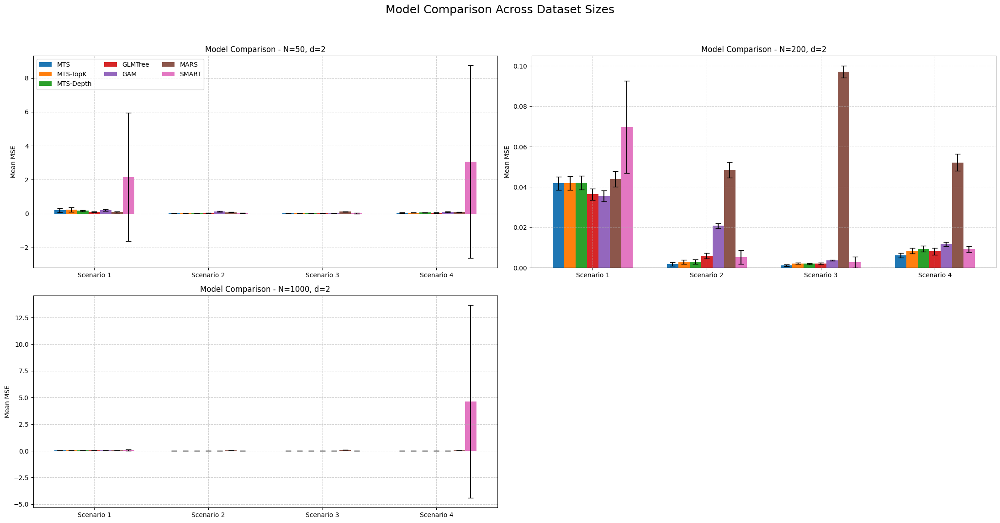

In [6]:
scenarios = ['Scenario 1', 'Scenario 2', 'Scenario 3', 'Scenario 4']
x = np.arange(len(scenarios))
width = 0.10  # you can tweak this if bars feel too tight

titles = [
    'N=50, d=2',
    'N=200, d=2',
    'N=1000, d=2',
]

def summarize_ci(data_array):
    """Compute mean and 95% CI along repetitions for each scenario."""
    means = np.mean(data_array, axis=1)
    n_repeats = data_array.shape[1]
    cis = 1.96 * np.std(data_array, axis=1, ddof=1) / np.sqrt(n_repeats)
    return means, cis

# --- Add your models here (NO 10000) ---
model_data = {
    "Tree1":   [tree_mse_hist50,    tree_mse_hist200,    tree_mse_hist1000],
    "Tree3":   [tree3_mse_hist50,   tree3_mse_hist200,   tree3_mse_hist1000],
    "Tree4":   [tree4_mse_hist50,   tree4_mse_hist200,   tree4_mse_hist1000],
    "GLMTree": [glmtree_mse_hist50, glmtree_mse_hist200, glmtree_mse_hist1000],
    "GAM":     [gam_mse_hist50,     gam_mse_hist200,     gam_mse_hist1000],
    "MARS":    [mars_mse_hist50,    mars_mse_hist200,    mars_mse_hist1000],
    "SMART":   [smart_mse_hist50,   smart_mse_hist200,   smart_mse_hist1000],
}

# What you want shown in the legend (same order as model_data keys)
model_labels = {
    "GAM": "GAM",
    "Tree1": "MTS",
    "Tree3": "MTS-TopK",
    "Tree4": "MTS-Depth",
    "GLMTree": "GLMTree",
    "MARS": "MARS",
    "SMART": "SMART",
}

n_models = len(model_data)
offsets = (np.arange(n_models) - (n_models - 1) / 2.0) * width

fig, axs = plt.subplots(2, 2, figsize=(22, 12))
axs = axs.flat

for i, ax in enumerate(axs):
    if i >= len(titles):
        ax.axis("off")  # hide the unused 4th panel (since we removed N=10000)
        continue

    for j, model_name in enumerate(model_data.keys()):
        data_array = model_data[model_name][i]
        means, cis = summarize_ci(data_array)
        ax.bar(
            x + offsets[j],
            means,
            width,
            yerr=cis,
            capsize=4,
            label=model_labels[model_name] if i == 0 else None
        )

    ax.set_title(f'Model Comparison - {titles[i]}')
    ax.set_ylabel('Mean MSE')
    ax.set_xticks(x)
    ax.set_xticklabels(scenarios)
    ax.grid(True, linestyle='--', alpha=0.6)

    if i == 0:
        ax.legend(ncol=3, fontsize=10)  # ncol=3 fits 7 entries nicely

fig.suptitle("Model Comparison Across Dataset Sizes", fontsize=18)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

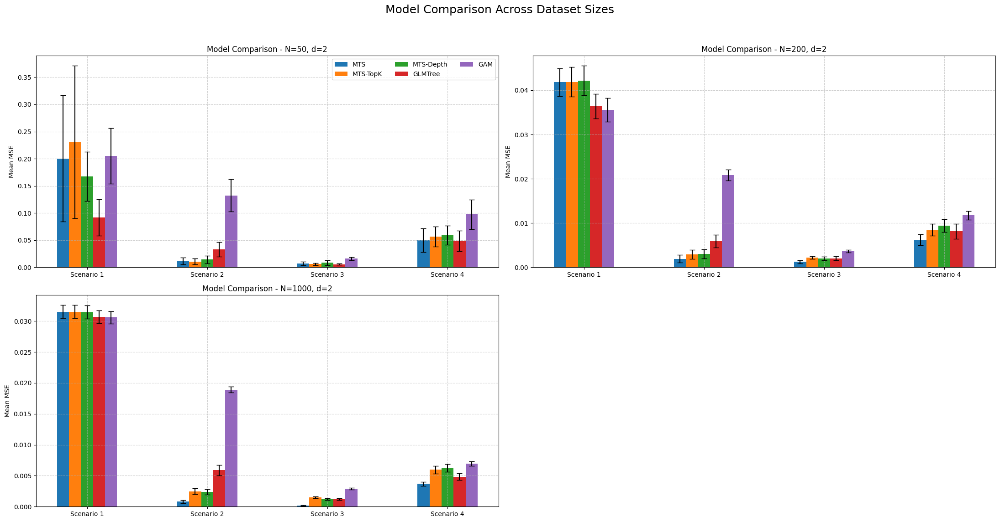

In [7]:
scenarios = ['Scenario 1', 'Scenario 2', 'Scenario 3', 'Scenario 4']
x = np.arange(len(scenarios))
width = 0.10  # you can tweak this if bars feel too tight

titles = [
    'N=50, d=2',
    'N=200, d=2',
    'N=1000, d=2',
]

def summarize_ci(data_array):
    """Compute mean and 95% CI along repetitions for each scenario."""
    means = np.mean(data_array, axis=1)
    n_repeats = data_array.shape[1]
    cis = 1.96 * np.std(data_array, axis=1, ddof=1) / np.sqrt(n_repeats)
    return means, cis

# --- Add your models here (NO 10000) ---
model_data = {
    "Tree1":   [tree_mse_hist50,    tree_mse_hist200,    tree_mse_hist1000],
    "Tree3":   [tree3_mse_hist50,   tree3_mse_hist200,   tree3_mse_hist1000],
    "Tree4":   [tree4_mse_hist50,   tree4_mse_hist200,   tree4_mse_hist1000],
    "GLMTree": [glmtree_mse_hist50, glmtree_mse_hist200, glmtree_mse_hist1000],
    "GAM":     [gam_mse_hist50,     gam_mse_hist200,     gam_mse_hist1000]
}

# What you want shown in the legend (same order as model_data keys)
model_labels = {
    "GAM": "GAM",
    "Tree1": "MTS",
    "Tree3": "MTS-TopK",
    "Tree4": "MTS-Depth",
    "GLMTree": "GLMTree"
}

n_models = len(model_data)
offsets = (np.arange(n_models) - (n_models - 1) / 2.0) * width

fig, axs = plt.subplots(2, 2, figsize=(22, 12))
axs = axs.flat

for i, ax in enumerate(axs):
    if i >= len(titles):
        ax.axis("off")  # hide the unused 4th panel (since we removed N=10000)
        continue

    for j, model_name in enumerate(model_data.keys()):
        data_array = model_data[model_name][i]
        means, cis = summarize_ci(data_array)
        ax.bar(
            x + offsets[j],
            means,
            width,
            yerr=cis,
            capsize=4,
            label=model_labels[model_name] if i == 0 else None
        )

    ax.set_title(f'Model Comparison - {titles[i]}')
    ax.set_ylabel('Mean MSE')
    ax.set_xticks(x)
    ax.set_xticklabels(scenarios)
    ax.grid(True, linestyle='--', alpha=0.6)

    if i == 0:
        ax.legend(ncol=3, fontsize=10)  # ncol=3 fits 7 entries nicely

fig.suptitle("Model Comparison Across Dataset Sizes", fontsize=18)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

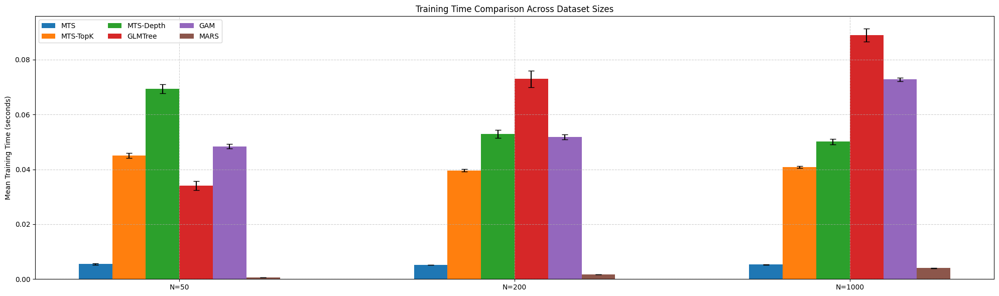

In [8]:
sample_sizes = ['N=50', 'N=200', 'N=1000']
sizes = [50, 200, 1000]

x = np.arange(len(sample_sizes))
width = 0.10  # tweak if you want tighter/looser grouping

# ---- Add new models ----
model_labels = [
    'MTS',
    'MTS-TopK',
    'MTS-Depth',
    'GLMTree',
    'GAM',
    'MARS'
]

time_var_names = [
    "tree_time_hist{}",
    "tree3_time_hist{}",
    "tree4_time_hist{}",
    "glmtree_time_hist{}",
    "gam_time_hist{}",
    "mars_time_hist{}"
]

means_all = [[] for _ in range(len(model_labels))]
cis_all   = [[] for _ in range(len(model_labels))]

def mean_ci(arr):
    arr = np.asarray(arr)
    mean = np.mean(arr)
    ci = 1.96 * np.std(arr, ddof=1) / np.sqrt(len(arr))
    return mean, ci

# Compute means and CIs for all models and sample sizes
for size in sizes:
    for i, var_template in enumerate(time_var_names):
        # each *time_hist{size} is assumed to be a list/array of arrays -> flatten all repeats
        flat = np.concatenate(globals()[var_template.format(size)])
        mean, ci = mean_ci(flat)
        means_all[i].append(mean)
        cis_all[i].append(ci)

means_all = list(map(np.array, means_all))
cis_all   = list(map(np.array, cis_all))

# Offsets centered around 0 for each model
n_models = len(model_labels)
offsets = (np.arange(n_models) - (n_models - 1) / 2.0) * width

# === Plot ===
fig, ax = plt.subplots(figsize=(20, 6))

for i in range(n_models):
    ax.bar(
        x + offsets[i],
        means_all[i],
        width,
        yerr=cis_all[i],
        capsize=4,
        label=model_labels[i]
    )

ax.set_xticks(x)
ax.set_xticklabels(sample_sizes)
ax.set_ylabel('Mean Training Time (seconds)')
ax.set_title('Training Time Comparison Across Dataset Sizes')
ax.grid(True, linestyle='--', alpha=0.6)
ax.legend(ncol=3, fontsize=10)

plt.tight_layout()
plt.show()

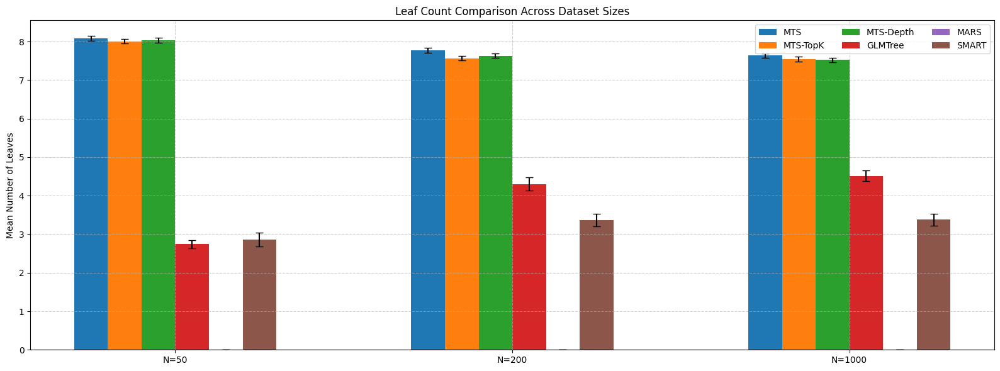

In [6]:
sample_sizes = [50, 200, 1000]
x = np.arange(len(sample_sizes))
width = 0.10  # tweak if needed

# ---- Add new models ----
labels = [
    'MTS', 'MTS-TopK', 'MTS-Depth',
    'GLMTree', 'MARS', 'SMART'
]
n_models = len(labels)

# Initialize mean and CI arrays
means = [[] for _ in range(n_models)]
cis   = [[] for _ in range(n_models)]

def mean_ci(arr):
    arr = np.asarray(arr)
    mean = np.mean(arr)
    ci = 1.96 * np.std(arr, ddof=1) / np.sqrt(len(arr))
    return mean, ci

for size in sample_sizes:
    # Flatten leaf histories (assumed list/array of arrays across repeats)
    leaf1_flat       = np.concatenate(globals()[f"leaf_hist{size}"])
    leaf3_flat       = np.concatenate(globals()[f"leaf3_hist{size}"])
    leaf4_flat       = np.concatenate(globals()[f"leaf4_hist{size}"])
    leaf_glmtree_flat= np.concatenate(globals()[f"leaf_glmtree_hist{size}"])
    leaf_mars_flat   = np.concatenate(globals()[f"leaf_mars_hist{size}"])
    leaf_smart_flat  = np.concatenate(globals()[f"leaf_smart_hist{size}"])

    all_leaf_data = [
        leaf1_flat, leaf3_flat, leaf4_flat,
        leaf_glmtree_flat, leaf_mars_flat, leaf_smart_flat
    ]

    for i, data in enumerate(all_leaf_data):
        m, c = mean_ci(data)
        means[i].append(m)
        cis[i].append(c)

means = list(map(np.array, means))
cis   = list(map(np.array, cis))

# Offsets centered around 0
offsets = (np.arange(n_models) - (n_models - 1) / 2.0) * width

# Plot
fig, ax = plt.subplots(figsize=(16, 6))

for i in range(n_models):
    ax.bar(
        x + offsets[i],
        means[i],
        width,
        yerr=cis[i],
        capsize=4,
        label=labels[i]
    )

ax.set_xticks(x)
ax.set_xticklabels([f'N={n}' for n in sample_sizes])
ax.set_ylabel('Mean Number of Leaves')
ax.set_title('Leaf Count Comparison Across Dataset Sizes')
ax.grid(True, linestyle='--', alpha=0.6)
ax.legend(ncol=3)

plt.tight_layout()
plt.show()

# Testing with different sample sizes (data with interaction)

## N=50

In [27]:
n_samples = 50
repeats = 100

gam_mse_inthist50 = np.zeros((4, repeats))
gam_time_inthist50 = np.zeros((4, repeats))

tree_mse_inthist50 = np.zeros((4, repeats))
tree_time_inthist50 = np.zeros((4, repeats))
leaf_inthist50 = np.zeros((4, repeats))

tree3_mse_inthist50 = np.zeros((4, repeats))
tree3_time_inthist50 = np.zeros((4, repeats))
leaf3_inthist50 = np.zeros((4, repeats))

tree4_mse_inthist50 = np.zeros((4, repeats))
tree4_time_inthist50 = np.zeros((4, repeats))
leaf4_inthist50 = np.zeros((4, repeats))

glmtree_mse_inthist50 = np.zeros((4, repeats))
glmtree_time_inthist50 = np.zeros((4, repeats))
leaf_glmtree_inthist50 = np.zeros((4, repeats))

for j in range(repeats):
   i = 0
   for delta in [0, 1, 5, 10]:
      X, y = generate_interactive_data(n_samples, delta=delta)
      X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
      y_train = y_train.reshape(-1, 1)
      y_test = y_test.reshape(-1, 1)

      # GAM
      gam_start = time.time()
      gam = LinearGAM(spline_order=1).gridsearch(X_train, y_train)
      gam_end = time.time()
      gam_time_inthist50[i, j] = gam_end - gam_start
      y_pred = gam.predict(X_test)
      gam_mse_inthist50[i, j] = mean_squared_error(y_test, y_pred)

      # TreeSpline
      model = TreeSpline(random_state=22)
      tree_start = time.time()
      model.fit(X_train, y_train)
      tree_end = time.time()
      tree_time_inthist50[i-1, j] = tree_end - tree_start
      y_pred = model.predict(X_test)
      tree_mse_inthist50[i-1, j] = mean_squared_error(y_test, y_pred)
      leaf_inthist50[i-1, j] = model.get_leaf_count()

      # TreeSpline3
      model3 = TreeSpline3(random_state=22)
      t3_start = time.time()
      model3.fit(X_train, y_train)
      t3_end = time.time()
      tree3_time_inthist50[i, j] = t3_end - t3_start
      y_pred3 = model3.predict(X_test)
      tree3_mse_inthist50[i, j] = mean_squared_error(y_test, y_pred3)
      leaf3_inthist50[i, j] = model3.get_leaf_count()

      # TreeSpline4
      model4 = TreeSpline4(random_state=22)
      t4_start = time.time()
      model4.fit(X_train, y_train)
      t4_end = time.time()
      tree4_time_inthist50[i, j] = t4_end - t4_start
      y_pred4 = model4.predict(X_test)
      tree4_mse_inthist50[i, j] = mean_squared_error(y_test, y_pred4)
      leaf4_inthist50[i, j] = model4.get_leaf_count()

      # GLMTree
      glm = GLMTree(min_samples_leaf=int(0.1 * n_samples), max_depth=10)
      glmtree_start = time.time()
      glm.fit(X_train, y_train)
      glmtree_end = time.time()
      glmtree_time_inthist50[i, j] = glmtree_end - glmtree_start
      y_pred_glm = glm.predict(X_test)
      glmtree_mse_inthist50[i, j] = mean_squared_error(y_test, y_pred)
      leaf_glmtree_inthist50[i, j] = glm.get_leaf_count()      

      i += 1

   print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 1 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 2 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 3 done! ---



 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 4 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 5 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 6 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 7 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 8 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 9 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 10 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 11 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 12 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 13 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#######


--- Repetition no. 14 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 15 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 16 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 17 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 18 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 19 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 20 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 21 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 22 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 23 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |########


--- Repetition no. 24 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 25 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 26 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 27 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 28 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 29 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 30 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 31 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 32 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 33 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 34 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 35 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 36 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 37 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 38 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 39 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 40 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 41 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 42 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 43 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 44 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 45 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 46 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 47 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 48 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 49 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 50 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 51 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 52 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 53 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 54 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 55 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 56 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 57 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 58 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 59 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 60 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 61 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 62 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 63 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 64 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 65 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 66 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 67 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 68 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 69 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 70 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 71 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 72 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 73 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 74 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 75 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 76 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 77 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |########


--- Repetition no. 78 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 79 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 80 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 81 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 82 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 83 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 84 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 85 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 86 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 87 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 88 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 89 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 90 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 91 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 92 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 93 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 94 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 95 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 96 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 97 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 98 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 99 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


## N=200

In [28]:
n_samples = 200
repeats = 100

gam_mse_inthist200 = np.zeros((4, repeats))
gam_time_inthist200 = np.zeros((4, repeats))

tree_mse_inthist200 = np.zeros((4, repeats))
tree_time_inthist200 = np.zeros((4, repeats))
leaf_inthist200 = np.zeros((4, repeats))

tree3_mse_inthist200 = np.zeros((4, repeats))
tree3_time_inthist200 = np.zeros((4, repeats))
leaf3_inthist200 = np.zeros((4, repeats))

tree4_mse_inthist200 = np.zeros((4, repeats))
tree4_time_inthist200 = np.zeros((4, repeats))
leaf4_inthist200 = np.zeros((4, repeats))

glmtree_mse_inthist200 = np.zeros((4, repeats))
glmtree_time_inthist200 = np.zeros((4, repeats))
leaf_glmtree_inthist200 = np.zeros((4, repeats))

for j in range(repeats):
   i = 0
   for delta in [0, 1, 5, 10]:
      X, y = generate_interactive_data(n_samples, delta=delta)
      X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
      y_train = y_train.reshape(-1, 1)
      y_test = y_test.reshape(-1, 1)

      # GAM
      gam_start = time.time()
      gam = LinearGAM(spline_order=1).gridsearch(X_train, y_train)
      gam_end = time.time()
      gam_time_inthist200[i, j] = gam_end - gam_start
      y_pred = gam.predict(X_test)
      gam_mse_inthist200[i, j] = mean_squared_error(y_test, y_pred)

      # TreeSpline
      model = TreeSpline(random_state=22)
      tree_start = time.time()
      model.fit(X_train, y_train)
      tree_end = time.time()
      tree_time_inthist200[i-1, j] = tree_end - tree_start
      y_pred = model.predict(X_test)
      tree_mse_inthist200[i-1, j] = mean_squared_error(y_test, y_pred)
      leaf_inthist200[i-1, j] = model.get_leaf_count()

      # TreeSpline3
      model3 = TreeSpline3(random_state=22)
      t3_start = time.time()
      model3.fit(X_train, y_train)
      t3_end = time.time()
      tree3_time_inthist200[i, j] = t3_end - t3_start
      y_pred3 = model3.predict(X_test)
      tree3_mse_inthist200[i, j] = mean_squared_error(y_test, y_pred3)
      leaf3_inthist200[i, j] = model3.get_leaf_count()

      # TreeSpline4
      model4 = TreeSpline4(random_state=22)
      t4_start = time.time()
      model4.fit(X_train, y_train)
      t4_end = time.time()
      tree4_time_inthist200[i, j] = t4_end - t4_start
      y_pred4 = model4.predict(X_test)
      tree4_mse_inthist200[i, j] = mean_squared_error(y_test, y_pred4)
      leaf4_inthist200[i, j] = model4.get_leaf_count()

      # GLMTree
      glm = GLMTree(min_samples_leaf=int(0.1 * n_samples), max_depth=10)
      glmtree_start = time.time()
      glm.fit(X_train, y_train)
      glmtree_end = time.time()
      glmtree_time_inthist200[i, j] = glmtree_end - glmtree_start
      y_pred_glm = glm.predict(X_test)
      glmtree_mse_inthist200[i, j] = mean_squared_error(y_test, y_pred)
      leaf_glmtree_inthist200[i, j] = glm.get_leaf_count()      

      i += 1

   print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 1 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 2 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |########


--- Repetition no. 3 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 4 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 5 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 6 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#######


--- Repetition no. 7 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 8 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 9 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 10 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 11 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 12 done! ---



 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 13 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 14 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 15 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 16 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |########


--- Repetition no. 17 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 18 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 19 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 20 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 21 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#######


--- Repetition no. 22 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 23 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 24 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 25 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 26 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 27 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 28 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 29 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 30 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 31 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 32 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 33 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 34 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 35 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 36 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 37 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 38 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 39 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 40 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 41 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 42 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 43 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 44 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 45 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 46 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 47 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 48 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 49 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 50 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 51 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 52 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 53 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 54 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 55 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 56 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 57 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 45% (5 of 11) |########


--- Repetition no. 58 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 59 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 60 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 61 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 62 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 63 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 64 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 65 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 66 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 67 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 68 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 69 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 70 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 71 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 72 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |########


--- Repetition no. 73 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 74 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 75 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 76 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 77 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 78 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 79 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 80 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 81 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 82 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 83 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 84 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 85 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 86 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 87 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 88 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 89 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 90 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 91 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 92 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 93 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 94 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 95 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 96 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 97 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 98 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 99 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 100 done! ---



## N=1000

In [29]:
n_samples = 1000
repeats = 100

gam_mse_inthist1000 = np.zeros((4, repeats))
gam_time_inthist1000 = np.zeros((4, repeats))

tree_mse_inthist1000 = np.zeros((4, repeats))
tree_time_inthist1000 = np.zeros((4, repeats))
leaf_inthist1000 = np.zeros((4, repeats))

tree3_mse_inthist1000 = np.zeros((4, repeats))
tree3_time_inthist1000 = np.zeros((4, repeats))
leaf3_inthist1000 = np.zeros((4, repeats))

tree4_mse_inthist1000 = np.zeros((4, repeats))
tree4_time_inthist1000 = np.zeros((4, repeats))
leaf4_inthist1000 = np.zeros((4, repeats))

glmtree_mse_inthist1000 = np.zeros((4, repeats))
glmtree_time_inthist1000 = np.zeros((4, repeats))
leaf_glmtree_inthist1000 = np.zeros((4, repeats))

for j in range(repeats):
   i = 0
   for delta in [0, 1, 5, 10]:
      X, y = generate_interactive_data(n_samples, delta=delta)
      X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
      y_train = y_train.reshape(-1, 1)
      y_test = y_test.reshape(-1, 1)

      # GAM
      gam_start = time.time()
      gam = LinearGAM(spline_order=1).gridsearch(X_train, y_train)
      gam_end = time.time()
      gam_time_inthist1000[i, j] = gam_end - gam_start
      y_pred = gam.predict(X_test)
      gam_mse_inthist1000[i, j] = mean_squared_error(y_test, y_pred)

      # TreeSpline
      model = TreeSpline(random_state=22)
      tree_start = time.time()
      model.fit(X_train, y_train)
      tree_end = time.time()
      tree_time_inthist1000[i-1, j] = tree_end - tree_start
      y_pred = model.predict(X_test)
      tree_mse_inthist1000[i-1, j] = mean_squared_error(y_test, y_pred)
      leaf_inthist1000[i-1, j] = model.get_leaf_count()

      # TreeSpline3
      model3 = TreeSpline3(random_state=22)
      t3_start = time.time()
      model3.fit(X_train, y_train)
      t3_end = time.time()
      tree3_time_inthist1000[i, j] = t3_end - t3_start
      y_pred3 = model3.predict(X_test)
      tree3_mse_inthist1000[i, j] = mean_squared_error(y_test, y_pred3)
      leaf3_inthist1000[i, j] = model3.get_leaf_count()

      # TreeSpline4
      model4 = TreeSpline4(random_state=22)
      t4_start = time.time()
      model4.fit(X_train, y_train)
      t4_end = time.time()
      tree4_time_inthist1000[i, j] = t4_end - t4_start
      y_pred4 = model4.predict(X_test)
      tree4_mse_inthist1000[i, j] = mean_squared_error(y_test, y_pred4)
      leaf4_inthist1000[i, j] = model4.get_leaf_count()

      # GLMTree
      glm = GLMTree(min_samples_leaf=int(0.1 * n_samples), max_depth=10)
      glmtree_start = time.time()
      glm.fit(X_train, y_train)
      glmtree_end = time.time()
      glmtree_time_inthist1000[i, j] = glmtree_end - glmtree_start
      y_pred_glm = glm.predict(X_test)
      glmtree_mse_inthist1000[i, j] = mean_squared_error(y_test, y_pred)
      leaf_glmtree_inthist1000[i, j] = glm.get_leaf_count()      

      i += 1

   print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 1 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 2 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 3 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 4 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 5 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 6 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 7 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 8 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 9 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 10 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 11 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 12 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 13 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 14 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 15 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 16 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 17 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 18 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 19 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 20 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 21 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 22 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 23 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 24 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 25 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 26 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 27 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 28 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 29 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 30 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 31 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 32 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 33 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 34 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 35 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 36 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 37 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 38 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 39 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 40 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 41 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 42 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 43 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 44 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 45 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 46 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 47 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 48 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 49 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 50 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 51 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 52 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 53 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 54 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 55 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 56 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 57 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 58 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 59 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 60 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 61 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 62 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 63 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 64 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 65 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 66 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 67 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 68 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 69 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 70 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 71 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 72 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 73 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 74 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 75 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 76 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 77 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 78 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 79 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 80 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 81 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 82 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 83 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 84 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 85 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 86 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 87 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 88 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 89 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 90 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 91 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 92 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 93 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 94 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 95 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 96 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 97 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 98 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 99 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 100 done! ---



## N=10000

In [30]:
n_samples = 10000
repeats = 100

gam_mse_inthist10000 = np.zeros((4, repeats))
gam_time_inthist10000 = np.zeros((4, repeats))

tree_mse_inthist10000 = np.zeros((4, repeats))
tree_time_inthist10000 = np.zeros((4, repeats))
leaf_inthist10000 = np.zeros((4, repeats))

tree3_mse_inthist10000 = np.zeros((4, repeats))
tree3_time_inthist10000 = np.zeros((4, repeats))
leaf3_inthist10000 = np.zeros((4, repeats))

tree4_mse_inthist10000 = np.zeros((4, repeats))
tree4_time_inthist10000 = np.zeros((4, repeats))
leaf4_inthist10000 = np.zeros((4, repeats))

glmtree_mse_inthist10000 = np.zeros((4, repeats))
glmtree_time_inthist10000 = np.zeros((4, repeats))
leaf_glmtree_inthist10000 = np.zeros((4, repeats))

for j in range(repeats):
   i = 0
   for delta in [0, 1, 5, 10]:
      X, y = generate_interactive_data(n_samples, delta=delta)
      X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
      y_train = y_train.reshape(-1, 1)
      y_test = y_test.reshape(-1, 1)

      # GAM
      gam_start = time.time()
      gam = LinearGAM(spline_order=1).gridsearch(X_train, y_train)
      gam_end = time.time()
      gam_time_inthist10000[i, j] = gam_end - gam_start
      y_pred = gam.predict(X_test)
      gam_mse_inthist10000[i, j] = mean_squared_error(y_test, y_pred)

      # TreeSpline
      model = TreeSpline(random_state=22)
      tree_start = time.time()
      model.fit(X_train, y_train)
      tree_end = time.time()
      tree_time_inthist10000[i-1, j] = tree_end - tree_start
      y_pred = model.predict(X_test)
      tree_mse_inthist10000[i-1, j] = mean_squared_error(y_test, y_pred)
      leaf_inthist10000[i-1, j] = model.get_leaf_count()

      # TreeSpline3
      model3 = TreeSpline3(random_state=22)
      t3_start = time.time()
      model3.fit(X_train, y_train)
      t3_end = time.time()
      tree3_time_inthist10000[i, j] = t3_end - t3_start
      y_pred3 = model3.predict(X_test)
      tree3_mse_inthist10000[i, j] = mean_squared_error(y_test, y_pred3)
      leaf3_inthist10000[i, j] = model3.get_leaf_count()

      # TreeSpline4
      model4 = TreeSpline4(random_state=22)
      t4_start = time.time()
      model4.fit(X_train, y_train)
      t4_end = time.time()
      tree4_time_inthist10000[i, j] = t4_end - t4_start
      y_pred4 = model4.predict(X_test)
      tree4_mse_inthist10000[i, j] = mean_squared_error(y_test, y_pred4)
      leaf4_inthist10000[i, j] = model4.get_leaf_count()

      # GLMTree
      glm = GLMTree(min_samples_leaf=int(0.1 * n_samples), max_depth=10)
      glmtree_start = time.time()
      glm.fit(X_train, y_train)
      glmtree_end = time.time()
      glmtree_time_inthist10000[i, j] = glmtree_end - glmtree_start
      y_pred_glm = glm.predict(X_test)
      glmtree_mse_inthist10000[i, j] = mean_squared_error(y_test, y_pred)
      leaf_glmtree_inthist10000[i, j] = glm.get_leaf_count()      

      i += 1

   print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 1 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 2 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 3 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 4 done! ---



 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 5 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 6 done! ---



 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 7 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 8 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 9 done! ---



 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 10 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 11 done! ---



 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 12 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 13 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 14 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 15 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 16 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 17 done! ---



 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 18 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 19 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 20 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 21 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 22 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 23 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 24 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 25 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 26 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 27 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 28 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 29 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 30 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 31 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 32 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 33 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 34 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 35 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 36 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 37 done! ---



 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 38 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 39 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 40 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 41 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 42 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 43 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 44 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 45 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 46 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 47 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 48 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 49 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 50 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 51 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 52 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 53 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 54 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 55 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 56 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 57 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 58 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 59 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 60 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 61 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 62 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 63 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 64 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 65 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 66 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 67 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 68 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 69 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 70 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 71 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 72 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 73 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 74 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 75 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 76 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 77 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 78 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 79 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 80 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 81 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 82 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 83 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 84 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 85 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 86 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 87 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 88 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 89 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 90 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 91 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 92 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 93 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 94 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 95 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 96 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 97 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 98 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 99 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 100 done! ---



## Saving, Loading, Plotting

In [31]:
for size in [50, 200, 1000, 10000]:
   np.save(f'./nparrs/tree_time_inthist{size}.npy', globals()[f'tree_time_inthist{size}'])
   np.save(f'./nparrs/tree_mse_inthist{size}.npy', globals()[f'tree_mse_inthist{size}'])
   np.save(f'./nparrs/leaf_inthist{size}.npy', globals()[f'leaf_inthist{size}'])

   np.save(f'./nparrs/gam_time_inthist{size}.npy', globals()[f'gam_time_inthist{size}'])
   np.save(f'./nparrs/gam_mse_inthist{size}.npy', globals()[f'gam_mse_inthist{size}'])

   np.save(f'./nparrs/tree3_time_inthist{size}.npy', globals()[f'tree3_time_inthist{size}'])
   np.save(f'./nparrs/tree3_mse_inthist{size}.npy', globals()[f'tree3_mse_inthist{size}'])
   np.save(f'./nparrs/leaf3_inthist{size}.npy', globals()[f'leaf3_inthist{size}'])

   np.save(f'./nparrs/tree4_time_inthist{size}.npy', globals()[f'tree4_time_inthist{size}'])
   np.save(f'./nparrs/tree4_mse_inthist{size}.npy', globals()[f'tree4_mse_inthist{size}'])
   np.save(f'./nparrs/leaf4_inthist{size}.npy', globals()[f'leaf4_inthist{size}'])

   np.save(f'./nparrs/glmtree_time_inthist{size}.npy', globals()[f'glmtree_time_inthist{size}'])
   np.save(f'./nparrs/glmtree_mse_inthist{size}.npy', globals()[f'glmtree_mse_inthist{size}'])
   np.save(f'./nparrs/leaf_glmtree_inthist{size}.npy', globals()[f'leaf_glmtree_inthist{size}'])

In [9]:
for size in [50, 200, 1000, 10000]:
   globals()[f'tree_time_inthist{size}'] = np.load(f'./nparrs/tree_time_inthist{size}.npy', allow_pickle=True)
   globals()[f'tree_mse_inthist{size}'] = np.load(f'./nparrs/tree_mse_inthist{size}.npy', allow_pickle=True)
   globals()[f'leaf_inthist{size}'] = np.load(f'./nparrs/leaf_inthist{size}.npy', allow_pickle=True)

   globals()[f'gam_time_inthist{size}'] = np.load(f'./nparrs/gam_time_inthist{size}.npy', allow_pickle=True)
   globals()[f'gam_mse_inthist{size}'] = np.load(f'./nparrs/gam_mse_inthist{size}.npy', allow_pickle=True)

   globals()[f'tree3_time_inthist{size}'] = np.load(f'./nparrs/tree3_time_inthist{size}.npy', allow_pickle=True)
   globals()[f'tree3_mse_inthist{size}'] = np.load(f'./nparrs/tree3_mse_inthist{size}.npy', allow_pickle=True)
   globals()[f'leaf3_inthist{size}'] = np.load(f'./nparrs/leaf3_inthist{size}.npy', allow_pickle=True)

   globals()[f'tree4_time_inthist{size}'] = np.load(f'./nparrs/tree4_time_inthist{size}.npy', allow_pickle=True)
   globals()[f'tree4_mse_inthist{size}'] = np.load(f'./nparrs/tree4_mse_inthist{size}.npy', allow_pickle=True)
   globals()[f'leaf4_inthist{size}'] = np.load(f'./nparrs/leaf4_inthist{size}.npy', allow_pickle=True)

   globals()[f'glmtree_time_inthist{size}'] = np.load(f'./nparrs/glmtree_time_inthist{size}.npy', allow_pickle=True)
   globals()[f'glmtree_mse_inthist{size}'] = np.load(f'./nparrs/glmtree_mse_inthist{size}.npy', allow_pickle=True)
   globals()[f'leaf_glmtree_inthist{size}'] = np.load(f'./nparrs/leaf_glmtree_inthist{size}.npy', allow_pickle=True)

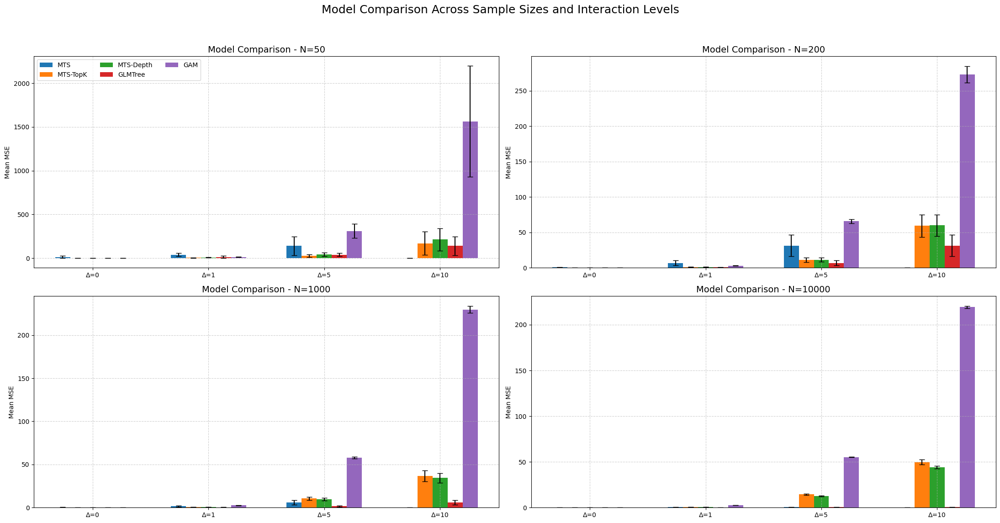

In [10]:
sample_sizes = ['N=50', 'N=200', 'N=1000', 'N=10000']
n_values = [50, 200, 1000, 10000]
scenarios = ['Δ=0', 'Δ=1', 'Δ=5', 'Δ=10']
x = np.arange(len(scenarios))
width = 0.13  # slightly smaller since we add GLMTree (5 models)

# Updated model labels (now includes GLMTree)
model_labels = [
    'MTS',
    'MTS-TopK',
    'MTS-Depth',
    'GLMTree',
    'GAM'
]

# Updated MSE arrays (now includes GLMTree)
all_mse_vars = [
    [tree_mse_inthist50,    tree_mse_inthist200,    tree_mse_inthist1000,    tree_mse_inthist10000],
    [tree3_mse_inthist50,   tree3_mse_inthist200,   tree3_mse_inthist1000,   tree3_mse_inthist10000],
    [tree4_mse_inthist50,   tree4_mse_inthist200,   tree4_mse_inthist1000,   tree4_mse_inthist10000],
    [glmtree_mse_inthist50, glmtree_mse_inthist200, glmtree_mse_inthist1000, glmtree_mse_inthist10000],
    [gam_mse_inthist50,    gam_mse_inthist200,    gam_mse_inthist1000,    gam_mse_inthist10000]
]

def mean_ci(data, confidence=0.95):
    # data is (n_scenarios, n_reps)
    data = np.asarray(data)
    mean = np.mean(data, axis=1)
    se = stats.sem(data, axis=1)
    h = se * stats.t.ppf((1 + confidence) / 2.0, data.shape[1] - 1)
    return mean, h

# Centered offsets (more robust than np.linspace for changing #models)
n_models = len(all_mse_vars)
offsets = (np.arange(n_models) - (n_models - 1) / 2.0) * width

fig, axs = plt.subplots(2, 2, figsize=(22, 12))
axs = axs.flatten()

for i in range(4):  # 4 sample sizes -> 4 subplots
    ax = axs[i]
    for j, mse_list in enumerate(all_mse_vars):
        data = mse_list[i]  # shape (4, reps): scenarios x reps
        means, cis = mean_ci(data)
        ax.bar(
            x + offsets[j],
            means,
            width,
            yerr=cis,
            capsize=4,
            label=model_labels[j] if i == 0 else None
        )

    ax.set_title(f'Model Comparison - {sample_sizes[i]}', fontsize=14)
    ax.set_ylabel('Mean MSE')
    ax.set_xticks(x)
    ax.set_xticklabels(scenarios)
    ax.grid(True, linestyle='--', alpha=0.6)

    if i == 0:
        ax.legend(ncol=3, fontsize=10)

fig.suptitle("Model Comparison Across Sample Sizes and Interaction Levels", fontsize=18)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

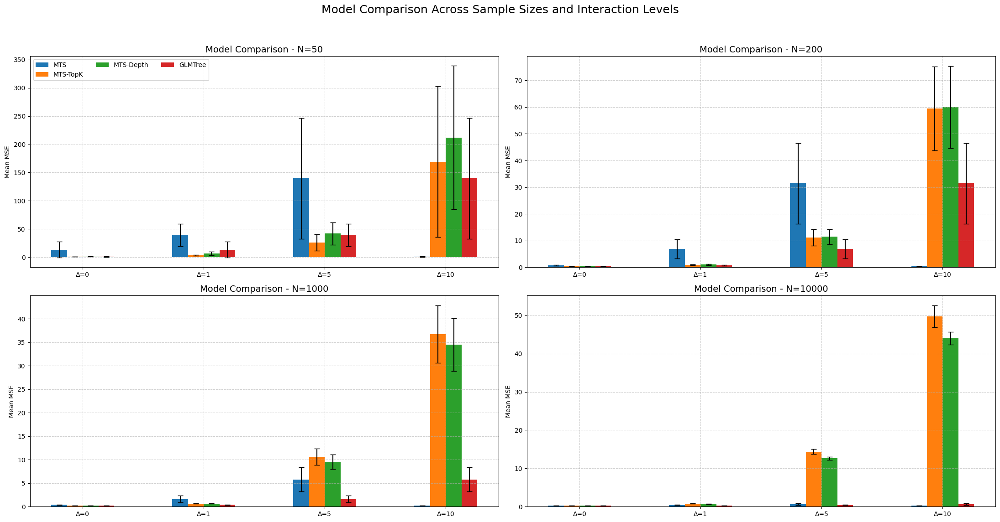

In [69]:
sample_sizes = ['N=50', 'N=200', 'N=1000', 'N=10000']
n_values = [50, 200, 1000, 10000]
scenarios = ['Δ=0', 'Δ=1', 'Δ=5', 'Δ=10']
x = np.arange(len(scenarios))
width = 0.13  # slightly smaller since we add GLMTree (5 models)

# Updated model labels (now includes GLMTree)
model_labels = [
    'MTS',
    'MTS-TopK',
    'MTS-Depth',
    'GLMTree'
]

# Updated MSE arrays (now includes GLMTree)
all_mse_vars = [
    [tree_mse_inthist50,    tree_mse_inthist200,    tree_mse_inthist1000,    tree_mse_inthist10000],
    [tree3_mse_inthist50,   tree3_mse_inthist200,   tree3_mse_inthist1000,   tree3_mse_inthist10000],
    [tree4_mse_inthist50,   tree4_mse_inthist200,   tree4_mse_inthist1000,   tree4_mse_inthist10000],
    [glmtree_mse_inthist50, glmtree_mse_inthist200, glmtree_mse_inthist1000, glmtree_mse_inthist10000],
]

def mean_ci(data, confidence=0.95):
    # data is (n_scenarios, n_reps)
    data = np.asarray(data)
    mean = np.mean(data, axis=1)
    se = stats.sem(data, axis=1)
    h = se * stats.t.ppf((1 + confidence) / 2.0, data.shape[1] - 1)
    return mean, h

# Centered offsets (more robust than np.linspace for changing #models)
n_models = len(all_mse_vars)
offsets = (np.arange(n_models) - (n_models - 1) / 2.0) * width

fig, axs = plt.subplots(2, 2, figsize=(22, 12))
axs = axs.flatten()

for i in range(4):  # 4 sample sizes -> 4 subplots
    ax = axs[i]
    for j, mse_list in enumerate(all_mse_vars):
        data = mse_list[i]  # shape (4, reps): scenarios x reps
        means, cis = mean_ci(data)
        ax.bar(
            x + offsets[j],
            means,
            width,
            yerr=cis,
            capsize=4,
            label=model_labels[j] if i == 0 else None
        )

    ax.set_title(f'Model Comparison - {sample_sizes[i]}', fontsize=14)
    ax.set_ylabel('Mean MSE')
    ax.set_xticks(x)
    ax.set_xticklabels(scenarios)
    ax.grid(True, linestyle='--', alpha=0.6)

    if i == 0:
        ax.legend(ncol=3, fontsize=10)

fig.suptitle("Model Comparison Across Sample Sizes and Interaction Levels", fontsize=18)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

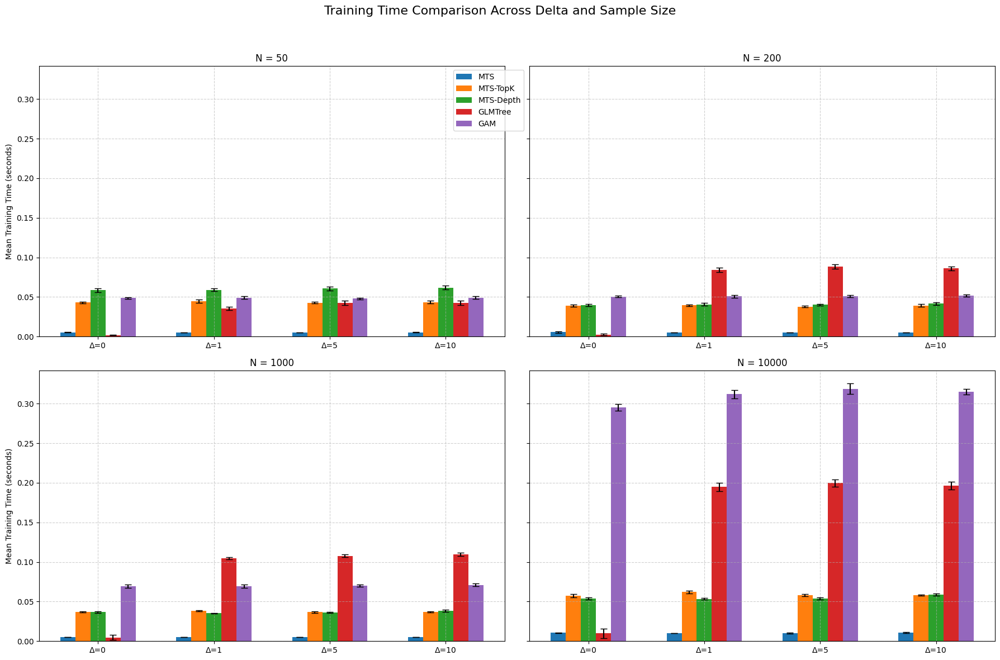

In [11]:
model_labels = [
    'MTS',
    'MTS-TopK',
    'MTS-Depth',
    'GLMTree',          # <-- added
    'GAM'
]

time_var_templates = [
    "tree_time_inthist{}",
    "tree3_time_inthist{}",
    "tree4_time_inthist{}",
    "glmtree_time_inthist{}",   # <-- added
    "gam_time_inthist{}"
]

sample_sizes = [50, 200, 1000, 10000]
delta_labels = ['Δ=0', 'Δ=1', 'Δ=5', 'Δ=10']
x = np.arange(len(delta_labels))
width = 0.13  # slightly smaller since we now have 5 models

# Function to compute mean ± CI
def mean_ci(data, confidence=0.95):
    data = np.atleast_2d(data)
    if data.shape[0] != len(delta_labels):
        data = data.T  # rows=Δ, cols=repeats
    mean = np.mean(data, axis=1)
    se = stats.sem(data, axis=1)
    h = se * stats.t.ppf((1 + confidence) / 2.0, data.shape[1] - 1)
    return mean, h

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(18, 12), sharey=True)

n_models = len(model_labels)
offsets = (np.arange(n_models) - (n_models - 1) / 2.0) * width  # centered offsets

for idx, size in enumerate(sample_sizes):
    means_all = []
    cis_all = []

    for template in time_var_templates:
        varname = template.format(size)
        data = globals()[varname]
        m, c = mean_ci(data)
        means_all.append(m)
        cis_all.append(c)

    means_all = np.array(means_all)  # (n_models, n_deltas)
    cis_all   = np.array(cis_all)

    ax = axs[idx // 2, idx % 2]
    for i in range(n_models):
        ax.bar(
            x + offsets[i],
            means_all[i],
            width,
            yerr=cis_all[i],
            capsize=4,
            label=model_labels[i] if idx == 0 else ""
        )

    ax.set_xticks(x)
    ax.set_xticklabels(delta_labels)
    ax.set_title(f'N = {size}')
    ax.grid(True, linestyle='--', alpha=0.6)
    if idx % 2 == 0:
        ax.set_ylabel('Mean Training Time (seconds)')

# Legend only on top-left subplot
axs[0, 0].legend(ncol=1, fontsize=10, bbox_to_anchor=(1.05, 1.0))
fig.suptitle('Training Time Comparison Across Delta and Sample Size', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

color edit

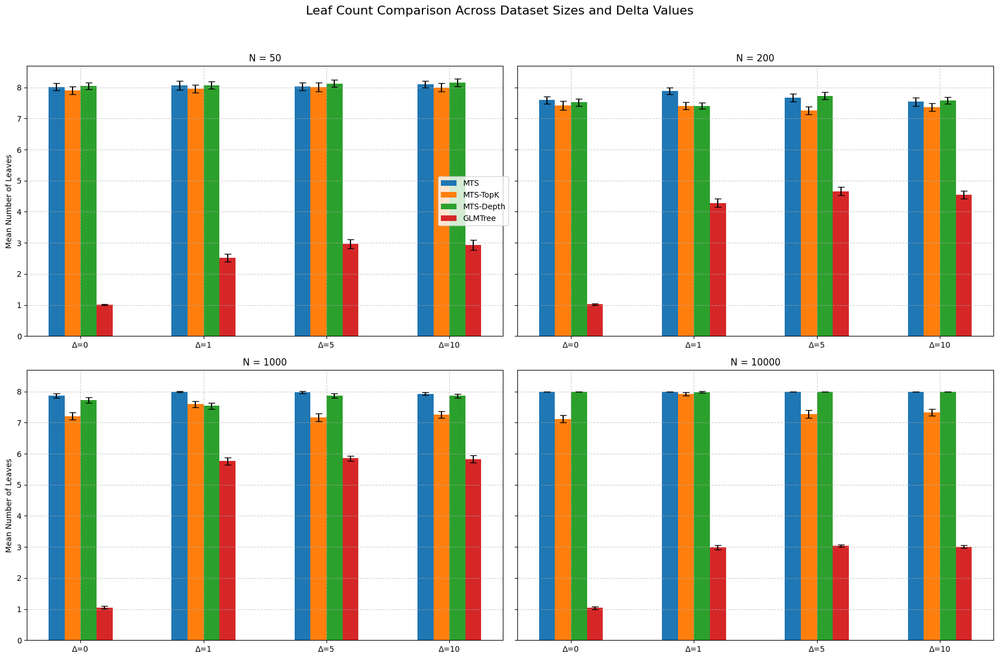

In [10]:
sample_sizes = [50, 200, 1000, 10000]
delta_labels = ['Δ=0', 'Δ=1', 'Δ=5', 'Δ=10']
x = np.arange(len(delta_labels))

labels = [
    'MTS',
    'MTS-TopK',
    'MTS-Depth',
    'GLMTree'            # <-- added
]
n_models = len(labels)
width = 0.13  # slightly smaller since we now have 4 models

def mean_ci(data, confidence=0.95):
    data = np.atleast_2d(data)
    if data.shape[0] != len(delta_labels):
        data = data.T  # rows = deltas, cols = repeats
    mean = np.mean(data, axis=1)
    se = stats.sem(data, axis=1)
    h = se * stats.t.ppf((1 + confidence) / 2.0, data.shape[1] - 1)
    return mean, h

fig, axs = plt.subplots(2, 2, figsize=(18, 12), sharey=True)

# centered offsets
offsets = (np.arange(n_models) - (n_models - 1) / 2.0) * width

for idx, size in enumerate(sample_sizes):
    leaf_data_arrays = [
        globals()[f"leaf_inthist{size}"],
        globals()[f"leaf3_inthist{size}"],
        globals()[f"leaf4_inthist{size}"],
        globals()[f"leaf_glmtree_inthist{size}"],   # <-- added
    ]

    means_all, cis_all = [], []

    for data in leaf_data_arrays:
        mean, ci = mean_ci(data)
        means_all.append(mean)
        cis_all.append(ci)

    means_all = np.array(means_all)  # (models, deltas)
    cis_all   = np.array(cis_all)

    ax = axs[idx // 2, idx % 2]

    for i in range(n_models):
        ax.bar(
            x + offsets[i],
            means_all[i],
            width,
            yerr=cis_all[i],
            capsize=4,
            label=labels[i] if idx == 0 else ""
        )

    ax.set_xticks(x)
    ax.set_xticklabels(delta_labels)
    ax.set_title(f'N = {size}')
    ax.grid(True, linestyle='--', alpha=0.6)

    if idx % 2 == 0:
        ax.set_ylabel('Mean Number of Leaves')

# Legend only on top-left subplot
axs[0, 0].legend(labels, loc='center right', fontsize=10, ncol=1, bbox_to_anchor=(1.02, 0.5))

fig.suptitle('Leaf Count Comparison Across Dataset Sizes and Delta Values', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Testing with different no. of features (N=1000)

## d=5

In [56]:
n_samples = 1000

gam_mse_hist10005 = np.zeros((4, 100))
gam_time_hist10005 = np.zeros((4, 100))

leaf_hist10005 = np.zeros((4, 100))
tree_mse_hist10005 = np.zeros((4, 100))
tree_time_hist10005 = np.zeros((4, 100))

leaf3_hist10005 = np.zeros((4, 100))
tree3_mse_hist10005 = np.zeros((4, 100))
tree3_time_hist10005 = np.zeros((4, 100))

leaf4_hist10005 = np.zeros((4, 100))
tree4_mse_hist10005 = np.zeros((4, 100))
tree4_time_hist10005 = np.zeros((4, 100))

leaf_glmtree_hist10005 = np.zeros((4, 100))
glmtree_mse_hist10005 = np.zeros((4, 100))
glmtree_time_hist10005 = np.zeros((4, 100))

for j in range(100):
  for i in range(1, 5):
    X, y = generate_data(n_samples, i, n_features=5)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state = 22)
    y_train = y_train.reshape(-1, 1)
    y_test = y_test.reshape(-1, 1)

    scaler_X = MinMaxScaler()
    scaler_y = MinMaxScaler()

    X_train_scaled = scaler_X.fit_transform(X_train)
    X_test_scaled = scaler_X.transform(X_test)

    y_train_scaled = scaler_y.fit_transform(y_train)
    y_test_scaled = scaler_y.transform(y_test)

    X_train = np.asarray(X_train_scaled)
    y_train = np.asarray(y_train_scaled)

    # GAM
    gam_start = time.time()
    gam = LinearGAM(spline_order=1).gridsearch(X_train, y_train)
    gam_end = time.time()
    gam_time_hist10005[i-1, j] = gam_end - gam_start

    y_pred = gam.predict(X_test_scaled)
    mse_gam = mean_squared_error(y_test_scaled, y_pred)
    gam_mse_hist10005[i-1, j] = mse_gam

    # TreeSpline
    model = TreeSpline(random_state = 22)

    tree_start = time.time()
    model.fit(X_train_scaled, y_train_scaled)
    tree_end = time.time()
    tree_time_hist10005[i-1, j] = tree_end - tree_start

    y_pred = model.predict(X_test_scaled)
    mse_tree = mean_squared_error(y_test_scaled, y_pred)

    leaf_hist10005[i-1, j] = model.get_leaf_count()
    tree_mse_hist10005[i-1, j] = mse_tree

    # TreeSpline3
    model3 = TreeSpline3(random_state = 22)

    tree3_start = time.time()
    model3.fit(X_train_scaled, y_train_scaled)
    tree3_end = time.time()
    tree3_time_hist10005[i-1, j] = tree3_end - tree3_start

    y_pred = model3.predict(X_test_scaled)
    mse_tree3 = mean_squared_error(y_test_scaled, y_pred)

    leaf3_hist10005[i-1, j] = model3.get_leaf_count()
    tree3_mse_hist10005[i-1, j] = mse_tree3

    # TreeSpline4
    model4 = TreeSpline4(random_state = 22)

    tree4_start = time.time()
    model4.fit(X_train_scaled, y_train_scaled)
    tree4_end = time.time()
    tree4_time_hist10005[i-1, j] = tree4_end - tree4_start

    y_pred = model4.predict(X_test_scaled)
    mse_tree4 = mean_squared_error(y_test_scaled, y_pred)

    leaf4_hist10005[i-1, j] = model4.get_leaf_count()
    tree4_mse_hist10005[i-1, j] = mse_tree4

    # GLMTree
    glmtree = GLMTree(min_samples_leaf=int(0.1 * n_samples))

    glmtree_start = time.time()
    glmtree.fit(X_train_scaled, y_train_scaled)
    glmtree_end = time.time()

    glmtree_time_hist10005[i-1, j] = glmtree_end - glmtree_start
    y_pred = glmtree.predict(X_test_scaled)
    mse_glmtree = mean_squared_error(y_test_scaled, y_pred)

    leaf_glmtree_hist10005[i-1, j] = glmtree.get_leaf_count()
    glmtree_mse_hist10005[i-1, j] = mse_glmtree

  print(f"\n---Repeatition no. {j+1} done!---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 1 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 2 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 3 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 4 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 5 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 6 done!---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143


---Repeatition no. 7 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 8 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 9 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 10 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 11 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 12 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 13 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 14 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 15 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 16 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 17 done!---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


---Repeatition no. 18 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 19 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 20 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 21 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 22 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 23 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 24 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


---Repeatition no. 25 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


---Repeatition no. 26 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 27 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 28 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


---Repeatition no. 29 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


---Repeatition no. 30 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 31 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 32 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 33 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 34 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 35 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 36 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 37 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 38 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 39 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 40 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 41 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 42 done!---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143


---Repeatition no. 43 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 44 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 45 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 46 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 47 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 48 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 49 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 50 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 51 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 52 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


---Repeatition no. 53 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 54 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 55 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 56 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 57 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 58 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 59 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 60 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 61 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 62 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


---Repeatition no. 63 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 64 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 65 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


---Repeatition no. 66 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 67 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 68 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 69 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 70 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 71 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 72 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 73 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 74 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 75 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 76 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 77 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 78 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 79 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 80 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 81 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 82 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 83 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 84 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


---Repeatition no. 85 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 86 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 87 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 88 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 89 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 90 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 91 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 92 done!---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143


---Repeatition no. 93 done!---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143


---Repeatition no. 94 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 95 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 96 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 97 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


---Repeatition no. 98 done!---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


---Repeatition no. 99 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


---Repeatition no. 100 done!---



## d=10

In [57]:
n_samples = 1000

gam_mse_hist100010 = np.zeros((4, 100))
gam_time_hist100010 = np.zeros((4, 100))

leaf_hist100010 = np.zeros((4, 100))
tree_mse_hist100010 = np.zeros((4, 100))
tree_time_hist100010 = np.zeros((4, 100))

leaf3_hist100010 = np.zeros((4, 100))
tree3_mse_hist100010 = np.zeros((4, 100))
tree3_time_hist100010 = np.zeros((4, 100))

leaf4_hist100010 = np.zeros((4, 100))
tree4_mse_hist100010 = np.zeros((4, 100))
tree4_time_hist100010 = np.zeros((4, 100))

leaf_glmtree_hist100010 = np.zeros((4, 100))
glmtree_mse_hist100010 = np.zeros((4, 100))
glmtree_time_hist100010 = np.zeros((4, 100))

for j in range(100):
  for i in range(1, 5):
    X, y = generate_data(n_samples, i, n_features=10)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state = 22)
    y_train = y_train.reshape(-1, 1)
    y_test = y_test.reshape(-1, 1)

    scaler_X = MinMaxScaler()
    scaler_y = MinMaxScaler()

    X_train_scaled = scaler_X.fit_transform(X_train)
    X_test_scaled = scaler_X.transform(X_test)

    y_train_scaled = scaler_y.fit_transform(y_train)
    y_test_scaled = scaler_y.transform(y_test)

    X_train = np.asarray(X_train_scaled)
    y_train = np.asarray(y_train_scaled)

    # GAM
    gam_start = time.time()
    gam = LinearGAM(spline_order=1).gridsearch(X_train, y_train)
    gam_end = time.time()
    gam_time_hist100010[i-1, j] = gam_end - gam_start

    y_pred = gam.predict(X_test_scaled)
    mse_gam = mean_squared_error(y_test_scaled, y_pred)
    gam_mse_hist100010[i-1, j] = mse_gam

    # TreeSpline
    model = TreeSpline(random_state = 22)

    tree_start = time.time()
    model.fit(X_train_scaled, y_train_scaled)
    tree_end = time.time()
    tree_time_hist100010[i-1, j] = tree_end - tree_start

    y_pred = model.predict(X_test_scaled)
    mse_tree = mean_squared_error(y_test_scaled, y_pred)

    leaf_hist100010[i-1, j] = model.get_leaf_count()
    tree_mse_hist100010[i-1, j] = mse_tree

    # TreeSpline3
    model3 = TreeSpline3(random_state = 22)

    tree3_start = time.time()
    model3.fit(X_train_scaled, y_train_scaled)
    tree3_end = time.time()
    tree3_time_hist100010[i-1, j] = tree3_end - tree3_start

    y_pred = model3.predict(X_test_scaled)
    mse_tree3 = mean_squared_error(y_test_scaled, y_pred)

    leaf3_hist100010[i-1, j] = model3.get_leaf_count()
    tree3_mse_hist100010[i-1, j] = mse_tree3

    # TreeSpline4
    model4 = TreeSpline4(random_state = 22)

    tree4_start = time.time()
    model4.fit(X_train_scaled, y_train_scaled)
    tree4_end = time.time()
    tree4_time_hist100010[i-1, j] = tree4_end - tree4_start

    y_pred = model4.predict(X_test_scaled)
    mse_tree4 = mean_squared_error(y_test_scaled, y_pred)

    leaf4_hist100010[i-1, j] = model4.get_leaf_count()
    tree4_mse_hist100010[i-1, j] = mse_tree4

    # GLMTree
    glmtree = GLMTree(min_samples_leaf=int(0.1 * n_samples))

    glmtree_start = time.time()
    glmtree.fit(X_train_scaled, y_train_scaled)
    glmtree_end = time.time()

    glmtree_time_hist100010[i-1, j] = glmtree_end - glmtree_start
    y_pred = glmtree.predict(X_test_scaled)
    mse_glmtree = mean_squared_error(y_test_scaled, y_pred)

    leaf_glmtree_hist100010[i-1, j] = glmtree.get_leaf_count()
    glmtree_mse_hist100010[i-1, j] = mse_glmtree

  print(f"\n---Repeatition no. {j+1} done!---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  -


---Repeatition no. 1 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 2 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 3 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 4 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 5 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 6 done!---



 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 7 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 8 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 9 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 10 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 11 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 12 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 13 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 14 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 15 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 16 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 17 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 18 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 19 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 20 done!---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 21 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 22 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 23 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 24 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 25 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 26 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 27 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 28 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 29 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 30 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 31 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 32 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 33 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 34 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 35 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 36 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 37 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 38 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 39 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 40 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 41 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 42 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 43 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 44 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 45 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 46 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 47 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 48 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 49 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 50 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 51 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 52 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 53 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 54 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 55 done!---



 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-


---Repeatition no. 56 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 57 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 58 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 59 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 60 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 61 done!---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 62 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 63 done!---



 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 64 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 65 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 66 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 67 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 68 done!---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 69 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 70 done!---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 71 done!---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 72 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 73 done!---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 74 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 75 done!---



 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 76 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 77 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 78 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 79 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 80 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 81 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 82 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 83 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 84 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 85 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 86 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 87 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 88 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 89 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 90 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 91 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 92 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 93 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 94 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 95 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 96 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 97 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 98 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 99 done!---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


---Repeatition no. 100 done!---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_26114/2934143891.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


## Saving, Loading and Plotting

In [58]:
np.save('./nparrs/gam_time_hist10005.npy', gam_time_hist10005)
np.save('./nparrs/gam_mse_hist10005.npy', gam_mse_hist10005)
np.save('./nparrs/tree_time_hist10005.npy', tree_time_hist10005)
np.save('./nparrs/leaf_hist10005.npy', leaf_hist10005)
np.save('./nparrs/tree_mse_hist10005.npy', tree_mse_hist10005)
np.save('./nparrs/tree3_time_hist10005.npy', tree3_time_hist10005)
np.save('./nparrs/leaf3_hist10005.npy', leaf3_hist10005)
np.save('./nparrs/tree3_mse_hist10005.npy', tree3_mse_hist10005)
np.save('./nparrs/tree4_time_hist10005.npy', tree4_time_hist10005)
np.save('./nparrs/leaf4_hist10005.npy', leaf4_hist10005)
np.save('./nparrs/tree4_mse_hist10005.npy', tree4_mse_hist10005)
np.save('./nparrs/glmtree_time_hist10005.npy', glmtree_time_hist10005)
np.save('./nparrs/leaf_glmtree_hist10005.npy', leaf_glmtree_hist10005)
np.save('./nparrs/glmtree_mse_hist10005.npy', glmtree_mse_hist10005)

np.save('./nparrs/gam_time_hist100010.npy', gam_time_hist100010)
np.save('./nparrs/gam_mse_hist100010.npy', gam_mse_hist100010)
np.save('./nparrs/tree_time_hist100010.npy', tree_time_hist100010)
np.save('./nparrs/leaf_hist100010.npy', leaf_hist100010)
np.save('./nparrs/tree_mse_hist100010.npy', tree_mse_hist100010)
np.save('./nparrs/tree3_time_hist100010.npy', tree3_time_hist100010)
np.save('./nparrs/leaf3_hist100010.npy', leaf3_hist100010)
np.save('./nparrs/tree3_mse_hist100010.npy', tree3_mse_hist100010)
np.save('./nparrs/tree4_time_hist100010.npy', tree4_time_hist100010)
np.save('./nparrs/leaf4_hist100010.npy', leaf4_hist100010)
np.save('./nparrs/tree4_mse_hist100010.npy', tree4_mse_hist100010)
np.save('./nparrs/glmtree_time_hist100010.npy', glmtree_time_hist100010)
np.save('./nparrs/leaf_glmtree_hist100010.npy', leaf_glmtree_hist100010)
np.save('./nparrs/glmtree_mse_hist100010.npy', glmtree_mse_hist100010)

In [3]:
gam_mse_hist10005 = np.load('./nparrs/gam_mse_hist10005.npy')
gam_time_hist10005 = np.load('./nparrs/gam_time_hist10005.npy')
leaf_hist10005 = np.load('./nparrs/leaf_hist10005.npy')
tree_mse_hist10005 = np.load('./nparrs/tree_mse_hist10005.npy')
tree_time_hist10005 = np.load('./nparrs/tree_time_hist10005.npy')
leaf3_hist10005 = np.load('./nparrs/leaf3_hist10005.npy')
tree3_mse_hist10005 = np.load('./nparrs/tree3_mse_hist10005.npy')
tree3_time_hist10005 = np.load('./nparrs/tree3_time_hist10005.npy')
leaf4_hist10005 = np.load('./nparrs/leaf4_hist10005.npy')
tree4_mse_hist10005 = np.load('./nparrs/tree4_mse_hist10005.npy')
tree4_time_hist10005 = np.load('./nparrs/tree4_time_hist10005.npy')
leaf_glmtree_hist10005 = np.load('./nparrs/leaf_glmtree_hist10005.npy')
glmtree_mse_hist10005 = np.load('./nparrs/glmtree_mse_hist10005.npy')
glmtree_time_hist10005 = np.load('./nparrs/glmtree_time_hist10005.npy')

gam_mse_hist100010 = np.load('./nparrs/gam_mse_hist100010.npy')
gam_time_hist100010 = np.load('./nparrs/gam_time_hist100010.npy')
leaf_hist100010 = np.load('./nparrs/leaf_hist100010.npy')
tree_mse_hist100010 = np.load('./nparrs/tree_mse_hist100010.npy')
tree_time_hist100010 = np.load('./nparrs/tree_time_hist100010.npy')
leaf3_hist100010 = np.load('./nparrs/leaf3_hist100010.npy')
tree3_mse_hist100010 = np.load('./nparrs/tree3_mse_hist100010.npy')
tree3_time_hist100010 = np.load('./nparrs/tree3_time_hist100010.npy')
leaf4_hist100010 = np.load('./nparrs/leaf4_hist100010.npy')
tree4_mse_hist100010 = np.load('./nparrs/tree4_mse_hist100010.npy')
tree4_time_hist100010 = np.load('./nparrs/tree4_time_hist100010.npy')
leaf_glmtree_hist100010 = np.load('./nparrs/leaf_glmtree_hist100010.npy')
glmtree_mse_hist100010 = np.load('./nparrs/glmtree_mse_hist100010.npy')
glmtree_time_hist100010 = np.load('./nparrs/glmtree_time_hist100010.npy')

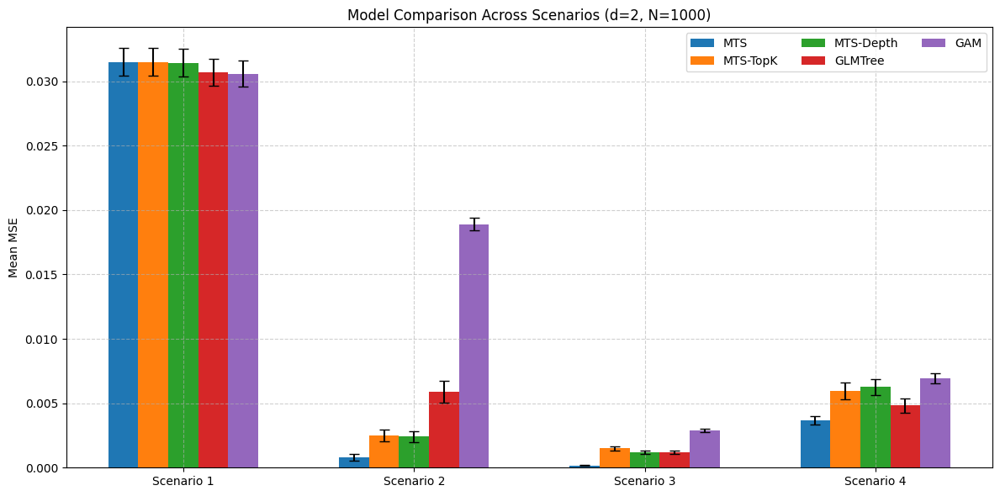

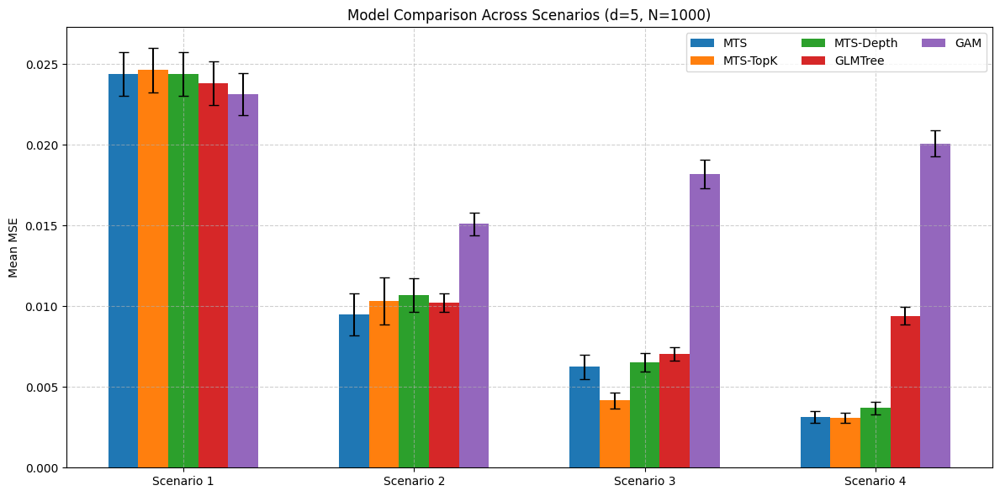

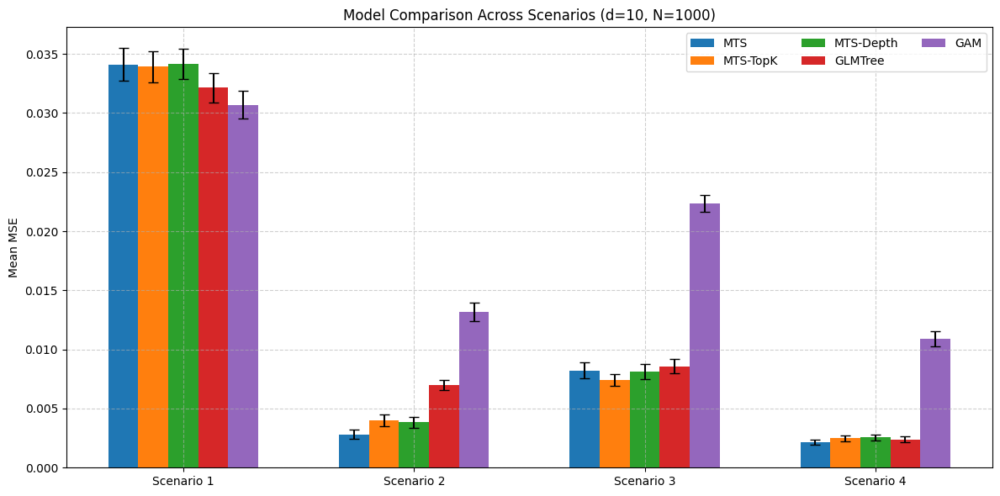

In [8]:
scenarios = ['Scenario 1', 'Scenario 2', 'Scenario 3', 'Scenario 4']
x = np.arange(len(scenarios))
width = 0.13  # slightly smaller since we add a 5th model

model_labels = ['MTS', 'MTS-TopK', 'MTS-Depth','GLMTree', 'GAM']

def plot_mse_group(all_mse_vars, title, width=0.13, legend_ncol=3):
    n_models = len(all_mse_vars)
    offsets = (np.arange(n_models) - (n_models - 1) / 2.0) * width

    fig, ax = plt.subplots(1, 1, figsize=(12, 6))
    for j, arr in enumerate(all_mse_vars):
        means, cis = compute_ci_stats(arr)  # arr: (4, reps)
        ax.bar(x + offsets[j], means, width, yerr=cis, capsize=4, label=model_labels[j])

    ax.set_title(title)
    ax.set_ylabel('Mean MSE')
    ax.set_xticks(x)
    ax.set_xticklabels(scenarios)
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.legend(ncol=legend_ncol, fontsize=10)
    plt.tight_layout()
    plt.show()

# =========================
# d = 2  (added from last simulation)
# =========================
all_mse_vars = [
    tree_mse_hist1000,
    tree3_mse_hist1000,
    tree4_mse_hist1000,
    glmtree_mse_hist1000, # <-- new
    gam_mse_hist1000     # (4, reps)
]
plot_mse_group(all_mse_vars, 'Model Comparison Across Scenarios (d=2, N=1000)', width=width, legend_ncol=3)

# =========================
# d = 5
# =========================
all_mse_vars = [
    tree_mse_hist10005,
    tree3_mse_hist10005,
    tree4_mse_hist10005,
    glmtree_mse_hist10005,  # <-- new
    gam_mse_hist10005
]
plot_mse_group(all_mse_vars, 'Model Comparison Across Scenarios (d=5, N=1000)', width=width, legend_ncol=3)

# =========================
# d = 10
# =========================
all_mse_vars = [
    tree_mse_hist100010,
    tree3_mse_hist100010,
    tree4_mse_hist100010,
    glmtree_mse_hist100010,  # <-- new
    gam_mse_hist100010
]
plot_mse_group(all_mse_vars, 'Model Comparison Across Scenarios (d=10, N=1000)', width=width, legend_ncol=3)

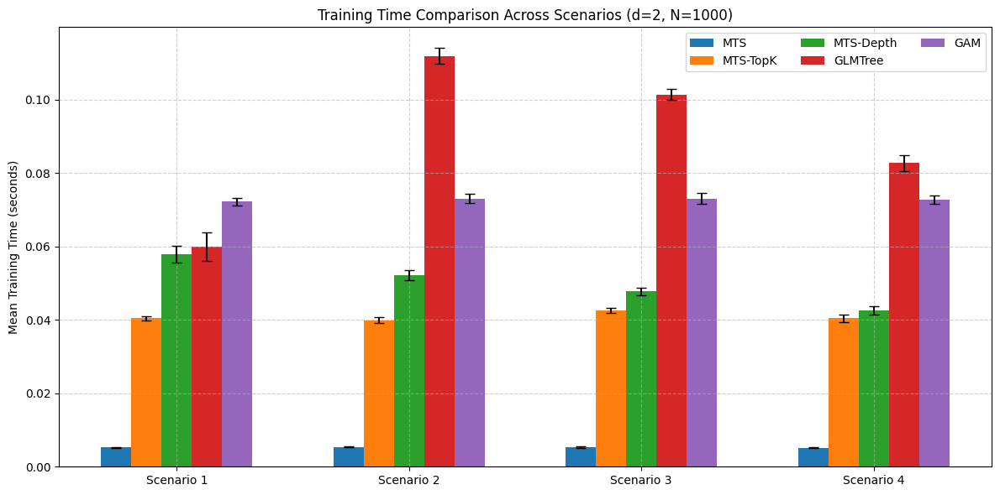

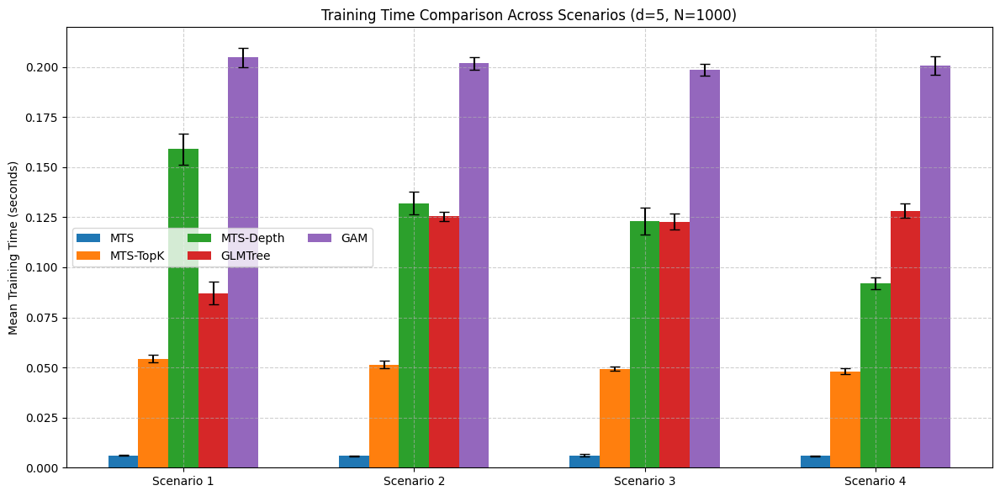

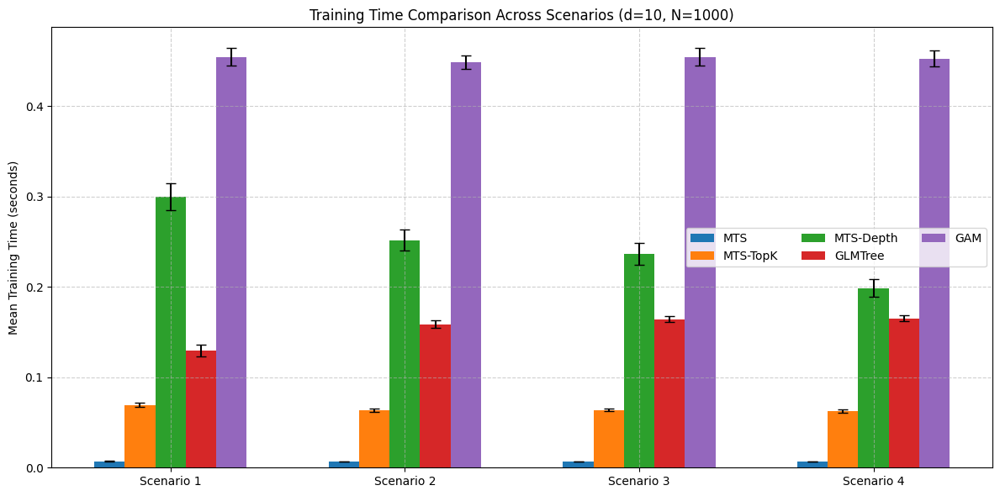

In [9]:
scenarios = ['Scenario 1', 'Scenario 2', 'Scenario 3', 'Scenario 4']
x = np.arange(len(scenarios))
width = 0.13  # slightly smaller since we add GLMTree

model_labels = ['MTS', 'MTS-TopK', 'MTS-Depth', 'GLMTree', 'GAM']

def plot_time_group(all_time_vars, title, width=0.13, legend_ncol=3):
    n_models = len(all_time_vars)
    offsets = (np.arange(n_models) - (n_models - 1) / 2.0) * width

    fig, ax = plt.subplots(1, 1, figsize=(12, 6))
    for j, arr in enumerate(all_time_vars):
        means, cis = compute_ci_stats(arr)  # arr: (4, reps)
        ax.bar(x + offsets[j], means, width, yerr=cis, capsize=4, label=model_labels[j])

    ax.set_title(title)
    ax.set_ylabel('Mean Training Time (seconds)')
    ax.set_xticks(x)
    ax.set_xticklabels(scenarios)
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.legend(ncol=legend_ncol, fontsize=10)
    plt.tight_layout()
    plt.show()

# =========================
# d = 2
# =========================
all_time_vars = [
    tree_time_hist1000,
    tree3_time_hist1000,
    tree4_time_hist1000,
    glmtree_time_hist1000,  # <-- new
    gam_time_hist1000
]
plot_time_group(all_time_vars, 'Training Time Comparison Across Scenarios (d=2, N=1000)', width=width, legend_ncol=3)

# =========================
# d = 5
# =========================
all_time_vars = [
    tree_time_hist10005,
    tree3_time_hist10005,
    tree4_time_hist10005,
    glmtree_time_hist10005,  # <-- new
    gam_time_hist10005
]
plot_time_group(all_time_vars, 'Training Time Comparison Across Scenarios (d=5, N=1000)', width=width, legend_ncol=3)

# =========================
# d = 10
# =========================
all_time_vars = [
    tree_time_hist100010,
    tree3_time_hist100010,
    tree4_time_hist100010,
    glmtree_time_hist100010,  # <-- new
    gam_time_hist100010
]
plot_time_group(all_time_vars, 'Training Time Comparison Across Scenarios (d=10, N=1000)', width=width, legend_ncol=3)

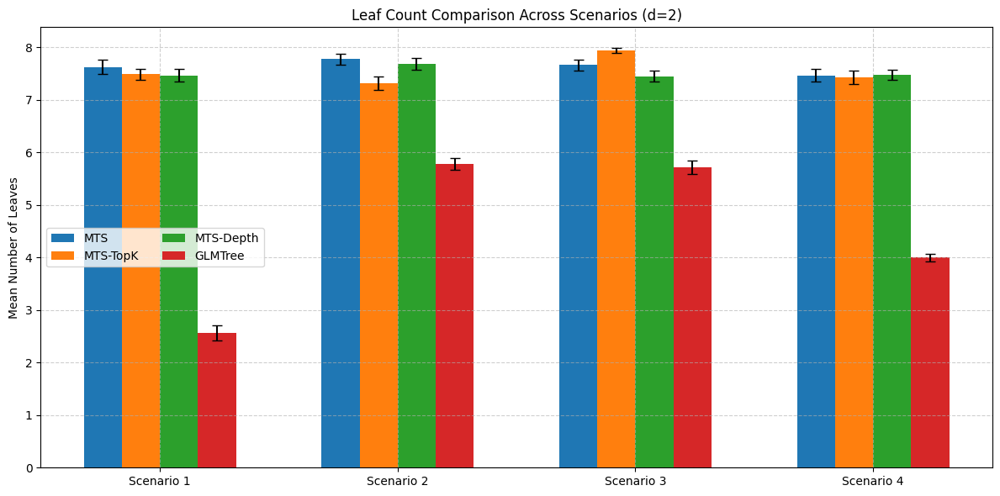

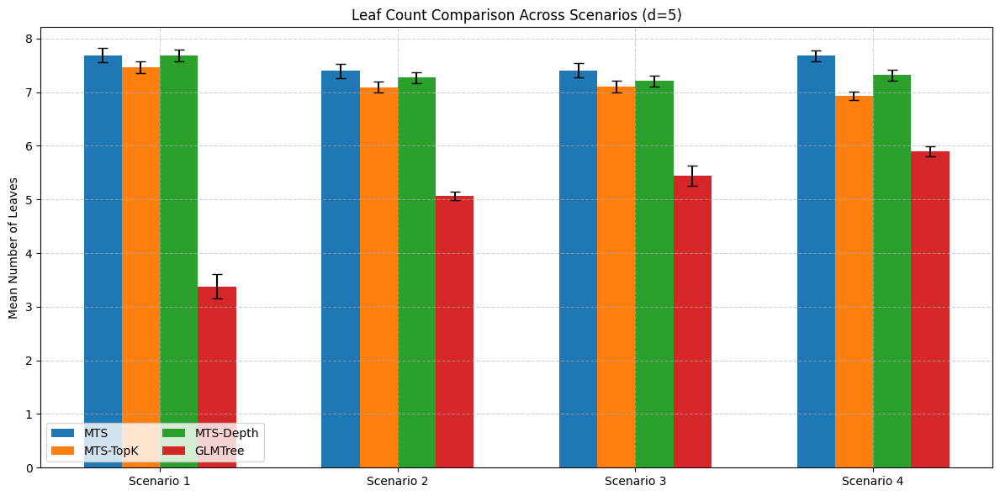

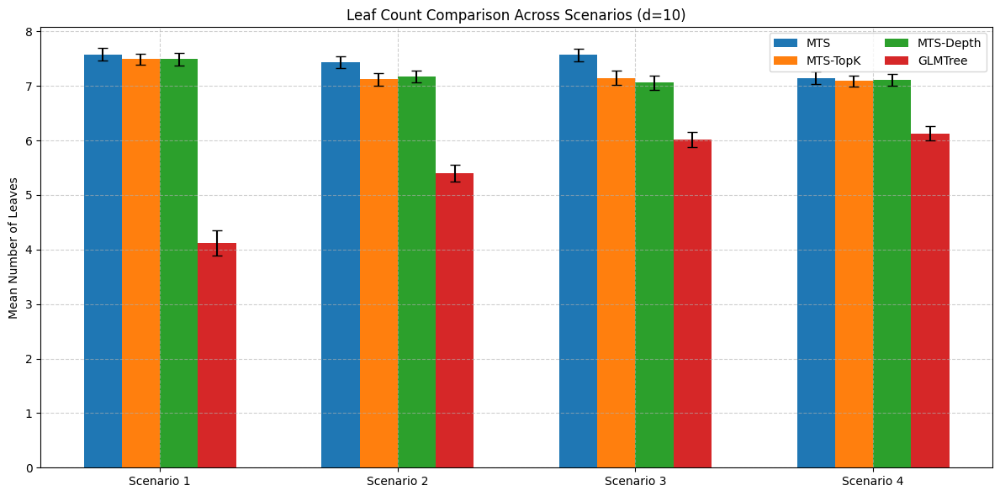

In [17]:
scenarios = ['Scenario 1', 'Scenario 2', 'Scenario 3', 'Scenario 4']
x = np.arange(len(scenarios))
width = 0.16  # slightly smaller since we add GLMTree (4 bars/group)

labels = ['MTS', 'MTS-TopK', 'MTS-Depth', 'GLMTree']
n_models = len(labels)

def plot_leaf_group(leaf_arrays, title, width=0.16, legend_ncol=2):
    n = len(leaf_arrays)
    offsets = (np.arange(n) - (n - 1) / 2.0) * width

    fig, ax = plt.subplots(1, 1, figsize=(12, 6))
    for i, arr in enumerate(leaf_arrays):
        means, cis = compute_ci_stats(arr)  # arr: (4, reps)
        ax.bar(x + offsets[i], means, width, yerr=cis, capsize=4, label=labels[i])

    ax.set_title(title)
    ax.set_ylabel('Mean Number of Leaves')
    ax.set_xticks(x)
    ax.set_xticklabels(scenarios)
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.legend(ncol=legend_ncol, fontsize=10)
    plt.tight_layout()
    plt.show()

# =========================
# d = 2  (arrays shape: 4 x reps)
# =========================
leaf_arrays = [
    leaf_hist1000,          # TreeSpline
    leaf3_hist1000,         # TreeSpline3
    leaf4_hist1000,         # TreeSpline4
    leaf_glmtree_hist1000,  # GLMTree  <-- new
]
plot_leaf_group(leaf_arrays, 'Leaf Count Comparison Across Scenarios (d=2)', width=width, legend_ncol=2)

# =========================
# d = 5
# =========================
leaf_arrays = [
    leaf_hist10005,
    leaf3_hist10005,
    leaf4_hist10005,
    leaf_glmtree_hist10005,  # <-- new
]
plot_leaf_group(leaf_arrays, 'Leaf Count Comparison Across Scenarios (d=5)', width=width, legend_ncol=2)

# =========================
# d = 10
# =========================
leaf_arrays = [
    leaf_hist100010,
    leaf3_hist100010,
    leaf4_hist100010,
    leaf_glmtree_hist100010,  # <-- new
]
plot_leaf_group(leaf_arrays, 'Leaf Count Comparison Across Scenarios (d=10)', width=width, legend_ncol=2)

# Testing with different sample sizes (correlated features)

## N = 50

In [45]:
n_samples = 50
repeats = 100

gam_mse_corr1hist50 = np.zeros((4, repeats))
gam_time_corr1hist50 = np.zeros((4, repeats))

leaf_corr1hist50 = np.zeros((4, repeats))
tree_mse_corr1hist50 = np.zeros((4, repeats))
tree_time_corr1hist50 = np.zeros((4, repeats))

tree3_mse_corr1hist50 = np.zeros((4, repeats))
tree3_time_corr1hist50 = np.zeros((4, repeats))
leaf3_corr1hist50 = np.zeros((4, repeats))

tree4_mse_corr1hist50 = np.zeros((4, repeats))
tree4_time_corr1hist50 = np.zeros((4, repeats))
leaf4_corr1hist50 = np.zeros((4, repeats))

glmtree_mse_corr1hist50 = np.zeros((4, repeats))
glmtree_time_corr1hist50 = np.zeros((4, repeats))
leaf_glmtree_corr1hist50 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, rho=0.1)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=1).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr1hist50[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr1hist50[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr1hist50[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr1hist50[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr1hist50[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr1hist50[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr1hist50[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr1hist50[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr1hist50[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr1hist50[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr1hist50[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glmtree = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=10) 
        glmtree_start = time.time()
        glmtree.fit(X_train_scaled, y_train_scaled)
        glmtree_end = time.time()
        glmtree_time_corr1hist50[i-1, j] = glmtree_end - glmtree_start
        y_pred = glmtree.predict(X_test_scaled)
        glmtree_mse_corr1hist50[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_glmtree_corr1hist50[i-1, j] = glmtree.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 1 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 2 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 3 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 4 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 5 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 6 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 7 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 8 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 9 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 10 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 11 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 12 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 13 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 14 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 15 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 16 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 17 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 18 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 19 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 20 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 21 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 22 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 23 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 24 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 25 done! ---



 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 26 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 27 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 28 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#######


--- Repetition no. 29 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 30 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 31 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 32 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 33 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 34 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 35 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 36 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 37 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 38 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 39 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 40 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 41 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 42 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 43 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 44 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 45 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 46 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 47 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 48 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 49 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 50 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 51 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 52 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 53 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 54 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 55 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |########


--- Repetition no. 56 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 57 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 58 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 59 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 60 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 61 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 62 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 63 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 64 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 65 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 66 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 67 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 68 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 69 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 70 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 71 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 72 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 73 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 74 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 75 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 76 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 77 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 78 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 79 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 80 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 81 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 82 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 83 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 84 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 85 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 86 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 87 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#######


--- Repetition no. 88 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 89 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 90 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 91 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 92 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 93 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 94 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 95 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 96 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 97 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 98 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 99 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


In [46]:
n_samples = 50
repeats = 100

gam_mse_corr3hist50 = np.zeros((4, repeats))
gam_time_corr3hist50 = np.zeros((4, repeats))

leaf_corr3hist50 = np.zeros((4, repeats))
tree_mse_corr3hist50 = np.zeros((4, repeats))
tree_time_corr3hist50 = np.zeros((4, repeats))

tree3_mse_corr3hist50 = np.zeros((4, repeats))
tree3_time_corr3hist50 = np.zeros((4, repeats))
leaf3_corr3hist50 = np.zeros((4, repeats))

tree4_mse_corr3hist50 = np.zeros((4, repeats))
tree4_time_corr3hist50 = np.zeros((4, repeats))
leaf4_corr3hist50 = np.zeros((4, repeats))

glmtree_mse_corr3hist50 = np.zeros((4, repeats))
glmtree_time_corr3hist50 = np.zeros((4, repeats))
leaf_glmtree_corr3hist50 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, rho=0.3)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=1).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr3hist50[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr3hist50[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr3hist50[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr3hist50[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr3hist50[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr3hist50[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr3hist50[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr3hist50[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr3hist50[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr3hist50[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr3hist50[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glmtree = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=10) 
        glmtree_start = time.time()
        glmtree.fit(X_train_scaled, y_train_scaled)
        glmtree_end = time.time()
        glmtree_time_corr3hist50[i-1, j] = glmtree_end - glmtree_start
        y_pred = glmtree.predict(X_test_scaled)
        glmtree_mse_corr3hist50[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_glmtree_corr3hist50[i-1, j] = glmtree.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 1 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 2 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 3 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 4 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 5 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 6 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 7 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 8 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 9 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 10 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 11 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 12 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 13 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 14 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 15 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 16 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 17 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 18 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 19 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 20 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 21 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 22 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 23 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 24 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 25 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 26 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 27 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 28 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 29 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 30 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 31 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 32 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 33 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 34 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 35 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 36 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 37 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 38 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 39 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 40 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 41 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 42 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 43 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 44 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 45 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 46 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 47 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 48 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 49 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 50 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 51 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 52 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 53 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 54 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 55 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 56 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 57 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 58 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 59 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 60 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 61 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 62 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 63 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 64 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 65 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 66 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 67 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 68 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 69 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 70 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 71 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 72 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 73 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 45% (5 of 11) |########


--- Repetition no. 74 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 75 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 76 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 77 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 78 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 79 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 80 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 81 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 82 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 83 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 84 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 85 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 86 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 87 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 88 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 89 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 90 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 91 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 92 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 93 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 94 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 95 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 96 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 97 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 98 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 99 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 100 done! ---



In [47]:
n_samples = 50
repeats = 100

gam_mse_corr5hist50 = np.zeros((4, repeats))
gam_time_corr5hist50 = np.zeros((4, repeats))

leaf_corr5hist50 = np.zeros((4, repeats))
tree_mse_corr5hist50 = np.zeros((4, repeats))
tree_time_corr5hist50 = np.zeros((4, repeats))

tree3_mse_corr5hist50 = np.zeros((4, repeats))
tree3_time_corr5hist50 = np.zeros((4, repeats))
leaf3_corr5hist50 = np.zeros((4, repeats))

tree4_mse_corr5hist50 = np.zeros((4, repeats))
tree4_time_corr5hist50 = np.zeros((4, repeats))
leaf4_corr5hist50 = np.zeros((4, repeats))

glmtree_mse_corr5hist50 = np.zeros((4, repeats))
glmtree_time_corr5hist50 = np.zeros((4, repeats))
leaf_glmtree_corr5hist50 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, rho=0.5)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=1).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr5hist50[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr5hist50[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr5hist50[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr5hist50[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr5hist50[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr5hist50[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr5hist50[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr5hist50[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr5hist50[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr5hist50[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr5hist50[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glmtree = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=10) 
        glmtree_start = time.time()
        glmtree.fit(X_train_scaled, y_train_scaled)
        glmtree_end = time.time()
        glmtree_time_corr5hist50[i-1, j] = glmtree_end - glmtree_start
        y_pred = glmtree.predict(X_test_scaled)
        glmtree_mse_corr5hist50[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_glmtree_corr5hist50[i-1, j] = glmtree.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 1 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 2 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 3 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 4 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 5 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 6 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 7 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 8 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 9 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 10 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 11 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 12 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 13 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 14 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 15 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 16 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 17 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 18 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 19 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 20 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 21 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 22 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 23 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 24 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 25 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 26 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 27 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 28 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 29 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 30 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 31 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 32 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 33 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 34 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 35 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 36 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 37 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 38 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 39 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 40 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 41 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 42 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 43 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 44 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 45 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 46 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 47 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 48 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 49 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 50 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 51 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 52 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 53 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 54 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 55 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 56 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 57 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 58 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 59 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 60 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 61 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 62 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 63 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 64 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 65 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 66 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 67 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 68 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 69 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 70 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 71 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 72 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 73 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 74 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 75 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 76 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 77 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 78 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 79 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 80 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 81 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 82 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 83 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 84 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 85 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 86 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 87 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 88 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 89 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 90 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 91 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 92 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 93 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 94 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 95 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 96 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 97 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 98 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 99 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


## N = 200

In [48]:
n_samples = 200
repeats = 100

gam_mse_corr1hist200 = np.zeros((4, repeats))
gam_time_corr1hist200 = np.zeros((4, repeats))

leaf_corr1hist200 = np.zeros((4, repeats))
tree_mse_corr1hist200 = np.zeros((4, repeats))
tree_time_corr1hist200 = np.zeros((4, repeats))

tree3_mse_corr1hist200 = np.zeros((4, repeats))
tree3_time_corr1hist200 = np.zeros((4, repeats))
leaf3_corr1hist200 = np.zeros((4, repeats))

tree4_mse_corr1hist200 = np.zeros((4, repeats))
tree4_time_corr1hist200 = np.zeros((4, repeats))
leaf4_corr1hist200 = np.zeros((4, repeats))

glmtree_mse_corr1hist200 = np.zeros((4, repeats))
glmtree_time_corr1hist200 = np.zeros((4, repeats))
leaf_glmtree_corr1hist200 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, rho=0.1)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=1).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr1hist200[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr1hist200[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr1hist200[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr1hist200[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr1hist200[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr1hist200[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr1hist200[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr1hist200[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr1hist200[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr1hist200[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr1hist200[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glmtree = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=10) 
        glmtree_start = time.time()
        glmtree.fit(X_train_scaled, y_train_scaled)
        glmtree_end = time.time()
        glmtree_time_corr1hist200[i-1, j] = glmtree_end - glmtree_start
        y_pred = glmtree.predict(X_test_scaled)
        glmtree_mse_corr1hist200[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_glmtree_corr1hist200[i-1, j] = glmtree.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 1 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 2 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 3 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 4 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 5 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 6 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 7 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 8 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 9 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 10 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 11 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 12 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 13 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 14 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 15 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 16 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 17 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 18 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 19 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 20 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 21 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 22 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 23 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 24 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 25 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 26 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 27 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 28 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 29 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 30 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 31 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 32 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 33 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 34 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 35 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 36 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 37 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 38 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 39 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 40 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 41 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 42 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 43 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 44 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 45 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 46 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 47 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 48 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 49 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 50 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 51 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 52 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 53 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 54 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 55 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 56 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 57 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |########


--- Repetition no. 58 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 59 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 60 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 61 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 62 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 63 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 64 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 65 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 66 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 67 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 68 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 69 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 70 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 71 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 72 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 73 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 74 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 75 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 76 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 77 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 78 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 79 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 80 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 81 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 82 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 83 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 84 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 85 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 86 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 87 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 88 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 89 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 90 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 91 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 92 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 93 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 94 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 95 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 96 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 97 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 98 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 99 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


In [49]:
n_samples = 200
repeats = 100

gam_mse_corr3hist200 = np.zeros((4, repeats))
gam_time_corr3hist200 = np.zeros((4, repeats))

leaf_corr3hist200 = np.zeros((4, repeats))
tree_mse_corr3hist200 = np.zeros((4, repeats))
tree_time_corr3hist200 = np.zeros((4, repeats))

tree3_mse_corr3hist200 = np.zeros((4, repeats))
tree3_time_corr3hist200 = np.zeros((4, repeats))
leaf3_corr3hist200 = np.zeros((4, repeats))

tree4_mse_corr3hist200 = np.zeros((4, repeats))
tree4_time_corr3hist200 = np.zeros((4, repeats))
leaf4_corr3hist200 = np.zeros((4, repeats))

glmtree_mse_corr3hist200 = np.zeros((4, repeats))
glmtree_time_corr3hist200 = np.zeros((4, repeats))
leaf_glmtree_corr3hist200 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, rho=0.3)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=1).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr3hist200[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr3hist200[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr3hist200[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr3hist200[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr3hist200[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr3hist200[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr3hist200[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr3hist200[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr3hist200[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr3hist200[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr3hist200[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glmtree = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=10) 
        glmtree_start = time.time()
        glmtree.fit(X_train_scaled, y_train_scaled)
        glmtree_end = time.time()
        glmtree_time_corr3hist200[i-1, j] = glmtree_end - glmtree_start
        y_pred = glmtree.predict(X_test_scaled)
        glmtree_mse_corr3hist200[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_glmtree_corr3hist200[i-1, j] = glmtree.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 1 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 2 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 3 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 4 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 5 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 6 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 7 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 8 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 9 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 10 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 11 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 12 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 13 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 14 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 15 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 16 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 17 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 18 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 19 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 20 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 21 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 22 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 23 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 24 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 25 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 26 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 27 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 28 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 29 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 30 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 31 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 32 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 33 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 34 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 35 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 36 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 37 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 38 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 39 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 40 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 41 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 42 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 43 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 44 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 45 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 46 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 47 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 48 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 49 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 50 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 51 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 52 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 53 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 54 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 55 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 56 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 57 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 58 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 59 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 60 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 61 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 62 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 63 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 64 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 65 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 66 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 67 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 68 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 69 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 70 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 71 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 72 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 73 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 74 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 75 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 76 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 77 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 78 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 79 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 80 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 81 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 82 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 83 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 84 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 85 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 86 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 87 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 88 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 89 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 90 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 91 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 92 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 93 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 94 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 95 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 96 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 97 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 98 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 99 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


In [50]:
n_samples = 200
repeats = 100

gam_mse_corr5hist200 = np.zeros((4, repeats))
gam_time_corr5hist200 = np.zeros((4, repeats))

leaf_corr5hist200 = np.zeros((4, repeats))
tree_mse_corr5hist200 = np.zeros((4, repeats))
tree_time_corr5hist200 = np.zeros((4, repeats))

tree3_mse_corr5hist200 = np.zeros((4, repeats))
tree3_time_corr5hist200 = np.zeros((4, repeats))
leaf3_corr5hist200 = np.zeros((4, repeats))

tree4_mse_corr5hist200 = np.zeros((4, repeats))
tree4_time_corr5hist200 = np.zeros((4, repeats))
leaf4_corr5hist200 = np.zeros((4, repeats))

glmtree_mse_corr5hist200 = np.zeros((4, repeats))
glmtree_time_corr5hist200 = np.zeros((4, repeats))
leaf_glmtree_corr5hist200 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, rho=0.5)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=1).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr5hist200[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr5hist200[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr5hist200[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr5hist200[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr5hist200[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr5hist200[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr5hist200[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr5hist200[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr5hist200[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr5hist200[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr5hist200[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glmtree = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=10) 
        glmtree_start = time.time()
        glmtree.fit(X_train_scaled, y_train_scaled)
        glmtree_end = time.time()
        glmtree_time_corr5hist200[i-1, j] = glmtree_end - glmtree_start
        y_pred = glmtree.predict(X_test_scaled)
        glmtree_mse_corr5hist200[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_glmtree_corr5hist200[i-1, j] = glmtree.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 1 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 2 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 3 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 4 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 5 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 6 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 7 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 8 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 9 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 10 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 11 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 12 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 13 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 14 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 15 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 16 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 17 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 18 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 19 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 20 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 21 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 22 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 23 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 24 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 25 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 26 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 27 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 28 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 29 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 30 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 31 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 32 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 33 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 34 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 35 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 36 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 37 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 38 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 39 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 40 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 41 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 42 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 43 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 44 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 45 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 46 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 47 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 48 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 49 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 50 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 51 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 52 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 53 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 54 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 55 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 56 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 57 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 58 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 59 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 60 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 61 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 62 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 63 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 64 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 65 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 66 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 67 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 68 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 69 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 70 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 71 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 72 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 73 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 74 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 75 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 76 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 77 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 78 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 79 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 80 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 81 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 82 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 83 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 84 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 85 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 86 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 87 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 88 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 89 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 90 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 91 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 92 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 93 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 94 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 95 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 96 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |#######


--- Repetition no. 97 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 98 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 99 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


## N = 1000

In [51]:
n_samples = 1000
repeats = 100

gam_mse_corr1hist1000 = np.zeros((4, repeats))
gam_time_corr1hist1000 = np.zeros((4, repeats))

leaf_corr1hist1000 = np.zeros((4, repeats))
tree_mse_corr1hist1000 = np.zeros((4, repeats))
tree_time_corr1hist1000 = np.zeros((4, repeats))

tree3_mse_corr1hist1000 = np.zeros((4, repeats))
tree3_time_corr1hist1000 = np.zeros((4, repeats))
leaf3_corr1hist1000 = np.zeros((4, repeats))

tree4_mse_corr1hist1000 = np.zeros((4, repeats))
tree4_time_corr1hist1000 = np.zeros((4, repeats))
leaf4_corr1hist1000 = np.zeros((4, repeats))

glmtree_mse_corr1hist1000 = np.zeros((4, repeats))
glmtree_time_corr1hist1000 = np.zeros((4, repeats))
leaf_glmtree_corr1hist1000 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, rho=0.1)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=1).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr1hist1000[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr1hist1000[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr1hist1000[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr1hist1000[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr1hist1000[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr1hist1000[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr1hist1000[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr1hist1000[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr1hist1000[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr1hist1000[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr1hist1000[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glmtree = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=10) 
        glmtree_start = time.time()
        glmtree.fit(X_train_scaled, y_train_scaled)
        glmtree_end = time.time()
        glmtree_time_corr1hist1000[i-1, j] = glmtree_end - glmtree_start
        y_pred = glmtree.predict(X_test_scaled)
        glmtree_mse_corr1hist1000[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_glmtree_corr1hist1000[i-1, j] = glmtree.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 1 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 2 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 3 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 4 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 5 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 6 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 7 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 8 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 9 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 10 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 11 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 12 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 13 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 14 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 15 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 16 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 17 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 18 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 19 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 20 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 21 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 22 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 23 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 24 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 25 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 26 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 27 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 28 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 29 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 30 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 31 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 32 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 33 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 34 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 35 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 36 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 37 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 38 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 39 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 40 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 41 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 42 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 43 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 44 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 45 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 46 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 47 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 48 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 49 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 50 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 51 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 52 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 53 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 54 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 55 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 56 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 57 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 58 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 59 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 60 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 61 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 62 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 63 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 64 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 65 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 66 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 67 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 68 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 69 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 70 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 71 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 72 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 73 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 74 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 75 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 76 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 77 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 78 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 79 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 80 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 81 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 82 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 83 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 84 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 85 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 86 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 87 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 88 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 89 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 90 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 91 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 92 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 93 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 94 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 95 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 96 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 97 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 98 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 99 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


In [52]:
n_samples = 1000
repeats = 100

gam_mse_corr3hist1000 = np.zeros((4, repeats))
gam_time_corr3hist1000 = np.zeros((4, repeats))

leaf_corr3hist1000 = np.zeros((4, repeats))
tree_mse_corr3hist1000 = np.zeros((4, repeats))
tree_time_corr3hist1000 = np.zeros((4, repeats))

tree3_mse_corr3hist1000 = np.zeros((4, repeats))
tree3_time_corr3hist1000 = np.zeros((4, repeats))
leaf3_corr3hist1000 = np.zeros((4, repeats))

tree4_mse_corr3hist1000 = np.zeros((4, repeats))
tree4_time_corr3hist1000 = np.zeros((4, repeats))
leaf4_corr3hist1000 = np.zeros((4, repeats))

glmtree_mse_corr3hist1000 = np.zeros((4, repeats))
glmtree_time_corr3hist1000 = np.zeros((4, repeats))
leaf_glmtree_corr3hist1000 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, rho=0.3)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=1).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr3hist1000[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr3hist1000[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr3hist1000[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr3hist1000[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr3hist1000[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr3hist1000[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr3hist1000[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr3hist1000[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr3hist1000[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr3hist1000[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr3hist1000[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glmtree = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=10) 
        glmtree_start = time.time()
        glmtree.fit(X_train_scaled, y_train_scaled)
        glmtree_end = time.time()
        glmtree_time_corr3hist1000[i-1, j] = glmtree_end - glmtree_start
        y_pred = glmtree.predict(X_test_scaled)
        glmtree_mse_corr3hist1000[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_glmtree_corr3hist1000[i-1, j] = glmtree.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 1 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 2 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 3 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 4 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 5 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 6 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 7 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 8 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 9 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 10 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 11 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 12 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 13 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 14 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 15 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 16 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 17 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 18 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 19 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 20 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 21 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 22 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 23 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 24 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 25 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 26 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 27 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 28 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 29 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 30 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 31 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 32 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 33 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 34 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 35 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 36 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 37 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 38 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 39 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 40 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 41 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 42 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 43 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 44 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 45 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 46 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 47 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 48 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 49 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 50 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 51 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 52 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 53 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 54 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 55 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 56 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 57 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 58 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 59 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 60 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 61 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 62 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 63 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 64 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 65 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 66 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 67 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 68 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 69 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 70 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 71 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 72 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 73 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 74 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 75 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 76 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 77 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 78 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 79 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 80 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 81 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 82 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 83 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 84 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 85 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 86 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 87 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 88 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 89 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 90 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 91 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 92 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 93 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 94 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 95 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 96 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 97 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 98 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 99 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


In [53]:
n_samples = 1000
repeats = 100

gam_mse_corr5hist1000 = np.zeros((4, repeats))
gam_time_corr5hist1000 = np.zeros((4, repeats))

leaf_corr5hist1000 = np.zeros((4, repeats))
tree_mse_corr5hist1000 = np.zeros((4, repeats))
tree_time_corr5hist1000 = np.zeros((4, repeats))

tree3_mse_corr5hist1000 = np.zeros((4, repeats))
tree3_time_corr5hist1000 = np.zeros((4, repeats))
leaf3_corr5hist1000 = np.zeros((4, repeats))

tree4_mse_corr5hist1000 = np.zeros((4, repeats))
tree4_time_corr5hist1000 = np.zeros((4, repeats))
leaf4_corr5hist1000 = np.zeros((4, repeats))

glmtree_mse_corr5hist1000 = np.zeros((4, repeats))
glmtree_time_corr5hist1000 = np.zeros((4, repeats))
leaf_glmtree_corr5hist1000 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, rho=0.5)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=1).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr5hist1000[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr5hist1000[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr5hist1000[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr5hist1000[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr5hist1000[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr5hist1000[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr5hist1000[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr5hist1000[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr5hist1000[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr5hist1000[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr5hist1000[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glmtree = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=10) 
        glmtree_start = time.time()
        glmtree.fit(X_train_scaled, y_train_scaled)
        glmtree_end = time.time()
        glmtree_time_corr5hist1000[i-1, j] = glmtree_end - glmtree_start
        y_pred = glmtree.predict(X_test_scaled)
        glmtree_mse_corr5hist1000[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_glmtree_corr5hist1000[i-1, j] = glmtree.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 1 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 2 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 3 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 4 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 5 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 6 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 7 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 8 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 9 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 10 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 11 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 12 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 13 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 14 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 15 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 16 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 17 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 18 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 19 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 20 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 21 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 22 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 23 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 24 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 25 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 26 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 27 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 28 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 29 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 30 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 31 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 32 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 33 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 34 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 35 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 36 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 37 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 38 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 39 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 40 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 41 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 42 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 43 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 44 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 45 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 46 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 47 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 48 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 49 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 50 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 51 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 52 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 53 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 54 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 55 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 56 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 57 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 58 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 59 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 60 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 61 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 62 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 63 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 64 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 65 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 66 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 67 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 68 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 69 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 70 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 71 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 72 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 73 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 74 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 75 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 76 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 77 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 78 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 79 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 80 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 81 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 82 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 83 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 84 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 85 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 86 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 87 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 88 done! ---



  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 89 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 90 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 91 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 92 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 93 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 94 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 95 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 96 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 97 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 98 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 99 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |        


--- Repetition no. 100 done! ---



## N = 10000

In [54]:
n_samples = 10000
repeats = 100

gam_mse_corr1hist10000 = np.zeros((4, repeats))
gam_time_corr1hist10000 = np.zeros((4, repeats))

leaf_corr1hist10000 = np.zeros((4, repeats))
tree_mse_corr1hist10000 = np.zeros((4, repeats))
tree_time_corr1hist10000 = np.zeros((4, repeats))

tree3_mse_corr1hist10000 = np.zeros((4, repeats))
tree3_time_corr1hist10000 = np.zeros((4, repeats))
leaf3_corr1hist10000 = np.zeros((4, repeats))

tree4_mse_corr1hist10000 = np.zeros((4, repeats))
tree4_time_corr1hist10000 = np.zeros((4, repeats))
leaf4_corr1hist10000 = np.zeros((4, repeats))

glmtree_mse_corr1hist10000 = np.zeros((4, repeats))
glmtree_time_corr1hist10000 = np.zeros((4, repeats))
leaf_glmtree_corr1hist10000 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, rho=0.1)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=1).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr1hist10000[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr1hist10000[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr1hist10000[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr1hist10000[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr1hist10000[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr1hist10000[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr1hist10000[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr1hist10000[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr1hist10000[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr1hist10000[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr1hist10000[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glmtree = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=10) 
        glmtree_start = time.time()
        glmtree.fit(X_train_scaled, y_train_scaled)
        glmtree_end = time.time()
        glmtree_time_corr1hist10000[i-1, j] = glmtree_end - glmtree_start
        y_pred = glmtree.predict(X_test_scaled)
        glmtree_mse_corr1hist10000[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_glmtree_corr1hist10000[i-1, j] = glmtree.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  -


--- Repetition no. 1 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 2 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 3 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 4 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 5 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 6 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 7 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 8 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 9 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 10 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 11 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 12 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 13 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 14 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 15 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 16 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 17 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 18 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 19 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 20 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 21 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 22 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 23 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 24 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 25 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 26 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 27 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 28 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 29 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 30 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 31 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 32 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 33 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 34 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 35 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 36 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 37 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 38 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 39 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 40 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 41 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 42 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 43 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 44 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 45 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 46 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 47 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 48 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 49 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 50 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 51 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 52 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 53 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 54 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 55 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 56 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 57 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 58 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 59 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 60 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 61 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 62 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 63 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 64 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 65 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 66 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 67 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 68 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 69 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 70 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 71 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 72 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 73 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 74 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 75 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 76 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 77 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 78 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 79 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 80 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 81 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 82 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 83 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 84 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 85 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 86 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 87 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 88 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 89 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 90 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 91 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 92 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 93 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 94 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 95 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 96 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 97 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 98 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 99 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


In [55]:
n_samples = 10000
repeats = 100

gam_mse_corr3hist10000 = np.zeros((4, repeats))
gam_time_corr3hist10000 = np.zeros((4, repeats))

leaf_corr3hist10000 = np.zeros((4, repeats))
tree_mse_corr3hist10000 = np.zeros((4, repeats))
tree_time_corr3hist10000 = np.zeros((4, repeats))

tree3_mse_corr3hist10000 = np.zeros((4, repeats))
tree3_time_corr3hist10000 = np.zeros((4, repeats))
leaf3_corr3hist10000 = np.zeros((4, repeats))

tree4_mse_corr3hist10000 = np.zeros((4, repeats))
tree4_time_corr3hist10000 = np.zeros((4, repeats))
leaf4_corr3hist10000 = np.zeros((4, repeats))

glmtree_mse_corr3hist10000 = np.zeros((4, repeats))
glmtree_time_corr3hist10000 = np.zeros((4, repeats))
leaf_glmtree_corr3hist10000 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, rho=0.3)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=1).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr3hist10000[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr3hist10000[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr3hist10000[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr3hist10000[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr3hist10000[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr3hist10000[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr3hist10000[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr3hist10000[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr3hist10000[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr3hist10000[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr3hist10000[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glmtree = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=10) 
        glmtree_start = time.time()
        glmtree.fit(X_train_scaled, y_train_scaled)
        glmtree_end = time.time()
        glmtree_time_corr3hist10000[i-1, j] = glmtree_end - glmtree_start
        y_pred = glmtree.predict(X_test_scaled)
        glmtree_mse_corr3hist10000[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_glmtree_corr3hist10000[i-1, j] = glmtree.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  -


--- Repetition no. 1 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 2 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 3 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 4 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 5 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 6 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 7 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 8 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 9 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 10 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 11 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 12 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 13 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 14 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 15 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 16 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 17 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 18 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 19 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 20 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 21 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 22 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 23 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 24 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 25 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 26 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 27 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 28 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 29 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 30 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 31 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 32 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 33 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 34 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 35 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 36 done! ---



 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 37 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 38 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 39 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 40 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 41 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 42 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 43 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 44 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 45 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 46 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 47 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 48 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 49 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 50 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 51 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 52 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 53 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 54 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 55 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 56 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 57 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 58 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 59 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 60 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 61 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 62 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 63 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 64 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 65 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 66 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 67 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 68 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 69 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 70 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 71 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 72 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 73 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 74 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 75 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 76 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 77 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 78 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 79 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 80 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 81 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 82 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 83 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 84 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 85 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 86 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 87 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 88 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 89 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 90 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 91 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 92 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 93 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 94 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 95 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 96 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 97 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 98 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 99 done! ---



 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


In [56]:
n_samples = 10000
repeats = 100

gam_mse_corr5hist10000 = np.zeros((4, repeats))
gam_time_corr5hist10000 = np.zeros((4, repeats))

leaf_corr5hist10000 = np.zeros((4, repeats))
tree_mse_corr5hist10000 = np.zeros((4, repeats))
tree_time_corr5hist10000 = np.zeros((4, repeats))

tree3_mse_corr5hist10000 = np.zeros((4, repeats))
tree3_time_corr5hist10000 = np.zeros((4, repeats))
leaf3_corr5hist10000 = np.zeros((4, repeats))

tree4_mse_corr5hist10000 = np.zeros((4, repeats))
tree4_time_corr5hist10000 = np.zeros((4, repeats))
leaf4_corr5hist10000 = np.zeros((4, repeats))

glmtree_mse_corr5hist10000 = np.zeros((4, repeats))
glmtree_time_corr5hist10000 = np.zeros((4, repeats))
leaf_glmtree_corr5hist10000 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, rho=0.5)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=1).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr5hist10000[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr5hist10000[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr5hist10000[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr5hist10000[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr5hist10000[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr5hist10000[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr5hist10000[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr5hist10000[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr5hist10000[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr5hist10000[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr5hist10000[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glmtree = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=10) 
        glmtree_start = time.time()
        glmtree.fit(X_train_scaled, y_train_scaled)
        glmtree_end = time.time()
        glmtree_time_corr5hist10000[i-1, j] = glmtree_end - glmtree_start
        y_pred = glmtree.predict(X_test_scaled)
        glmtree_mse_corr5hist10000[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_glmtree_corr5hist10000[i-1, j] = glmtree.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  -


--- Repetition no. 1 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 2 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 3 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 4 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 5 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 6 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 7 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 8 done! ---



 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 9 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 10 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 11 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 12 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 13 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 14 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 15 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 16 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 17 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 18 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 19 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 20 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 21 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 22 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 23 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 24 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 25 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 26 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 27 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 28 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 29 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 30 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 31 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 32 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 33 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 34 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 35 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 36 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 37 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 38 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 39 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 40 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 41 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 42 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 43 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 44 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 45 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 46 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 47 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 48 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 49 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 50 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 51 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 52 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 53 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 54 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 55 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 56 done! ---



 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 57 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 58 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 59 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 60 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 61 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 62 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 63 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 64 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 65 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 66 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 67 done! ---



 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 68 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 69 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 70 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 71 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 72 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 73 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 74 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 75 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 76 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 77 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 78 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 79 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 80 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 81 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 82 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 83 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 84 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 85 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 86 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 87 done! ---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 88 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 89 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 90 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 91 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 92 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 93 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 94 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 95 done! ---



 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 96 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 97 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 98 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 99 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


## Saving, Loading & Plotting

In [59]:
np.save('nparrs/gam_mse_corr1hist50.npy', gam_mse_corr1hist50)
np.save('nparrs/gam_time_corr1hist50.npy', gam_time_corr1hist50)
np.save('nparrs/tree_mse_corr1hist50.npy', tree_mse_corr1hist50)
np.save('nparrs/tree_time_corr1hist50.npy', tree_time_corr1hist50)
np.save('nparrs/leaf_corr1hist50.npy', leaf_corr1hist50)
np.save('nparrs/tree3_mse_corr1hist50.npy', tree3_mse_corr1hist50)
np.save('nparrs/tree3_time_corr1hist50.npy', tree3_time_corr1hist50)
np.save('nparrs/leaf3_corr1hist50.npy', leaf3_corr1hist50)
np.save('nparrs/tree4_mse_corr1hist50.npy', tree4_mse_corr1hist50)
np.save('nparrs/tree4_time_corr1hist50.npy', tree4_time_corr1hist50)
np.save('nparrs/leaf4_corr1hist50.npy', leaf4_corr1hist50)
np.save('nparrs/glmtree_mse_corr1hist50.npy', glmtree_mse_corr1hist50)
np.save('nparrs/glmtree_time_corr1hist50.npy', glmtree_time_corr1hist50)
np.save('nparrs/leaf_glmtree_corr1hist50.npy', leaf_glmtree_corr1hist50)

np.save('nparrs/gam_mse_corr3hist50.npy', gam_mse_corr3hist50)
np.save('nparrs/gam_time_corr3hist50.npy', gam_time_corr3hist50)
np.save('nparrs/tree_mse_corr3hist50.npy', tree_mse_corr3hist50)
np.save('nparrs/tree_time_corr3hist50.npy', tree_time_corr3hist50)
np.save('nparrs/leaf_corr3hist50.npy', leaf_corr3hist50)
np.save('nparrs/tree3_mse_corr3hist50.npy', tree3_mse_corr3hist50)
np.save('nparrs/tree3_time_corr3hist50.npy', tree3_time_corr3hist50)
np.save('nparrs/leaf3_corr3hist50.npy', leaf3_corr3hist50)
np.save('nparrs/tree4_mse_corr3hist50.npy', tree4_mse_corr3hist50)
np.save('nparrs/tree4_time_corr3hist50.npy', tree4_time_corr3hist50)
np.save('nparrs/leaf4_corr3hist50.npy', leaf4_corr3hist50)
np.save('nparrs/glmtree_mse_corr3hist50.npy', glmtree_mse_corr3hist50)
np.save('nparrs/glmtree_time_corr3hist50.npy', glmtree_time_corr3hist50)
np.save('nparrs/leaf_glmtree_corr3hist50.npy', leaf_glmtree_corr3hist50)

np.save('nparrs/gam_mse_corr5hist50.npy', gam_mse_corr5hist50)
np.save('nparrs/gam_time_corr5hist50.npy', gam_time_corr5hist50)
np.save('nparrs/tree_mse_corr5hist50.npy', tree_mse_corr5hist50)
np.save('nparrs/tree_time_corr5hist50.npy', tree_time_corr5hist50)
np.save('nparrs/leaf_corr5hist50.npy', leaf_corr5hist50)
np.save('nparrs/tree3_mse_corr5hist50.npy', tree3_mse_corr5hist50)
np.save('nparrs/tree3_time_corr5hist50.npy', tree3_time_corr5hist50)
np.save('nparrs/leaf3_corr5hist50.npy', leaf3_corr5hist50)
np.save('nparrs/tree4_mse_corr5hist50.npy', tree4_mse_corr5hist50)
np.save('nparrs/tree4_time_corr5hist50.npy', tree4_time_corr5hist50)
np.save('nparrs/leaf4_corr5hist50.npy', leaf4_corr5hist50)
np.save('nparrs/glmtree_mse_corr5hist50.npy', glmtree_mse_corr5hist50)
np.save('nparrs/glmtree_time_corr5hist50.npy', glmtree_time_corr5hist50)
np.save('nparrs/leaf_glmtree_corr5hist50.npy', leaf_glmtree_corr5hist50)


# ------------------------------------------------------------------------------

np.save('nparrs/gam_mse_corr1hist200.npy', gam_mse_corr1hist200)
np.save('nparrs/gam_time_corr1hist200.npy', gam_time_corr1hist200)
np.save('nparrs/tree_mse_corr1hist200.npy', tree_mse_corr1hist200)
np.save('nparrs/tree_time_corr1hist200.npy', tree_time_corr1hist200)
np.save('nparrs/leaf_corr1hist200.npy', leaf_corr1hist200)
np.save('nparrs/tree3_mse_corr1hist200.npy', tree3_mse_corr1hist200)
np.save('nparrs/tree3_time_corr1hist200.npy', tree3_time_corr1hist200)
np.save('nparrs/leaf3_corr1hist200.npy', leaf3_corr1hist200)
np.save('nparrs/tree4_mse_corr1hist200.npy', tree4_mse_corr1hist200)
np.save('nparrs/tree4_time_corr1hist200.npy', tree4_time_corr1hist200)
np.save('nparrs/leaf4_corr1hist200.npy', leaf4_corr1hist200)
np.save('nparrs/glmtree_mse_corr1hist200.npy', glmtree_mse_corr1hist200)
np.save('nparrs/glmtree_time_corr1hist200.npy', glmtree_time_corr1hist200)
np.save('nparrs/leaf_glmtree_corr1hist200.npy', leaf_glmtree_corr1hist200)

np.save('nparrs/gam_mse_corr3hist200.npy', gam_mse_corr3hist200)
np.save('nparrs/gam_time_corr3hist200.npy', gam_time_corr3hist200)
np.save('nparrs/tree_mse_corr3hist200.npy', tree_mse_corr3hist200)
np.save('nparrs/tree_time_corr3hist200.npy', tree_time_corr3hist200)
np.save('nparrs/leaf_corr3hist200.npy', leaf_corr3hist200)
np.save('nparrs/tree3_mse_corr3hist200.npy', tree3_mse_corr3hist200)
np.save('nparrs/tree3_time_corr3hist200.npy', tree3_time_corr3hist200)
np.save('nparrs/leaf3_corr3hist200.npy', leaf3_corr3hist200)
np.save('nparrs/tree4_mse_corr3hist200.npy', tree4_mse_corr3hist200)
np.save('nparrs/tree4_time_corr3hist200.npy', tree4_time_corr3hist200)
np.save('nparrs/leaf4_corr3hist200.npy', leaf4_corr3hist200)
np.save('nparrs/glmtree_mse_corr3hist200.npy', glmtree_mse_corr3hist200)
np.save('nparrs/glmtree_time_corr3hist200.npy', glmtree_time_corr3hist200)
np.save('nparrs/leaf_glmtree_corr3hist200.npy', leaf_glmtree_corr3hist200)

np.save('nparrs/gam_mse_corr5hist200.npy', gam_mse_corr5hist200)
np.save('nparrs/gam_time_corr5hist200.npy', gam_time_corr5hist200)
np.save('nparrs/tree_mse_corr5hist200.npy', tree_mse_corr5hist200)
np.save('nparrs/tree_time_corr5hist200.npy', tree_time_corr5hist200)
np.save('nparrs/leaf_corr5hist200.npy', leaf_corr5hist200)
np.save('nparrs/tree3_mse_corr5hist200.npy', tree3_mse_corr5hist200)
np.save('nparrs/tree3_time_corr5hist200.npy', tree3_time_corr5hist200)
np.save('nparrs/leaf3_corr5hist200.npy', leaf3_corr5hist200)
np.save('nparrs/tree4_mse_corr5hist200.npy', tree4_mse_corr5hist200)
np.save('nparrs/tree4_time_corr5hist200.npy', tree4_time_corr5hist200)
np.save('nparrs/leaf4_corr5hist200.npy', leaf4_corr5hist200)
np.save('nparrs/glmtree_mse_corr5hist200.npy', glmtree_mse_corr5hist200)
np.save('nparrs/glmtree_time_corr5hist200.npy', glmtree_time_corr5hist200)
np.save('nparrs/leaf_glmtree_corr5hist200.npy', leaf_glmtree_corr5hist200)

# ------------------------------------------------------------------------------

np.save('nparrs/gam_mse_corr1hist1000.npy', gam_mse_corr1hist1000)
np.save('nparrs/gam_time_corr1hist1000.npy', gam_time_corr1hist1000)
np.save('nparrs/tree_mse_corr1hist1000.npy', tree_mse_corr1hist1000)
np.save('nparrs/tree_time_corr1hist1000.npy', tree_time_corr1hist1000)
np.save('nparrs/leaf_corr1hist1000.npy', leaf_corr1hist1000)
np.save('nparrs/tree3_mse_corr1hist1000.npy', tree3_mse_corr1hist1000)
np.save('nparrs/tree3_time_corr1hist1000.npy', tree3_time_corr1hist1000)
np.save('nparrs/leaf3_corr1hist1000.npy', leaf3_corr1hist1000)
np.save('nparrs/tree4_mse_corr1hist1000.npy', tree4_mse_corr1hist1000)
np.save('nparrs/tree4_time_corr1hist1000.npy', tree4_time_corr1hist1000)
np.save('nparrs/leaf4_corr1hist1000.npy', leaf4_corr1hist1000)
np.save('nparrs/glmtree_mse_corr1hist1000.npy', glmtree_mse_corr1hist1000)
np.save('nparrs/glmtree_time_corr1hist1000.npy', glmtree_time_corr1hist1000)
np.save('nparrs/leaf_glmtree_corr1hist1000.npy', leaf_glmtree_corr1hist1000)

np.save('nparrs/gam_mse_corr3hist1000.npy', gam_mse_corr3hist1000)
np.save('nparrs/gam_time_corr3hist1000.npy', gam_time_corr3hist1000)
np.save('nparrs/tree_mse_corr3hist1000.npy', tree_mse_corr3hist1000)
np.save('nparrs/tree_time_corr3hist1000.npy', tree_time_corr3hist1000)
np.save('nparrs/leaf_corr3hist1000.npy', leaf_corr3hist1000)
np.save('nparrs/tree3_mse_corr3hist1000.npy', tree3_mse_corr3hist1000)
np.save('nparrs/tree3_time_corr3hist1000.npy', tree3_time_corr3hist1000)
np.save('nparrs/leaf3_corr3hist1000.npy', leaf3_corr3hist1000)
np.save('nparrs/tree4_mse_corr3hist1000.npy', tree4_mse_corr3hist1000)
np.save('nparrs/tree4_time_corr3hist1000.npy', tree4_time_corr3hist1000)
np.save('nparrs/leaf4_corr3hist1000.npy', leaf4_corr3hist1000)
np.save('nparrs/glmtree_mse_corr3hist1000.npy', glmtree_mse_corr3hist1000)
np.save('nparrs/glmtree_time_corr3hist1000.npy', glmtree_time_corr3hist1000)
np.save('nparrs/leaf_glmtree_corr3hist1000.npy', leaf_glmtree_corr3hist1000)

np.save('nparrs/gam_mse_corr5hist1000.npy', gam_mse_corr5hist1000)
np.save('nparrs/gam_time_corr5hist1000.npy', gam_time_corr5hist1000)
np.save('nparrs/tree_mse_corr5hist1000.npy', tree_mse_corr5hist1000)
np.save('nparrs/tree_time_corr5hist1000.npy', tree_time_corr5hist1000)
np.save('nparrs/leaf_corr5hist1000.npy', leaf_corr5hist1000)
np.save('nparrs/tree3_mse_corr5hist1000.npy', tree3_mse_corr5hist1000)
np.save('nparrs/tree3_time_corr5hist1000.npy', tree3_time_corr5hist1000)
np.save('nparrs/leaf3_corr5hist1000.npy', leaf3_corr5hist1000)
np.save('nparrs/tree4_mse_corr5hist1000.npy', tree4_mse_corr5hist1000)
np.save('nparrs/tree4_time_corr5hist1000.npy', tree4_time_corr5hist1000)
np.save('nparrs/leaf4_corr5hist1000.npy', leaf4_corr5hist1000)
np.save('nparrs/glmtree_mse_corr5hist1000.npy', glmtree_mse_corr5hist1000)
np.save('nparrs/glmtree_time_corr5hist1000.npy', glmtree_time_corr5hist1000)
np.save('nparrs/leaf_glmtree_corr5hist1000.npy', leaf_glmtree_corr5hist1000)

# ------------------------------------------------------------------------------

np.save('nparrs/gam_mse_corr1hist10000.npy', gam_mse_corr1hist10000)
np.save('nparrs/gam_time_corr1hist10000.npy', gam_time_corr1hist10000)
np.save('nparrs/tree_mse_corr1hist10000.npy', tree_mse_corr1hist10000)
np.save('nparrs/tree_time_corr1hist10000.npy', tree_time_corr1hist10000)
np.save('nparrs/leaf_corr1hist10000.npy', leaf_corr1hist10000)
np.save('nparrs/tree3_mse_corr1hist10000.npy', tree3_mse_corr1hist10000)
np.save('nparrs/tree3_time_corr1hist10000.npy', tree3_time_corr1hist10000)
np.save('nparrs/leaf3_corr1hist10000.npy', leaf3_corr1hist10000)
np.save('nparrs/tree4_mse_corr1hist10000.npy', tree4_mse_corr1hist10000)
np.save('nparrs/tree4_time_corr1hist10000.npy', tree4_time_corr1hist10000)
np.save('nparrs/leaf4_corr1hist10000.npy', leaf4_corr1hist10000)
np.save('nparrs/glmtree_mse_corr1hist10000.npy', glmtree_mse_corr1hist10000)
np.save('nparrs/glmtree_time_corr1hist10000.npy', glmtree_time_corr1hist10000)
np.save('nparrs/leaf_glmtree_corr1hist10000.npy', leaf_glmtree_corr1hist10000)

np.save('nparrs/gam_mse_corr3hist10000.npy', gam_mse_corr3hist10000)
np.save('nparrs/gam_time_corr3hist10000.npy', gam_time_corr3hist10000)
np.save('nparrs/tree_mse_corr3hist10000.npy', tree_mse_corr3hist10000)
np.save('nparrs/tree_time_corr3hist10000.npy', tree_time_corr3hist10000)
np.save('nparrs/leaf_corr3hist10000.npy', leaf_corr3hist10000)
np.save('nparrs/tree3_mse_corr3hist10000.npy', tree3_mse_corr3hist10000)
np.save('nparrs/tree3_time_corr3hist10000.npy', tree3_time_corr3hist10000)
np.save('nparrs/leaf3_corr3hist10000.npy', leaf3_corr3hist10000)
np.save('nparrs/tree4_mse_corr3hist10000.npy', tree4_mse_corr3hist10000)
np.save('nparrs/tree4_time_corr3hist10000.npy', tree4_time_corr3hist10000)
np.save('nparrs/leaf4_corr3hist10000.npy', leaf4_corr3hist10000)
np.save('nparrs/glmtree_mse_corr3hist10000.npy', glmtree_mse_corr3hist10000)
np.save('nparrs/glmtree_time_corr3hist10000.npy', glmtree_time_corr3hist10000)
np.save('nparrs/leaf_glmtree_corr3hist10000.npy', leaf_glmtree_corr3hist10000)

np.save('nparrs/gam_mse_corr5hist10000.npy', gam_mse_corr5hist10000)
np.save('nparrs/gam_time_corr5hist10000.npy', gam_time_corr5hist10000)
np.save('nparrs/tree_mse_corr5hist10000.npy', tree_mse_corr5hist10000)
np.save('nparrs/tree_time_corr5hist10000.npy', tree_time_corr5hist10000)
np.save('nparrs/leaf_corr5hist10000.npy', leaf_corr5hist10000)
np.save('nparrs/tree3_mse_corr5hist10000.npy', tree3_mse_corr5hist10000)
np.save('nparrs/tree3_time_corr5hist10000.npy', tree3_time_corr5hist10000)
np.save('nparrs/leaf3_corr5hist10000.npy', leaf3_corr5hist10000)
np.save('nparrs/tree4_mse_corr5hist10000.npy', tree4_mse_corr5hist10000)
np.save('nparrs/tree4_time_corr5hist10000.npy', tree4_time_corr5hist10000)
np.save('nparrs/leaf4_corr5hist10000.npy', leaf4_corr5hist10000)
np.save('nparrs/glmtree_mse_corr5hist10000.npy', glmtree_mse_corr5hist10000)
np.save('nparrs/glmtree_time_corr5hist10000.npy', glmtree_time_corr5hist10000)
np.save('nparrs/leaf_glmtree_corr5hist10000.npy', leaf_glmtree_corr5hist10000)

In [11]:
gam_mse_corr1hist50 = np.load('nparrs/gam_mse_corr1hist50.npy')
gam_time_corr1hist50 = np.load('nparrs/gam_time_corr1hist50.npy')
tree_mse_corr1hist50 = np.load('nparrs/tree_mse_corr1hist50.npy')
tree_time_corr1hist50 = np.load('nparrs/tree_time_corr1hist50.npy')
leaf_corr1hist50 = np.load('nparrs/leaf_corr1hist50.npy')
tree3_mse_corr1hist50 = np.load('nparrs/tree3_mse_corr1hist50.npy')
tree3_time_corr1hist50 = np.load('nparrs/tree3_time_corr1hist50.npy')
leaf3_corr1hist50 = np.load('nparrs/leaf3_corr1hist50.npy')
tree4_mse_corr1hist50 = np.load('nparrs/tree4_mse_corr1hist50.npy')
tree4_time_corr1hist50 = np.load('nparrs/tree4_time_corr1hist50.npy')
leaf4_corr1hist50 = np.load('nparrs/leaf4_corr1hist50.npy')
glmtree_mse_corr1hist50 = np.load('nparrs/glmtree_mse_corr1hist50.npy')
glmtree_time_corr1hist50 = np.load('nparrs/glmtree_time_corr1hist50.npy')
leaf_glmtree_corr1hist50 = np.load('nparrs/leaf_glmtree_corr1hist50.npy')

gam_mse_corr3hist50 = np.load('nparrs/gam_mse_corr3hist50.npy')
gam_time_corr3hist50 = np.load('nparrs/gam_time_corr3hist50.npy')
tree_mse_corr3hist50 = np.load('nparrs/tree_mse_corr3hist50.npy')
tree_time_corr3hist50 = np.load('nparrs/tree_time_corr3hist50.npy')
leaf_corr3hist50 = np.load('nparrs/leaf_corr3hist50.npy')
tree3_mse_corr3hist50 = np.load('nparrs/tree3_mse_corr3hist50.npy')
tree3_time_corr3hist50 = np.load('nparrs/tree3_time_corr3hist50.npy')
leaf3_corr3hist50 = np.load('nparrs/leaf3_corr3hist50.npy')
tree4_mse_corr3hist50 = np.load('nparrs/tree4_mse_corr3hist50.npy')
tree4_time_corr3hist50 = np.load('nparrs/tree4_time_corr3hist50.npy')
leaf4_corr3hist50 = np.load('nparrs/leaf4_corr3hist50.npy')
glmtree_mse_corr3hist50 = np.load('nparrs/glmtree_mse_corr3hist50.npy')
glmtree_time_corr3hist50 = np.load('nparrs/glmtree_time_corr3hist50.npy')
leaf_glmtree_corr3hist50 = np.load('nparrs/leaf_glmtree_corr3hist50.npy')

gam_mse_corr5hist50 = np.load('nparrs/gam_mse_corr5hist50.npy')
gam_time_corr5hist50 = np.load('nparrs/gam_time_corr5hist50.npy')
tree_mse_corr5hist50 = np.load('nparrs/tree_mse_corr5hist50.npy')
tree_time_corr5hist50 = np.load('nparrs/tree_time_corr5hist50.npy')
leaf_corr5hist50 = np.load('nparrs/leaf_corr5hist50.npy')
tree3_mse_corr5hist50 = np.load('nparrs/tree3_mse_corr5hist50.npy')
tree3_time_corr5hist50 = np.load('nparrs/tree3_time_corr5hist50.npy')
leaf3_corr5hist50 = np.load('nparrs/leaf3_corr5hist50.npy')
tree4_mse_corr5hist50 = np.load('nparrs/tree4_mse_corr5hist50.npy')
tree4_time_corr5hist50 = np.load('nparrs/tree4_time_corr5hist50.npy')
leaf4_corr5hist50 = np.load('nparrs/leaf4_corr5hist50.npy')
glmtree_mse_corr5hist50 = np.load('nparrs/glmtree_mse_corr5hist50.npy')
glmtree_time_corr5hist50 = np.load('nparrs/glmtree_time_corr5hist50.npy')
leaf_glmtree_corr5hist50 = np.load('nparrs/leaf_glmtree_corr5hist50.npy')

# ------------------------------------------------------------------------------

gam_mse_corr1hist200 = np.load('nparrs/gam_mse_corr1hist200.npy')
gam_time_corr1hist200 = np.load('nparrs/gam_time_corr1hist200.npy')
tree_mse_corr1hist200 = np.load('nparrs/tree_mse_corr1hist200.npy')
tree_time_corr1hist200 = np.load('nparrs/tree_time_corr1hist200.npy')
leaf_corr1hist200 = np.load('nparrs/leaf_corr1hist200.npy')
tree3_mse_corr1hist200 = np.load('nparrs/tree3_mse_corr1hist200.npy')
tree3_time_corr1hist200 = np.load('nparrs/tree3_time_corr1hist200.npy')
leaf3_corr1hist200 = np.load('nparrs/leaf3_corr1hist200.npy')
tree4_mse_corr1hist200 = np.load('nparrs/tree4_mse_corr1hist200.npy')
tree4_time_corr1hist200 = np.load('nparrs/tree4_time_corr1hist200.npy')
leaf4_corr1hist200 = np.load('nparrs/leaf4_corr1hist200.npy')
glmtree_mse_corr1hist200 = np.load('nparrs/glmtree_mse_corr1hist200.npy')
glmtree_time_corr1hist200 = np.load('nparrs/glmtree_time_corr1hist200.npy')
leaf_glmtree_corr1hist200 = np.load('nparrs/leaf_glmtree_corr1hist200.npy')

gam_mse_corr3hist200 = np.load('nparrs/gam_mse_corr3hist200.npy')
gam_time_corr3hist200 = np.load('nparrs/gam_time_corr3hist200.npy')
tree_mse_corr3hist200 = np.load('nparrs/tree_mse_corr3hist200.npy')
tree_time_corr3hist200 = np.load('nparrs/tree_time_corr3hist200.npy')
leaf_corr3hist200 = np.load('nparrs/leaf_corr3hist200.npy')
tree3_mse_corr3hist200 = np.load('nparrs/tree3_mse_corr3hist200.npy')
tree3_time_corr3hist200 = np.load('nparrs/tree3_time_corr3hist200.npy')
leaf3_corr3hist200 = np.load('nparrs/leaf3_corr3hist200.npy')
tree4_mse_corr3hist200 = np.load('nparrs/tree4_mse_corr3hist200.npy')
tree4_time_corr3hist200 = np.load('nparrs/tree4_time_corr3hist200.npy')
leaf4_corr3hist200 = np.load('nparrs/leaf4_corr3hist200.npy')
glmtree_mse_corr3hist200 = np.load('nparrs/glmtree_mse_corr3hist200.npy')
glmtree_time_corr3hist200 = np.load('nparrs/glmtree_time_corr3hist200.npy')
leaf_glmtree_corr3hist200 = np.load('nparrs/leaf_glmtree_corr3hist200.npy')

gam_mse_corr5hist200 = np.load('nparrs/gam_mse_corr5hist200.npy')
gam_time_corr5hist200 = np.load('nparrs/gam_time_corr5hist200.npy')
tree_mse_corr5hist200 = np.load('nparrs/tree_mse_corr5hist200.npy')
tree_time_corr5hist200 = np.load('nparrs/tree_time_corr5hist200.npy')
leaf_corr5hist200 = np.load('nparrs/leaf_corr5hist200.npy')
tree3_mse_corr5hist200 = np.load('nparrs/tree3_mse_corr5hist200.npy')
tree3_time_corr5hist200 = np.load('nparrs/tree3_time_corr5hist200.npy')
leaf3_corr5hist200 = np.load('nparrs/leaf3_corr5hist200.npy')
tree4_mse_corr5hist200 = np.load('nparrs/tree4_mse_corr5hist200.npy')
tree4_time_corr5hist200 = np.load('nparrs/tree4_time_corr5hist200.npy')
leaf4_corr5hist200 = np.load('nparrs/leaf4_corr5hist200.npy')
glmtree_mse_corr5hist200 = np.load('nparrs/glmtree_mse_corr5hist200.npy')
glmtree_time_corr5hist200 = np.load('nparrs/glmtree_time_corr5hist200.npy')
leaf_glmtree_corr5hist200 = np.load('nparrs/leaf_glmtree_corr5hist200.npy')

# ------------------------------------------------------------------------------

gam_mse_corr1hist1000 = np.load('nparrs/gam_mse_corr1hist1000.npy')
gam_time_corr1hist1000 = np.load('nparrs/gam_time_corr1hist1000.npy')
tree_mse_corr1hist1000 = np.load('nparrs/tree_mse_corr1hist1000.npy')
tree_time_corr1hist1000 = np.load('nparrs/tree_time_corr1hist1000.npy')
leaf_corr1hist1000 = np.load('nparrs/leaf_corr1hist1000.npy')
tree3_mse_corr1hist1000 = np.load('nparrs/tree3_mse_corr1hist1000.npy')
tree3_time_corr1hist1000 = np.load('nparrs/tree3_time_corr1hist1000.npy')
leaf3_corr1hist1000 = np.load('nparrs/leaf3_corr1hist1000.npy')
tree4_mse_corr1hist1000 = np.load('nparrs/tree4_mse_corr1hist1000.npy')
tree4_time_corr1hist1000 = np.load('nparrs/tree4_time_corr1hist1000.npy')
leaf4_corr1hist1000 = np.load('nparrs/leaf4_corr1hist1000.npy')
glmtree_mse_corr1hist1000 = np.load('nparrs/glmtree_mse_corr1hist1000.npy')
glmtree_time_corr1hist1000 = np.load('nparrs/glmtree_time_corr1hist1000.npy') 
leaf_glmtree_corr1hist1000 = np.load('nparrs/leaf_glmtree_corr1hist1000.npy')

gam_mse_corr3hist1000 = np.load('nparrs/gam_mse_corr3hist1000.npy')
gam_time_corr3hist1000 = np.load('nparrs/gam_time_corr3hist1000.npy')
tree_mse_corr3hist1000 = np.load('nparrs/tree_mse_corr3hist1000.npy')
tree_time_corr3hist1000 = np.load('nparrs/tree_time_corr3hist1000.npy')
leaf_corr3hist1000 = np.load('nparrs/leaf_corr3hist1000.npy')
tree3_mse_corr3hist1000 = np.load('nparrs/tree3_mse_corr3hist1000.npy')
tree3_time_corr3hist1000 = np.load('nparrs/tree3_time_corr3hist1000.npy')
leaf3_corr3hist1000 = np.load('nparrs/leaf3_corr3hist1000.npy')
tree4_mse_corr3hist1000 = np.load('nparrs/tree4_mse_corr3hist1000.npy')
tree4_time_corr3hist1000 = np.load('nparrs/tree4_time_corr3hist1000.npy')
leaf4_corr3hist1000 = np.load('nparrs/leaf4_corr3hist1000.npy')
glmtree_mse_corr3hist1000 = np.load('nparrs/glmtree_mse_corr3hist1000.npy')
glmtree_time_corr3hist1000 = np.load('nparrs/glmtree_time_corr3hist1000.npy')
leaf_glmtree_corr3hist1000 = np.load('nparrs/leaf_glmtree_corr3hist1000.npy')

gam_mse_corr5hist1000 = np.load('nparrs/gam_mse_corr5hist1000.npy')
gam_time_corr5hist1000 = np.load('nparrs/gam_time_corr5hist1000.npy')
tree_mse_corr5hist1000 = np.load('nparrs/tree_mse_corr5hist1000.npy')
tree_time_corr5hist1000 = np.load('nparrs/tree_time_corr5hist1000.npy')
leaf_corr5hist1000 = np.load('nparrs/leaf_corr5hist1000.npy')
tree3_mse_corr5hist1000 = np.load('nparrs/tree3_mse_corr5hist1000.npy')
tree3_time_corr5hist1000 = np.load('nparrs/tree3_time_corr5hist1000.npy')
leaf3_corr5hist1000 = np.load('nparrs/leaf3_corr5hist1000.npy')
tree4_mse_corr5hist1000 = np.load('nparrs/tree4_mse_corr5hist1000.npy')
tree4_time_corr5hist1000 = np.load('nparrs/tree4_time_corr5hist1000.npy')
leaf4_corr5hist1000 = np.load('nparrs/leaf4_corr5hist1000.npy')
glmtree_mse_corr5hist1000 = np.load('nparrs/glmtree_mse_corr5hist1000.npy')
glmtree_time_corr5hist1000 = np.load('nparrs/glmtree_time_corr5hist1000.npy')
leaf_glmtree_corr5hist1000 = np.load('nparrs/leaf_glmtree_corr5hist1000.npy')

# ------------------------------------------------------------------------------

gam_mse_corr1hist10000 = np.load('nparrs/gam_mse_corr1hist10000.npy')
gam_time_corr1hist10000 = np.load('nparrs/gam_time_corr1hist10000.npy')
tree_mse_corr1hist10000 = np.load('nparrs/tree_mse_corr1hist10000.npy')
tree_time_corr1hist10000 = np.load('nparrs/tree_time_corr1hist10000.npy')
leaf_corr1hist10000 = np.load('nparrs/leaf_corr1hist10000.npy')
tree3_mse_corr1hist10000 = np.load('nparrs/tree3_mse_corr1hist10000.npy')
tree3_time_corr1hist10000 = np.load('nparrs/tree3_time_corr1hist10000.npy')
leaf3_corr1hist10000 = np.load('nparrs/leaf3_corr1hist10000.npy')
tree4_mse_corr1hist10000 = np.load('nparrs/tree4_mse_corr1hist10000.npy')
tree4_time_corr1hist10000 = np.load('nparrs/tree4_time_corr1hist10000.npy')
leaf4_corr1hist10000 = np.load('nparrs/leaf4_corr1hist10000.npy')
glmtree_mse_corr1hist10000 = np.load('nparrs/glmtree_mse_corr1hist10000.npy')
glmtree_time_corr1hist10000 = np.load('nparrs/glmtree_time_corr1hist10000.npy')
leaf_glmtree_corr1hist10000 = np.load('nparrs/leaf_glmtree_corr1hist10000.npy')

gam_mse_corr3hist10000 = np.load('nparrs/gam_mse_corr3hist10000.npy')
gam_time_corr3hist10000 = np.load('nparrs/gam_time_corr3hist10000.npy')
tree_mse_corr3hist10000 = np.load('nparrs/tree_mse_corr3hist10000.npy')
tree_time_corr3hist10000 = np.load('nparrs/tree_time_corr3hist10000.npy')
leaf_corr3hist10000 = np.load('nparrs/leaf_corr3hist10000.npy')
tree3_mse_corr3hist10000 = np.load('nparrs/tree3_mse_corr3hist10000.npy')
tree3_time_corr3hist10000 = np.load('nparrs/tree3_time_corr3hist10000.npy')
leaf3_corr3hist10000 = np.load('nparrs/leaf3_corr3hist10000.npy')
tree4_mse_corr3hist10000 = np.load('nparrs/tree4_mse_corr3hist10000.npy')
tree4_time_corr3hist10000 = np.load('nparrs/tree4_time_corr3hist10000.npy')
leaf4_corr3hist10000 = np.load('nparrs/leaf4_corr3hist10000.npy')
glmtree_mse_corr3hist10000 = np.load('nparrs/glmtree_mse_corr3hist10000.npy')
glmtree_time_corr3hist10000 = np.load('nparrs/glmtree_time_corr3hist10000.npy')
leaf_glmtree_corr3hist10000 = np.load('nparrs/leaf_glmtree_corr3hist10000.npy')

gam_mse_corr5hist10000 = np.load('nparrs/gam_mse_corr5hist10000.npy')
gam_time_corr5hist10000 = np.load('nparrs/gam_time_corr5hist10000.npy')
tree_mse_corr5hist10000 = np.load('nparrs/tree_mse_corr5hist10000.npy')
tree_time_corr5hist10000 = np.load('nparrs/tree_time_corr5hist10000.npy')
leaf_corr5hist10000 = np.load('nparrs/leaf_corr5hist10000.npy')
tree3_mse_corr5hist10000 = np.load('nparrs/tree3_mse_corr5hist10000.npy')
tree3_time_corr5hist10000 = np.load('nparrs/tree3_time_corr5hist10000.npy')
leaf3_corr5hist10000 = np.load('nparrs/leaf3_corr5hist10000.npy')
tree4_mse_corr5hist10000 = np.load('nparrs/tree4_mse_corr5hist10000.npy')
tree4_time_corr5hist10000 = np.load('nparrs/tree4_time_corr5hist10000.npy')
leaf4_corr5hist10000 = np.load('nparrs/leaf4_corr5hist10000.npy')
glmtree_mse_corr5hist10000 = np.load('nparrs/glmtree_mse_corr5hist10000.npy')
glmtree_time_corr5hist10000 = np.load('nparrs/glmtree_time_corr5hist10000.npy')
leaf_glmtree_corr5hist10000 = np.load('nparrs/leaf_glmtree_corr5hist10000.npy')

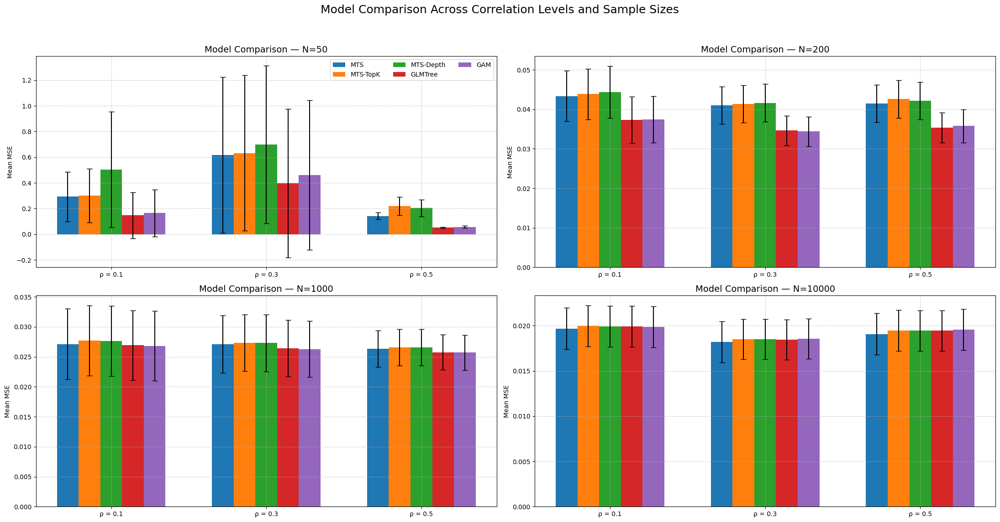

In [12]:
def mean_ci(data, confidence=0.95):
    """
    data: 2D array, shape (n_groups, n_replications)
    returns:
        mean: (n_groups,)
        h:    (n_groups,)  # half-width of CI
    """
    data = np.asarray(data)
    mean = np.mean(data, axis=1)
    sd = stats.sem(data, axis=1)
    h = sd * stats.t.ppf((1 + confidence) / 2.0, data.shape[1] - 1)
    return mean, h

correlations = ['ρ = 0.1', 'ρ = 0.3', 'ρ = 0.5']
x = np.arange(len(correlations))
width = 0.14  # slightly smaller since we add a 5th model

model_labels = ["MTS", "MTS-TopK", "MTS-Depth", "GLMTree", "GAM"]
sample_sizes = ["N=50", "N=200", "N=1000", "N=10000"]

all_mse_vars = [
    # TreeSpline
    [
        [tree_mse_corr1hist50,   tree_mse_corr3hist50,   tree_mse_corr5hist50],
        [tree_mse_corr1hist200,  tree_mse_corr3hist200,  tree_mse_corr5hist200],
        [tree_mse_corr1hist1000, tree_mse_corr3hist1000, tree_mse_corr5hist1000],
        [tree_mse_corr1hist10000,tree_mse_corr3hist10000,tree_mse_corr5hist10000],
    ],
    # TreeSpline3
    [
        [tree3_mse_corr1hist50,   tree3_mse_corr3hist50,   tree3_mse_corr5hist50],
        [tree3_mse_corr1hist200,  tree3_mse_corr3hist200,  tree3_mse_corr5hist200],
        [tree3_mse_corr1hist1000, tree3_mse_corr3hist1000, tree3_mse_corr5hist1000],
        [tree3_mse_corr1hist10000,tree3_mse_corr3hist10000,tree3_mse_corr5hist10000],
    ],
    # TreeSpline4
    [
        [tree4_mse_corr1hist50,   tree4_mse_corr3hist50,   tree4_mse_corr5hist50],
        [tree4_mse_corr1hist200,  tree4_mse_corr3hist200,  tree4_mse_corr5hist200],
        [tree4_mse_corr1hist1000, tree4_mse_corr3hist1000, tree4_mse_corr5hist1000],
        [tree4_mse_corr1hist10000,tree4_mse_corr3hist10000,tree4_mse_corr5hist10000],
    ],
    # GLMTree  <-- added
    [
        [glmtree_mse_corr1hist50,   glmtree_mse_corr3hist50,   glmtree_mse_corr5hist50],
        [glmtree_mse_corr1hist200,  glmtree_mse_corr3hist200,  glmtree_mse_corr5hist200],
        [glmtree_mse_corr1hist1000, glmtree_mse_corr3hist1000, glmtree_mse_corr5hist1000],
        [glmtree_mse_corr1hist10000,glmtree_mse_corr3hist10000,glmtree_mse_corr5hist10000],
    ],
    # GAM
    [
        [gam_mse_corr1hist50,   gam_mse_corr3hist50,   gam_mse_corr5hist50],
        [gam_mse_corr1hist200,  gam_mse_corr3hist200,  gam_mse_corr5hist200],
        [gam_mse_corr1hist1000, gam_mse_corr3hist1000, gam_mse_corr5hist1000],
        [gam_mse_corr1hist10000,gam_mse_corr3hist10000,gam_mse_corr5hist10000],
    ]
]

# centered offsets (robust when number of models changes)
n_models = len(model_labels)
offsets = (np.arange(n_models) - (n_models - 1) / 2.0) * width

fig, axs = plt.subplots(2, 2, figsize=(22, 12))
axs = axs.flatten()

for n_idx in range(4):  # iterate over sample sizes
    ax = axs[n_idx]

    for m_idx, model_name in enumerate(model_labels):
        # list of three arrays: [ρ=0.1, ρ=0.3, ρ=0.5] for this model & N
        mse_lists = all_mse_vars[m_idx][n_idx]

        # stack as (n_rhos, n_replications)
        data = np.array([np.ravel(a) for a in mse_lists])

        means, cis = mean_ci(data)

        ax.bar(
            x + offsets[m_idx],
            means,
            width,
            yerr=cis,
            capsize=4,
            label=model_name if n_idx == 0 else None
        )

    ax.set_title(f"Model Comparison — {sample_sizes[n_idx]}", fontsize=14)
    ax.set_ylabel("Mean MSE")
    ax.set_xticks(x)
    ax.set_xticklabels(correlations)
    ax.grid(True, linestyle='--', alpha=0.6)

    if n_idx == 0:
        ax.legend(ncol=3, fontsize=10)

fig.suptitle("Model Comparison Across Correlation Levels and Sample Sizes", fontsize=18)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

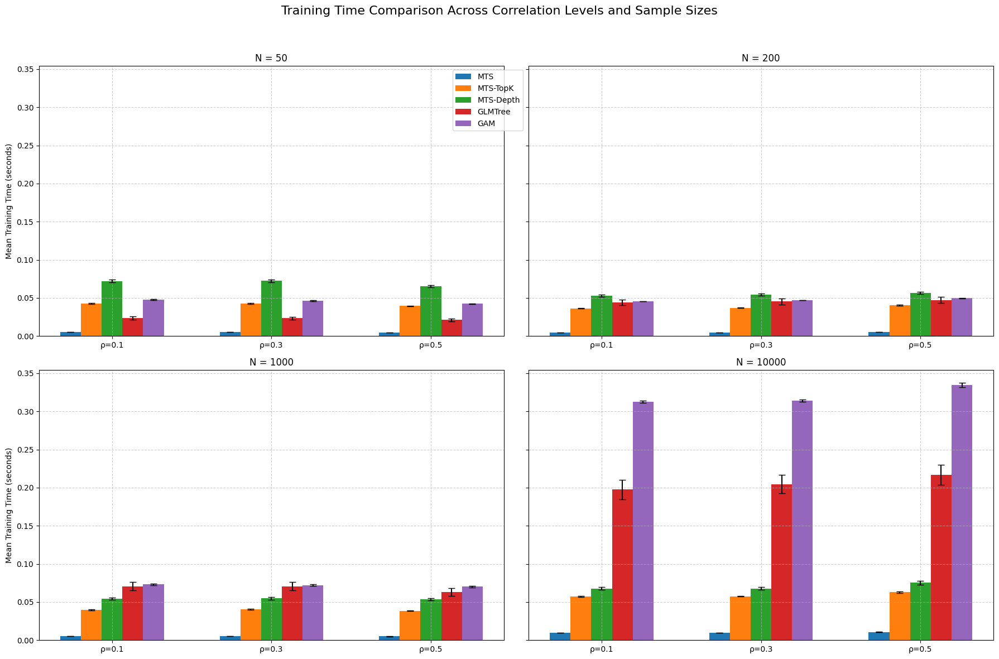

In [13]:
model_labels = [
   "MTS", "MTS-TopK", "MTS-Depth", "GLMTree", "GAM"
]

corr_labels = ['ρ=0.1', 'ρ=0.3', 'ρ=0.5']
sample_sizes = [50, 200, 1000, 10000]
x = np.arange(len(corr_labels))
width = 0.13  # slightly smaller since we now have 5 models

def mean_ci(data, confidence=0.95):
    data = np.asarray(data)  # (n_groups, n_replications)
    mean = np.mean(data, axis=1)
    se = stats.sem(data, axis=1)
    h = se * stats.t.ppf((1 + confidence) / 2.0, data.shape[1] - 1)
    return mean, h

all_time_vars = [
    # TreeSpline
    [
        [tree_time_corr1hist50,    tree_time_corr3hist50,    tree_time_corr5hist50],
        [tree_time_corr1hist200,   tree_time_corr3hist200,   tree_time_corr5hist200],
        [tree_time_corr1hist1000,  tree_time_corr3hist1000,  tree_time_corr5hist1000],
        [tree_time_corr1hist10000, tree_time_corr3hist10000, tree_time_corr5hist10000],
    ],
    # TreeSpline3
    [
        [tree3_time_corr1hist50,    tree3_time_corr3hist50,    tree3_time_corr5hist50],
        [tree3_time_corr1hist200,   tree3_time_corr3hist200,   tree3_time_corr5hist200],
        [tree3_time_corr1hist1000,  tree3_time_corr3hist1000,  tree3_time_corr5hist1000],
        [tree3_time_corr1hist10000, tree3_time_corr3hist10000, tree3_time_corr5hist10000],
    ],
    # TreeSpline4
    [
        [tree4_time_corr1hist50,    tree4_time_corr3hist50,    tree4_time_corr5hist50],
        [tree4_time_corr1hist200,   tree4_time_corr3hist200,   tree4_time_corr5hist200],
        [tree4_time_corr1hist1000,  tree4_time_corr3hist1000,  tree4_time_corr5hist1000],
        [tree4_time_corr1hist10000, tree4_time_corr3hist10000, tree4_time_corr5hist10000],
    ],
    # GLMTree  <-- added
    [
        [glmtree_time_corr1hist50,    glmtree_time_corr3hist50,    glmtree_time_corr5hist50],
        [glmtree_time_corr1hist200,   glmtree_time_corr3hist200,   glmtree_time_corr5hist200],
        [glmtree_time_corr1hist1000,  glmtree_time_corr3hist1000,  glmtree_time_corr5hist1000],
        [glmtree_time_corr1hist10000, glmtree_time_corr3hist10000, glmtree_time_corr5hist10000],
    ],
    # GAM
    [
        [gam_time_corr1hist50,    gam_time_corr3hist50,    gam_time_corr5hist50],
        [gam_time_corr1hist200,   gam_time_corr3hist200,   gam_time_corr5hist200],
        [gam_time_corr1hist1000,  gam_time_corr3hist1000,  gam_time_corr5hist1000],
        [gam_time_corr1hist10000, gam_time_corr3hist10000, gam_time_corr5hist10000],
    ]
]

fig, axs = plt.subplots(2, 2, figsize=(18, 12), sharey=True)
axs = axs.flatten()

# Centered offsets (robust when #models changes)
n_models = len(model_labels)
offsets = (np.arange(n_models) - (n_models - 1) / 2.0) * width

for idx, N in enumerate(sample_sizes):
    ax = axs[idx]

    for m_idx, model_name in enumerate(model_labels):
        time_lists = all_time_vars[m_idx][idx]  # 3 arrays for the 3 correlations
        data = np.array([np.ravel(a) for a in time_lists])  # (3, n_replications)
        means, cis = mean_ci(data)

        ax.bar(
            x + offsets[m_idx],
            means,
            width,
            yerr=cis,
            capsize=4,
            label=model_name if idx == 0 else ""
        )

    ax.set_xticks(x)
    ax.set_xticklabels(corr_labels)
    ax.set_title(f'N = {N}')
    ax.grid(True, linestyle='--', alpha=0.6)
    if idx % 2 == 0:
        ax.set_ylabel('Mean Training Time (seconds)')

# Legend only on first subplot
axs[0].legend(ncol=1, fontsize=10, bbox_to_anchor=(1.05, 1.0))

fig.suptitle('Training Time Comparison Across Correlation Levels and Sample Sizes', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

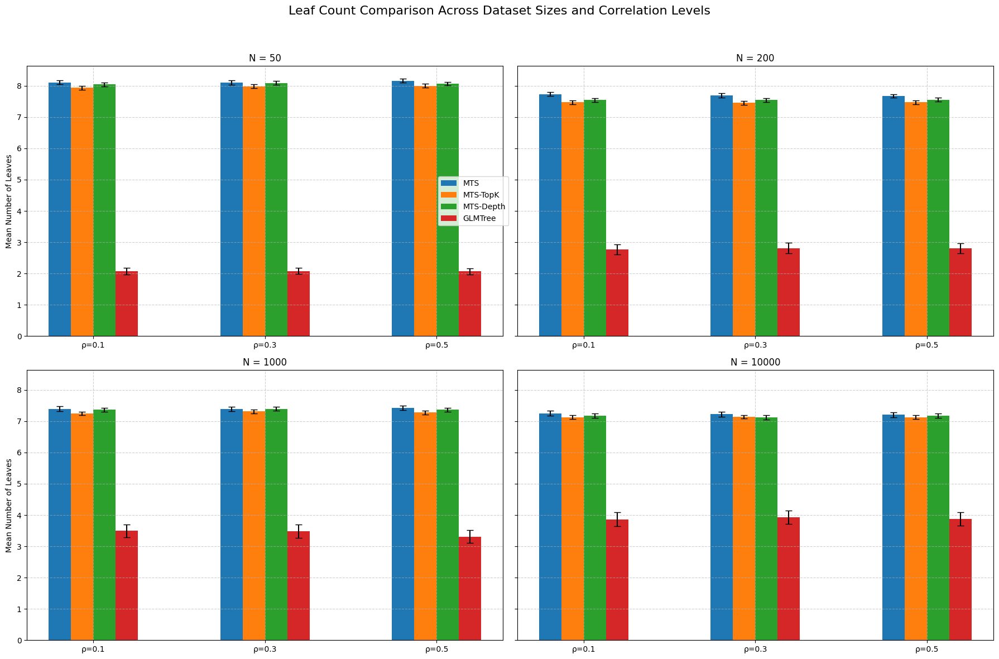

In [21]:
sample_sizes = [50, 200, 1000, 10000]
corr_labels = ['ρ=0.1', 'ρ=0.3', 'ρ=0.5']
x = np.arange(len(corr_labels))

labels = [
    'MTS',
    'MTS-TopK',
    'MTS-Depth',
    'GLMTree',   # <-- added
]

n_models = len(labels)
width = 0.13  # slightly smaller since we now have 4 models

fig, axs = plt.subplots(2, 2, figsize=(18, 12), sharey=True)
axs = axs.flatten()

# centered offsets (robust when #models changes)
offsets = (np.arange(n_models) - (n_models - 1) / 2.0) * width

for idx, N in enumerate(sample_sizes):
    # For each N, collect per-model leaf arrays for rho = 0.1, 0.3, 0.5
    leaf_arrays_by_model = [
        [globals()[f"leaf_corr1hist{N}"],  globals()[f"leaf_corr3hist{N}"],  globals()[f"leaf_corr5hist{N}"]],
        [globals()[f"leaf3_corr1hist{N}"], globals()[f"leaf3_corr3hist{N}"], globals()[f"leaf3_corr5hist{N}"]],
        [globals()[f"leaf4_corr1hist{N}"], globals()[f"leaf4_corr3hist{N}"], globals()[f"leaf4_corr5hist{N}"]],
        [globals()[f"leaf_glmtree_corr1hist{N}"], globals()[f"leaf_glmtree_corr3hist{N}"], globals()[f"leaf_glmtree_corr5hist{N}"]],  # <-- added
    ]

    ax = axs[idx]

    for m_idx, model_name in enumerate(labels):
        leaf_lists = leaf_arrays_by_model[m_idx]  # 3 arrays for the 3 correlations

        # Stack into shape (n_corr, n_replications)
        data = np.array([np.ravel(a) for a in leaf_lists])
        means, cis = mean_ci(data)  # both shape (3,)

        ax.bar(
            x + offsets[m_idx],
            means,
            width,
            yerr=cis,
            capsize=4,
            label=model_name if idx == 0 else ""
        )

    ax.set_xticks(x)
    ax.set_xticklabels(corr_labels)
    ax.set_title(f'N = {N}')
    ax.grid(True, linestyle='--', alpha=0.6)

    if idx % 2 == 0:
        ax.set_ylabel('Mean Number of Leaves')

# Legend only on top-left subplot
axs[0].legend(labels, loc='center right', fontsize=10, ncol=1, bbox_to_anchor=(1.02, 0.5))

fig.suptitle('Leaf Count Comparison Across Dataset Sizes and Correlation Levels', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Testing with different no. of features (N = 1000, correlated features)

## d = 5

In [70]:
n_samples = 1000
repeats = 100

gam_mse_corr1hist10005 = np.zeros((4, repeats))
gam_time_corr1hist10005 = np.zeros((4, repeats))

leaf_corr1hist10005 = np.zeros((4, repeats))
tree_mse_corr1hist10005 = np.zeros((4, repeats))
tree_time_corr1hist10005 = np.zeros((4, repeats))

tree3_mse_corr1hist10005 = np.zeros((4, repeats))
tree3_time_corr1hist10005 = np.zeros((4, repeats))
leaf3_corr1hist10005 = np.zeros((4, repeats))

tree4_mse_corr1hist10005 = np.zeros((4, repeats))
tree4_time_corr1hist10005 = np.zeros((4, repeats))
leaf4_corr1hist10005 = np.zeros((4, repeats))

glmtree_mse_corr1hist10005 = np.zeros((4, repeats))
glmtree_time_corr1hist10005 = np.zeros((4, repeats))
leaf_glmtree_corr1hist10005 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, rho=0.1, n_features=5)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=1).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr1hist10005[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr1hist10005[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr1hist10005[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr1hist10005[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr1hist10005[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr1hist10005[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr1hist10005[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr1hist10005[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr1hist10005[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr1hist10005[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr1hist10005[i-1, j] = model4.get_leaf_count() 

        # GLMTree
        glm = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=10)
        gl_start = time.time()
        glm.fit(X_train_scaled, y_train_scaled)
        gl_end = time.time()
        glmtree_time_corr1hist10005[i-1, j] = gl_end - gl_start
        y_pred_glm = glm.predict(X_test_scaled)
        glmtree_mse_corr1hist10005[i-1, j] = mean_squared_error(y_test_scaled, y_pred_glm)
        leaf_glmtree_corr1hist10005[i-1, j] = glm.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 1 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 2 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 3 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 4 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 5 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 6 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 7 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 8 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 9 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 10 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 11 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 12 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 13 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 14 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 15 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 16 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 17 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 18 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 19 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 20 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 21 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 22 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 23 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 24 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 25 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 26 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 27 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 28 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 29 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 30 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 31 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 32 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 33 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 34 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 35 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 36 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 37 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 38 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 39 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 40 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 41 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 42 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 43 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 44 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 45 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 46 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 47 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 48 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 49 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 50 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 51 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 52 done! ---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 53 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 54 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 55 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 56 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 57 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 58 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 59 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 60 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 61 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 62 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 63 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 64 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 65 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 66 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 67 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 68 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 69 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 70 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 71 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 72 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 73 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 74 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 75 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 76 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 77 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 78 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 79 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 80 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 81 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 82 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 83 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 84 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 85 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 86 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 87 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 88 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 89 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 90 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 91 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 92 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 93 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 94 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 95 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 96 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 97 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 98 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 99 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


In [71]:
n_samples = 1000
repeats = 100

gam_mse_corr3hist10005 = np.zeros((4, repeats))
gam_time_corr3hist10005 = np.zeros((4, repeats))

leaf_corr3hist10005 = np.zeros((4, repeats))
tree_mse_corr3hist10005 = np.zeros((4, repeats))
tree_time_corr3hist10005 = np.zeros((4, repeats))

tree3_mse_corr3hist10005 = np.zeros((4, repeats))
tree3_time_corr3hist10005 = np.zeros((4, repeats))
leaf3_corr3hist10005 = np.zeros((4, repeats))

tree4_mse_corr3hist10005 = np.zeros((4, repeats))
tree4_time_corr3hist10005 = np.zeros((4, repeats))
leaf4_corr3hist10005 = np.zeros((4, repeats))

glmtree_mse_corr3hist10005 = np.zeros((4, repeats))
glmtree_time_corr3hist10005 = np.zeros((4, repeats))
leaf_glmtree_corr3hist10005 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, rho=0.3, n_features=5)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=1).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr3hist10005[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr3hist10005[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr3hist10005[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr3hist10005[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr3hist10005[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr3hist10005[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr3hist10005[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr3hist10005[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr3hist10005[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr3hist10005[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr3hist10005[i-1, j] = model4.get_leaf_count() 

        # GLMTree
        glm = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=10)
        gl_start = time.time()
        glm.fit(X_train_scaled, y_train_scaled)
        gl_end = time.time()
        glmtree_time_corr3hist10005[i-1, j] = gl_end - gl_start
        y_pred_glm = glm.predict(X_test_scaled)
        glmtree_mse_corr3hist10005[i-1, j] = mean_squared_error(y_test_scaled, y_pred_glm)
        leaf_glmtree_corr3hist10005[i-1, j] = glm.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 1 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 2 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 3 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 4 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 5 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 6 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 7 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 8 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 9 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 10 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 11 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 12 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 13 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 14 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 15 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 16 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 17 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 18 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 19 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 20 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 21 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 22 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 23 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 24 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 25 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 26 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 27 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 28 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 29 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 30 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 31 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 32 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 33 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 34 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 35 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 36 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 37 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 38 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 39 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 40 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 41 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 42 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 43 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 44 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 45 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 46 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 47 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 48 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 49 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 50 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 51 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 52 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 53 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 54 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 55 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 56 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 57 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 58 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 59 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 60 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 61 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 62 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 63 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 64 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 65 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 66 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 67 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 68 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 69 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 70 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 71 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 72 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 73 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 74 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 75 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 76 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 77 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 78 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 79 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 80 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 81 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 82 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 83 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 84 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 85 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 86 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 87 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 88 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 89 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 90 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 91 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 92 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 93 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 94 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 95 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 96 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 97 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 98 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 99 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 100 done! ---



In [72]:
n_samples = 1000
repeats = 100

gam_mse_corr5hist10005 = np.zeros((4, repeats))
gam_time_corr5hist10005 = np.zeros((4, repeats))

leaf_corr5hist10005 = np.zeros((4, repeats))
tree_mse_corr5hist10005 = np.zeros((4, repeats))
tree_time_corr5hist10005 = np.zeros((4, repeats))

tree3_mse_corr5hist10005 = np.zeros((4, repeats))
tree3_time_corr5hist10005 = np.zeros((4, repeats))
leaf3_corr5hist10005 = np.zeros((4, repeats))

tree4_mse_corr5hist10005 = np.zeros((4, repeats))
tree4_time_corr5hist10005 = np.zeros((4, repeats))
leaf4_corr5hist10005 = np.zeros((4, repeats))

glmtree_mse_corr5hist10005 = np.zeros((4, repeats))
glmtree_time_corr5hist10005 = np.zeros((4, repeats))
leaf_glmtree_corr5hist10005 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, rho=0.5, n_features=5)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=1).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr5hist10005[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr5hist10005[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr5hist10005[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr5hist10005[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr5hist10005[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr5hist10005[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr5hist10005[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr5hist10005[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr5hist10005[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr5hist10005[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr5hist10005[i-1, j] = model4.get_leaf_count() 

        # GLMTree
        glm = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=10)
        gl_start = time.time()
        glm.fit(X_train_scaled, y_train_scaled)
        gl_end = time.time()
        glmtree_time_corr5hist10005[i-1, j] = gl_end - gl_start
        y_pred_glm = glm.predict(X_test_scaled)
        glmtree_mse_corr5hist10005[i-1, j] = mean_squared_error(y_test_scaled, y_pred_glm)
        leaf_glmtree_corr5hist10005[i-1, j] = glm.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 1 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 2 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 3 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 4 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 5 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 6 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 7 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 8 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 9 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 10 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 11 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 12 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 13 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 14 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 15 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 16 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 17 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 18 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 19 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 20 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 21 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 22 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 23 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 24 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 25 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 26 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 27 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 28 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 29 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 30 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 31 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 32 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 33 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 34 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 35 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 36 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 37 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 38 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 39 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 40 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 41 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 42 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 43 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 44 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 45 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 46 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 47 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 48 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 49 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 50 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 51 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 52 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 53 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 54 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 55 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 56 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 57 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 58 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 59 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 60 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 61 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 62 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 63 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 64 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 65 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 66 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 67 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 68 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 69 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 70 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 71 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 72 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 73 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 74 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 75 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 76 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 77 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 78 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 79 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 80 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 81 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 82 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 83 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 84 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 85 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 86 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 87 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 88 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 89 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 90 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 91 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 92 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 93 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 94 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 95 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 96 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 97 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 98 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 99 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 100 done! ---



## d = 10

In [73]:
n_samples = 1000
repeats = 100

gam_mse_corr1hist100010 = np.zeros((4, repeats))
gam_time_corr1hist100010 = np.zeros((4, repeats))

leaf_corr1hist100010 = np.zeros((4, repeats))
tree_mse_corr1hist100010 = np.zeros((4, repeats))
tree_time_corr1hist100010 = np.zeros((4, repeats))

tree3_mse_corr1hist100010 = np.zeros((4, repeats))
tree3_time_corr1hist100010 = np.zeros((4, repeats))
leaf3_corr1hist100010 = np.zeros((4, repeats))

tree4_mse_corr1hist100010 = np.zeros((4, repeats))
tree4_time_corr1hist100010 = np.zeros((4, repeats))
leaf4_corr1hist100010 = np.zeros((4, repeats))

glmtree_mse_corr1hist100010 = np.zeros((4, repeats))
glmtree_time_corr1hist100010 = np.zeros((4, repeats))
leaf_glmtree_corr1hist100010 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, rho=0.1, n_features=10)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=1).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr1hist100010[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr1hist100010[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr1hist100010[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr1hist100010[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr1hist100010[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr1hist100010[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr1hist100010[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr1hist100010[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr1hist100010[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr1hist100010[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr1hist100010[i-1, j] = model4.get_leaf_count() 

        # GLMTree
        glm = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=10)
        gl_start = time.time()
        glm.fit(X_train_scaled, y_train_scaled)
        gl_end = time.time()
        glmtree_time_corr1hist100010[i-1, j] = gl_end - gl_start
        y_pred_glm = glm.predict(X_test_scaled)
        glmtree_mse_corr1hist100010[i-1, j] = mean_squared_error(y_test_scaled, y_pred_glm)
        leaf_glmtree_corr1hist100010[i-1, j] = glm.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  -


--- Repetition no. 1 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 2 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 3 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 4 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 5 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 6 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 7 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 8 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 9 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 10 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 11 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 12 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 13 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 14 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 15 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 16 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 17 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 18 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 19 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 20 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 21 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 22 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 23 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 24 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 25 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 26 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 27 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 28 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 29 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 30 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 31 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 32 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 33 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 34 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 35 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 36 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 37 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 38 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 39 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 40 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 41 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 42 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 43 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 44 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 45 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 46 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 47 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 48 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 49 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 50 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 51 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 52 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 53 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 54 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 55 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 56 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 57 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 58 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 59 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 60 done! ---



 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 61 done! ---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  -


--- Repetition no. 62 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 63 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 64 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 65 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 66 done! ---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 67 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 68 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 69 done! ---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 70 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 71 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 72 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 73 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 74 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 75 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 76 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 77 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 78 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 79 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 80 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 81 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 82 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 83 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 84 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 85 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 86 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 87 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 88 done! ---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 89 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 90 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 91 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 92 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 93 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 94 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 95 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 96 done! ---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 97 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 98 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 99 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


In [74]:
n_samples = 1000
repeats = 100

gam_mse_corr3hist100010 = np.zeros((4, repeats))
gam_time_corr3hist100010 = np.zeros((4, repeats))

leaf_corr3hist100010 = np.zeros((4, repeats))
tree_mse_corr3hist100010 = np.zeros((4, repeats))
tree_time_corr3hist100010 = np.zeros((4, repeats))

tree3_mse_corr3hist100010 = np.zeros((4, repeats))
tree3_time_corr3hist100010 = np.zeros((4, repeats))
leaf3_corr3hist100010 = np.zeros((4, repeats))

tree4_mse_corr3hist100010 = np.zeros((4, repeats))
tree4_time_corr3hist100010 = np.zeros((4, repeats))
leaf4_corr3hist100010 = np.zeros((4, repeats))

glmtree_mse_corr3hist100010 = np.zeros((4, repeats))
glmtree_time_corr3hist100010 = np.zeros((4, repeats))
leaf_glmtree_corr3hist100010 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, rho=0.3, n_features=10)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=1).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr3hist100010[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr3hist100010[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr3hist100010[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr3hist100010[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr3hist100010[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr3hist100010[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr3hist100010[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr3hist100010[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr3hist100010[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr3hist100010[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr3hist100010[i-1, j] = model4.get_leaf_count() 

        # GLMTree
        glm = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=10)
        gl_start = time.time()
        glm.fit(X_train_scaled, y_train_scaled)
        gl_end = time.time()
        glmtree_time_corr3hist100010[i-1, j] = gl_end - gl_start
        y_pred_glm = glm.predict(X_test_scaled)
        glmtree_mse_corr3hist100010[i-1, j] = mean_squared_error(y_test_scaled, y_pred_glm)
        leaf_glmtree_corr3hist100010[i-1, j] = glm.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  -


--- Repetition no. 1 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 2 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 3 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 4 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 5 done! ---



 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 6 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 7 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 8 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 9 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 10 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 11 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 12 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 13 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 14 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 15 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 16 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 17 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 18 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 19 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 20 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 21 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 22 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 23 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 24 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 25 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 26 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 27 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 28 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 29 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 30 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 31 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 32 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 33 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 34 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 35 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 36 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 37 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 38 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 39 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 40 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 41 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 42 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 43 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:01
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 44 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 45 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 46 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 47 done! ---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 48 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 49 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 50 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 51 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 52 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 53 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 54 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 55 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 56 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 57 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 58 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 59 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 60 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 61 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 62 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 63 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 64 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 65 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 66 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 67 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 68 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 69 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 70 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 71 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 72 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 73 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 74 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 75 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 76 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 77 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 78 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 79 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 80 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 81 done! ---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 82 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 83 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 84 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 85 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 86 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 87 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 88 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 89 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 90 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 91 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 92 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 93 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 94 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 95 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 96 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 97 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 98 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 99 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


In [75]:
n_samples = 1000
repeats = 100

gam_mse_corr5hist100010 = np.zeros((4, repeats))
gam_time_corr5hist100010 = np.zeros((4, repeats))

leaf_corr5hist100010 = np.zeros((4, repeats))
tree_mse_corr5hist100010 = np.zeros((4, repeats))
tree_time_corr5hist100010 = np.zeros((4, repeats))

tree3_mse_corr5hist100010 = np.zeros((4, repeats))
tree3_time_corr5hist100010 = np.zeros((4, repeats))
leaf3_corr5hist100010 = np.zeros((4, repeats))

tree4_mse_corr5hist100010 = np.zeros((4, repeats))
tree4_time_corr5hist100010 = np.zeros((4, repeats))
leaf4_corr5hist100010 = np.zeros((4, repeats))

glmtree_mse_corr5hist100010 = np.zeros((4, repeats))
glmtree_time_corr5hist100010 = np.zeros((4, repeats))
leaf_glmtree_corr5hist100010 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, rho=0.5, n_features=10)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=1).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr5hist100010[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr5hist100010[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr5hist100010[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr5hist100010[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr5hist100010[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr5hist100010[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr5hist100010[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr5hist100010[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr5hist100010[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr5hist100010[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr5hist100010[i-1, j] = model4.get_leaf_count() 

        # GLMTree
        glm = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=10)
        gl_start = time.time()
        glm.fit(X_train_scaled, y_train_scaled)
        gl_end = time.time()
        glmtree_time_corr5hist100010[i-1, j] = gl_end - gl_start
        y_pred_glm = glm.predict(X_test_scaled)
        glmtree_mse_corr5hist100010[i-1, j] = mean_squared_error(y_test_scaled, y_pred_glm)
        leaf_glmtree_corr5hist100010[i-1, j] = glm.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  -


--- Repetition no. 1 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 2 done! ---



 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  -


--- Repetition no. 3 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 4 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 5 done! ---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 6 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 7 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 8 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 9 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 10 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 11 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 12 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 13 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 14 done! ---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 15 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 16 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 17 done! ---



 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-


--- Repetition no. 18 done! ---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 19 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 20 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 21 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 22 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 23 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 24 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 25 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 26 done! ---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 27 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 28 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 29 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 30 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 31 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 32 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 33 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 34 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 35 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 36 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 37 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 38 done! ---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 39 done! ---



 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 40 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 41 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 42 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 43 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 44 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 45 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 46 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 47 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 48 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 49 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 50 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 51 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 52 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 53 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 54 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 55 done! ---



 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 56 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 57 done! ---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 58 done! ---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 59 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 60 done! ---



 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 61 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 62 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 63 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 64 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 65 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 66 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 67 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 68 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 69 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 70 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 71 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 72 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 73 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 74 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 75 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 76 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 77 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 78 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 79 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 80 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 81 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 82 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 83 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 84 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 85 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 86 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 87 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 88 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 89 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 90 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 91 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 92 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 93 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 94 done! ---



 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 95 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 96 done! ---



 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 97 done! ---



 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 98 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 99 done! ---



 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


## Saving, Loading and Plotting

In [76]:
np.save('nparrs/gam_mse_corr1hist10005.npy', gam_mse_corr1hist10005)
np.save('nparrs/gam_time_corr1hist10005.npy', gam_time_corr1hist10005)
np.save('nparrs/tree_time_corr1hist10005.npy', tree_time_corr1hist10005)
np.save('nparrs/tree_mse_corr1hist10005.npy', tree_mse_corr1hist10005)
np.save('nparrs/leaf_corr1hist10005.npy', leaf_corr1hist10005)
np.save('nparrs/tree3_time_corr1hist10005.npy', tree3_time_corr1hist10005)
np.save('nparrs/tree3_mse_corr1hist10005.npy', tree3_mse_corr1hist10005)
np.save('nparrs/leaf3_corr1hist10005.npy', leaf3_corr1hist10005)
np.save('nparrs/tree4_time_corr1hist10005.npy', tree4_time_corr1hist10005)
np.save('nparrs/tree4_mse_corr1hist10005.npy', tree4_mse_corr1hist10005)
np.save('nparrs/leaf4_corr1hist10005.npy', leaf4_corr1hist10005)
np.save('nparrs/glmtree_time_corr1hist10005.npy', glmtree_time_corr1hist10005)
np.save('nparrs/glmtree_mse_corr1hist10005.npy', glmtree_mse_corr1hist10005)
np.save('nparrs/leaf_glmtree_corr1hist10005.npy', leaf_glmtree_corr1hist10005)

np.save('nparrs/gam_mse_corr3hist10005.npy', gam_mse_corr3hist10005)
np.save('nparrs/gam_time_corr3hist10005.npy', gam_time_corr3hist10005)
np.save('nparrs/tree_time_corr3hist10005.npy', tree_time_corr3hist10005)
np.save('nparrs/tree_mse_corr3hist10005.npy', tree_mse_corr3hist10005)
np.save('nparrs/leaf_corr3hist10005.npy', leaf_corr3hist10005)
np.save('nparrs/tree3_time_corr3hist10005.npy', tree3_time_corr3hist10005)
np.save('nparrs/tree3_mse_corr3hist10005.npy', tree3_mse_corr3hist10005)
np.save('nparrs/leaf3_corr3hist10005.npy', leaf3_corr3hist10005)
np.save('nparrs/tree4_time_corr3hist10005.npy', tree4_time_corr3hist10005)
np.save('nparrs/tree4_mse_corr3hist10005.npy', tree4_mse_corr3hist10005)
np.save('nparrs/leaf4_corr3hist10005.npy', leaf4_corr3hist10005)
np.save('nparrs/glmtree_time_corr3hist10005.npy', glmtree_time_corr3hist10005)
np.save('nparrs/glmtree_mse_corr3hist10005.npy', glmtree_mse_corr3hist10005)
np.save('nparrs/leaf_glmtree_corr3hist10005.npy', leaf_glmtree_corr3hist10005)

np.save('nparrs/gam_mse_corr5hist10005.npy', gam_mse_corr5hist10005)
np.save('nparrs/gam_time_corr5hist10005.npy', gam_time_corr5hist10005)
np.save('nparrs/tree_time_corr5hist10005.npy', tree_time_corr5hist10005)
np.save('nparrs/tree_mse_corr5hist10005.npy', tree_mse_corr5hist10005)
np.save('nparrs/leaf_corr5hist10005.npy', leaf_corr5hist10005)
np.save('nparrs/tree3_time_corr5hist10005.npy', tree3_time_corr5hist10005)
np.save('nparrs/tree3_mse_corr5hist10005.npy', tree3_mse_corr5hist10005)
np.save('nparrs/leaf3_corr5hist10005.npy', leaf3_corr5hist10005)
np.save('nparrs/tree4_time_corr5hist10005.npy', tree4_time_corr5hist10005)
np.save('nparrs/tree4_mse_corr5hist10005.npy', tree4_mse_corr5hist10005)
np.save('nparrs/leaf4_corr5hist10005.npy', leaf4_corr5hist10005)
np.save('nparrs/glmtree_time_corr5hist10005.npy', glmtree_time_corr5hist10005)
np.save('nparrs/glmtree_mse_corr5hist10005.npy', glmtree_mse_corr5hist10005)
np.save('nparrs/leaf_glmtree_corr5hist10005.npy', leaf_glmtree_corr5hist10005)

# ------------------------------------------------------------------------------

np.save('nparrs/gam_mse_corr1hist100010.npy', gam_mse_corr1hist100010)
np.save('nparrs/gam_time_corr1hist100010.npy', gam_time_corr1hist100010)
np.save('nparrs/tree_time_corr1hist100010.npy', tree_time_corr1hist100010)
np.save('nparrs/tree_mse_corr1hist100010.npy', tree_mse_corr1hist100010)
np.save('nparrs/leaf_corr1hist100010.npy', leaf_corr1hist100010)
np.save('nparrs/tree3_time_corr1hist100010.npy', tree3_time_corr1hist100010)
np.save('nparrs/tree3_mse_corr1hist100010.npy', tree3_mse_corr1hist100010)
np.save('nparrs/leaf3_corr1hist100010.npy', leaf3_corr1hist100010)
np.save('nparrs/tree4_time_corr1hist100010.npy', tree4_time_corr1hist100010)
np.save('nparrs/tree4_mse_corr1hist100010.npy', tree4_mse_corr1hist100010)
np.save('nparrs/leaf4_corr1hist100010.npy', leaf4_corr1hist100010)
np.save('nparrs/glmtree_time_corr1hist100010.npy', glmtree_time_corr1hist100010)
np.save('nparrs/glmtree_mse_corr1hist100010.npy', glmtree_mse_corr1hist100010)
np.save('nparrs/leaf_glmtree_corr1hist100010.npy', leaf_glmtree_corr1hist100010)

np.save('nparrs/gam_mse_corr3hist100010.npy', gam_mse_corr3hist100010)
np.save('nparrs/gam_time_corr3hist100010.npy', gam_time_corr3hist100010)
np.save('nparrs/tree_time_corr3hist100010.npy', tree_time_corr3hist100010)
np.save('nparrs/tree_mse_corr3hist100010.npy', tree_mse_corr3hist100010)
np.save('nparrs/leaf_corr3hist100010.npy', leaf_corr3hist100010)
np.save('nparrs/tree3_time_corr3hist100010.npy', tree3_time_corr3hist100010)
np.save('nparrs/tree3_mse_corr3hist100010.npy', tree3_mse_corr3hist100010)
np.save('nparrs/leaf3_corr3hist100010.npy', leaf3_corr3hist100010)
np.save('nparrs/tree4_time_corr3hist100010.npy', tree4_time_corr3hist100010)
np.save('nparrs/tree4_mse_corr3hist100010.npy', tree4_mse_corr3hist100010)
np.save('nparrs/leaf4_corr3hist100010.npy', leaf4_corr3hist100010)
np.save('nparrs/glmtree_time_corr3hist100010.npy', glmtree_time_corr3hist100010)
np.save('nparrs/glmtree_mse_corr3hist100010.npy', glmtree_mse_corr3hist100010)
np.save('nparrs/leaf_glmtree_corr3hist100010.npy', leaf_glmtree_corr3hist100010)

np.save('nparrs/gam_mse_corr5hist100010.npy', gam_mse_corr5hist100010)
np.save('nparrs/gam_time_corr5hist100010.npy', gam_time_corr5hist100010)
np.save('nparrs/tree_time_corr5hist100010.npy', tree_time_corr5hist100010)
np.save('nparrs/tree_mse_corr5hist100010.npy', tree_mse_corr5hist100010)
np.save('nparrs/leaf_corr5hist100010.npy', leaf_corr5hist100010)
np.save('nparrs/tree3_time_corr5hist100010.npy', tree3_time_corr5hist100010)
np.save('nparrs/tree3_mse_corr5hist100010.npy', tree3_mse_corr5hist100010)
np.save('nparrs/leaf3_corr5hist100010.npy', leaf3_corr5hist100010)
np.save('nparrs/tree4_time_corr5hist100010.npy', tree4_time_corr5hist100010)
np.save('nparrs/tree4_mse_corr5hist100010.npy', tree4_mse_corr5hist100010)
np.save('nparrs/leaf4_corr5hist100010.npy', leaf4_corr5hist100010)
np.save('nparrs/glmtree_time_corr5hist100010.npy', glmtree_time_corr5hist100010)
np.save('nparrs/glmtree_mse_corr5hist100010.npy', glmtree_mse_corr5hist100010)
np.save('nparrs/leaf_glmtree_corr5hist100010.npy', leaf_glmtree_corr5hist100010)

In [14]:
gam_mse_corr1hist10005 = np.load('nparrs/gam_mse_corr1hist10005.npy')
gam_time_corr1hist10005 = np.load('nparrs/gam_time_corr1hist10005.npy')
tree_time_corr1hist10005 = np.load('nparrs/tree_time_corr1hist10005.npy')
tree_mse_corr1hist10005 = np.load('nparrs/tree_mse_corr1hist10005.npy')
leaf_corr1hist10005 = np.load('nparrs/leaf_corr1hist10005.npy')
tree3_time_corr1hist10005 = np.load('nparrs/tree3_time_corr1hist10005.npy')
tree3_mse_corr1hist10005 = np.load('nparrs/tree3_mse_corr1hist10005.npy')
leaf3_corr1hist10005 = np.load('nparrs/leaf3_corr1hist10005.npy')
tree4_time_corr1hist10005 = np.load('nparrs/tree4_time_corr1hist10005.npy')
tree4_mse_corr1hist10005 = np.load('nparrs/tree4_mse_corr1hist10005.npy')
leaf4_corr1hist10005 = np.load('nparrs/leaf4_corr1hist10005.npy')
glmtree_time_corr1hist10005 = np.load('nparrs/glmtree_time_corr1hist10005.npy')
glmtree_mse_corr1hist10005 = np.load('nparrs/glmtree_mse_corr1hist10005.npy')
leaf_glmtree_corr1hist10005 = np.load('nparrs/leaf_glmtree_corr1hist10005.npy')

gam_mse_corr3hist10005 = np.load('nparrs/gam_mse_corr3hist10005.npy')
gam_time_corr3hist10005 = np.load('nparrs/gam_time_corr3hist10005.npy')
tree_time_corr3hist10005 = np.load('nparrs/tree_time_corr3hist10005.npy')
tree_mse_corr3hist10005 = np.load('nparrs/tree_mse_corr3hist10005.npy')
leaf_corr3hist10005 = np.load('nparrs/leaf_corr3hist10005.npy')
tree3_time_corr3hist10005 = np.load('nparrs/tree3_time_corr3hist10005.npy')
tree3_mse_corr3hist10005 = np.load('nparrs/tree3_mse_corr3hist10005.npy')
leaf3_corr3hist10005 = np.load('nparrs/leaf3_corr3hist10005.npy')
tree4_time_corr3hist10005 = np.load('nparrs/tree4_time_corr3hist10005.npy')
tree4_mse_corr3hist10005 = np.load('nparrs/tree4_mse_corr3hist10005.npy')
leaf4_corr3hist10005 = np.load('nparrs/leaf4_corr3hist10005.npy')
glmtree_time_corr3hist10005 = np.load('nparrs/glmtree_time_corr3hist10005.npy')
glmtree_mse_corr3hist10005 = np.load('nparrs/glmtree_mse_corr3hist10005.npy')
leaf_glmtree_corr3hist10005 = np.load('nparrs/leaf_glmtree_corr3hist10005.npy')

gam_mse_corr5hist10005 = np.load('nparrs/gam_mse_corr5hist10005.npy')
gam_time_corr5hist10005 = np.load('nparrs/gam_time_corr5hist10005.npy')
tree_time_corr5hist10005 = np.load('nparrs/tree_time_corr5hist10005.npy')
tree_mse_corr5hist10005 = np.load('nparrs/tree_mse_corr5hist10005.npy')
leaf_corr5hist10005 = np.load('nparrs/leaf_corr5hist10005.npy')
tree3_time_corr5hist10005 = np.load('nparrs/tree3_time_corr5hist10005.npy')
tree3_mse_corr5hist10005 = np.load('nparrs/tree3_mse_corr5hist10005.npy')
leaf3_corr5hist10005 = np.load('nparrs/leaf3_corr5hist10005.npy')
tree4_time_corr5hist10005 = np.load('nparrs/tree4_time_corr5hist10005.npy')
tree4_mse_corr5hist10005 = np.load('nparrs/tree4_mse_corr5hist10005.npy')
leaf4_corr5hist10005 = np.load('nparrs/leaf4_corr5hist10005.npy')
glmtree_time_corr5hist10005 = np.load('nparrs/glmtree_time_corr5hist10005.npy')
glmtree_mse_corr5hist10005 = np.load('nparrs/glmtree_mse_corr5hist10005.npy')
leaf_glmtree_corr5hist10005 = np.load('nparrs/leaf_glmtree_corr5hist10005.npy')

# ------------------------------------------------------------------------------

gam_mse_corr1hist100010 = np.load('nparrs/gam_mse_corr1hist100010.npy')
gam_time_corr1hist100010 = np.load('nparrs/gam_time_corr1hist100010.npy')
tree_time_corr1hist100010 = np.load('nparrs/tree_time_corr1hist100010.npy')
tree_mse_corr1hist100010 = np.load('nparrs/tree_mse_corr1hist100010.npy')
leaf_corr1hist100010 = np.load('nparrs/leaf_corr1hist100010.npy')
tree3_time_corr1hist100010 = np.load('nparrs/tree3_time_corr1hist100010.npy')
tree3_mse_corr1hist100010 = np.load('nparrs/tree3_mse_corr1hist100010.npy')
leaf3_corr1hist100010 = np.load('nparrs/leaf3_corr1hist100010.npy')
tree4_time_corr1hist100010 = np.load('nparrs/tree4_time_corr1hist100010.npy')
tree4_mse_corr1hist100010 = np.load('nparrs/tree4_mse_corr1hist100010.npy')
leaf4_corr1hist100010 = np.load('nparrs/leaf4_corr1hist100010.npy')
glmtree_time_corr1hist100010 = np.load('nparrs/glmtree_time_corr1hist100010.npy')
glmtree_mse_corr1hist100010 = np.load('nparrs/glmtree_mse_corr1hist100010.npy')
leaf_glmtree_corr1hist100010 = np.load('nparrs/leaf_glmtree_corr1hist100010.npy')

gam_mse_corr3hist100010 = np.load('nparrs/gam_mse_corr3hist100010.npy')
gam_time_corr3hist100010 = np.load('nparrs/gam_time_corr3hist100010.npy')
tree_time_corr3hist100010 = np.load('nparrs/tree_time_corr3hist100010.npy')
tree_mse_corr3hist100010 = np.load('nparrs/tree_mse_corr3hist100010.npy')
leaf_corr3hist100010 = np.load('nparrs/leaf_corr3hist100010.npy')
tree3_time_corr3hist100010 = np.load('nparrs/tree3_time_corr3hist100010.npy')
tree3_mse_corr3hist100010 = np.load('nparrs/tree3_mse_corr3hist100010.npy')
leaf3_corr3hist100010 = np.load('nparrs/leaf3_corr3hist100010.npy')
tree4_time_corr3hist100010 = np.load('nparrs/tree4_time_corr3hist100010.npy')
tree4_mse_corr3hist100010 = np.load('nparrs/tree4_mse_corr3hist100010.npy')
leaf4_corr3hist100010 = np.load('nparrs/leaf4_corr3hist100010.npy')
glmtree_time_corr3hist100010 = np.load('nparrs/glmtree_time_corr3hist100010.npy')
glmtree_mse_corr3hist100010 = np.load('nparrs/glmtree_mse_corr3hist100010.npy')
leaf_glmtree_corr3hist100010 = np.load('nparrs/leaf_glmtree_corr3hist100010.npy')

gam_mse_corr5hist100010 = np.load('nparrs/gam_mse_corr5hist100010.npy')
gam_time_corr5hist100010 = np.load('nparrs/gam_time_corr5hist100010.npy')
tree_time_corr5hist100010 = np.load('nparrs/tree_time_corr5hist100010.npy')
tree_mse_corr5hist100010 = np.load('nparrs/tree_mse_corr5hist100010.npy')
leaf_corr5hist100010 = np.load('nparrs/leaf_corr5hist100010.npy')
tree3_time_corr5hist100010 = np.load('nparrs/tree3_time_corr5hist100010.npy')
tree3_mse_corr5hist100010 = np.load('nparrs/tree3_mse_corr5hist100010.npy')
leaf3_corr5hist100010 = np.load('nparrs/leaf3_corr5hist100010.npy')
tree4_time_corr5hist100010 = np.load('nparrs/tree4_time_corr5hist100010.npy')
tree4_mse_corr5hist100010 = np.load('nparrs/tree4_mse_corr5hist100010.npy')
leaf4_corr5hist100010 = np.load('nparrs/leaf4_corr5hist100010.npy')
glmtree_time_corr5hist100010 = np.load('nparrs/glmtree_time_corr5hist100010.npy')
glmtree_mse_corr5hist100010 = np.load('nparrs/glmtree_mse_corr5hist100010.npy')
leaf_glmtree_corr5hist100010 = np.load('nparrs/leaf_glmtree_corr5hist100010.npy')

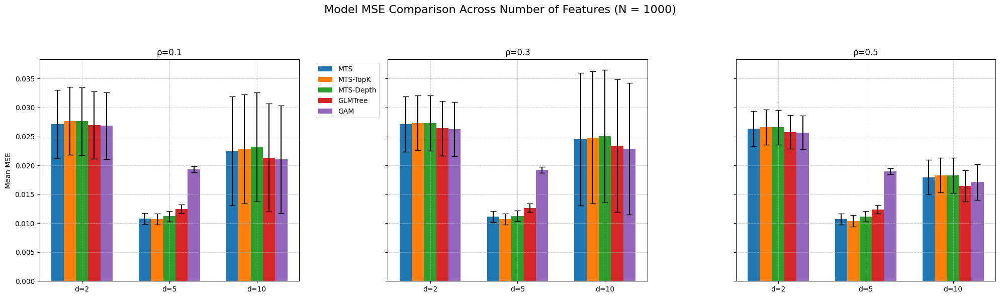

In [15]:
d_values = [2, 5, 10]
d_labels = [f'd={d}' for d in d_values]
x = np.arange(len(d_labels))

rho_labels = ['ρ=0.1', 'ρ=0.3', 'ρ=0.5']

model_labels = [
    'MTS',
    'MTS-TopK',
    'MTS-Depth',
    'GLMTree',   # <-- added
    'GAM'
]

n_models = len(model_labels)
width = 0.14  # slightly smaller since we now have 5 models

all_mse_vars = [
    # TreeSpline
    [
        [tree_mse_corr1hist1000, tree_mse_corr1hist10005, tree_mse_corr1hist100010],
        [tree_mse_corr3hist1000, tree_mse_corr3hist10005, tree_mse_corr3hist100010],
        [tree_mse_corr5hist1000, tree_mse_corr5hist10005, tree_mse_corr5hist100010],
    ],
    # TreeSpline3
    [
        [tree3_mse_corr1hist1000, tree3_mse_corr1hist10005, tree3_mse_corr1hist100010],
        [tree3_mse_corr3hist1000, tree3_mse_corr3hist10005, tree3_mse_corr3hist100010],
        [tree3_mse_corr5hist1000, tree3_mse_corr5hist10005, tree3_mse_corr5hist100010],
    ],
    # TreeSpline4
    [
        [tree4_mse_corr1hist1000, tree4_mse_corr1hist10005, tree4_mse_corr1hist100010],
        [tree4_mse_corr3hist1000, tree4_mse_corr3hist10005, tree4_mse_corr3hist100010],
        [tree4_mse_corr5hist1000, tree4_mse_corr5hist10005, tree4_mse_corr5hist100010],
    ],
    # GLMTree  <-- added
    [
        # d=2 comes from previous simulation (N=1000, d=2)
        [glmtree_mse_corr1hist1000,        glmtree_mse_corr1hist10005,   glmtree_mse_corr1hist100010],
        [glmtree_mse_corr3hist1000,        glmtree_mse_corr3hist10005,   glmtree_mse_corr3hist100010],
        [glmtree_mse_corr5hist1000,        glmtree_mse_corr5hist10005,   glmtree_mse_corr5hist100010],
    ],
    # GAM
    [
        [gam_mse_corr1hist1000,  gam_mse_corr1hist10005,  gam_mse_corr1hist100010],
        [gam_mse_corr3hist1000,  gam_mse_corr3hist10005,  gam_mse_corr3hist100010],
        [gam_mse_corr5hist1000,  gam_mse_corr5hist10005,  gam_mse_corr5hist100010],
    ]
]

fig, axs = plt.subplots(1, 3, figsize=(20, 6), sharey=True)

# centered offsets (robust when #models changes)
offsets = (np.arange(n_models) - (n_models - 1) / 2.0) * width

for rho_idx, rho_label in enumerate(rho_labels):
    ax = axs[rho_idx]
    for m_idx, model_name in enumerate(model_labels):
        mse_lists = all_mse_vars[m_idx][rho_idx]  # [d=2, d=5, d=10]

        # stack into shape (n_d, n_replications)
        data = np.array([np.ravel(a) for a in mse_lists])
        means, cis = mean_ci(data)

        ax.bar(
            x + offsets[m_idx],
            means,
            width,
            yerr=cis,
            capsize=4,
            label=model_name if rho_idx == 0 else ""
        )

    ax.set_xticks(x)
    ax.set_xticklabels(d_labels)
    ax.set_title(rho_label)
    ax.grid(True, linestyle='--', alpha=0.6)
    if rho_idx == 0:
        ax.set_ylabel('Mean MSE')

# Legend only once
axs[0].legend(ncol=1, fontsize=10, bbox_to_anchor=(1.05, 1.0))

fig.suptitle('Model MSE Comparison Across Number of Features (N = 1000)', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()

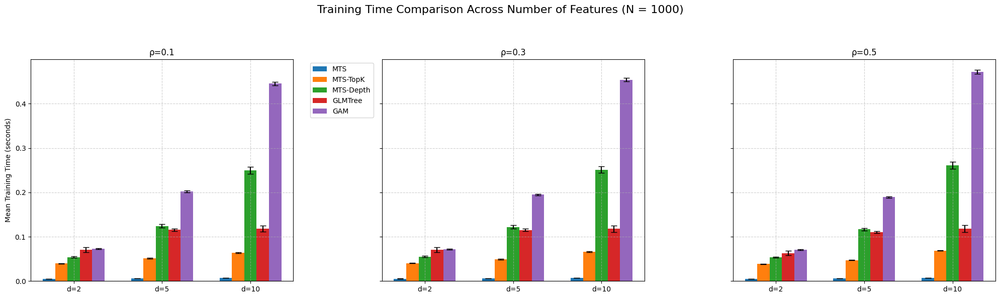

In [16]:
d_values = [2, 5, 10]
d_labels = [f'd={d}' for d in d_values]
x = np.arange(len(d_labels))

rho_labels = ['ρ=0.1', 'ρ=0.3', 'ρ=0.5']

model_labels = [
    'MTS',
    'MTS-TopK',
    'MTS-Depth',
    'GLMTree',   # <-- added
    'GAM'
]

n_models = len(model_labels)
width = 0.14  # slightly smaller since we now have 5 models

all_time_vars = [
    # TreeSpline
    [
        [tree_time_corr1hist1000, tree_time_corr1hist10005, tree_time_corr1hist100010],
        [tree_time_corr3hist1000, tree_time_corr3hist10005, tree_time_corr3hist100010],
        [tree_time_corr5hist1000, tree_time_corr5hist10005, tree_time_corr5hist100010],
    ],
    # TreeSpline3
    [
        [tree3_time_corr1hist1000, tree3_time_corr1hist10005, tree3_time_corr1hist100010],
        [tree3_time_corr3hist1000, tree3_time_corr3hist10005, tree3_time_corr3hist100010],
        [tree3_time_corr5hist1000, tree3_time_corr5hist10005, tree3_time_corr5hist100010],
    ],
    # TreeSpline4
    [
        [tree4_time_corr1hist1000, tree4_time_corr1hist10005, tree4_time_corr1hist100010],
        [tree4_time_corr3hist1000, tree4_time_corr3hist10005, tree4_time_corr3hist100010],
        [tree4_time_corr5hist1000, tree4_time_corr5hist10005, tree4_time_corr5hist100010],
    ],
    # GLMTree  <-- added
    [
        # d=2 comes from previous simulation (N=1000, d=2)
        [glmtree_time_corr1hist1000,        glmtree_time_corr1hist10005,   glmtree_time_corr1hist100010],
        [glmtree_time_corr3hist1000,        glmtree_time_corr3hist10005,   glmtree_time_corr3hist100010],
        [glmtree_time_corr5hist1000,        glmtree_time_corr5hist10005,   glmtree_time_corr5hist100010],
    ],
    # GAM
    [
        [gam_time_corr1hist1000,  gam_time_corr1hist10005,  gam_time_corr1hist100010],
        [gam_time_corr3hist1000,  gam_time_corr3hist10005,  gam_time_corr3hist100010],
        [gam_time_corr5hist1000,  gam_time_corr5hist10005,  gam_time_corr5hist100010],
    ]
]

fig, axs = plt.subplots(1, 3, figsize=(20, 6), sharey=True)

# centered offsets (robust when #models changes)
offsets = (np.arange(n_models) - (n_models - 1) / 2.0) * width

for rho_idx, rho_label in enumerate(rho_labels):
    ax = axs[rho_idx]
    for m_idx, model_name in enumerate(model_labels):
        # list of 3 arrays: [d=2, d=5, d=10] for this (model, rho)
        time_lists = all_time_vars[m_idx][rho_idx]

        # stack into shape (n_d, n_replications)
        data = np.array([np.ravel(a) for a in time_lists])
        means, cis = mean_ci(data)

        ax.bar(
            x + offsets[m_idx],
            means,
            width,
            yerr=cis,
            capsize=4,
            label=model_name if rho_idx == 0 else ""
        )

    ax.set_xticks(x)
    ax.set_xticklabels(d_labels)
    ax.set_title(rho_label)
    ax.grid(True, linestyle='--', alpha=0.6)
    if rho_idx == 0:
        ax.set_ylabel('Mean Training Time (seconds)')

# Legend only once
axs[0].legend(ncol=1, fontsize=10, bbox_to_anchor=(1.05, 1.0))

fig.suptitle('Training Time Comparison Across Number of Features (N = 1000)', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()

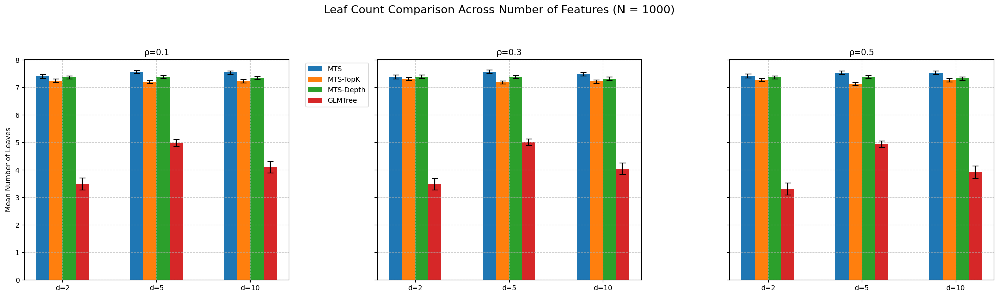

In [25]:
d_values = [2, 5, 10]
d_labels = [f'd={d}' for d in d_values]
x = np.arange(len(d_labels))

rho_labels = ['ρ=0.1', 'ρ=0.3', 'ρ=0.5']

labels = [
    'MTS',
    'MTS-TopK',
    'MTS-Depth',
    'GLMTree',   # <-- added
]

n_models = len(labels)
width = 0.14  # slightly smaller since we now have 4 models

all_leaf_vars = [
    # TreeSpline
    [
        [leaf_corr1hist1000,  leaf_corr1hist10005,  leaf_corr1hist100010],
        [leaf_corr3hist1000,  leaf_corr3hist10005,  leaf_corr3hist100010],
        [leaf_corr5hist1000,  leaf_corr5hist10005,  leaf_corr5hist100010],
    ],
    # TreeSpline3
    [
        [leaf3_corr1hist1000, leaf3_corr1hist10005, leaf3_corr1hist100010],
        [leaf3_corr3hist1000, leaf3_corr3hist10005, leaf3_corr3hist100010],
        [leaf3_corr5hist1000, leaf3_corr5hist10005, leaf3_corr5hist100010],
    ],
    # TreeSpline4
    [
        [leaf4_corr1hist1000, leaf4_corr1hist10005, leaf4_corr1hist100010],
        [leaf4_corr3hist1000, leaf4_corr3hist10005, leaf4_corr3hist100010],
        [leaf4_corr5hist1000, leaf4_corr5hist10005, leaf4_corr5hist100010],
    ],
    # GLMTree  <-- added
    [
        # d=2 comes from previous simulation (N=1000, d=2)
        [leaf_glmtree_corr1hist1000,        leaf_glmtree_corr1hist10005,  leaf_glmtree_corr1hist100010],
        [leaf_glmtree_corr3hist1000,        leaf_glmtree_corr3hist10005,  leaf_glmtree_corr3hist100010],
        [leaf_glmtree_corr5hist1000,        leaf_glmtree_corr5hist10005,  leaf_glmtree_corr5hist100010],
    ],
]

fig, axs = plt.subplots(1, 3, figsize=(20, 6), sharey=True)

# centered offsets (robust when #models changes)
offsets = (np.arange(n_models) - (n_models - 1) / 2.0) * width

for rho_idx, rho_label in enumerate(rho_labels):
    ax = axs[rho_idx]
    for m_idx, model_name in enumerate(labels):
        # list of 3 arrays: [d=2, d=5, d=10] for this (model, rho)
        leaf_lists = all_leaf_vars[m_idx][rho_idx]

        # stack into shape (n_d, n_replications)
        data = np.array([np.ravel(a) for a in leaf_lists])
        means, cis = mean_ci(data)

        ax.bar(
            x + offsets[m_idx],
            means,
            width,
            yerr=cis,
            capsize=4,
            label=model_name if rho_idx == 0 else ""
        )

    ax.set_xticks(x)
    ax.set_xticklabels(d_labels)
    ax.set_title(rho_label)
    ax.grid(True, linestyle='--', alpha=0.6)
    if rho_idx == 0:
        ax.set_ylabel('Mean Number of Leaves')

# Legend only once
axs[0].legend(ncol=1, fontsize=10, bbox_to_anchor=(1.05, 1.0))

fig.suptitle('Leaf Count Comparison Across Number of Features (N = 1000)', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()

# Testing with different polynomial degree (N = 1000, dim(X) = 5)

## Uncorrelated features

### deg=2

In [85]:
n_samples = 1000
repeats = 100
degree = 2

gam_mse_hist100052 = np.zeros((4, repeats))
gam_time_hist100052 = np.zeros((4, repeats))

leaf_hist100052 = np.zeros((4, repeats))
tree_mse_hist100052 = np.zeros((4, repeats))
tree_time_hist100052 = np.zeros((4, repeats))

tree3_mse_hist100052 = np.zeros((4, repeats))
tree3_time_hist100052 = np.zeros((4, repeats))
leaf3_hist100052 = np.zeros((4, repeats))

tree4_mse_hist100052 = np.zeros((4, repeats))
tree4_time_hist100052 = np.zeros((4, repeats))
leaf4_hist100052 = np.zeros((4, repeats))

glmtree_mse_hist100052 = np.zeros((4, repeats))
glmtree_time_hist100052 = np.zeros((4, repeats))
leaf_glmtree_hist100052 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_data(n_samples, i, n_features=5)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=degree).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_hist100052[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_hist100052[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22, poly_degree=degree)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_hist100052[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_hist100052[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_hist100052[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22, poly_degree=degree)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_hist100052[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_hist100052[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_hist100052[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22, poly_degree=degree)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_hist100052[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_hist100052[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_hist100052[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glm = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=15)
        gl_start = time.time()
        glm.fit(X_train_scaled, y_train_scaled)
        gl_end = time.time()
        glmtree_time_hist100052[i-1, j] = gl_end - gl_start
        y_pred_glm = glm.predict(X_test_scaled)
        glmtree_mse_hist100052[i-1, j] = mean_squared_error(y_test_scaled, y_pred_glm)
        leaf_glmtree_hist100052[i-1, j] = glm.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 1 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 2 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 3 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 4 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 5 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 6 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 7 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 8 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 9 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 10 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 11 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 12 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 13 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 14 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 15 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 16 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 17 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 18 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 19 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 20 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 21 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 22 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 23 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 24 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 25 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 26 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 27 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 28 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 29 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 30 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 31 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 32 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 33 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 34 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 35 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 36 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 37 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 38 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 39 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 40 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 41 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 42 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 43 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 44 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 45 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 46 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 47 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 48 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 49 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 50 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 51 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 52 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 53 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 54 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 55 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 56 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 57 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 58 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 59 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 60 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 61 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 62 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 63 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 64 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 65 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 66 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 67 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 68 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 69 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 70 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 71 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 72 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 73 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 74 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 75 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 76 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 77 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 78 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 79 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 80 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 81 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 82 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 83 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 84 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 85 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 86 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 87 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 88 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 89 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 90 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 91 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 92 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 93 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 94 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 95 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 96 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 97 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 98 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 99 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


### deg=3

In [86]:
n_samples = 1000
repeats = 100
degree = 3

gam_mse_hist100053 = np.zeros((4, repeats))
gam_time_hist100053 = np.zeros((4, repeats))

leaf_hist100053 = np.zeros((4, repeats))
tree_mse_hist100053 = np.zeros((4, repeats))
tree_time_hist100053 = np.zeros((4, repeats))

tree3_mse_hist100053 = np.zeros((4, repeats))
tree3_time_hist100053 = np.zeros((4, repeats))
leaf3_hist100053 = np.zeros((4, repeats))

tree4_mse_hist100053 = np.zeros((4, repeats))
tree4_time_hist100053 = np.zeros((4, repeats))
leaf4_hist100053 = np.zeros((4, repeats))

glmtree_mse_hist100053 = np.zeros((4, repeats))
glmtree_time_hist100053 = np.zeros((4, repeats))
leaf_glmtree_hist100053 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_data(n_samples, i, n_features=5)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=degree).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_hist100053[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_hist100053[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22, poly_degree=degree)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_hist100053[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_hist100053[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_hist100053[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22, poly_degree=degree)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_hist100053[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_hist100053[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_hist100053[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22, poly_degree=degree)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_hist100053[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_hist100053[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_hist100053[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glm = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=15)
        gl_start = time.time()
        glm.fit(X_train_scaled, y_train_scaled)
        gl_end = time.time()
        glmtree_time_hist100053[i-1, j] = gl_end - gl_start
        y_pred_glm = glm.predict(X_test_scaled)
        glmtree_mse_hist100053[i-1, j] = mean_squared_error(y_test_scaled, y_pred_glm)
        leaf_glmtree_hist100053[i-1, j] = glm.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 1 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 2 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 3 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 4 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 5 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 6 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 7 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 8 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 9 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 10 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 11 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 12 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 13 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 14 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 15 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 16 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 17 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 18 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 19 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 20 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 21 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 22 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 23 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 24 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 25 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 26 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 27 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 28 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 29 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 30 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 31 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 32 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 33 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 34 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 35 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 36 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 37 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 38 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 39 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 40 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 41 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 42 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 43 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 44 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 45 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 46 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 47 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 48 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 49 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 50 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 51 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 52 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 53 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 54 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 55 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 56 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 57 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 58 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 59 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 60 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 61 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 62 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 63 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 64 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 65 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 66 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 67 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 68 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 69 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 70 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 71 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 72 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 73 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 74 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 75 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 76 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 77 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 78 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 79 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 80 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 81 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 82 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 83 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 84 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 85 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 86 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 87 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 88 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 89 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 90 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 91 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 92 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 93 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 94 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 95 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 96 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 97 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 98 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 99 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


### Saving, Loading and Plotting

In [ ]:
np.save('nparrs/gam_mse_hist100052.npy', gam_mse_hist100052)
np.save('nparrs/gam_time_hist100052.npy', gam_time_hist100052)
np.save('nparrs/tree_time_hist100052.npy', tree_time_hist100052)
np.save('nparrs/tree_mse_hist100052.npy', tree_mse_hist100052)
np.save('nparrs/leaf_hist100052.npy', leaf_hist100052)
np.save('nparrs/tree3_time_hist100052.npy', tree3_time_hist100052)
np.save('nparrs/tree3_mse_hist100052.npy', tree3_mse_hist100052)
np.save('nparrs/leaf3_hist100052.npy', leaf3_hist100052)
np.save('nparrs/tree4_time_hist100052.npy', tree4_time_hist100052)
np.save('nparrs/tree4_mse_hist100052.npy', tree4_mse_hist100052)
np.save('nparrs/leaf4_hist100052.npy', leaf4_hist100052)

np.save('nparrs/gam_mse_hist100053.npy', gam_mse_hist100053)
np.save('nparrs/gam_time_hist100053.npy', gam_time_hist100053)
np.save('nparrs/tree_time_hist100053.npy', tree_time_hist100053)
np.save('nparrs/tree_mse_hist100053.npy', tree_mse_hist100053)
np.save('nparrs/leaf_hist100053.npy', leaf_hist100053)
np.save('nparrs/tree3_time_hist100053.npy', tree3_time_hist100053)
np.save('nparrs/tree3_mse_hist100053.npy', tree3_mse_hist100053)
np.save('nparrs/leaf3_hist100053.npy', leaf3_hist100053)
np.save('nparrs/tree4_time_hist100053.npy', tree4_time_hist100053)
np.save('nparrs/tree4_mse_hist100053.npy', tree4_mse_hist100053)
np.save('nparrs/leaf4_hist100053.npy', leaf4_hist100053)

In [17]:
gam_mse_hist100052 = np.load('nparrs/gam_mse_hist100052.npy')
gam_time_hist100052 = np.load('nparrs/gam_time_hist100052.npy')
tree_time_hist100052 = np.load('nparrs/tree_time_hist100052.npy')
tree_mse_hist100052 = np.load('nparrs/tree_mse_hist100052.npy')
leaf_hist100052 = np.load('nparrs/leaf_hist100052.npy')
tree3_time_hist100052 = np.load('nparrs/tree3_time_hist100052.npy')
tree3_mse_hist100052 = np.load('nparrs/tree3_mse_hist100052.npy')
leaf3_hist100052 = np.load('nparrs/leaf3_hist100052.npy')
tree4_time_hist100052 = np.load('nparrs/tree4_time_hist100052.npy')
tree4_mse_hist100052 = np.load('nparrs/tree4_mse_hist100052.npy')
leaf4_hist100052 = np.load('nparrs/leaf4_hist100052.npy')

gam_mse_hist100053 = np.load('nparrs/gam_mse_hist100053.npy')
gam_time_hist100053 = np.load('nparrs/gam_time_hist100053.npy')
tree_time_hist100053 = np.load('nparrs/tree_time_hist100053.npy')
tree_mse_hist100053 = np.load('nparrs/tree_mse_hist100053.npy')
leaf_hist100053 = np.load('nparrs/leaf_hist100053.npy')
tree3_time_hist100053 = np.load('nparrs/tree3_time_hist100053.npy')
tree3_mse_hist100053 = np.load('nparrs/tree3_mse_hist100053.npy')
leaf3_hist100053 = np.load('nparrs/leaf3_hist100053.npy')
tree4_time_hist100053 = np.load('nparrs/tree4_time_hist100053.npy')
tree4_mse_hist100053 = np.load('nparrs/tree4_mse_hist100053.npy')
leaf4_hist100053 = np.load('nparrs/leaf4_hist100053.npy')

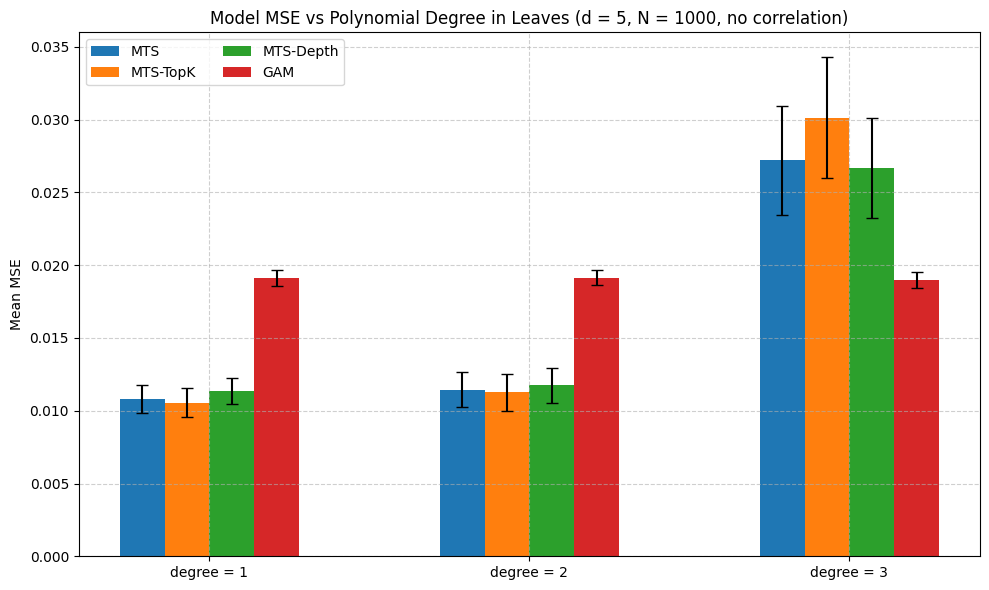

In [19]:
deg_values = [1, 2, 3]
deg_labels = [r'degree = 1', r'degree = 2', r'degree = 3']
x = np.arange(len(deg_labels))

model_labels = [
    'MTS',
    'MTS-TopK',
    'MTS-Depth',
    'GAM'
]

n_models = len(model_labels)
width = 0.14  # slightly smaller since we now have 5 models

all_mse_vars = [
    # TreeSpline
    [tree_mse_hist10005,  tree_mse_hist100052,  tree_mse_hist100053],
    # TreeSpline3
    [tree3_mse_hist10005, tree3_mse_hist100052, tree3_mse_hist100053],
    # TreeSpline4
    [tree4_mse_hist10005, tree4_mse_hist100052, tree4_mse_hist100053],
    # GAM
    [gam_mse_hist10005,   gam_mse_hist100052,   gam_mse_hist100053]
]

fig, ax = plt.subplots(figsize=(10, 6))

# centered offsets (robust when #models changes)
offsets = (np.arange(n_models) - (n_models - 1) / 2.0) * width

for m_idx, model_name in enumerate(model_labels):
    mse_lists = all_mse_vars[m_idx]  # list of 3 arrays: per degree

    # stack into shape (n_deg, n_replications)
    data = np.array([np.ravel(a) for a in mse_lists])
    means, cis = mean_ci(data)

    ax.bar(
        x + offsets[m_idx],
        means,
        width,
        yerr=cis,
        capsize=4,
        label=model_name
    )

ax.set_xticks(x)
ax.set_xticklabels(deg_labels)
ax.set_ylabel('Mean MSE')
ax.set_title('Model MSE vs Polynomial Degree in Leaves (d = 5, N = 1000, no correlation)')
ax.grid(True, linestyle='--', alpha=0.6)
ax.legend(ncol=2)

plt.tight_layout()
plt.show()

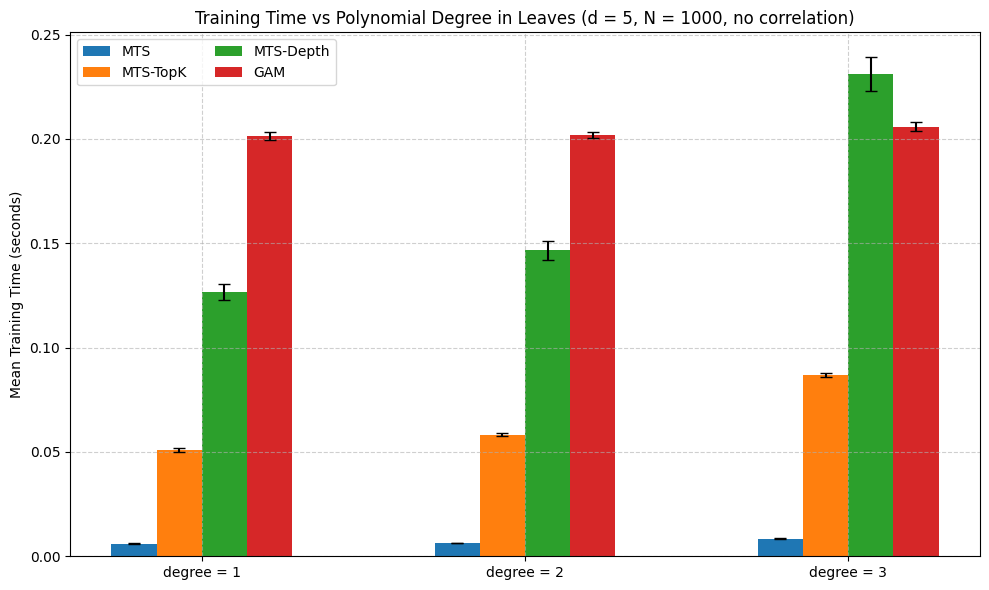

In [20]:
deg_values = [1, 2, 3]
deg_labels = [r'degree = 1', r'degree = 2', r'degree = 3']
x = np.arange(len(deg_labels))

model_labels = [
    'MTS',
    'MTS-TopK',
    'MTS-Depth',
    'GAM'
]

n_models = len(model_labels)
width = 0.14  # slightly smaller since we now have 5 models

all_time_vars = [
    # TreeSpline
    [tree_time_hist10005,  tree_time_hist100052,  tree_time_hist100053],
    # TreeSpline3
    [tree3_time_hist10005, tree3_time_hist100052, tree3_time_hist100053],
    # TreeSpline4
    [tree4_time_hist10005, tree4_time_hist100052, tree4_time_hist100053],
    # GAM
    [gam_time_hist10005,   gam_time_hist100052,   gam_time_hist100053]
]

fig, ax = plt.subplots(figsize=(10, 6))

# centered offsets (robust when #models changes)
offsets = (np.arange(n_models) - (n_models - 1) / 2.0) * width

for m_idx, model_name in enumerate(model_labels):
    time_lists = all_time_vars[m_idx]  # list of 3 arrays: per degree

    # stack into shape (n_deg, n_replications)
    data = np.array([np.ravel(a) for a in time_lists])
    means, cis = mean_ci(data)

    ax.bar(
        x + offsets[m_idx],
        means,
        width,
        yerr=cis,
        capsize=4,
        label=model_name
    )

ax.set_xticks(x)
ax.set_xticklabels(deg_labels)
ax.set_ylabel('Mean Training Time (seconds)')
ax.set_title('Training Time vs Polynomial Degree in Leaves (d = 5, N = 1000, no correlation)')
ax.grid(True, linestyle='--', alpha=0.6)
ax.legend(ncol=2)

plt.tight_layout()
plt.show()

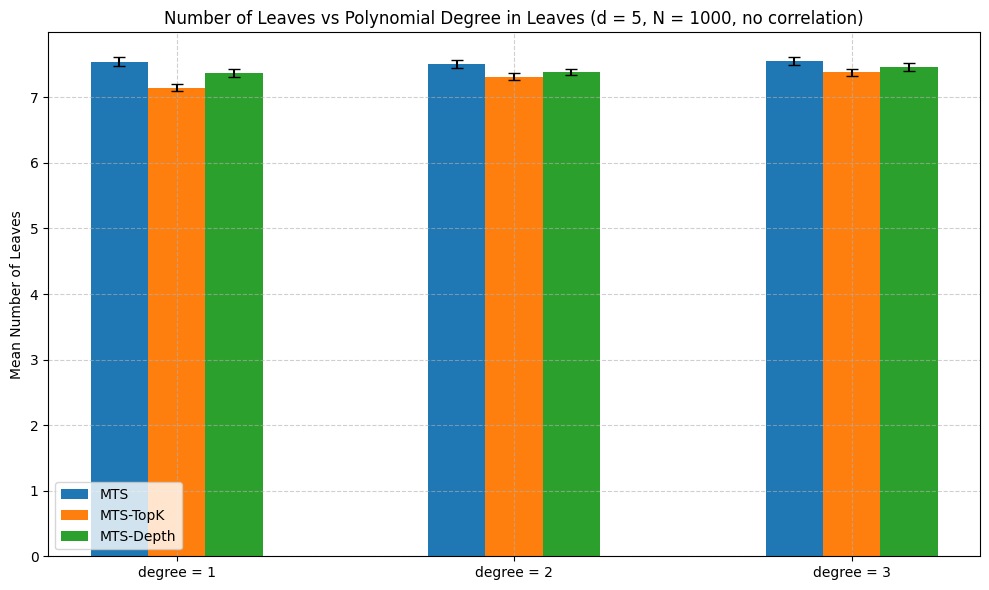

In [28]:
deg_values = [1, 2, 3]
deg_labels = [r'degree = 1', r'degree = 2', r'degree = 3']
x = np.arange(len(deg_labels))

labels = [
    'MTS',
    'MTS-TopK',
    'MTS-Depth',
]

n_models = len(labels)
width = 0.17  # bar width

all_leaf_vars = [
    # TreeSpline
    [leaf_hist10005,  leaf_hist100052,  leaf_hist100053],
    # TreeSpline3
    [leaf3_hist10005, leaf3_hist100052, leaf3_hist100053],
    # TreeSpline4
    [leaf4_hist10005, leaf4_hist100052, leaf4_hist100053],
]

fig, ax = plt.subplots(figsize=(10, 6))

offsets = np.linspace(
    -((n_models - 1) / 2) * width,
    ((n_models - 1) / 2) * width,
    n_models
)

for m_idx, model_name in enumerate(labels):
    leaf_lists = all_leaf_vars[m_idx]  # list of 3 arrays: per degree

    # stack into shape (n_deg, n_replications)
    data = np.array([np.ravel(a) for a in leaf_lists])
    means, cis = mean_ci(data)

    ax.bar(x + offsets[m_idx], means, width,
           yerr=cis, capsize=4,
           label=model_name)

ax.set_xticks(x)
ax.set_xticklabels(deg_labels)
ax.set_ylabel('Mean Number of Leaves')
ax.set_title('Number of Leaves vs Polynomial Degree in Leaves (d = 5, N = 1000, no correlation)')
ax.grid(True, linestyle='--', alpha=0.6)
ax.legend()

plt.tight_layout()
plt.show()

## Correlated features

### deg = 2

In [95]:
n_samples = 1000
repeats = 100
degree = 2

gam_mse_corr1hist100052 = np.zeros((4, repeats))
gam_time_corr1hist100052 = np.zeros((4, repeats))

leaf_corr1hist100052 = np.zeros((4, repeats))
tree_mse_corr1hist100052 = np.zeros((4, repeats))
tree_time_corr1hist100052 = np.zeros((4, repeats))

tree3_mse_corr1hist100052 = np.zeros((4, repeats))
tree3_time_corr1hist100052 = np.zeros((4, repeats))
leaf3_corr1hist100052 = np.zeros((4, repeats))

tree4_mse_corr1hist100052 = np.zeros((4, repeats))
tree4_time_corr1hist100052 = np.zeros((4, repeats))
leaf4_corr1hist100052 = np.zeros((4, repeats))

glmtree_mse_corr1hist100052 = np.zeros((4, repeats))
glmtree_time_corr1hist100052 = np.zeros((4, repeats))
leaf_glmtree_corr1hist100052 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, n_features=5, rho=0.1)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=degree).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr1hist100052[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr1hist100052[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22, poly_degree=degree)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr1hist100052[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr1hist100052[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr1hist100052[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22, poly_degree=degree)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr1hist100052[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr1hist100052[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr1hist100052[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22, poly_degree=degree)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr1hist100052[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr1hist100052[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr1hist100052[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glm = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=15)
        gl_start = time.time()
        glm.fit(X_train_scaled, y_train_scaled)
        gl_end = time.time()
        glmtree_time_corr1hist100052[i-1, j] = gl_end - gl_start
        y_pred_glm = glm.predict(X_test_scaled)
        glmtree_mse_corr1hist100052[i-1, j] = mean_squared_error(y_test_scaled, y_pred_glm)
        leaf_glmtree_corr1hist100052[i-1, j] = glm.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 1 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 2 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 3 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 4 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 5 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 6 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 7 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 8 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 9 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 10 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 11 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 12 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 13 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 14 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 15 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 16 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 17 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 18 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 19 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 20 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 21 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 22 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 23 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 24 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 25 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 26 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 27 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 28 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 29 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 30 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 31 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 32 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 33 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 34 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 35 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 36 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 37 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 38 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 39 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 40 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 41 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 42 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 43 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 44 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 45 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 46 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 47 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 48 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 49 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 50 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 51 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 52 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 53 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 54 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 55 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 56 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 57 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 58 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 59 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 60 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 61 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 62 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 63 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 64 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 65 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 66 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 67 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 68 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 69 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 70 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 71 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 72 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 73 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 74 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 75 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 76 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 77 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 78 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 79 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 80 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 81 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 82 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 83 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 84 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 85 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 86 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 87 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 88 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 89 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 90 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 91 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 92 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 93 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 94 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 95 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 96 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 97 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 98 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 99 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


In [96]:
n_samples = 1000
repeats = 100
degree = 2

gam_mse_corr3hist100052 = np.zeros((4, repeats))
gam_time_corr3hist100052 = np.zeros((4, repeats))

leaf_corr3hist100052 = np.zeros((4, repeats))
tree_mse_corr3hist100052 = np.zeros((4, repeats))
tree_time_corr3hist100052 = np.zeros((4, repeats))

tree3_mse_corr3hist100052 = np.zeros((4, repeats))
tree3_time_corr3hist100052 = np.zeros((4, repeats))
leaf3_corr3hist100052 = np.zeros((4, repeats))

tree4_mse_corr3hist100052 = np.zeros((4, repeats))
tree4_time_corr3hist100052 = np.zeros((4, repeats))
leaf4_corr3hist100052 = np.zeros((4, repeats))

glmtree_mse_corr3hist100052 = np.zeros((4, repeats))
glmtree_time_corr3hist100052 = np.zeros((4, repeats))
leaf_glmtree_corr3hist100052 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, n_features=5, rho=0.3)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=degree).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr3hist100052[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr3hist100052[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22, poly_degree=degree)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr3hist100052[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr3hist100052[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr3hist100052[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22, poly_degree=degree)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr3hist100052[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr3hist100052[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr3hist100052[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22, poly_degree=degree)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr3hist100052[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr3hist100052[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr3hist100052[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glm = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=15)
        gl_start = time.time()
        glm.fit(X_train_scaled, y_train_scaled)
        gl_end = time.time()
        glmtree_time_corr3hist100052[i-1, j] = gl_end - gl_start
        y_pred_glm = glm.predict(X_test_scaled)
        glmtree_mse_corr3hist100052[i-1, j] = mean_squared_error(y_test_scaled, y_pred_glm)
        leaf_glmtree_corr3hist100052[i-1, j] = glm.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 1 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 2 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 3 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 4 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 5 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 6 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 7 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 8 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 9 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 10 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 11 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 12 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 13 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 14 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 15 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 16 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 17 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 18 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 19 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 20 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 21 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 22 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 23 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 24 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 25 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 26 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 27 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 28 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 29 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 30 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 31 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 32 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 33 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 34 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 35 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 36 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 37 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 38 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 39 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 40 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 41 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 42 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 43 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 44 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 45 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 46 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 47 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 48 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 49 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 50 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 51 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 52 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 53 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 54 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 55 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 56 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 57 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 58 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 59 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 60 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 61 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 62 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 63 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 64 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 65 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 66 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 67 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 68 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 69 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 70 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 71 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 72 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 73 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 74 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 75 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 76 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 77 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 78 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 79 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 80 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 81 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 82 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 83 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 84 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 85 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 86 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 87 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 88 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 89 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 90 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 91 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 92 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 93 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 94 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 95 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 96 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 97 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 98 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 99 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


In [97]:
n_samples = 1000
repeats = 100
degree = 2

gam_mse_corr5hist100052 = np.zeros((4, repeats))
gam_time_corr5hist100052 = np.zeros((4, repeats))

leaf_corr5hist100052 = np.zeros((4, repeats))
tree_mse_corr5hist100052 = np.zeros((4, repeats))
tree_time_corr5hist100052 = np.zeros((4, repeats))

tree3_mse_corr5hist100052 = np.zeros((4, repeats))
tree3_time_corr5hist100052 = np.zeros((4, repeats))
leaf3_corr5hist100052 = np.zeros((4, repeats))

tree4_mse_corr5hist100052 = np.zeros((4, repeats))
tree4_time_corr5hist100052 = np.zeros((4, repeats))
leaf4_corr5hist100052 = np.zeros((4, repeats))

glmtree_mse_corr5hist100052 = np.zeros((4, repeats))
glmtree_time_corr5hist100052 = np.zeros((4, repeats))
leaf_glmtree_corr5hist100052 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, n_features=5, rho=0.5)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=degree).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr5hist100052[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr5hist100052[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22, poly_degree=degree)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr5hist100052[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr5hist100052[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr5hist100052[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22, poly_degree=degree)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr5hist100052[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr5hist100052[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr5hist100052[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22, poly_degree=degree)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr5hist100052[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr5hist100052[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr5hist100052[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glm = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=15)
        gl_start = time.time()
        glm.fit(X_train_scaled, y_train_scaled)
        gl_end = time.time()
        glmtree_time_corr5hist100052[i-1, j] = gl_end - gl_start
        y_pred_glm = glm.predict(X_test_scaled)
        glmtree_mse_corr5hist100052[i-1, j] = mean_squared_error(y_test_scaled, y_pred_glm)
        leaf_glmtree_corr5hist100052[i-1, j] = glm.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 1 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 2 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 3 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 4 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 5 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 6 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 7 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 8 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 9 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 10 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 11 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 12 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 13 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 14 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 15 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 16 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 17 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 18 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 19 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 20 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 21 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 22 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 23 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 24 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 25 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 26 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 27 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 28 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 29 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 30 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 31 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 32 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 33 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 34 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 35 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 36 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 37 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 38 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 39 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 40 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 41 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 42 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 43 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 44 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 45 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 46 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 47 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 48 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 49 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 50 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 51 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 52 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 53 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 54 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 55 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 56 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 57 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 58 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 59 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 60 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 61 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 62 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 63 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 64 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 65 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 66 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 67 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 68 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 69 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 70 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 71 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 72 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 73 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 74 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 75 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 76 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 77 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 78 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 79 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 80 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 81 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 82 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 83 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 84 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 85 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 86 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 87 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 88 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 89 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 90 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 91 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 92 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 93 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 94 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 95 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 96 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 97 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 98 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 99 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


### deg=3

In [98]:
n_samples = 1000
repeats = 100
degree = 3

gam_mse_corr1hist100053 = np.zeros((4, repeats))
gam_time_corr1hist100053 = np.zeros((4, repeats))

leaf_corr1hist100053 = np.zeros((4, repeats))
tree_mse_corr1hist100053 = np.zeros((4, repeats))
tree_time_corr1hist100053 = np.zeros((4, repeats))

tree3_mse_corr1hist100053 = np.zeros((4, repeats))
tree3_time_corr1hist100053 = np.zeros((4, repeats))
leaf3_corr1hist100053 = np.zeros((4, repeats))

tree4_mse_corr1hist100053 = np.zeros((4, repeats))
tree4_time_corr1hist100053 = np.zeros((4, repeats))
leaf4_corr1hist100053 = np.zeros((4, repeats))

glmtree_mse_corr1hist100053 = np.zeros((4, repeats))
glmtree_time_corr1hist100053 = np.zeros((4, repeats))
leaf_glmtree_corr1hist100053 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, n_features=5, rho=0.1)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=degree).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr1hist100053[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr1hist100053[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22, poly_degree=degree)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr1hist100053[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr1hist100053[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr1hist100053[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22, poly_degree=degree)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr1hist100053[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr1hist100053[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr1hist100053[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22, poly_degree=degree)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr1hist100053[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr1hist100053[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr1hist100053[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glm = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=15)
        gl_start = time.time()
        glm.fit(X_train_scaled, y_train_scaled)
        gl_end = time.time()
        glmtree_time_corr1hist100053[i-1, j] = gl_end - gl_start
        y_pred_glm = glm.predict(X_test_scaled)
        glmtree_mse_corr1hist100053[i-1, j] = mean_squared_error(y_test_scaled, y_pred_glm)
        leaf_glmtree_corr1hist100053[i-1, j] = glm.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 1 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 2 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 3 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 4 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 5 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 6 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 7 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 8 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 9 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 10 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 11 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 12 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 13 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 14 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 15 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 16 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 17 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 18 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 19 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 20 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 21 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 22 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 23 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 24 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 25 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 26 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 27 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 28 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 29 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 30 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 31 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 32 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 33 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 34 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 35 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 36 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 37 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 38 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 39 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 40 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 41 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 42 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 43 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 44 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 45 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 46 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 47 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 48 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 49 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 50 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 51 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 52 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 53 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 54 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 55 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 56 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 57 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 58 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 59 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 60 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 61 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 62 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 63 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 64 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 65 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 66 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 67 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 68 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 69 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 70 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 71 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 72 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 73 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 74 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 75 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 76 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 77 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 78 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 79 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 80 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 81 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 82 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 83 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 84 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 85 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 86 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 87 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 88 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 89 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 90 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 91 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 92 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 93 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 94 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 95 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 96 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 97 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 98 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 99 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


In [99]:
n_samples = 1000
repeats = 100
degree = 3

gam_mse_corr3hist100053 = np.zeros((4, repeats))
gam_time_corr3hist100053 = np.zeros((4, repeats))

leaf_corr3hist100053 = np.zeros((4, repeats))
tree_mse_corr3hist100053 = np.zeros((4, repeats))
tree_time_corr3hist100053 = np.zeros((4, repeats))

tree3_mse_corr3hist100053 = np.zeros((4, repeats))
tree3_time_corr3hist100053 = np.zeros((4, repeats))
leaf3_corr3hist100053 = np.zeros((4, repeats))

tree4_mse_corr3hist100053 = np.zeros((4, repeats))
tree4_time_corr3hist100053 = np.zeros((4, repeats))
leaf4_corr3hist100053 = np.zeros((4, repeats))

glmtree_mse_corr3hist100053 = np.zeros((4, repeats))
glmtree_time_corr3hist100053 = np.zeros((4, repeats))
leaf_glmtree_corr3hist100053 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, n_features=5, rho=0.3)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=degree).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr3hist100053[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr3hist100053[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22, poly_degree=degree)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr3hist100053[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr3hist100053[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr3hist100053[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22, poly_degree=degree)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr3hist100053[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr3hist100053[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr3hist100053[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22, poly_degree=degree)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr3hist100053[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr3hist100053[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr3hist100053[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glm = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=15)
        gl_start = time.time()
        glm.fit(X_train_scaled, y_train_scaled)
        gl_end = time.time()
        glmtree_time_corr3hist100053[i-1, j] = gl_end - gl_start
        y_pred_glm = glm.predict(X_test_scaled)
        glmtree_mse_corr3hist100053[i-1, j] = mean_squared_error(y_test_scaled, y_pred_glm)
        leaf_glmtree_corr3hist100053[i-1, j] = glm.get_leaf_count()
 
    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 1 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 2 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 3 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 4 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 5 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 6 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 7 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 8 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 9 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 10 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 11 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 12 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 13 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 14 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 15 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 16 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 17 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 18 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 19 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 20 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 21 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 22 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 23 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 24 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 25 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 26 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 27 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 28 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 29 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 30 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 31 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 32 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 33 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 34 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 35 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 36 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 37 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 38 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 39 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 40 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 41 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 42 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 43 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 44 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 45 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 46 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 47 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 48 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 49 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 50 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 51 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 52 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 53 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 54 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 55 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 56 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 57 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 58 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 59 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 60 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 61 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 62 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 63 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 64 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 65 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 66 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 67 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 68 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 69 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 70 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 71 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 72 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 73 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 74 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 75 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 76 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 77 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 78 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 79 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  


--- Repetition no. 80 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 81 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 82 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 83 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 84 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 85 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 86 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 87 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 88 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 89 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 90 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 91 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 92 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 93 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 94 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 95 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 96 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 97 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 98 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 99 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


In [100]:
n_samples = 1000
repeats = 100
degree = 3

gam_mse_corr5hist100053 = np.zeros((4, repeats))
gam_time_corr5hist100053 = np.zeros((4, repeats))

leaf_corr5hist100053 = np.zeros((4, repeats))
tree_mse_corr5hist100053 = np.zeros((4, repeats))
tree_time_corr5hist100053 = np.zeros((4, repeats))

tree3_mse_corr5hist100053 = np.zeros((4, repeats))
tree3_time_corr5hist100053 = np.zeros((4, repeats))
leaf3_corr5hist100053 = np.zeros((4, repeats))

tree4_mse_corr5hist100053 = np.zeros((4, repeats))
tree4_time_corr5hist100053 = np.zeros((4, repeats))
leaf4_corr5hist100053 = np.zeros((4, repeats))

glmtree_mse_corr5hist100053 = np.zeros((4, repeats))
glmtree_time_corr5hist100053 = np.zeros((4, repeats))
leaf_glmtree_corr5hist100053 = np.zeros((4, repeats))

for j in range(repeats):
    for i in range(1, 5):
        X, y = generate_correlated_data(n_samples, i, n_features=5, rho=0.5)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)
        y_train = y_train.reshape(-1, 1)
        y_test = y_test.reshape(-1, 1)

        scaler_X = MinMaxScaler()
        scaler_y = MinMaxScaler()

        X_train_scaled = scaler_X.fit_transform(X_train)
        X_test_scaled = scaler_X.transform(X_test)
        y_train_scaled = scaler_y.fit_transform(y_train)
        y_test_scaled = scaler_y.transform(y_test)

        # GAM
        gam_start = time.time()
        gam = LinearGAM(spline_order=degree).gridsearch(X_train_scaled, y_train_scaled)
        gam_end = time.time()
        gam_time_corr5hist100053[i-1, j] = gam_end - gam_start
        y_pred = gam.predict(X_test_scaled)
        gam_mse_corr5hist100053[i-1, j] = mean_squared_error(y_test_scaled, y_pred)

        # TreeSpline
        model = TreeSpline(random_state=22, poly_degree=degree)
        tree_start = time.time()
        model.fit(X_train_scaled, y_train_scaled)
        tree_end = time.time()
        tree_time_corr5hist100053[i-1, j] = tree_end - tree_start
        y_pred = model.predict(X_test_scaled)
        tree_mse_corr5hist100053[i-1, j] = mean_squared_error(y_test_scaled, y_pred)
        leaf_corr5hist100053[i-1, j] = model.get_leaf_count()

        # TreeSpline3
        model3 = TreeSpline3(random_state=22, poly_degree=degree)
        t3_start = time.time()
        model3.fit(X_train_scaled, y_train_scaled)
        t3_end = time.time()
        tree3_time_corr5hist100053[i-1, j] = t3_end - t3_start
        y_pred3 = model3.predict(X_test_scaled)
        tree3_mse_corr5hist100053[i-1, j] = mean_squared_error(y_test_scaled, y_pred3)
        leaf3_corr5hist100053[i-1, j] = model3.get_leaf_count()

        # TreeSpline4
        model4 = TreeSpline4(random_state=22, poly_degree=degree)
        t4_start = time.time()
        model4.fit(X_train_scaled, y_train_scaled)
        t4_end = time.time()
        tree4_time_corr5hist100053[i-1, j] = t4_end - t4_start
        y_pred4 = model4.predict(X_test_scaled)
        tree4_mse_corr5hist100053[i-1, j] = mean_squared_error(y_test_scaled, y_pred4)
        leaf4_corr5hist100053[i-1, j] = model4.get_leaf_count()

        # GLMTree
        glm = GLMTree(min_samples_leaf=int(0.1*n_samples), max_depth=15)
        gl_start = time.time()
        glm.fit(X_train_scaled, y_train_scaled)
        gl_end = time.time()
        glmtree_time_corr5hist100053[i-1, j] = gl_end - gl_start
        y_pred_glm = glm.predict(X_test_scaled)
        glmtree_mse_corr5hist100053[i-1, j] = mean_squared_error(y_test_scaled, y_pred_glm)
        leaf_glmtree_corr5hist100053[i-1, j] = glm.get_leaf_count()

    print(f"\n--- Repetition no. {j+1} done! ---\n")

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   


--- Repetition no. 1 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 2 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 3 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 4 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 5 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 6 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 7 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 8 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 9 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 10 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 11 done! ---



 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 12 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 13 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 14 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 15 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 16 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 17 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 18 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 19 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 20 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 21 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 22 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 23 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 24 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 25 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 26 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 27 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 28 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 29 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 30 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 31 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 32 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 33 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 34 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat =


--- Repetition no. 35 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 36 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 37 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 38 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 39 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 40 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 41 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 42 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 43 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 44 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 45 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 46 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 47 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 48 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 49 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 50 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 51 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 52 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 53 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 54 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 55 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 56 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 57 done! ---



 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 58 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 59 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 60 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 61 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 62 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 63 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 64 done! ---



 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 65 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903


--- Repetition no. 66 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 67 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 68 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 69 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 70 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 71 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 72 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 73 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 74 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 75 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 76 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 77 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 78 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 79 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 80 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 81 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 82 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 83 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 84 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 85 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 86 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 87 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 88 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 89 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 90 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 91 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 92 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 93 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 94 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 95 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 96 done! ---



100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar 


--- Repetition no. 97 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 98 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 99 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))
  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element fro


--- Repetition no. 100 done! ---



/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_37559/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


### Save, Load and Plotting

In [ ]:
np.save('nparrs/gam_mse_corr1hist100052.npy', gam_mse_corr1hist100052)
np.save('nparrs/gam_time_corr1hist100052.npy', gam_time_corr1hist100052)
np.save('nparrs/tree_time_corr1hist100052.npy', tree_time_corr1hist100052)
np.save('nparrs/tree_mse_corr1hist100052.npy', tree_mse_corr1hist100052)
np.save('nparrs/leaf_corr1hist100052.npy', leaf_corr1hist100052)
np.save('nparrs/tree3_time_corr1hist100052.npy', tree3_time_corr1hist100052)
np.save('nparrs/tree3_mse_corr1hist100052.npy', tree3_mse_corr1hist100052)
np.save('nparrs/leaf3_corr1hist100052.npy', leaf3_corr1hist100052)
np.save('nparrs/tree4_time_corr1hist100052.npy', tree4_time_corr1hist100052)
np.save('nparrs/tree4_mse_corr1hist100052.npy', tree4_mse_corr1hist100052)
np.save('nparrs/leaf4_corr1hist100052.npy', leaf4_corr1hist100052)

np.save('nparrs/gam_mse_corr3hist100052.npy', gam_mse_corr3hist100052)
np.save('nparrs/gam_time_corr3hist100052.npy', gam_time_corr3hist100052)
np.save('nparrs/tree_time_corr3hist100052.npy', tree_time_corr3hist100052)
np.save('nparrs/tree_mse_corr3hist100052.npy', tree_mse_corr3hist100052)
np.save('nparrs/leaf_corr3hist100052.npy', leaf_corr3hist100052)
np.save('nparrs/tree3_time_corr3hist100052.npy', tree3_time_corr3hist100052)
np.save('nparrs/tree3_mse_corr3hist100052.npy', tree3_mse_corr3hist100052)
np.save('nparrs/leaf3_corr3hist100052.npy', leaf3_corr3hist100052)
np.save('nparrs/tree4_time_corr3hist100052.npy', tree4_time_corr3hist100052)
np.save('nparrs/tree4_mse_corr3hist100052.npy', tree4_mse_corr3hist100052)
np.save('nparrs/leaf4_corr3hist100052.npy', leaf4_corr3hist100052)

np.save('nparrs/gam_mse_corr5hist100052.npy', gam_mse_corr5hist100052)
np.save('nparrs/gam_time_corr5hist100052.npy', gam_time_corr5hist100052)
np.save('nparrs/tree_time_corr5hist100052.npy', tree_time_corr5hist100052)
np.save('nparrs/tree_mse_corr5hist100052.npy', tree_mse_corr5hist100052)
np.save('nparrs/leaf_corr5hist100052.npy', leaf_corr5hist100052)
np.save('nparrs/tree3_time_corr5hist100052.npy', tree3_time_corr5hist100052)
np.save('nparrs/tree3_mse_corr5hist100052.npy', tree3_mse_corr5hist100052)
np.save('nparrs/leaf3_corr5hist100052.npy', leaf3_corr5hist100052)
np.save('nparrs/tree4_time_corr5hist100052.npy', tree4_time_corr5hist100052)
np.save('nparrs/tree4_mse_corr5hist100052.npy', tree4_mse_corr5hist100052)
np.save('nparrs/leaf4_corr5hist100052.npy', leaf4_corr5hist100052)

# ----------------------------------------------------------------

np.save('nparrs/gam_mse_corr1hist100053.npy', gam_mse_corr1hist100053)
np.save('nparrs/gam_time_corr1hist100053.npy', gam_time_corr1hist100053)
np.save('nparrs/tree_time_corr1hist100053.npy', tree_time_corr1hist100053)
np.save('nparrs/tree_mse_corr1hist100053.npy', tree_mse_corr1hist100053)
np.save('nparrs/leaf_corr1hist100053.npy', leaf_corr1hist100053)
np.save('nparrs/tree3_time_corr1hist100053.npy', tree3_time_corr1hist100053)
np.save('nparrs/tree3_mse_corr1hist100053.npy', tree3_mse_corr1hist100053)
np.save('nparrs/leaf3_corr1hist100053.npy', leaf3_corr1hist100053)
np.save('nparrs/tree4_time_corr1hist100053.npy', tree4_time_corr1hist100053)
np.save('nparrs/tree4_mse_corr1hist100053.npy', tree4_mse_corr1hist100053)
np.save('nparrs/leaf4_corr1hist100053.npy', leaf4_corr1hist100053)

np.save('nparrs/gam_mse_corr3hist100053.npy', gam_mse_corr3hist100053)
np.save('nparrs/gam_time_corr3hist100053.npy', gam_time_corr3hist100053)
np.save('nparrs/tree_time_corr3hist100053.npy', tree_time_corr3hist100053)
np.save('nparrs/tree_mse_corr3hist100053.npy', tree_mse_corr3hist100053)
np.save('nparrs/leaf_corr3hist100053.npy', leaf_corr3hist100053)
np.save('nparrs/tree3_time_corr3hist100053.npy', tree3_time_corr3hist100053)
np.save('nparrs/tree3_mse_corr3hist100053.npy', tree3_mse_corr3hist100053)
np.save('nparrs/leaf3_corr3hist100053.npy', leaf3_corr3hist100053)
np.save('nparrs/tree4_time_corr3hist100053.npy', tree4_time_corr3hist100053)
np.save('nparrs/tree4_mse_corr3hist100053.npy', tree4_mse_corr3hist100053)
np.save('nparrs/leaf4_corr3hist100053.npy', leaf4_corr3hist100053)

np.save('nparrs/gam_mse_corr5hist100053.npy', gam_mse_corr5hist100053)
np.save('nparrs/gam_time_corr5hist100053.npy', gam_time_corr5hist100053)
np.save('nparrs/tree_time_corr5hist100053.npy', tree_time_corr5hist100053)
np.save('nparrs/tree_mse_corr5hist100053.npy', tree_mse_corr5hist100053)
np.save('nparrs/leaf_corr5hist100053.npy', leaf_corr5hist100053)
np.save('nparrs/tree3_time_corr5hist100053.npy', tree3_time_corr5hist100053)
np.save('nparrs/tree3_mse_corr5hist100053.npy', tree3_mse_corr5hist100053)
np.save('nparrs/leaf3_corr5hist100053.npy', leaf3_corr5hist100053)
np.save('nparrs/tree4_time_corr5hist100053.npy', tree4_time_corr5hist100053)
np.save('nparrs/tree4_mse_corr5hist100053.npy', tree4_mse_corr5hist100053)
np.save('nparrs/leaf4_corr5hist100053.npy', leaf4_corr5hist100053)

In [21]:
gam_mse_corr1hist100052 = np.load('nparrs/gam_mse_corr1hist100052.npy')
gam_time_corr1hist100052 = np.load('nparrs/gam_time_corr1hist100052.npy')
tree_time_corr1hist100052 = np.load('nparrs/tree_time_corr1hist100052.npy')
tree_mse_corr1hist100052 = np.load('nparrs/tree_mse_corr1hist100052.npy')
leaf_corr1hist100052 = np.load('nparrs/leaf_corr1hist100052.npy')
tree3_time_corr1hist100052 = np.load('nparrs/tree3_time_corr1hist100052.npy')
tree3_mse_corr1hist100052 = np.load('nparrs/tree3_mse_corr1hist100052.npy')
leaf3_corr1hist100052 = np.load('nparrs/leaf3_corr1hist100052.npy')
tree4_time_corr1hist100052 = np.load('nparrs/tree4_time_corr1hist100052.npy')
tree4_mse_corr1hist100052 = np.load('nparrs/tree4_mse_corr1hist100052.npy')
leaf4_corr1hist100052 = np.load('nparrs/leaf4_corr1hist100052.npy')

gam_mse_corr3hist100052 = np.load('nparrs/gam_mse_corr3hist100052.npy')
gam_time_corr3hist100052 = np.load('nparrs/gam_time_corr3hist100052.npy')
tree_time_corr3hist100052 = np.load('nparrs/tree_time_corr3hist100052.npy')
tree_mse_corr3hist100052 = np.load('nparrs/tree_mse_corr3hist100052.npy')
leaf_corr3hist100052 = np.load('nparrs/leaf_corr3hist100052.npy')
tree3_time_corr3hist100052 = np.load('nparrs/tree3_time_corr3hist100052.npy')
tree3_mse_corr3hist100052 = np.load('nparrs/tree3_mse_corr3hist100052.npy')
leaf3_corr3hist100052 = np.load('nparrs/leaf3_corr3hist100052.npy')
tree4_time_corr3hist100052 = np.load('nparrs/tree4_time_corr3hist100052.npy')
tree4_mse_corr3hist100052 = np.load('nparrs/tree4_mse_corr3hist100052.npy')
leaf4_corr3hist100052 = np.load('nparrs/leaf4_corr3hist100052.npy')

gam_mse_corr5hist100052 = np.load('nparrs/gam_mse_corr5hist100052.npy')
gam_time_corr5hist100052 = np.load('nparrs/gam_time_corr5hist100052.npy')
tree_time_corr5hist100052 = np.load('nparrs/tree_time_corr5hist100052.npy')
tree_mse_corr5hist100052 = np.load('nparrs/tree_mse_corr5hist100052.npy')
leaf_corr5hist100052 = np.load('nparrs/leaf_corr5hist100052.npy')
tree3_time_corr5hist100052 = np.load('nparrs/tree3_time_corr5hist100052.npy')
tree3_mse_corr5hist100052 = np.load('nparrs/tree3_mse_corr5hist100052.npy')
leaf3_corr5hist100052 = np.load('nparrs/leaf3_corr5hist100052.npy')
tree4_time_corr5hist100052 = np.load('nparrs/tree4_time_corr5hist100052.npy')
tree4_mse_corr5hist100052 = np.load('nparrs/tree4_mse_corr5hist100052.npy')
leaf4_corr5hist100052 = np.load('nparrs/leaf4_corr5hist100052.npy')

# --------------------------------------------------------------

gam_mse_corr1hist100053 = np.load('nparrs/gam_mse_corr1hist100053.npy')
gam_time_corr1hist100053 = np.load('nparrs/gam_time_corr1hist100053.npy')
tree_time_corr1hist100053 = np.load('nparrs/tree_time_corr1hist100053.npy')
tree_mse_corr1hist100053 = np.load('nparrs/tree_mse_corr1hist100053.npy')
leaf_corr1hist100053 = np.load('nparrs/leaf_corr1hist100053.npy')
tree3_time_corr1hist100053 = np.load('nparrs/tree3_time_corr1hist100053.npy')
tree3_mse_corr1hist100053 = np.load('nparrs/tree3_mse_corr1hist100053.npy')
leaf3_corr1hist100053 = np.load('nparrs/leaf3_corr1hist100053.npy')
tree4_time_corr1hist100053 = np.load('nparrs/tree4_time_corr1hist100053.npy')
tree4_mse_corr1hist100053 = np.load('nparrs/tree4_mse_corr1hist100053.npy')
leaf4_corr1hist100053 = np.load('nparrs/leaf4_corr1hist100053.npy')

gam_mse_corr3hist100053 = np.load('nparrs/gam_mse_corr3hist100053.npy')
gam_time_corr3hist100053 = np.load('nparrs/gam_time_corr3hist100053.npy')
tree_time_corr3hist100053 = np.load('nparrs/tree_time_corr3hist100053.npy')
tree_mse_corr3hist100053 = np.load('nparrs/tree_mse_corr3hist100053.npy')
leaf_corr3hist100053 = np.load('nparrs/leaf_corr3hist100053.npy')
tree3_time_corr3hist100053 = np.load('nparrs/tree3_time_corr3hist100053.npy')
tree3_mse_corr3hist100053 = np.load('nparrs/tree3_mse_corr3hist100053.npy')
leaf3_corr3hist100053 = np.load('nparrs/leaf3_corr3hist100053.npy')
tree4_time_corr3hist100053 = np.load('nparrs/tree4_time_corr3hist100053.npy')
tree4_mse_corr3hist100053 = np.load('nparrs/tree4_mse_corr3hist100053.npy')
leaf4_corr3hist100053 = np.load('nparrs/leaf4_corr3hist100053.npy')

gam_mse_corr5hist100053 = np.load('nparrs/gam_mse_corr5hist100053.npy')
gam_time_corr5hist100053 = np.load('nparrs/gam_time_corr5hist100053.npy')
tree_time_corr5hist100053 = np.load('nparrs/tree_time_corr5hist100053.npy')
tree_mse_corr5hist100053 = np.load('nparrs/tree_mse_corr5hist100053.npy')
leaf_corr5hist100053 = np.load('nparrs/leaf_corr5hist100053.npy')
tree3_time_corr5hist100053 = np.load('nparrs/tree3_time_corr5hist100053.npy')
tree3_mse_corr5hist100053 = np.load('nparrs/tree3_mse_corr5hist100053.npy')
leaf3_corr5hist100053 = np.load('nparrs/leaf3_corr5hist100053.npy')
tree4_time_corr5hist100053 = np.load('nparrs/tree4_time_corr5hist100053.npy')
tree4_mse_corr5hist100053 = np.load('nparrs/tree4_mse_corr5hist100053.npy')
leaf4_corr5hist100053 = np.load('nparrs/leaf4_corr5hist100053.npy')

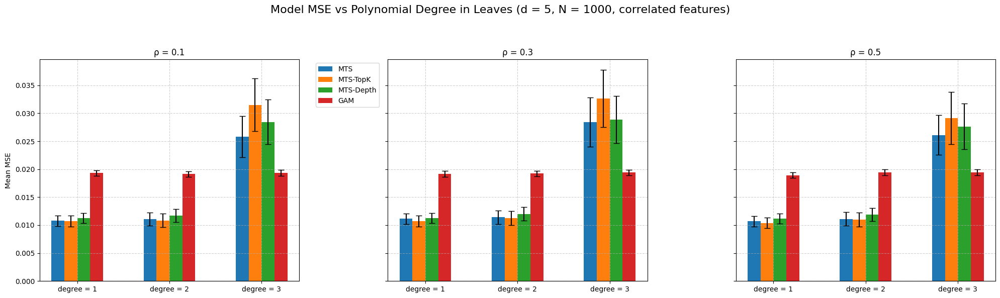

In [22]:
deg_values = [1, 2, 3]
deg_labels = [r'degree = 1', r'degree = 2', r'degree = 3']
x = np.arange(len(deg_labels))

rho_labels = [r'ρ = 0.1', r'ρ = 0.3', r'ρ = 0.5']

model_labels = [
    'MTS',
    'MTS-TopK',
    'MTS-Depth',
    'GAM'
]

n_models = len(model_labels)
width = 0.14  # slightly smaller since we now have 5 models

all_mse_vars = [
    # TreeSpline
    [
        [tree_mse_corr1hist10005, tree_mse_corr1hist100052, tree_mse_corr1hist100053],
        [tree_mse_corr3hist10005, tree_mse_corr3hist100052, tree_mse_corr3hist100053],
        [tree_mse_corr5hist10005, tree_mse_corr5hist100052, tree_mse_corr5hist100053],
    ],
    # TreeSpline3
    [
        [tree3_mse_corr1hist10005, tree3_mse_corr1hist100052, tree3_mse_corr1hist100053],
        [tree3_mse_corr3hist10005, tree3_mse_corr3hist100052, tree3_mse_corr3hist100053],
        [tree3_mse_corr5hist10005, tree3_mse_corr5hist100052, tree3_mse_corr5hist100053],
    ],
    # TreeSpline4
    [
        [tree4_mse_corr1hist10005, tree4_mse_corr1hist100052, tree4_mse_corr1hist100053],
        [tree4_mse_corr3hist10005, tree4_mse_corr3hist100052, tree4_mse_corr3hist100053],
        [tree4_mse_corr5hist10005, tree4_mse_corr5hist100052, tree4_mse_corr5hist100053],
    ],
    # GAM
    [
        [gam_mse_corr1hist10005,  gam_mse_corr1hist100052,  gam_mse_corr1hist100053],
        [gam_mse_corr3hist10005,  gam_mse_corr3hist100052,  gam_mse_corr3hist100053],
        [gam_mse_corr5hist10005,  gam_mse_corr5hist100052,  gam_mse_corr5hist100053],
    ]
]

# ----------------------------------------
# Plotting
# ----------------------------------------
fig, axs = plt.subplots(1, 3, figsize=(20, 6), sharey=True)

# centered offsets (robust when #models changes)
offsets = (np.arange(n_models) - (n_models - 1) / 2.0) * width

for rho_idx, rho_label in enumerate(rho_labels):
    ax = axs[rho_idx]
    for m_idx, model_name in enumerate(model_labels):
        # list of 3 arrays: [deg=1, deg=2, deg=3] for this (model, rho)
        mse_lists = all_mse_vars[m_idx][rho_idx]

        # stack into shape (n_deg, n_replications)
        data = np.array([np.ravel(a) for a in mse_lists])
        means, cis = mean_ci(data)

        ax.bar(
            x + offsets[m_idx],
            means,
            width,
            yerr=cis,
            capsize=4,
            label=model_name if rho_idx == 0 else ""
        )

    ax.set_xticks(x)
    ax.set_xticklabels(deg_labels)
    ax.set_title(rho_label)
    ax.grid(True, linestyle='--', alpha=0.6)
    if rho_idx == 0:
        ax.set_ylabel('Mean MSE')

# Legend only once
axs[0].legend(ncol=1, fontsize=10, bbox_to_anchor=(1.05, 1.0))

fig.suptitle('Model MSE vs Polynomial Degree in Leaves (d = 5, N = 1000, correlated features)', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()

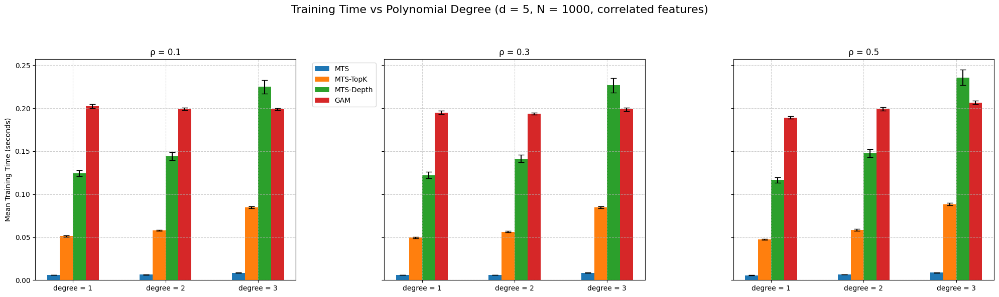

In [23]:
def mean_ci_deg(data, confidence=0.95):
    data = np.atleast_2d(data)
    if data.shape[0] != len(deg_labels):
        data = data.T  # ensure rows = degrees
    mean = np.mean(data, axis=1)
    se = stats.sem(data, axis=1)
    h = se * stats.t.ppf((1 + confidence) / 2.0, data.shape[1] - 1)
    return mean, h

deg_labels = [r'degree = 1', r'degree = 2', r'degree = 3']
x = np.arange(len(deg_labels))

rho_labels = [r'ρ = 0.1', r'ρ = 0.3', r'ρ = 0.5']

model_labels = [
    'MTS',
    'MTS-TopK',
    'MTS-Depth',
    'GAM'
]

n_models = len(model_labels)
width = 0.14  # slightly smaller since we now have 5 models

all_time_vars = [
    # TreeSpline
    [
        [tree_time_corr1hist10005, tree_time_corr1hist100052, tree_time_corr1hist100053],
        [tree_time_corr3hist10005, tree_time_corr3hist100052, tree_time_corr3hist100053],
        [tree_time_corr5hist10005, tree_time_corr5hist100052, tree_time_corr5hist100053],
    ],
    # TreeSpline3
    [
        [tree3_time_corr1hist10005, tree3_time_corr1hist100052, tree3_time_corr1hist100053],
        [tree3_time_corr3hist10005, tree3_time_corr3hist100052, tree3_time_corr3hist100053],
        [tree3_time_corr5hist10005, tree3_time_corr5hist100052, tree3_time_corr5hist100053],
    ],
    # TreeSpline4
    [
        [tree4_time_corr1hist10005, tree4_time_corr1hist100052, tree4_time_corr1hist100053],
        [tree4_time_corr3hist10005, tree4_time_corr3hist100052, tree4_time_corr3hist100053],
        [tree4_time_corr5hist10005, tree4_time_corr5hist100052, tree4_time_corr5hist100053],
    ],
    # GAM
    [
        [gam_time_corr1hist10005,  gam_time_corr1hist100052,  gam_time_corr1hist100053],
        [gam_time_corr3hist10005,  gam_time_corr3hist100052,  gam_time_corr3hist100053],
        [gam_time_corr5hist10005,  gam_time_corr5hist100052,  gam_time_corr5hist100053],
    ]
]

# -------------------------------
# Plotting: training time
# -------------------------------
fig, axs = plt.subplots(1, 3, figsize=(20, 6), sharey=True)

# centered offsets (robust when #models changes)
offsets = (np.arange(n_models) - (n_models - 1) / 2.0) * width

for rho_idx, rho_label in enumerate(rho_labels):
    ax = axs[rho_idx]
    for m_idx, model_name in enumerate(model_labels):
        time_lists = all_time_vars[m_idx][rho_idx]  # [deg=1,2,3] arrays

        data = np.array([np.ravel(a) for a in time_lists])  # (n_deg, n_rep)
        means, cis = mean_ci_deg(data)

        ax.bar(
            x + offsets[m_idx],
            means,
            width,
            yerr=cis,
            capsize=4,
            label=model_name if rho_idx == 0 else ""
        )

    ax.set_xticks(x)
    ax.set_xticklabels(deg_labels)
    ax.set_title(rho_label)
    ax.grid(True, linestyle='--', alpha=0.6)
    if rho_idx == 0:
        ax.set_ylabel('Mean Training Time (seconds)')

axs[0].legend(ncol=1, fontsize=10, bbox_to_anchor=(1.05, 1.0))

fig.suptitle('Training Time vs Polynomial Degree (d = 5, N = 1000, correlated features)', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()

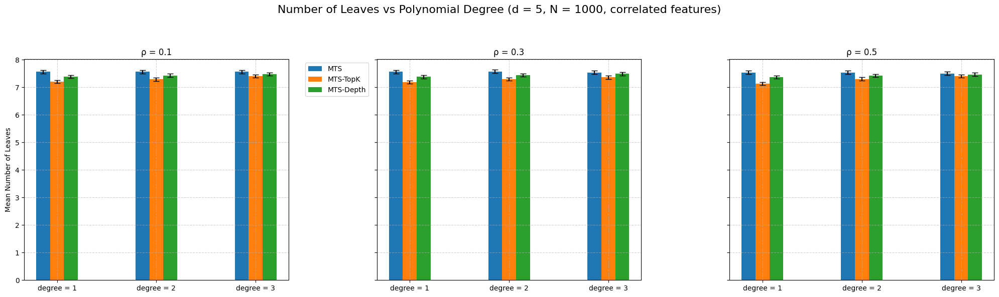

In [36]:
deg_labels = [r'degree = 1', r'degree = 2', r'degree = 3']
x = np.arange(len(deg_labels))

rho_labels = [r'ρ = 0.1', r'ρ = 0.3', r'ρ = 0.5']

labels = [
    'MTS',
    'MTS-TopK',
    'MTS-Depth'
]

n_models = len(labels)
width = 0.14  # slightly smaller since we now have 4 models

all_leaf_vars = [
    # TreeSpline
    [
        [leaf_corr1hist10005,  leaf_corr1hist100052,  leaf_corr1hist100053],
        [leaf_corr3hist10005,  leaf_corr3hist100052,  leaf_corr3hist100053],
        [leaf_corr5hist10005,  leaf_corr5hist100052,  leaf_corr5hist100053],
    ],
    # TreeSpline3
    [
        [leaf3_corr1hist10005, leaf3_corr1hist100052, leaf3_corr1hist100053],
        [leaf3_corr3hist10005, leaf3_corr3hist100052, leaf3_corr3hist100053],
        [leaf3_corr5hist10005, leaf3_corr5hist100052, leaf3_corr5hist100053],
    ],
    # TreeSpline4
    [
        [leaf4_corr1hist10005, leaf4_corr1hist100052, leaf4_corr1hist100053],
        [leaf4_corr3hist10005, leaf4_corr3hist100052, leaf4_corr3hist100053],
        [leaf4_corr5hist10005, leaf4_corr5hist100052, leaf4_corr5hist100053],
    ]
]

# -------------------------------
# Plotting: number of leaves
# -------------------------------
fig, axs = plt.subplots(1, 3, figsize=(20, 6), sharey=True)

# centered offsets (robust when #models changes)
offsets = (np.arange(n_models) - (n_models - 1) / 2.0) * width

for rho_idx, rho_label in enumerate(rho_labels):
    ax = axs[rho_idx]
    for m_idx, model_name in enumerate(labels):
        leaf_lists = all_leaf_vars[m_idx][rho_idx]  # [deg=1,2,3] arrays

        data = np.array([np.ravel(a) for a in leaf_lists])  # (n_deg, n_rep)
        means, cis = mean_ci_deg(data)

        ax.bar(
            x + offsets[m_idx],
            means,
            width,
            yerr=cis,
            capsize=4,
            label=model_name if rho_idx == 0 else ""
        )

    ax.set_xticks(x)
    ax.set_xticklabels(deg_labels)
    ax.set_title(rho_label)
    ax.grid(True, linestyle='--', alpha=0.6)
    if rho_idx == 0:
        ax.set_ylabel('Mean Number of Leaves')

axs[0].legend(ncol=1, fontsize=10, bbox_to_anchor=(1.05, 1.0))

fig.suptitle('Number of Leaves vs Polynomial Degree (d = 5, N = 1000, correlated features)', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()

# Comparison on real-world data

## Description of Datasets

For the final comparison, the models are compared using two conventional datasets used for regression: California Housing Prices and Diabetes. Both datasets are available in Sci-kit Learn.

In [41]:
datasets = {
    "California Housing": fetch_california_housing(),
    "Diabetes": load_diabetes()
}

In [67]:
for name, ds in datasets.items():
   print(f"\n==============================")
   print(f"{name}")
   print(f"==============================")
   print("X shape:", ds.data.shape)
   print("y shape:", ds.target.shape)
   print("feature_names:", getattr(ds, "feature_names", None))
   print("has DESCR:", "DESCR" in ds)


California Housing
X shape: (20640, 8)
y shape: (20640,)
feature_names: ['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'Latitude', 'Longitude']
has DESCR: True

Diabetes
X shape: (442, 10)
y shape: (442,)
feature_names: ['age', 'sex', 'bmi', 'bp', 's1', 's2', 's3', 's4', 's5', 's6']
has DESCR: True


## Evaluating and Comparing the Models

In [40]:
def evaluate_model(model, X_train, y_train, X_test, y_test):
    start = time.time()
    model.fit(X_train, y_train)
    train_time = time.time() - start

    mse = model.score(X_test, y_test)

    leaf_count = model.get_leaf_count() if hasattr(model, "get_leaf_count") else None
    return mse, train_time, leaf_count

In [56]:
results = []

for name, data in datasets.items():
    print(f"\n==============================")
    print(f" Dataset: {name}")
    print(f"==============================")

    X = data.data
    y = data.target

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)

    scaler = MinMaxScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    models = {
        "MTS": TreeSpline(),
        "MTS-TopK": TreeSpline3(),
        "MTS-Depth": TreeSpline4(),
        "LinearGAM": LinearGAM(spline_order=1),
        "GLMTree": GLMTree(max_depth=15)
    }

    for model_name, model in models.items():
        start = time.time()
        model.fit(X_train_scaled, y_train)
        train_time = time.time() - start

        y_pred = model.predict(X_test_scaled)
        mse = mean_squared_error(y_test, y_pred)

        leaf_count = model.get_leaf_count() if hasattr(model, "get_leaf_count") else None

        results.append([name, model_name, mse, train_time, leaf_count])
        print(f"{model_name:12s} | MSE = {mse:.4f} | Time = {train_time:.3f}s | Leaves = {leaf_count}")

df_results = pd.DataFrame(results, columns=[
    "Dataset", "Model", "MSE", "Train Time", "Leaf Count"
])

print("\n\n===== FINAL RESULTS TABLE =====\n")
print(df_results)


 Dataset: California Housing
MTS          | MSE = 1.9471 | Time = 0.045s | Leaves = 8
MTS-TopK     | MSE = 0.3783 | Time = 0.203s | Leaves = 8
MTS-Depth    | MSE = 0.3848 | Time = 0.585s | Leaves = 8
LinearGAM    | MSE = 0.4106 | Time = 0.307s | Leaves = None


/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_16232/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


GLMTree      | MSE = 0.3745 | Time = 12.616s | Leaves = 231

 Dataset: Diabetes
MTS          | MSE = 3887.7224 | Time = 0.006s | Leaves = 8
MTS-TopK     | MSE = 3927.9031 | Time = 0.052s | Leaves = 7
MTS-Depth    | MSE = 3928.6457 | Time = 0.227s | Leaves = 8
LinearGAM    | MSE = 4124.0002 | Time = 0.036s | Leaves = None
GLMTree      | MSE = 3269.1070 | Time = 0.043s | Leaves = 2


===== FINAL RESULTS TABLE =====

              Dataset      Model          MSE  Train Time  Leaf Count
0  California Housing        MTS     1.947126    0.045149         8.0
1  California Housing   MTS-TopK     0.378311    0.203405         8.0
2  California Housing  MTS-Depth     0.384782    0.584757         8.0
3  California Housing  LinearGAM     0.410610    0.306860         NaN
4  California Housing    GLMTree     0.374503   12.615650       231.0
5            Diabetes        MTS  3887.722358    0.005578         8.0
6            Diabetes   MTS-TopK  3927.903059    0.052060         7.0
7            Diabetes 

/var/folders/zs/pztb2_sx1bs199ds8qfd_dmh0000gn/T/ipykernel_16232/3931903623.py:66: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  stat = float(n * (c.reshape(1, -1) @ inv @ c.reshape(-1, 1)))


In [60]:
df_results.to_csv("./nparrs/realworld_data_results.csv", index=False)

In [61]:
df_results_loaded = pd.read_csv("./nparrs/realworld_data_results.csv")

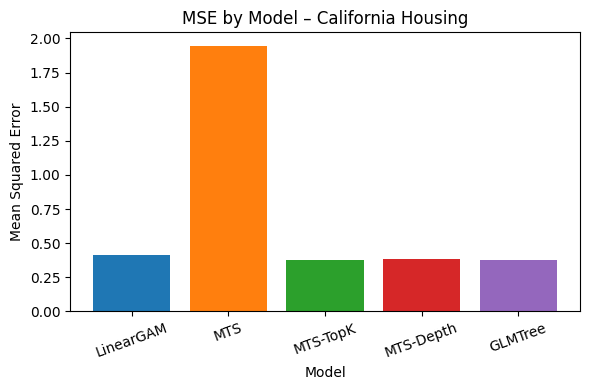

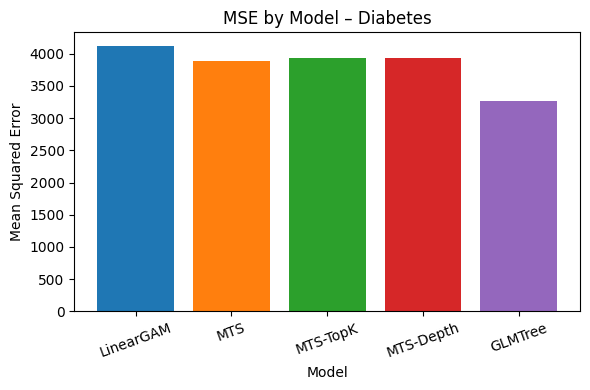

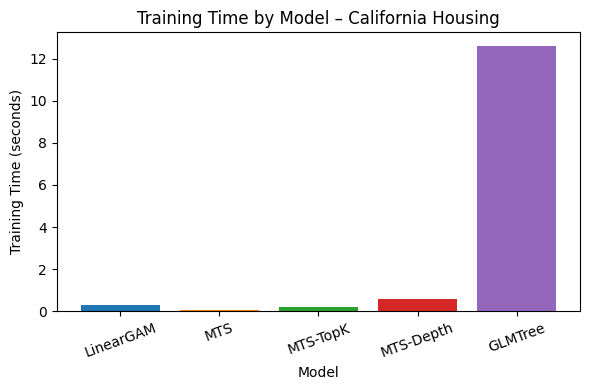

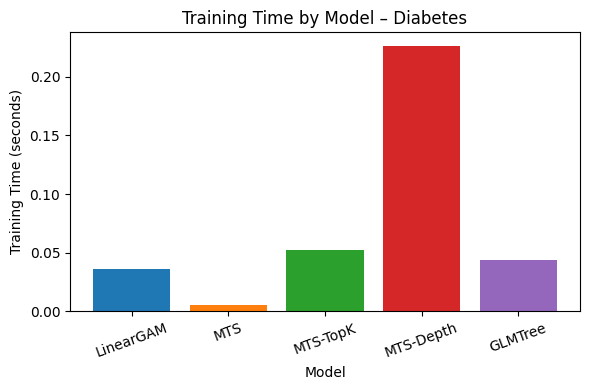

In [62]:
model_order = ["LinearGAM", "MTS", "MTS-TopK", "MTS-Depth", "GLMTree"]

model_colors = {
    "LinearGAM":   "#1f77b4",
    "MTS":  "#ff7f0e",
    "MTS-TopK": "#2ca02c",
    "MTS-Depth": "#d62728",
    "GLMTree":     "#9467bd",
}

# Sort for consistent plotting
df_results["Model"] = pd.Categorical(df_results["Model"], categories=model_order, ordered=True)
df_results = df_results.sort_values(["Dataset", "Model"])

# --- MSE plots ---
for dataset in df_results["Dataset"].unique():
    df_d = df_results[df_results["Dataset"] == dataset]

    colors = [model_colors[m] for m in df_d["Model"].astype(str)]

    plt.figure(figsize=(6, 4))
    plt.bar(df_d["Model"].astype(str), df_d["MSE"], color=colors)
    plt.title(f"MSE by Model – {dataset}")
    plt.ylabel("Mean Squared Error")
    plt.xlabel("Model")
    plt.xticks(rotation=20)
    plt.tight_layout()
    plt.show()

# --- Train time plots ---
for dataset in df_results["Dataset"].unique():
    df_d = df_results[df_results["Dataset"] == dataset]

    colors = [model_colors[m] for m in df_d["Model"].astype(str)]

    plt.figure(figsize=(6, 4))
    plt.bar(df_d["Model"].astype(str), df_d["Train Time"], color=colors)
    plt.title(f"Training Time by Model – {dataset}")
    plt.ylabel("Training Time (seconds)")
    plt.xlabel("Model")
    plt.xticks(rotation=20)
    plt.tight_layout()
    plt.show()